## Define the Convolutional Neural Network

After you've looked at the data you're working with and, in this case, know the shapes of the images and of the keypoints, you are ready to define a convolutional neural network that can *learn* from this data.

In this notebook and in `models.py`, you will:
1. Define a CNN with images as input and keypoints as output
2. Construct the transformed FaceKeypointsDataset, just as before
3. Train the CNN on the training data, tracking loss
4. See how the trained model performs on test data
5. If necessary, modify the CNN structure and model hyperparameters, so that it performs *well* **\***

**\*** What does *well* mean?

"Well" means that the model's loss decreases during training **and**, when applied to test image data, the model produces keypoints that closely match the true keypoints of each face. And you'll see examples of this later in the notebook.

---


## CNN Architecture

Recall that CNN's are defined by a few types of layers:
* Convolutional layers
* Maxpooling layers
* Fully-connected layers

You are required to use the above layers and encouraged to add multiple convolutional layers and things like dropout layers that may prevent overfitting. You are also encouraged to look at literature on keypoint detection, such as [this paper](https://arxiv.org/pdf/1710.00977.pdf), to help you determine the structure of your network.


### TODO: Define your model in the provided file `models.py` file

This file is mostly empty but contains the expected name and some TODO's for creating your model.

---

## PyTorch Neural Nets

To define a neural network in PyTorch, you define the layers of a model in the function `__init__` and define the feedforward behavior of a network that employs those initialized layers in the function `forward`, which takes in an input image tensor, `x`. The structure of this Net class is shown below and left for you to fill in.

Note: During training, PyTorch will be able to perform backpropagation by keeping track of the network's feedforward behavior and using autograd to calculate the update to the weights in the network.

#### Define the Layers in ` __init__`
As a reminder, a conv/pool layer may be defined like this (in `__init__`):
```
# 1 input image channel (for grayscale images), 32 output channels/feature maps, 3x3 square convolution kernel
self.conv1 = nn.Conv2d(1, 32, 3)

# maxpool that uses a square window of kernel_size=2, stride=2
self.pool = nn.MaxPool2d(2, 2)      
```

#### Refer to Layers in `forward`
Then referred to in the `forward` function like this, in which the conv1 layer has a ReLu activation applied to it before maxpooling is applied:
```
x = self.pool(F.relu(self.conv1(x)))
```

Best practice is to place any layers whose weights will change during the training process in `__init__` and refer to them in the `forward` function; any layers or functions that always behave in the same way, such as a pre-defined activation function, should appear *only* in the `forward` function.

#### Why models.py

You are tasked with defining the network in the `models.py` file so that any models you define can be saved and loaded by name in different notebooks in this project directory. For example, by defining a CNN class called `Net` in `models.py`, you can then create that same architecture in this and other notebooks by simply importing the class and instantiating a model:
```
    from models import Net
    net = Net()
```

In [1]:
# load the data if you need to; if you have already loaded the data, you may comment this cell out
# -- DO NOT CHANGE THIS CELL -- #
!mkdir /data
!wget -P /data/ https://s3.amazonaws.com/video.udacity-data.com/topher/2018/May/5aea1b91_train-test-data/train-test-data.zip
!unzip -n /data/train-test-data.zip -d /data

mkdir: cannot create directory ‘/data’: File exists
--2023-01-19 10:33:00--  https://s3.amazonaws.com/video.udacity-data.com/topher/2018/May/5aea1b91_train-test-data/train-test-data.zip
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.216.130.5, 52.217.84.238, 52.216.38.96, ...
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.216.130.5|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 338613624 (323M) [application/zip]
Saving to: ‘/data/train-test-data.zip.4’

train-test-data.zip 100%[===================>] 322.93M  8.92MB/s    in 62s     

2023-01-19 10:34:03 (5.20 MB/s) - ‘/data/train-test-data.zip.4’ saved [338613624/338613624]

Archive:  /data/train-test-data.zip


!git clone https://github.com/utkuozbulak/pytorch-cnn-visualizations.git

<div class="alert alert-info">**Note:** Workspaces automatically close connections after 30 minutes of inactivity (including inactivity while training!). Use the code snippet below to keep your workspace alive during training. (The active_session context manager is imported below.)
</div>
```
from workspace_utils import active_session

with active_session():
    train_model(num_epochs)
```


In [1]:
# import the usual resources
import matplotlib.pyplot as plt
import numpy as np

# import utilities to keep workspaces alive during model training
from workspace_utils import active_session

# watch for any changes in model.py, if it changes, re-load it automatically
%load_ext autoreload
%autoreload 2



In [2]:
## TODO: Define the Net in models.py

import torch
import torch.nn as nn
import torch.nn.functional as F

## TODO: Once you've define the network, you can instantiate it
# one example conv layer has been provided for you
from models import Net

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using:",device)
net = Net().to(device=device)
print(net)



Using: cuda


/opt/conda/lib/python3.6/site-packages/torch/cuda/__init__.py:125: UserWarning: 
NVIDIA RTX A2000 Laptop GPU with CUDA capability sm_86 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_52 sm_60 sm_61 sm_70 sm_75 sm_80 compute_80.
If you want to use the NVIDIA RTX A2000 Laptop GPU GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(incompatible_device_warn.format(device_name, capability, " ".join(arch_list), device_name))


Net(
  (features): Sequential(
    (0): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): ELU(alpha=1.0)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Dropout2d(p=0.1, inplace=False)
    (4): Conv2d(32, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (5): ELU(alpha=1.0)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=1, dilation=1, ceil_mode=False)
    (7): Dropout2d(p=0.2, inplace=False)
    (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
    (9): ELU(alpha=1.0)
    (10): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (11): Dropout2d(p=0.3, inplace=False)
    (12): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
    (13): ELU(alpha=1.0)
    (14): MaxPool2d(kernel_size=2, stride=2, padding=1, dilation=1, ceil_mode=False)
    (15): Dropout2d(p=0.4, inplace=False)
    (16): Conv2d(64, 128, kernel_size=(2, 2), stride=(1, 1), padding

## Transform the dataset 

To prepare for training, create a transformed dataset of images and keypoints.

### TODO: Define a data transform

In PyTorch, a convolutional neural network expects a torch image of a consistent size as input. For efficient training, and so your model's loss does not blow up during training, it is also suggested that you normalize the input images and keypoints. The necessary transforms have been defined in `data_load.py` and you **do not** need to modify these; take a look at this file (you'll see the same transforms that were defined and applied in Notebook 1).

To define the data transform below, use a [composition](http://pytorch.org/tutorials/beginner/data_loading_tutorial.html#compose-transforms) of:
1. Rescaling and/or cropping the data, such that you are left with a square image (the suggested size is 224x224px)
2. Normalizing the images and keypoints; turning each RGB image into a grayscale image with a color range of [0, 1] and transforming the given keypoints into a range of [-1, 1]
3. Turning these images and keypoints into Tensors

These transformations have been defined in `data_load.py`, but it's up to you to call them and create a `data_transform` below. **This transform will be applied to the training data and, later, the test data**. It will change how you go about displaying these images and keypoints, but these steps are essential for efficient training.

As a note, should you want to perform data augmentation (which is optional in this project), and randomly rotate or shift these images, a square image size will be useful; rotating a 224x224 image by 90 degrees will result in the same shape of output.

In [3]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

# the dataset we created in Notebook 1 is copied in the helper file `data_load.py`
from data_load import FacialKeypointsDataset
# the transforms we defined in Notebook 1 are in the helper file `data_load.py`
from data_load import Rescale, RandomCrop, Normalize, ToTensor


## TODO: define the data_transform using transforms.Compose([all tx's, . , .])
# order matters! i.e. rescaling should come before a smaller crop
data_transform = transforms.Compose([Rescale(250),
                               RandomCrop(224), Normalize(224), ToTensor()])

# testing that you've defined a transform
assert(data_transform is not None), 'Define a data_transform'

In [4]:
# create the transformed dataset
transformed_dataset = FacialKeypointsDataset(csv_file='/data/training_frames_keypoints.csv',
                                             root_dir='/data/training/',
                                             transform=data_transform)


print('Number of images: ', len(transformed_dataset))

# iterate through the transformed dataset and print some stats about the first few samples
for i in range(4):
    sample = transformed_dataset[i]
    print(i, sample['image'].size(), sample['keypoints'].size())

Number of images:  3462
0 torch.Size([1, 224, 224]) torch.Size([68, 2])
1 torch.Size([1, 224, 224]) torch.Size([68, 2])
2 torch.Size([1, 224, 224]) torch.Size([68, 2])
3 torch.Size([1, 224, 224]) torch.Size([68, 2])


In [5]:
print( sample['image'] * 255)

tensor([[[158.2471, 163.6609, 166.9260,  ..., 104.1326,  99.2886, 100.4087],
         [156.3910, 164.0604, 170.0788,  ..., 125.8745, 106.2726, 105.6225],
         [153.8813, 164.9969, 173.8616,  ..., 133.7336, 110.5370, 107.3615],
         ...,
         [ 88.8291,  97.0946, 101.6993,  ...,  38.3504,  51.1117,  62.5821],
         [ 79.4363,  87.6053,  93.6295,  ...,  26.5855,  38.0573,  52.8628],
         [ 76.2170,  80.3174,  83.3975,  ...,  25.1542,  36.2845,  50.1657]]])


## Batching and loading data

Next, having defined the transformed dataset, we can use PyTorch's DataLoader class to load the training data in batches of whatever size as well as to shuffle the data for training the model. You can read more about the parameters of the DataLoader, in [this documentation](http://pytorch.org/docs/master/data.html).

#### Batch size
Decide on a good batch size for training your model. Try both small and large batch sizes and note how the loss decreases as the model trains. Too large a batch size may cause your model to crash and/or run out of memory while training.

**Note for Windows users**: Please change the `num_workers` to 0 or you may face some issues with your DataLoader failing.

In [6]:
# load training data in batches
batch_size = 10

train_loader = DataLoader(transformed_dataset, 
                          batch_size=batch_size,
                          shuffle=True, 
                          num_workers=4)


## Before training

Take a look at how this model performs before it trains. You should see that the keypoints it predicts start off in one spot and don't match the keypoints on a face at all! It's interesting to visualize this behavior so that you can compare it to the model after training and see how the model has improved.

#### Load in the test dataset

The test dataset is one that this model has *not* seen before, meaning it has not trained with these images. We'll load in this test data and before and after training, see how your model performs on this set!

To visualize this test data, we have to go through some un-transformation steps to turn our images into python images from tensors and to turn our keypoints back into a recognizable range. 

In [7]:
# load in the test data, using the dataset class
# AND apply the data_transform you defined above
# create the test dataset
test_dataset = FacialKeypointsDataset(csv_file='/data/test_frames_keypoints.csv',
                                             root_dir='/data/test/',
                                             transform=data_transform)

# load test data in batches
batch_size = 10

test_loader = DataLoader(test_dataset, 
                          batch_size=batch_size,
                          shuffle=True, 
                          num_workers=4)

## Apply the model on a test sample

To test the model on a test sample of data, you have to follow these steps:
1. Extract the image and ground truth keypoints from a sample
2. Wrap the image in a Variable, so that the net can process it as input and track how it changes as the image moves through the network.
3. Make sure the image is a FloatTensor, which the model expects.
4. Forward pass the image through the net to get the predicted, output keypoints.

This function test how the network performs on the first batch of test data. It returns the images, the transformed images, the predicted keypoints (produced by the model), and the ground truth keypoints.

In [8]:
# test the model on a batch of test images

def net_sample_output():
    
    # iterate through the test dataset
    for i, sample in enumerate(test_loader):
        
        # get sample data: images and ground truth keypoints
        images = sample['image']
        key_pts = sample['keypoints']

        # convert images to FloatTensors
        images = images.type(torch.FloatTensor)

        # forward pass to get net output
        output_pts = net(images.to(device))
        
        # reshape to batch_size x 68 x 2 pts
        output_pts = output_pts.view(output_pts.size()[0], 68, -1)
        
        # break after first image is tested
        if i == 0:
            return images, output_pts, key_pts
            

#### Debugging tips

If you get a size or dimension error here, make sure that your network outputs the expected number of keypoints! Or if you get a Tensor type error, look into changing the above code that casts the data into float types: `images = images.type(torch.FloatTensor)`.

In [9]:
# call the above function
# returns: test images, test predicted keypoints, test ground truth keypoints
test_images, test_outputs, gt_pts = net_sample_output()

# print out the dimensions of the data to see if they make sense
print(test_images.data.size())
print(test_outputs.data.size())
print(gt_pts.size())

torch.Size([10, 1, 224, 224])
torch.Size([10, 68, 2])
torch.Size([10, 68, 2])


## Visualize the predicted keypoints

Once we've had the model produce some predicted output keypoints, we can visualize these points in a way that's similar to how we've displayed this data before, only this time, we have to "un-transform" the image/keypoint data to display it.

Note that I've defined a *new* function, `show_all_keypoints` that displays a grayscale image, its predicted keypoints and its ground truth keypoints (if provided).

In [10]:
def show_all_keypoints(image, predicted_key_pts, gt_pts=None):
    """Show image with predicted keypoints"""
    # image is grayscale
    plt.imshow(image, cmap='gray')
    plt.scatter(predicted_key_pts[:, 0], predicted_key_pts[:, 1], s=20, marker='.', c='m')
    # plot ground truth points as green pts
    if gt_pts is not None:
        plt.scatter(gt_pts[:, 0], gt_pts[:, 1], s=20, marker='.', c='g')


#### Un-transformation

Next, you'll see a helper function. `visualize_output` that takes in a batch of images, predicted keypoints, and ground truth keypoints and displays a set of those images and their true/predicted keypoints.

This function's main role is to take batches of image and keypoint data (the input and output of your CNN), and transform them into numpy images and un-normalized keypoints (x, y) for normal display. The un-transformation process turns keypoints and images into numpy arrays from Tensors *and* it undoes the keypoint normalization done in the Normalize() transform; it's assumed that you applied these transformations when you loaded your test data.

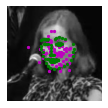

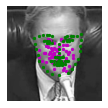

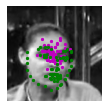

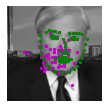

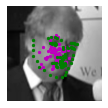

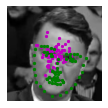

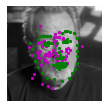

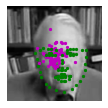

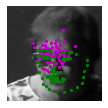

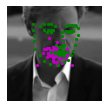

In [11]:
# visualize the output
# by default this shows a batch of 10 images
def visualize_output(test_images, test_outputs, gt_pts=None, batch_size=10):

    for i in range(batch_size):
        plt.figure(figsize=(20,10))
        ax = plt.subplot(1, batch_size, i+1)

        # un-transform the image data
        image = test_images[i].data   # get the image from it's Variable wrapper
        image = image.numpy()   # convert to numpy array from a Tensor
        image = np.transpose(image, (1, 2, 0))   # transpose to go from torch to numpy image

        # un-transform the predicted key_pts data
        predicted_key_pts = test_outputs[i].data
        predicted_key_pts = predicted_key_pts.cpu().numpy()
        # undo normalization of keypoints  
        predicted_key_pts = predicted_key_pts*112+112
        #print(predicted_key_pts)
        
        # plot ground truth points for comparison, if they exist
        ground_truth_pts = None
        if gt_pts is not None:
            ground_truth_pts = gt_pts[i]    
            ground_truth_pts = ground_truth_pts*112+112
        #print(ground_truth_pts)
        
        # call show_all_keypoints
        show_all_keypoints(np.squeeze(image), predicted_key_pts, ground_truth_pts)
            
        plt.axis('off')

    plt.show()
    
# call it
visualize_output(test_images, test_outputs, gt_pts, batch_size)

## Training

#### Loss function
Training a network to predict keypoints is different than training a network to predict a class; instead of outputting a distribution of classes and using cross entropy loss, you may want to choose a loss function that is suited for regression, which directly compares a predicted value and target value. Read about the various kinds of loss functions (like MSE or L1/SmoothL1 loss) in [this documentation](http://pytorch.org/docs/master/_modules/torch/nn/modules/loss.html).

### TODO: Define the loss and optimization

Next, you'll define how the model will train by deciding on the loss function and optimizer.

---

In [36]:
## TODO: Define the loss and optimization
import torch.optim as optim

criterion = nn.MSELoss()
#criterion = nn.L1Loss()

optimizer = optim.Adam(net.parameters(), lr = 0.000001, betas=(0.85, 0.999), eps=1.0e-09)
#optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.3)


## Training and Initial Observation

Now, you'll train on your batched training data from `train_loader` for a number of epochs. 

To quickly observe how your model is training and decide on whether or not you should modify it's structure or hyperparameters, you're encouraged to start off with just one or two epochs at first. As you train, note how your the model's loss behaves over time: does it decrease quickly at first and then slow down? Does it take a while to decrease in the first place? What happens if you change the batch size of your training data or modify your loss function? etc. 

Use these initial observations to make changes to your model and decide on the best architecture before you train for many epochs and create a final model.

In [37]:
def train_net(n_epochs):

    # prepare the net for training
    net.train()
    
    for epoch in range(n_epochs):  # loop over the dataset multiple times
        lowest = None
        running_loss = 0.0

        # train on batches of data, assumes you already have train_loader
        for batch_i, data in enumerate(train_loader):
            # get the input images and their corresponding labels
            images = data['image']
            key_pts = data['keypoints']

            # flatten pts
            key_pts = key_pts.view(key_pts.size(0), -1)

            # convert variables to floats for regression loss
            key_pts = key_pts.type(torch.FloatTensor)
            images = images.type(torch.FloatTensor)

            # forward pass to get outputs
            output_pts = net(images.to(device))

            # calculate the loss between predicted and target keypoints
            loss = criterion(output_pts.cpu(), key_pts)

            # zero the parameter (weight) gradients
            optimizer.zero_grad()
            
            # backward pass to calculate the weight gradients
            loss.backward()

            # update the weights
            optimizer.step()

            # print loss statistics
            running_loss += loss.item()
            if batch_i % 10 == 9:    # print every 10 batches
                print('Epoch: {}, Batch: {}, Avg. Loss: {}'.format(epoch + 1, batch_i+1, running_loss/10))
                if lowest is None:
                    lowest = running_loss / 10
                elif running_loss / 10 < lowest:
                    lowest = running_loss / 10
                    print("The lowest loss:", lowest)
                running_loss = 0.0

    print('Finished Training')


In [14]:
torch.cuda.is_available()
torch.cuda.device_count()
torch.cuda.current_device()
torch.cuda.device(0)
torch.cuda.get_device_name(0)
# setting device on GPU if available, else CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
print()

#Additional Info when using cuda
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))
    print('Memory Usage:')
    print('Allocated:', round(torch.cuda.memory_allocated(0)/1024**3,1), 'GB')


Using device: cuda

NVIDIA RTX A2000 Laptop GPU
Memory Usage:
Allocated: 0.2 GB


In [16]:
## load the model
model_dir = 'saved_models/'
model_name = 'keypoints_model_1.pt'

if device.type == 'cpu':
    _location = 'cpu'
else:
    _location = 'cuda'

print("Using location:", _location)

net = Net().to(device=device)
state_dict = torch.load(model_dir + model_name, map_location=_location)
net.load_state_dict(state_dict)
net.eval()


Using location: cuda


Net(
  (features): Sequential(
    (0): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): ELU(alpha=1.0)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Dropout2d(p=0.1, inplace=False)
    (4): Conv2d(32, 32, kernel_size=(4, 4), stride=(1, 1), padding=(2, 2))
    (5): ELU(alpha=1.0)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=1, dilation=1, ceil_mode=False)
    (7): Dropout2d(p=0.2, inplace=False)
    (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
    (9): ELU(alpha=1.0)
    (10): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (11): Dropout2d(p=0.3, inplace=False)
    (12): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
    (13): ELU(alpha=1.0)
    (14): MaxPool2d(kernel_size=2, stride=2, padding=1, dilation=1, ceil_mode=False)
    (15): Dropout2d(p=0.4, inplace=False)
    (16): Conv2d(64, 128, kernel_size=(2, 2), stride=(1, 1), padding

In [16]:
# Autoscroll code is from:
# https://stackoverflow.com/questions/41539841/automatic-scroll-down-to-bottom-of-result-in-ipython-notebook

In [15]:
%%javascript

window.scroll_flag = true
window.scroll_exit = false
window.scroll_delay = 100

$(".output_scroll").each(function() {
    $(this)[0].scrollTop = $(this)[0].scrollHeight;
});

function callScrollToBottom() {
    setTimeout(scrollToBottom, window.scroll_delay);
}

function scrollToBottom() {
    if (window.scroll_exit) {
        return;
    }
    if (!window.scroll_flag) {
        callScrollToBottom();
        return;
    };
    
    $(".output_scroll").each(function() {
        if (!$(this).attr('scroll_checkbox')){
            window.scroll_flag = true;
            $(this).attr('scroll_checkbox',true);
            var div = document.createElement('div');
            var checkbox = document.createElement('input');
            checkbox.type = "checkbox";
            checkbox.onclick = function(){window.scroll_flag = checkbox.checked}
            checkbox.checked = "checked"
            div.append("Auto-Scroll-To-Bottom: ");
            div.append(checkbox);
            $(this).parent().before(div);
        }
        
        $(this)[0].scrollTop = $(this)[0].scrollHeight;
    });
    callScrollToBottom();
}
scrollToBottom();

<IPython.core.display.Javascript object>

In [38]:
# train your network
n_epochs = 2000 # start small, and increase when you've decided on your model structure and hyperparams

# this is a Workspaces-specific context manager to keep the connection
# alive while training your model, not part of pytorch
#with active_session():
train_net(n_epochs)

Epoch: 1, Batch: 10, Avg. Loss: 0.004935912159271538
Epoch: 1, Batch: 20, Avg. Loss: 0.0027540828916244207
The lowest loss: 0.0027540828916244207
Epoch: 1, Batch: 30, Avg. Loss: 0.002708243019878864
The lowest loss: 0.002708243019878864
Epoch: 1, Batch: 40, Avg. Loss: 0.007239652099087834
Epoch: 1, Batch: 50, Avg. Loss: 0.0036360762547701596
Epoch: 1, Batch: 60, Avg. Loss: 0.0029368488816544414
Epoch: 1, Batch: 70, Avg. Loss: 0.002681935322470963
The lowest loss: 0.002681935322470963
Epoch: 1, Batch: 80, Avg. Loss: 0.003206579783000052
Epoch: 1, Batch: 90, Avg. Loss: 0.0033329796278849244
Epoch: 1, Batch: 100, Avg. Loss: 0.004603172489441931
Epoch: 1, Batch: 110, Avg. Loss: 0.00285336934030056
Epoch: 1, Batch: 120, Avg. Loss: 0.0028804357163608072
Epoch: 1, Batch: 130, Avg. Loss: 0.003274919418618083
Epoch: 1, Batch: 140, Avg. Loss: 0.0025922016240656374
The lowest loss: 0.0025922016240656374
Epoch: 1, Batch: 150, Avg. Loss: 0.0028135088738054036
Epoch: 1, Batch: 160, Avg. Loss: 0.0025

Epoch: 5, Batch: 80, Avg. Loss: 0.003504455368965864
Epoch: 5, Batch: 90, Avg. Loss: 0.003056990588083863
Epoch: 5, Batch: 100, Avg. Loss: 0.0027494010515511035
Epoch: 5, Batch: 110, Avg. Loss: 0.002851076703518629
Epoch: 5, Batch: 120, Avg. Loss: 0.0030961767421104013
Epoch: 5, Batch: 130, Avg. Loss: 0.003022327402140945
Epoch: 5, Batch: 140, Avg. Loss: 0.0023943421547301114
The lowest loss: 0.0023943421547301114
Epoch: 5, Batch: 150, Avg. Loss: 0.006551608047448099
Epoch: 5, Batch: 160, Avg. Loss: 0.0037868230370804667
Epoch: 5, Batch: 170, Avg. Loss: 0.002607679204083979
Epoch: 5, Batch: 180, Avg. Loss: 0.002682000515051186
Epoch: 5, Batch: 190, Avg. Loss: 0.0033723369240760805
Epoch: 5, Batch: 200, Avg. Loss: 0.0027010536286979914
Epoch: 5, Batch: 210, Avg. Loss: 0.003289860032964498
Epoch: 5, Batch: 220, Avg. Loss: 0.0030626064050011336
Epoch: 5, Batch: 230, Avg. Loss: 0.0025717875687405467
Epoch: 5, Batch: 240, Avg. Loss: 0.0022582270670682193
The lowest loss: 0.00225822706706821

Epoch: 9, Batch: 180, Avg. Loss: 0.003158300486393273
Epoch: 9, Batch: 190, Avg. Loss: 0.0030578421778045596
Epoch: 9, Batch: 200, Avg. Loss: 0.0026265051332302392
Epoch: 9, Batch: 210, Avg. Loss: 0.0030012238305062054
Epoch: 9, Batch: 220, Avg. Loss: 0.0030354749411344527
Epoch: 9, Batch: 230, Avg. Loss: 0.0037229352397844194
Epoch: 9, Batch: 240, Avg. Loss: 0.0028711844002828
Epoch: 9, Batch: 250, Avg. Loss: 0.0029391098651103675
Epoch: 9, Batch: 260, Avg. Loss: 0.004551374190486968
Epoch: 9, Batch: 270, Avg. Loss: 0.003626561909914017
Epoch: 9, Batch: 280, Avg. Loss: 0.0027865180280059578
Epoch: 9, Batch: 290, Avg. Loss: 0.0030515115242451428
Epoch: 9, Batch: 300, Avg. Loss: 0.0026654376997612417
Epoch: 9, Batch: 310, Avg. Loss: 0.002810207207221538
Epoch: 9, Batch: 320, Avg. Loss: 0.002975631586741656
Epoch: 9, Batch: 330, Avg. Loss: 0.002644751931075007
Epoch: 9, Batch: 340, Avg. Loss: 0.0030713537940755486
Epoch: 10, Batch: 10, Avg. Loss: 0.002468542009592056
Epoch: 10, Batch: 20

Epoch: 13, Batch: 270, Avg. Loss: 0.0027897538035176694
Epoch: 13, Batch: 280, Avg. Loss: 0.002255406859330833
Epoch: 13, Batch: 290, Avg. Loss: 0.0037506697932258247
Epoch: 13, Batch: 300, Avg. Loss: 0.0028607520274817944
Epoch: 13, Batch: 310, Avg. Loss: 0.0029581260168924928
Epoch: 13, Batch: 320, Avg. Loss: 0.006605151062831283
Epoch: 13, Batch: 330, Avg. Loss: 0.0028445125790312886
Epoch: 13, Batch: 340, Avg. Loss: 0.002928620530292392
Epoch: 14, Batch: 10, Avg. Loss: 0.003631892800331116
Epoch: 14, Batch: 20, Avg. Loss: 0.0029762177262455227
The lowest loss: 0.0029762177262455227
Epoch: 14, Batch: 30, Avg. Loss: 0.0027096478268504144
The lowest loss: 0.0027096478268504144
Epoch: 14, Batch: 40, Avg. Loss: 0.0026326185557991265
The lowest loss: 0.0026326185557991265
Epoch: 14, Batch: 50, Avg. Loss: 0.0025567337055690587
The lowest loss: 0.0025567337055690587
Epoch: 14, Batch: 60, Avg. Loss: 0.003082169685512781
Epoch: 14, Batch: 70, Avg. Loss: 0.0028003737097606063
Epoch: 14, Batch

Epoch: 17, Batch: 260, Avg. Loss: 0.002628954011015594
Epoch: 17, Batch: 270, Avg. Loss: 0.0030729603487998245
Epoch: 17, Batch: 280, Avg. Loss: 0.0027294388390146198
Epoch: 17, Batch: 290, Avg. Loss: 0.0028976361849345268
Epoch: 17, Batch: 300, Avg. Loss: 0.003391758888028562
Epoch: 17, Batch: 310, Avg. Loss: 0.002577973820734769
Epoch: 17, Batch: 320, Avg. Loss: 0.002623938280157745
Epoch: 17, Batch: 330, Avg. Loss: 0.002723228302784264
Epoch: 17, Batch: 340, Avg. Loss: 0.0028321399702690543
Epoch: 18, Batch: 10, Avg. Loss: 0.004353608086239547
Epoch: 18, Batch: 20, Avg. Loss: 0.0032215108396485446
The lowest loss: 0.0032215108396485446
Epoch: 18, Batch: 30, Avg. Loss: 0.0028823027038015424
The lowest loss: 0.0028823027038015424
Epoch: 18, Batch: 40, Avg. Loss: 0.00298037005122751
Epoch: 18, Batch: 50, Avg. Loss: 0.007851506839506328
Epoch: 18, Batch: 60, Avg. Loss: 0.00307271369965747
Epoch: 18, Batch: 70, Avg. Loss: 0.003082794358488172
Epoch: 18, Batch: 80, Avg. Loss: 0.0034888057

Epoch: 21, Batch: 260, Avg. Loss: 0.0031033841660246253
Epoch: 21, Batch: 270, Avg. Loss: 0.005698327976278961
Epoch: 21, Batch: 280, Avg. Loss: 0.002240953908767551
The lowest loss: 0.002240953908767551
Epoch: 21, Batch: 290, Avg. Loss: 0.0030856126453727485
Epoch: 21, Batch: 300, Avg. Loss: 0.002604950312525034
Epoch: 21, Batch: 310, Avg. Loss: 0.0025672457879409192
Epoch: 21, Batch: 320, Avg. Loss: 0.002313955419231206
Epoch: 21, Batch: 330, Avg. Loss: 0.0023034944548271596
Epoch: 21, Batch: 340, Avg. Loss: 0.0032943846890702844
Epoch: 22, Batch: 10, Avg. Loss: 0.0029727648943662643
Epoch: 22, Batch: 20, Avg. Loss: 0.002828365517780185
The lowest loss: 0.002828365517780185
Epoch: 22, Batch: 30, Avg. Loss: 0.0029084869427606465
Epoch: 22, Batch: 40, Avg. Loss: 0.0028224373352713885
The lowest loss: 0.0028224373352713885
Epoch: 22, Batch: 50, Avg. Loss: 0.0027799644274637105
The lowest loss: 0.0027799644274637105
Epoch: 22, Batch: 60, Avg. Loss: 0.0021871011587791143
The lowest loss: 

Epoch: 25, Batch: 280, Avg. Loss: 0.002785548416431993
Epoch: 25, Batch: 290, Avg. Loss: 0.002631640585605055
Epoch: 25, Batch: 300, Avg. Loss: 0.002373464673291892
The lowest loss: 0.002373464673291892
Epoch: 25, Batch: 310, Avg. Loss: 0.0027011372847482564
Epoch: 25, Batch: 320, Avg. Loss: 0.003113854245748371
Epoch: 25, Batch: 330, Avg. Loss: 0.003223292902112007
Epoch: 25, Batch: 340, Avg. Loss: 0.003085159894544631
Epoch: 26, Batch: 10, Avg. Loss: 0.0028320486191660164
Epoch: 26, Batch: 20, Avg. Loss: 0.014453784411307425
Epoch: 26, Batch: 30, Avg. Loss: 0.002806679834611714
The lowest loss: 0.002806679834611714
Epoch: 26, Batch: 40, Avg. Loss: 0.002689121081493795
The lowest loss: 0.002689121081493795
Epoch: 26, Batch: 50, Avg. Loss: 0.0028530266950838267
Epoch: 26, Batch: 60, Avg. Loss: 0.00318020450649783
Epoch: 26, Batch: 70, Avg. Loss: 0.002598346024751663
The lowest loss: 0.002598346024751663
Epoch: 26, Batch: 80, Avg. Loss: 0.002590902033261955
The lowest loss: 0.0025909020

Epoch: 29, Batch: 320, Avg. Loss: 0.002495587384328246
Epoch: 29, Batch: 330, Avg. Loss: 0.0026801950414665045
Epoch: 29, Batch: 340, Avg. Loss: 0.002690907253418118
Epoch: 30, Batch: 10, Avg. Loss: 0.003162272030021995
Epoch: 30, Batch: 20, Avg. Loss: 0.002878402138594538
The lowest loss: 0.002878402138594538
Epoch: 30, Batch: 30, Avg. Loss: 0.0027384911780245604
The lowest loss: 0.0027384911780245604
Epoch: 30, Batch: 40, Avg. Loss: 0.0026557150413282216
The lowest loss: 0.0026557150413282216
Epoch: 30, Batch: 50, Avg. Loss: 0.002963839506264776
Epoch: 30, Batch: 60, Avg. Loss: 0.002744697604794055
Epoch: 30, Batch: 70, Avg. Loss: 0.0032077770563773813
Epoch: 30, Batch: 80, Avg. Loss: 0.0030954373301938175
Epoch: 30, Batch: 90, Avg. Loss: 0.002875958022195846
Epoch: 30, Batch: 100, Avg. Loss: 0.008048651122953743
Epoch: 30, Batch: 110, Avg. Loss: 0.004045725660398602
Epoch: 30, Batch: 120, Avg. Loss: 0.0028201403096318246
Epoch: 30, Batch: 130, Avg. Loss: 0.0030110119841992855
Epoch:

Epoch: 33, Batch: 330, Avg. Loss: 0.003746273717842996
Epoch: 33, Batch: 340, Avg. Loss: 0.007591366115957498
Epoch: 34, Batch: 10, Avg. Loss: 0.002583121042698622
Epoch: 34, Batch: 20, Avg. Loss: 0.003230938862543553
Epoch: 34, Batch: 30, Avg. Loss: 0.0027632101206108927
Epoch: 34, Batch: 40, Avg. Loss: 0.0024726186064071955
The lowest loss: 0.0024726186064071955
Epoch: 34, Batch: 50, Avg. Loss: 0.0026710905716754497
Epoch: 34, Batch: 60, Avg. Loss: 0.0025065264664590357
Epoch: 34, Batch: 70, Avg. Loss: 0.002719414059538394
Epoch: 34, Batch: 80, Avg. Loss: 0.0031803642632439733
Epoch: 34, Batch: 90, Avg. Loss: 0.002852444548625499
Epoch: 34, Batch: 100, Avg. Loss: 0.0026155101484619083
Epoch: 34, Batch: 110, Avg. Loss: 0.002718953415751457
Epoch: 34, Batch: 120, Avg. Loss: 0.005594879388809204
Epoch: 34, Batch: 130, Avg. Loss: 0.0027400671038776635
Epoch: 34, Batch: 140, Avg. Loss: 0.0027597239008173347
Epoch: 34, Batch: 150, Avg. Loss: 0.002380573411937803
The lowest loss: 0.00238057

Epoch: 38, Batch: 10, Avg. Loss: 0.00314122149720788
Epoch: 38, Batch: 20, Avg. Loss: 0.00270260835532099
The lowest loss: 0.00270260835532099
Epoch: 38, Batch: 30, Avg. Loss: 0.0038031717063859104
Epoch: 38, Batch: 40, Avg. Loss: 0.003021490829996765
Epoch: 38, Batch: 50, Avg. Loss: 0.0033693403354845943
Epoch: 38, Batch: 60, Avg. Loss: 0.002851640689186752
Epoch: 38, Batch: 70, Avg. Loss: 0.0025600863853469493
The lowest loss: 0.0025600863853469493
Epoch: 38, Batch: 80, Avg. Loss: 0.0023912970209494233
The lowest loss: 0.0023912970209494233
Epoch: 38, Batch: 90, Avg. Loss: 0.0034159085946157573
Epoch: 38, Batch: 100, Avg. Loss: 0.003829210950061679
Epoch: 38, Batch: 110, Avg. Loss: 0.003187165316194296
Epoch: 38, Batch: 120, Avg. Loss: 0.0026350746746174993
Epoch: 38, Batch: 130, Avg. Loss: 0.003024403064046055
Epoch: 38, Batch: 140, Avg. Loss: 0.002545527426991612
Epoch: 38, Batch: 150, Avg. Loss: 0.003960800264030695
Epoch: 38, Batch: 160, Avg. Loss: 0.0028344162041321398
Epoch: 38

Epoch: 42, Batch: 10, Avg. Loss: 0.005113700078800321
Epoch: 42, Batch: 20, Avg. Loss: 0.0025164817925542593
The lowest loss: 0.0025164817925542593
Epoch: 42, Batch: 30, Avg. Loss: 0.002861247875262052
Epoch: 42, Batch: 40, Avg. Loss: 0.002954256138764322
Epoch: 42, Batch: 50, Avg. Loss: 0.0027806162135675548
Epoch: 42, Batch: 60, Avg. Loss: 0.004016241384670138
Epoch: 42, Batch: 70, Avg. Loss: 0.0031563621596433222
Epoch: 42, Batch: 80, Avg. Loss: 0.0024391863495111465
The lowest loss: 0.0024391863495111465
Epoch: 42, Batch: 90, Avg. Loss: 0.00269972572568804
Epoch: 42, Batch: 100, Avg. Loss: 0.002443563612177968
Epoch: 42, Batch: 110, Avg. Loss: 0.002552714420016855
Epoch: 42, Batch: 120, Avg. Loss: 0.0033965840237215163
Epoch: 42, Batch: 130, Avg. Loss: 0.0029514037305489182
Epoch: 42, Batch: 140, Avg. Loss: 0.002575662708841264
Epoch: 42, Batch: 150, Avg. Loss: 0.00292432124260813
Epoch: 42, Batch: 160, Avg. Loss: 0.002641556551679969
Epoch: 42, Batch: 170, Avg. Loss: 0.00573269962

Epoch: 46, Batch: 50, Avg. Loss: 0.002629585936665535
Epoch: 46, Batch: 60, Avg. Loss: 0.0030965290614403786
Epoch: 46, Batch: 70, Avg. Loss: 0.0034135231515392663
Epoch: 46, Batch: 80, Avg. Loss: 0.005355199705809355
Epoch: 46, Batch: 90, Avg. Loss: 0.0027273747604340316
Epoch: 46, Batch: 100, Avg. Loss: 0.002980484813451767
Epoch: 46, Batch: 110, Avg. Loss: 0.002699234208557755
Epoch: 46, Batch: 120, Avg. Loss: 0.002602505567483604
Epoch: 46, Batch: 130, Avg. Loss: 0.002886723470874131
Epoch: 46, Batch: 140, Avg. Loss: 0.003874178440310061
Epoch: 46, Batch: 150, Avg. Loss: 0.0029333621961995958
Epoch: 46, Batch: 160, Avg. Loss: 0.002788885962218046
Epoch: 46, Batch: 170, Avg. Loss: 0.003224984637927264
Epoch: 46, Batch: 180, Avg. Loss: 0.0024848364060744642
The lowest loss: 0.0024848364060744642
Epoch: 46, Batch: 190, Avg. Loss: 0.0027018415741622446
Epoch: 46, Batch: 200, Avg. Loss: 0.0033751547685824334
Epoch: 46, Batch: 210, Avg. Loss: 0.0029555367305874824
Epoch: 46, Batch: 220, 

Epoch: 50, Batch: 80, Avg. Loss: 0.0025154422968626023
The lowest loss: 0.0025154422968626023
Epoch: 50, Batch: 90, Avg. Loss: 0.004002216248773038
Epoch: 50, Batch: 100, Avg. Loss: 0.0024118092493154108
The lowest loss: 0.0024118092493154108
Epoch: 50, Batch: 110, Avg. Loss: 0.0027635524864308538
Epoch: 50, Batch: 120, Avg. Loss: 0.0040687831118702885
Epoch: 50, Batch: 130, Avg. Loss: 0.012226726196240633
Epoch: 50, Batch: 140, Avg. Loss: 0.0022532825940288605
The lowest loss: 0.0022532825940288605
Epoch: 50, Batch: 150, Avg. Loss: 0.0036760051734745502
Epoch: 50, Batch: 160, Avg. Loss: 0.0026520544779486954
Epoch: 50, Batch: 170, Avg. Loss: 0.0029316199477761986
Epoch: 50, Batch: 180, Avg. Loss: 0.0029556310386396945
Epoch: 50, Batch: 190, Avg. Loss: 0.0030078508541919293
Epoch: 50, Batch: 200, Avg. Loss: 0.0030587108107283712
Epoch: 50, Batch: 210, Avg. Loss: 0.002505844342522323
Epoch: 50, Batch: 220, Avg. Loss: 0.002753998339176178
Epoch: 50, Batch: 230, Avg. Loss: 0.0025481659569

Epoch: 54, Batch: 130, Avg. Loss: 0.0027185039361938834
Epoch: 54, Batch: 140, Avg. Loss: 0.002832038386259228
Epoch: 54, Batch: 150, Avg. Loss: 0.003308065584860742
Epoch: 54, Batch: 160, Avg. Loss: 0.002526331483386457
Epoch: 54, Batch: 170, Avg. Loss: 0.0032947133760899304
Epoch: 54, Batch: 180, Avg. Loss: 0.010143270494882017
Epoch: 54, Batch: 190, Avg. Loss: 0.0030038005439564585
Epoch: 54, Batch: 200, Avg. Loss: 0.0027614517603069544
Epoch: 54, Batch: 210, Avg. Loss: 0.002366617613006383
The lowest loss: 0.002366617613006383
Epoch: 54, Batch: 220, Avg. Loss: 0.002721494995057583
Epoch: 54, Batch: 230, Avg. Loss: 0.004468735703267157
Epoch: 54, Batch: 240, Avg. Loss: 0.002618477470241487
Epoch: 54, Batch: 250, Avg. Loss: 0.005445460439659655
Epoch: 54, Batch: 260, Avg. Loss: 0.002488534280564636
Epoch: 54, Batch: 270, Avg. Loss: 0.0028857906698249282
Epoch: 54, Batch: 280, Avg. Loss: 0.0025824351236224175
Epoch: 54, Batch: 290, Avg. Loss: 0.0027066731941886245
Epoch: 54, Batch: 30

Epoch: 58, Batch: 130, Avg. Loss: 0.0032793520833365617
Epoch: 58, Batch: 140, Avg. Loss: 0.0027044712216593323
Epoch: 58, Batch: 150, Avg. Loss: 0.0029600565787404774
Epoch: 58, Batch: 160, Avg. Loss: 0.003091121616307646
Epoch: 58, Batch: 170, Avg. Loss: 0.004403238091617823
Epoch: 58, Batch: 180, Avg. Loss: 0.0024773028795607387
Epoch: 58, Batch: 190, Avg. Loss: 0.003180429968051612
Epoch: 58, Batch: 200, Avg. Loss: 0.0026667443686164915
Epoch: 58, Batch: 210, Avg. Loss: 0.0026462550275027754
Epoch: 58, Batch: 220, Avg. Loss: 0.00295873552095145
Epoch: 58, Batch: 230, Avg. Loss: 0.0027802335564047096
Epoch: 58, Batch: 240, Avg. Loss: 0.004914919356815517
Epoch: 58, Batch: 250, Avg. Loss: 0.002793781622312963
Epoch: 58, Batch: 260, Avg. Loss: 0.002797475946135819
Epoch: 58, Batch: 270, Avg. Loss: 0.0040503649041056635
Epoch: 58, Batch: 280, Avg. Loss: 0.0025250186678022145
Epoch: 58, Batch: 290, Avg. Loss: 0.003028911002911627
Epoch: 58, Batch: 300, Avg. Loss: 0.0026342232595197856
E

Epoch: 62, Batch: 160, Avg. Loss: 0.002508052287157625
Epoch: 62, Batch: 170, Avg. Loss: 0.0023419050383381547
Epoch: 62, Batch: 180, Avg. Loss: 0.0037213241565041246
Epoch: 62, Batch: 190, Avg. Loss: 0.0028409410966560244
Epoch: 62, Batch: 200, Avg. Loss: 0.003276502888184041
Epoch: 62, Batch: 210, Avg. Loss: 0.00640864777378738
Epoch: 62, Batch: 220, Avg. Loss: 0.0024958382127806544
Epoch: 62, Batch: 230, Avg. Loss: 0.0023354148608632384
Epoch: 62, Batch: 240, Avg. Loss: 0.0027677723206579684
Epoch: 62, Batch: 250, Avg. Loss: 0.0030818339437246323
Epoch: 62, Batch: 260, Avg. Loss: 0.003039198857732117
Epoch: 62, Batch: 270, Avg. Loss: 0.0028821368701756
Epoch: 62, Batch: 280, Avg. Loss: 0.011755014432128518
Epoch: 62, Batch: 290, Avg. Loss: 0.0027728982735425235
Epoch: 62, Batch: 300, Avg. Loss: 0.0026294466806575656
Epoch: 62, Batch: 310, Avg. Loss: 0.0025914137251675127
Epoch: 62, Batch: 320, Avg. Loss: 0.002565842750482261
Epoch: 62, Batch: 330, Avg. Loss: 0.0037230263464152814
Ep

Epoch: 66, Batch: 180, Avg. Loss: 0.002621962723787874
Epoch: 66, Batch: 190, Avg. Loss: 0.0030721120652742683
Epoch: 66, Batch: 200, Avg. Loss: 0.0023939686245284973
The lowest loss: 0.0023939686245284973
Epoch: 66, Batch: 210, Avg. Loss: 0.0026832215138711036
Epoch: 66, Batch: 220, Avg. Loss: 0.0027447545435279608
Epoch: 66, Batch: 230, Avg. Loss: 0.004260019201319664
Epoch: 66, Batch: 240, Avg. Loss: 0.003380282944999635
Epoch: 66, Batch: 250, Avg. Loss: 0.00293579394929111
Epoch: 66, Batch: 260, Avg. Loss: 0.003264655906241387
Epoch: 66, Batch: 270, Avg. Loss: 0.002458050649147481
Epoch: 66, Batch: 280, Avg. Loss: 0.002899579703807831
Epoch: 66, Batch: 290, Avg. Loss: 0.0023209566017612813
The lowest loss: 0.0023209566017612813
Epoch: 66, Batch: 300, Avg. Loss: 0.012252622970845551
Epoch: 66, Batch: 310, Avg. Loss: 0.002431677863933146
Epoch: 66, Batch: 320, Avg. Loss: 0.0029365885886363683
Epoch: 66, Batch: 330, Avg. Loss: 0.008270139095839114
Epoch: 66, Batch: 340, Avg. Loss: 0.0

Epoch: 70, Batch: 200, Avg. Loss: 0.0031223151250742375
Epoch: 70, Batch: 210, Avg. Loss: 0.003351389872841537
Epoch: 70, Batch: 220, Avg. Loss: 0.002818487130571157
Epoch: 70, Batch: 230, Avg. Loss: 0.007144033769145608
Epoch: 70, Batch: 240, Avg. Loss: 0.00340076939901337
Epoch: 70, Batch: 250, Avg. Loss: 0.002551323641091585
Epoch: 70, Batch: 260, Avg. Loss: 0.0031020286260172725
Epoch: 70, Batch: 270, Avg. Loss: 0.002660374192055315
Epoch: 70, Batch: 280, Avg. Loss: 0.0026626980979926884
Epoch: 70, Batch: 290, Avg. Loss: 0.003679003077559173
Epoch: 70, Batch: 300, Avg. Loss: 0.0035449401824735106
Epoch: 70, Batch: 310, Avg. Loss: 0.002795649296604097
Epoch: 70, Batch: 320, Avg. Loss: 0.0031185059808194636
Epoch: 70, Batch: 330, Avg. Loss: 0.005276115878950804
Epoch: 70, Batch: 340, Avg. Loss: 0.0031848188606090843
Epoch: 71, Batch: 10, Avg. Loss: 0.0030360772274434567
Epoch: 71, Batch: 20, Avg. Loss: 0.0026690026163123546
The lowest loss: 0.0026690026163123546
Epoch: 71, Batch: 30,

Epoch: 74, Batch: 270, Avg. Loss: 0.02177410296862945
Epoch: 74, Batch: 280, Avg. Loss: 0.002321707340888679
Epoch: 74, Batch: 290, Avg. Loss: 0.003414959157817066
Epoch: 74, Batch: 300, Avg. Loss: 0.0026835791650228202
Epoch: 74, Batch: 310, Avg. Loss: 0.003211455640848726
Epoch: 74, Batch: 320, Avg. Loss: 0.0026202127686701716
Epoch: 74, Batch: 330, Avg. Loss: 0.002407767099794
Epoch: 74, Batch: 340, Avg. Loss: 0.002807371341623366
Epoch: 75, Batch: 10, Avg. Loss: 0.00260092094540596
Epoch: 75, Batch: 20, Avg. Loss: 0.0046960943378508094
Epoch: 75, Batch: 30, Avg. Loss: 0.0026500936597585677
Epoch: 75, Batch: 40, Avg. Loss: 0.002484630839899182
The lowest loss: 0.002484630839899182
Epoch: 75, Batch: 50, Avg. Loss: 0.002505216561257839
Epoch: 75, Batch: 60, Avg. Loss: 0.0027186381514184175
Epoch: 75, Batch: 70, Avg. Loss: 0.0026796477497555314
Epoch: 75, Batch: 80, Avg. Loss: 0.0025028990698046983
Epoch: 75, Batch: 90, Avg. Loss: 0.002185696142259985
The lowest loss: 0.002185696142259

Epoch: 78, Batch: 320, Avg. Loss: 0.002986404311377555
Epoch: 78, Batch: 330, Avg. Loss: 0.0023916907259263097
Epoch: 78, Batch: 340, Avg. Loss: 0.003167524724267423
Epoch: 79, Batch: 10, Avg. Loss: 0.004365670355036854
Epoch: 79, Batch: 20, Avg. Loss: 0.0027741442085243762
The lowest loss: 0.0027741442085243762
Epoch: 79, Batch: 30, Avg. Loss: 0.002916868426837027
Epoch: 79, Batch: 40, Avg. Loss: 0.002531609300058335
The lowest loss: 0.002531609300058335
Epoch: 79, Batch: 50, Avg. Loss: 0.01608228659024462
Epoch: 79, Batch: 60, Avg. Loss: 0.012212211231235415
Epoch: 79, Batch: 70, Avg. Loss: 0.0025317805586382745
Epoch: 79, Batch: 80, Avg. Loss: 0.0023189055966213344
The lowest loss: 0.0023189055966213344
Epoch: 79, Batch: 90, Avg. Loss: 0.0023307866998948158
Epoch: 79, Batch: 100, Avg. Loss: 0.002891702833585441
Epoch: 79, Batch: 110, Avg. Loss: 0.0027608816395513712
Epoch: 79, Batch: 120, Avg. Loss: 0.002644139644689858
Epoch: 79, Batch: 130, Avg. Loss: 0.002416892524342984
Epoch: 7

Epoch: 83, Batch: 40, Avg. Loss: 0.0027741402969695627
Epoch: 83, Batch: 50, Avg. Loss: 0.0032424155506305397
Epoch: 83, Batch: 60, Avg. Loss: 0.0028484143782407044
Epoch: 83, Batch: 70, Avg. Loss: 0.0026725224102847277
Epoch: 83, Batch: 80, Avg. Loss: 0.003029312798753381
Epoch: 83, Batch: 90, Avg. Loss: 0.007214767357800156
Epoch: 83, Batch: 100, Avg. Loss: 0.0026167532079853116
Epoch: 83, Batch: 110, Avg. Loss: 0.0024430332239717247
Epoch: 83, Batch: 120, Avg. Loss: 0.0026947711128741504
Epoch: 83, Batch: 130, Avg. Loss: 0.0037285406608134506
Epoch: 83, Batch: 140, Avg. Loss: 0.002714597003068775
Epoch: 83, Batch: 150, Avg. Loss: 0.0026664280565455558
Epoch: 83, Batch: 160, Avg. Loss: 0.002496536425314844
Epoch: 83, Batch: 170, Avg. Loss: 0.0027122183120809494
Epoch: 83, Batch: 180, Avg. Loss: 0.0028022743994370104
Epoch: 83, Batch: 190, Avg. Loss: 0.002092898008413613
The lowest loss: 0.002092898008413613
Epoch: 83, Batch: 200, Avg. Loss: 0.006084221042692661
Epoch: 83, Batch: 210,

Epoch: 87, Batch: 90, Avg. Loss: 0.002635557216126472
Epoch: 87, Batch: 100, Avg. Loss: 0.0037727819639258088
Epoch: 87, Batch: 110, Avg. Loss: 0.0025894152466207744
Epoch: 87, Batch: 120, Avg. Loss: 0.004217184404842556
Epoch: 87, Batch: 130, Avg. Loss: 0.0027179766329936683
Epoch: 87, Batch: 140, Avg. Loss: 0.002739285980351269
Epoch: 87, Batch: 150, Avg. Loss: 0.003020457038655877
Epoch: 87, Batch: 160, Avg. Loss: 0.0025052725803107025
The lowest loss: 0.0025052725803107025
Epoch: 87, Batch: 170, Avg. Loss: 0.0027798207476735113
Epoch: 87, Batch: 180, Avg. Loss: 0.002727538556791842
Epoch: 87, Batch: 190, Avg. Loss: 0.0023384010419249535
The lowest loss: 0.0023384010419249535
Epoch: 87, Batch: 200, Avg. Loss: 0.0027945855050347745
Epoch: 87, Batch: 210, Avg. Loss: 0.002211159921716899
The lowest loss: 0.002211159921716899
Epoch: 87, Batch: 220, Avg. Loss: 0.0034277669386938215
Epoch: 87, Batch: 230, Avg. Loss: 0.0023790169041603805
Epoch: 87, Batch: 240, Avg. Loss: 0.002584259770810

Epoch: 91, Batch: 130, Avg. Loss: 0.004192233376670629
Epoch: 91, Batch: 140, Avg. Loss: 0.0027984161511994897
Epoch: 91, Batch: 150, Avg. Loss: 0.002693756017833948
Epoch: 91, Batch: 160, Avg. Loss: 0.0037278834264725448
Epoch: 91, Batch: 170, Avg. Loss: 0.0028018807293847202
Epoch: 91, Batch: 180, Avg. Loss: 0.0028234217083081604
Epoch: 91, Batch: 190, Avg. Loss: 0.0024546468048356473
The lowest loss: 0.0024546468048356473
Epoch: 91, Batch: 200, Avg. Loss: 0.0023773903027176856
The lowest loss: 0.0023773903027176856
Epoch: 91, Batch: 210, Avg. Loss: 0.005035918473731726
Epoch: 91, Batch: 220, Avg. Loss: 0.0023718498880043624
The lowest loss: 0.0023718498880043624
Epoch: 91, Batch: 230, Avg. Loss: 0.006549244502093643
Epoch: 91, Batch: 240, Avg. Loss: 0.003003277047537267
Epoch: 91, Batch: 250, Avg. Loss: 0.002884143264964223
Epoch: 91, Batch: 260, Avg. Loss: 0.002777513803448528
Epoch: 91, Batch: 270, Avg. Loss: 0.002662754151970148
Epoch: 91, Batch: 280, Avg. Loss: 0.003331051219720

Epoch: 95, Batch: 140, Avg. Loss: 0.0025662245927378534
Epoch: 95, Batch: 150, Avg. Loss: 0.0026178609929047524
Epoch: 95, Batch: 160, Avg. Loss: 0.003043934260495007
Epoch: 95, Batch: 170, Avg. Loss: 0.0034876625169999896
Epoch: 95, Batch: 180, Avg. Loss: 0.0029474674025550484
Epoch: 95, Batch: 190, Avg. Loss: 0.0031835248111747204
Epoch: 95, Batch: 200, Avg. Loss: 0.003098660078831017
Epoch: 95, Batch: 210, Avg. Loss: 0.002653029840439558
Epoch: 95, Batch: 220, Avg. Loss: 0.002254510624334216
The lowest loss: 0.002254510624334216
Epoch: 95, Batch: 230, Avg. Loss: 0.0027221689932048323
Epoch: 95, Batch: 240, Avg. Loss: 0.0028248854563571514
Epoch: 95, Batch: 250, Avg. Loss: 0.003642174322158098
Epoch: 95, Batch: 260, Avg. Loss: 0.0024216907331719995
Epoch: 95, Batch: 270, Avg. Loss: 0.0024122508009895684
Epoch: 95, Batch: 280, Avg. Loss: 0.002674171747639775
Epoch: 95, Batch: 290, Avg. Loss: 0.002582980436272919
Epoch: 95, Batch: 300, Avg. Loss: 0.002614530292339623
Epoch: 95, Batch: 

Epoch: 99, Batch: 200, Avg. Loss: 0.0023608833318576215
Epoch: 99, Batch: 210, Avg. Loss: 0.003021012176759541
Epoch: 99, Batch: 220, Avg. Loss: 0.002171936247032136
The lowest loss: 0.002171936247032136
Epoch: 99, Batch: 230, Avg. Loss: 0.002645105414558202
Epoch: 99, Batch: 240, Avg. Loss: 0.002966615720652044
Epoch: 99, Batch: 250, Avg. Loss: 0.002845691458787769
Epoch: 99, Batch: 260, Avg. Loss: 0.004115113290026784
Epoch: 99, Batch: 270, Avg. Loss: 0.0026049567153677345
Epoch: 99, Batch: 280, Avg. Loss: 0.0026450856239534914
Epoch: 99, Batch: 290, Avg. Loss: 0.0024994533974677323
Epoch: 99, Batch: 300, Avg. Loss: 0.002601223799865693
Epoch: 99, Batch: 310, Avg. Loss: 0.002512725885026157
Epoch: 99, Batch: 320, Avg. Loss: 0.0027724974206648767
Epoch: 99, Batch: 330, Avg. Loss: 0.0026949333609081806
Epoch: 99, Batch: 340, Avg. Loss: 0.002373785269446671
Epoch: 100, Batch: 10, Avg. Loss: 0.007656050380319357
Epoch: 100, Batch: 20, Avg. Loss: 0.0023769748862832786
The lowest loss: 0.0

Epoch: 103, Batch: 240, Avg. Loss: 0.0030781291192397476
Epoch: 103, Batch: 250, Avg. Loss: 0.0025131483445875345
Epoch: 103, Batch: 260, Avg. Loss: 0.0027653319528326394
Epoch: 103, Batch: 270, Avg. Loss: 0.00231618641410023
Epoch: 103, Batch: 280, Avg. Loss: 0.002813271782360971
Epoch: 103, Batch: 290, Avg. Loss: 0.0027529667830094697
Epoch: 103, Batch: 300, Avg. Loss: 0.0029955470934510233
Epoch: 103, Batch: 310, Avg. Loss: 0.004096471285447478
Epoch: 103, Batch: 320, Avg. Loss: 0.002875291369855404
Epoch: 103, Batch: 330, Avg. Loss: 0.0028019556542858482
Epoch: 103, Batch: 340, Avg. Loss: 0.0025813454762101174
Epoch: 104, Batch: 10, Avg. Loss: 0.002919331332668662
Epoch: 104, Batch: 20, Avg. Loss: 0.0031441678060218693
Epoch: 104, Batch: 30, Avg. Loss: 0.002338277082890272
The lowest loss: 0.002338277082890272
Epoch: 104, Batch: 40, Avg. Loss: 0.002807512052822858
Epoch: 104, Batch: 50, Avg. Loss: 0.005784850590862334
Epoch: 104, Batch: 60, Avg. Loss: 0.0045107717392966155
Epoch: 1

Epoch: 107, Batch: 270, Avg. Loss: 0.002450206270441413
Epoch: 107, Batch: 280, Avg. Loss: 0.003781427547801286
Epoch: 107, Batch: 290, Avg. Loss: 0.002978727885056287
Epoch: 107, Batch: 300, Avg. Loss: 0.0038670024834573267
Epoch: 107, Batch: 310, Avg. Loss: 0.0028373484499752523
Epoch: 107, Batch: 320, Avg. Loss: 0.002597161172889173
Epoch: 107, Batch: 330, Avg. Loss: 0.003087129071354866
Epoch: 107, Batch: 340, Avg. Loss: 0.0028022291255183516
Epoch: 108, Batch: 10, Avg. Loss: 0.002880954765714705
Epoch: 108, Batch: 20, Avg. Loss: 0.0031477394164539873
Epoch: 108, Batch: 30, Avg. Loss: 0.0027227247366681693
The lowest loss: 0.0027227247366681693
Epoch: 108, Batch: 40, Avg. Loss: 0.0026285558356903493
The lowest loss: 0.0026285558356903493
Epoch: 108, Batch: 50, Avg. Loss: 0.002850745792966336
Epoch: 108, Batch: 60, Avg. Loss: 0.006074971682392061
Epoch: 108, Batch: 70, Avg. Loss: 0.0027151684742420914
Epoch: 108, Batch: 80, Avg. Loss: 0.003081565222237259
Epoch: 108, Batch: 90, Avg.

Epoch: 111, Batch: 290, Avg. Loss: 0.002664566750172526
Epoch: 111, Batch: 300, Avg. Loss: 0.0023226715391501786
Epoch: 111, Batch: 310, Avg. Loss: 0.0024863795726560054
Epoch: 111, Batch: 320, Avg. Loss: 0.0025065445923246445
Epoch: 111, Batch: 330, Avg. Loss: 0.0030259697930887343
Epoch: 111, Batch: 340, Avg. Loss: 0.0026935292524285616
Epoch: 112, Batch: 10, Avg. Loss: 0.005167591944336891
Epoch: 112, Batch: 20, Avg. Loss: 0.0033152031246572733
The lowest loss: 0.0033152031246572733
Epoch: 112, Batch: 30, Avg. Loss: 0.0026585774845443665
The lowest loss: 0.0026585774845443665
Epoch: 112, Batch: 40, Avg. Loss: 0.002354199078399688
The lowest loss: 0.002354199078399688
Epoch: 112, Batch: 50, Avg. Loss: 0.002900486625730991
Epoch: 112, Batch: 60, Avg. Loss: 0.0025582197238691153
Epoch: 112, Batch: 70, Avg. Loss: 0.0026550780981779098
Epoch: 112, Batch: 80, Avg. Loss: 0.0025287884287536143
Epoch: 112, Batch: 90, Avg. Loss: 0.0032067200052551927
Epoch: 112, Batch: 100, Avg. Loss: 0.00284

Epoch: 115, Batch: 300, Avg. Loss: 0.005031225085258484
Epoch: 115, Batch: 310, Avg. Loss: 0.0025819800328463318
Epoch: 115, Batch: 320, Avg. Loss: 0.0031733228475786745
Epoch: 115, Batch: 330, Avg. Loss: 0.002198839548509568
Epoch: 115, Batch: 340, Avg. Loss: 0.0027537947753444314
Epoch: 116, Batch: 10, Avg. Loss: 0.0027798384777270257
Epoch: 116, Batch: 20, Avg. Loss: 0.0031081509427167476
Epoch: 116, Batch: 30, Avg. Loss: 0.0073753850068897005
Epoch: 116, Batch: 40, Avg. Loss: 0.0030374759109690784
Epoch: 116, Batch: 50, Avg. Loss: 0.002646050613839179
The lowest loss: 0.002646050613839179
Epoch: 116, Batch: 60, Avg. Loss: 0.002670727937947959
Epoch: 116, Batch: 70, Avg. Loss: 0.0027080486994236707
Epoch: 116, Batch: 80, Avg. Loss: 0.003452835255302489
Epoch: 116, Batch: 90, Avg. Loss: 0.0021748370840214194
The lowest loss: 0.0021748370840214194
Epoch: 116, Batch: 100, Avg. Loss: 0.002607140806503594
Epoch: 116, Batch: 110, Avg. Loss: 0.0027454694616608323
Epoch: 116, Batch: 120, Av

Epoch: 119, Batch: 330, Avg. Loss: 0.003179936355445534
Epoch: 119, Batch: 340, Avg. Loss: 0.003012791380751878
Epoch: 120, Batch: 10, Avg. Loss: 0.0027716290205717087
Epoch: 120, Batch: 20, Avg. Loss: 0.00240085021359846
The lowest loss: 0.00240085021359846
Epoch: 120, Batch: 30, Avg. Loss: 0.0025985910557210445
Epoch: 120, Batch: 40, Avg. Loss: 0.0025546192773617804
Epoch: 120, Batch: 50, Avg. Loss: 0.0022046088823117318
The lowest loss: 0.0022046088823117318
Epoch: 120, Batch: 60, Avg. Loss: 0.007836870662868024
Epoch: 120, Batch: 70, Avg. Loss: 0.0027862303075380625
Epoch: 120, Batch: 80, Avg. Loss: 0.011971686396282166
Epoch: 120, Batch: 90, Avg. Loss: 0.0035355750005692244
Epoch: 120, Batch: 100, Avg. Loss: 0.0028113175532780586
Epoch: 120, Batch: 110, Avg. Loss: 0.0028138976427726447
Epoch: 120, Batch: 120, Avg. Loss: 0.0030123507836833595
Epoch: 120, Batch: 130, Avg. Loss: 0.0033791462425142526
Epoch: 120, Batch: 140, Avg. Loss: 0.0031005167053081094
Epoch: 120, Batch: 150, Avg

Epoch: 124, Batch: 40, Avg. Loss: 0.0028050677850842477
Epoch: 124, Batch: 50, Avg. Loss: 0.00258315916871652
Epoch: 124, Batch: 60, Avg. Loss: 0.0025092297000810504
Epoch: 124, Batch: 70, Avg. Loss: 0.002167378191370517
The lowest loss: 0.002167378191370517
Epoch: 124, Batch: 80, Avg. Loss: 0.005304306664038449
Epoch: 124, Batch: 90, Avg. Loss: 0.0029190746718086302
Epoch: 124, Batch: 100, Avg. Loss: 0.003288261080160737
Epoch: 124, Batch: 110, Avg. Loss: 0.002329566713888198
Epoch: 124, Batch: 120, Avg. Loss: 0.0024760464089922606
Epoch: 124, Batch: 130, Avg. Loss: 0.0026286351610906424
Epoch: 124, Batch: 140, Avg. Loss: 0.0036662442376837133
Epoch: 124, Batch: 150, Avg. Loss: 0.0027036727289669214
Epoch: 124, Batch: 160, Avg. Loss: 0.0023582600988447666
Epoch: 124, Batch: 170, Avg. Loss: 0.0021336245583370326
The lowest loss: 0.0021336245583370326
Epoch: 124, Batch: 180, Avg. Loss: 0.002977409726008773
Epoch: 124, Batch: 190, Avg. Loss: 0.0029391597141511737
Epoch: 124, Batch: 200, 

Epoch: 128, Batch: 30, Avg. Loss: 0.002540370577480644
Epoch: 128, Batch: 40, Avg. Loss: 0.0029173469403758643
Epoch: 128, Batch: 50, Avg. Loss: 0.0027139932848513127
Epoch: 128, Batch: 60, Avg. Loss: 0.0027527124038897455
Epoch: 128, Batch: 70, Avg. Loss: 0.0026939698844216766
Epoch: 128, Batch: 80, Avg. Loss: 0.0028206844115629794
Epoch: 128, Batch: 90, Avg. Loss: 0.004233399499207735
Epoch: 128, Batch: 100, Avg. Loss: 0.0032402527518570422
Epoch: 128, Batch: 110, Avg. Loss: 0.0026965061435475944
Epoch: 128, Batch: 120, Avg. Loss: 0.0032344985171221196
Epoch: 128, Batch: 130, Avg. Loss: 0.003719170205295086
Epoch: 128, Batch: 140, Avg. Loss: 0.0023512609652243553
The lowest loss: 0.0023512609652243553
Epoch: 128, Batch: 150, Avg. Loss: 0.0026947310892865063
Epoch: 128, Batch: 160, Avg. Loss: 0.0027995617827400567
Epoch: 128, Batch: 170, Avg. Loss: 0.0029727101791650057
Epoch: 128, Batch: 180, Avg. Loss: 0.0025139047880657016
Epoch: 128, Batch: 190, Avg. Loss: 0.0030090279877185823
Ep

Epoch: 132, Batch: 40, Avg. Loss: 0.002608086180407554
The lowest loss: 0.002608086180407554
Epoch: 132, Batch: 50, Avg. Loss: 0.002760560275055468
Epoch: 132, Batch: 60, Avg. Loss: 0.004030016402248293
Epoch: 132, Batch: 70, Avg. Loss: 0.002321951021440327
The lowest loss: 0.002321951021440327
Epoch: 132, Batch: 80, Avg. Loss: 0.002349932410288602
Epoch: 132, Batch: 90, Avg. Loss: 0.0023713683243840934
Epoch: 132, Batch: 100, Avg. Loss: 0.0024380234302952886
Epoch: 132, Batch: 110, Avg. Loss: 0.002877179195638746
Epoch: 132, Batch: 120, Avg. Loss: 0.003323338890913874
Epoch: 132, Batch: 130, Avg. Loss: 0.002958518988452852
Epoch: 132, Batch: 140, Avg. Loss: 0.002190688403788954
The lowest loss: 0.002190688403788954
Epoch: 132, Batch: 150, Avg. Loss: 0.002803972503170371
Epoch: 132, Batch: 160, Avg. Loss: 0.0021848749136552216
The lowest loss: 0.0021848749136552216
Epoch: 132, Batch: 170, Avg. Loss: 0.0026884691673330964
Epoch: 132, Batch: 180, Avg. Loss: 0.0035065674455836415
Epoch: 1

Epoch: 136, Batch: 40, Avg. Loss: 0.002986293949652463
Epoch: 136, Batch: 50, Avg. Loss: 0.003362557990476489
Epoch: 136, Batch: 60, Avg. Loss: 0.0027357055223546922
Epoch: 136, Batch: 70, Avg. Loss: 0.003991080564446747
Epoch: 136, Batch: 80, Avg. Loss: 0.0031162564293481408
Epoch: 136, Batch: 90, Avg. Loss: 0.003013964043930173
Epoch: 136, Batch: 100, Avg. Loss: 0.007714527542702854
Epoch: 136, Batch: 110, Avg. Loss: 0.003306165675166994
Epoch: 136, Batch: 120, Avg. Loss: 0.003565674158744514
Epoch: 136, Batch: 130, Avg. Loss: 0.0029313772451132537
Epoch: 136, Batch: 140, Avg. Loss: 0.002323053637519479
Epoch: 136, Batch: 150, Avg. Loss: 0.0027703224448487164
Epoch: 136, Batch: 160, Avg. Loss: 0.002782476565334946
Epoch: 136, Batch: 170, Avg. Loss: 0.002746182039845735
Epoch: 136, Batch: 180, Avg. Loss: 0.00303164980141446
Epoch: 136, Batch: 190, Avg. Loss: 0.0028275765711441637
Epoch: 136, Batch: 200, Avg. Loss: 0.0027668333030305805
Epoch: 136, Batch: 210, Avg. Loss: 0.002709662518

Epoch: 140, Batch: 60, Avg. Loss: 0.0040022770059295
Epoch: 140, Batch: 70, Avg. Loss: 0.00272919685812667
Epoch: 140, Batch: 80, Avg. Loss: 0.0028827762813307344
Epoch: 140, Batch: 90, Avg. Loss: 0.00367833609925583
Epoch: 140, Batch: 100, Avg. Loss: 0.0029540829709731042
Epoch: 140, Batch: 110, Avg. Loss: 0.0031859407783485947
Epoch: 140, Batch: 120, Avg. Loss: 0.019957966357469558
Epoch: 140, Batch: 130, Avg. Loss: 0.004259134433232248
Epoch: 140, Batch: 140, Avg. Loss: 0.0026180471992120146
Epoch: 140, Batch: 150, Avg. Loss: 0.002477265999186784
The lowest loss: 0.002477265999186784
Epoch: 140, Batch: 160, Avg. Loss: 0.0034275977639481427
Epoch: 140, Batch: 170, Avg. Loss: 0.0027844069758430124
Epoch: 140, Batch: 180, Avg. Loss: 0.002567390550393611
Epoch: 140, Batch: 190, Avg. Loss: 0.003263261471875012
Epoch: 140, Batch: 200, Avg. Loss: 0.002861183218192309
Epoch: 140, Batch: 210, Avg. Loss: 0.0028324830811470745
Epoch: 140, Batch: 220, Avg. Loss: 0.003890408272854984
Epoch: 140,

Epoch: 144, Batch: 70, Avg. Loss: 0.0024292437476105986
The lowest loss: 0.0024292437476105986
Epoch: 144, Batch: 80, Avg. Loss: 0.004249336966313422
Epoch: 144, Batch: 90, Avg. Loss: 0.0025854139006696642
Epoch: 144, Batch: 100, Avg. Loss: 0.003055977588519454
Epoch: 144, Batch: 110, Avg. Loss: 0.0023363110376521945
The lowest loss: 0.0023363110376521945
Epoch: 144, Batch: 120, Avg. Loss: 0.003306489158421755
Epoch: 144, Batch: 130, Avg. Loss: 0.002459855121560395
Epoch: 144, Batch: 140, Avg. Loss: 0.002429333364125341
Epoch: 144, Batch: 150, Avg. Loss: 0.0024078021524474025
Epoch: 144, Batch: 160, Avg. Loss: 0.002888522623106837
Epoch: 144, Batch: 170, Avg. Loss: 0.0025592628750018775
Epoch: 144, Batch: 180, Avg. Loss: 0.0025085892411880195
Epoch: 144, Batch: 190, Avg. Loss: 0.002520042867399752
Epoch: 144, Batch: 200, Avg. Loss: 0.0026527598151005805
Epoch: 144, Batch: 210, Avg. Loss: 0.0026678156573325396
Epoch: 144, Batch: 220, Avg. Loss: 0.002866026584524661
Epoch: 144, Batch: 23

Epoch: 148, Batch: 80, Avg. Loss: 0.002894179790746421
Epoch: 148, Batch: 90, Avg. Loss: 0.002445251913741231
Epoch: 148, Batch: 100, Avg. Loss: 0.007782312366180122
Epoch: 148, Batch: 110, Avg. Loss: 0.0020916196168400346
The lowest loss: 0.0020916196168400346
Epoch: 148, Batch: 120, Avg. Loss: 0.0036057539051398634
Epoch: 148, Batch: 130, Avg. Loss: 0.003145662590395659
Epoch: 148, Batch: 140, Avg. Loss: 0.0026860153069719673
Epoch: 148, Batch: 150, Avg. Loss: 0.0025882954709231854
Epoch: 148, Batch: 160, Avg. Loss: 0.003396456548944116
Epoch: 148, Batch: 170, Avg. Loss: 0.0037268625455908477
Epoch: 148, Batch: 180, Avg. Loss: 0.002761804684996605
Epoch: 148, Batch: 190, Avg. Loss: 0.0029934200225397944
Epoch: 148, Batch: 200, Avg. Loss: 0.0030083580757491292
Epoch: 148, Batch: 210, Avg. Loss: 0.0027257057605311274
Epoch: 148, Batch: 220, Avg. Loss: 0.003412930341437459
Epoch: 148, Batch: 230, Avg. Loss: 0.0030149461468681692
Epoch: 148, Batch: 240, Avg. Loss: 0.0025064178393222392
E

Epoch: 152, Batch: 110, Avg. Loss: 0.0027030510595068336
Epoch: 152, Batch: 120, Avg. Loss: 0.002721520117484033
Epoch: 152, Batch: 130, Avg. Loss: 0.0028962740208953617
Epoch: 152, Batch: 140, Avg. Loss: 0.002428488619625568
Epoch: 152, Batch: 150, Avg. Loss: 0.002701899758540094
Epoch: 152, Batch: 160, Avg. Loss: 0.0025917710270732643
Epoch: 152, Batch: 170, Avg. Loss: 0.002589919441379607
Epoch: 152, Batch: 180, Avg. Loss: 0.002323570509906858
The lowest loss: 0.002323570509906858
Epoch: 152, Batch: 190, Avg. Loss: 0.0027022672002203763
Epoch: 152, Batch: 200, Avg. Loss: 0.0032200904097408056
Epoch: 152, Batch: 210, Avg. Loss: 0.0030476493993774056
Epoch: 152, Batch: 220, Avg. Loss: 0.0038052753661759198
Epoch: 152, Batch: 230, Avg. Loss: 0.0025614553596824408
Epoch: 152, Batch: 240, Avg. Loss: 0.0033035573083907365
Epoch: 152, Batch: 250, Avg. Loss: 0.0024979247129522262
Epoch: 152, Batch: 260, Avg. Loss: 0.002709554892499
Epoch: 152, Batch: 270, Avg. Loss: 0.002820734423585236
Epo

Epoch: 156, Batch: 120, Avg. Loss: 0.0034676624927669764
Epoch: 156, Batch: 130, Avg. Loss: 0.003596089966595173
Epoch: 156, Batch: 140, Avg. Loss: 0.002865793136879802
Epoch: 156, Batch: 150, Avg. Loss: 0.002617782703600824
Epoch: 156, Batch: 160, Avg. Loss: 0.0023116679745726286
The lowest loss: 0.0023116679745726286
Epoch: 156, Batch: 170, Avg. Loss: 0.002681307343300432
Epoch: 156, Batch: 180, Avg. Loss: 0.0029200227116234602
Epoch: 156, Batch: 190, Avg. Loss: 0.003017390670720488
Epoch: 156, Batch: 200, Avg. Loss: 0.002081575233023614
The lowest loss: 0.002081575233023614
Epoch: 156, Batch: 210, Avg. Loss: 0.003064592170994729
Epoch: 156, Batch: 220, Avg. Loss: 0.0027774769230745735
Epoch: 156, Batch: 230, Avg. Loss: 0.0032470420468598605
Epoch: 156, Batch: 240, Avg. Loss: 0.0021670580143108966
Epoch: 156, Batch: 250, Avg. Loss: 0.0024982213508337736
Epoch: 156, Batch: 260, Avg. Loss: 0.0024665758828632534
Epoch: 156, Batch: 270, Avg. Loss: 0.003058356954716146
Epoch: 156, Batch: 

Epoch: 160, Batch: 100, Avg. Loss: 0.0024225654895417394
The lowest loss: 0.0024225654895417394
Epoch: 160, Batch: 110, Avg. Loss: 0.002631256333552301
Epoch: 160, Batch: 120, Avg. Loss: 0.0024138464126735927
The lowest loss: 0.0024138464126735927
Epoch: 160, Batch: 130, Avg. Loss: 0.0026856552110984923
Epoch: 160, Batch: 140, Avg. Loss: 0.0038715302827768026
Epoch: 160, Batch: 150, Avg. Loss: 0.0027711581671610473
Epoch: 160, Batch: 160, Avg. Loss: 0.0031958284787833692
Epoch: 160, Batch: 170, Avg. Loss: 0.0026681099086999895
Epoch: 160, Batch: 180, Avg. Loss: 0.002721272618509829
Epoch: 160, Batch: 190, Avg. Loss: 0.0028676587273366748
Epoch: 160, Batch: 200, Avg. Loss: 0.0027471099863760175
Epoch: 160, Batch: 210, Avg. Loss: 0.003240172355435789
Epoch: 160, Batch: 220, Avg. Loss: 0.0025132699869573117
Epoch: 160, Batch: 230, Avg. Loss: 0.0029269334161654116
Epoch: 160, Batch: 240, Avg. Loss: 0.0027077740407548843
Epoch: 160, Batch: 250, Avg. Loss: 0.0028939572046510877
Epoch: 160, B

Epoch: 164, Batch: 120, Avg. Loss: 0.006055933621246368
Epoch: 164, Batch: 130, Avg. Loss: 0.0033900761045515537
Epoch: 164, Batch: 140, Avg. Loss: 0.003998444159515202
Epoch: 164, Batch: 150, Avg. Loss: 0.0024846871150657535
Epoch: 164, Batch: 160, Avg. Loss: 0.0030874807271175086
Epoch: 164, Batch: 170, Avg. Loss: 0.0029527689330279827
Epoch: 164, Batch: 180, Avg. Loss: 0.002124046056997031
The lowest loss: 0.002124046056997031
Epoch: 164, Batch: 190, Avg. Loss: 0.0028839360806159676
Epoch: 164, Batch: 200, Avg. Loss: 0.002740972302854061
Epoch: 164, Batch: 210, Avg. Loss: 0.0024301931029185654
Epoch: 164, Batch: 220, Avg. Loss: 0.002962090098299086
Epoch: 164, Batch: 230, Avg. Loss: 0.002658361627254635
Epoch: 164, Batch: 240, Avg. Loss: 0.0029241555719636382
Epoch: 164, Batch: 250, Avg. Loss: 0.002916802256368101
Epoch: 164, Batch: 260, Avg. Loss: 0.009712767694145441
Epoch: 164, Batch: 270, Avg. Loss: 0.0026505804853513837
Epoch: 164, Batch: 280, Avg. Loss: 0.0027066128328442573
E

Epoch: 168, Batch: 130, Avg. Loss: 0.003040932083968073
Epoch: 168, Batch: 140, Avg. Loss: 0.003522945404984057
Epoch: 168, Batch: 150, Avg. Loss: 0.0024951353669166567
Epoch: 168, Batch: 160, Avg. Loss: 0.003186282329261303
Epoch: 168, Batch: 170, Avg. Loss: 0.0032114169909618793
Epoch: 168, Batch: 180, Avg. Loss: 0.002869825321249664
Epoch: 168, Batch: 190, Avg. Loss: 0.00309782512485981
Epoch: 168, Batch: 200, Avg. Loss: 0.0026355859474278985
Epoch: 168, Batch: 210, Avg. Loss: 0.002561959973536432
Epoch: 168, Batch: 220, Avg. Loss: 0.0025392142240889372
Epoch: 168, Batch: 230, Avg. Loss: 0.0030522062443196774
Epoch: 168, Batch: 240, Avg. Loss: 0.0023146732593886553
The lowest loss: 0.0023146732593886553
Epoch: 168, Batch: 250, Avg. Loss: 0.0031318021938204765
Epoch: 168, Batch: 260, Avg. Loss: 0.0029201948083937166
Epoch: 168, Batch: 270, Avg. Loss: 0.00250047710724175
Epoch: 168, Batch: 280, Avg. Loss: 0.012027267529629172
Epoch: 168, Batch: 290, Avg. Loss: 0.003999643912538886
Epo

Epoch: 172, Batch: 170, Avg. Loss: 0.002480336755979806
Epoch: 172, Batch: 180, Avg. Loss: 0.002764181396923959
Epoch: 172, Batch: 190, Avg. Loss: 0.0033616884262301027
Epoch: 172, Batch: 200, Avg. Loss: 0.0029160181758925317
Epoch: 172, Batch: 210, Avg. Loss: 0.0029493454610928895
Epoch: 172, Batch: 220, Avg. Loss: 0.0023030942189507186
Epoch: 172, Batch: 230, Avg. Loss: 0.0027276468579657378
Epoch: 172, Batch: 240, Avg. Loss: 0.002644264523405582
Epoch: 172, Batch: 250, Avg. Loss: 0.0026479204068891706
Epoch: 172, Batch: 260, Avg. Loss: 0.008289152616634965
Epoch: 172, Batch: 270, Avg. Loss: 0.0026387531775981187
Epoch: 172, Batch: 280, Avg. Loss: 0.0029241259093396367
Epoch: 172, Batch: 290, Avg. Loss: 0.003243460471276194
Epoch: 172, Batch: 300, Avg. Loss: 0.0028407295234501363
Epoch: 172, Batch: 310, Avg. Loss: 0.0025001400616019966
Epoch: 172, Batch: 320, Avg. Loss: 0.002385028835851699
Epoch: 172, Batch: 330, Avg. Loss: 0.008026603946927936
Epoch: 172, Batch: 340, Avg. Loss: 0.0

Epoch: 176, Batch: 200, Avg. Loss: 0.007689448702149093
Epoch: 176, Batch: 210, Avg. Loss: 0.0028967262012884023
Epoch: 176, Batch: 220, Avg. Loss: 0.0023782463162206114
Epoch: 176, Batch: 230, Avg. Loss: 0.0026288633001968265
Epoch: 176, Batch: 240, Avg. Loss: 0.002636670134961605
Epoch: 176, Batch: 250, Avg. Loss: 0.0026873577502556146
Epoch: 176, Batch: 260, Avg. Loss: 0.003989914734847844
Epoch: 176, Batch: 270, Avg. Loss: 0.0024937823181971908
Epoch: 176, Batch: 280, Avg. Loss: 0.004388937505427748
Epoch: 176, Batch: 290, Avg. Loss: 0.0030308158369734884
Epoch: 176, Batch: 300, Avg. Loss: 0.002714224997907877
Epoch: 176, Batch: 310, Avg. Loss: 0.0032114759320393204
Epoch: 176, Batch: 320, Avg. Loss: 0.0032786951633170247
Epoch: 176, Batch: 330, Avg. Loss: 0.003182509925682098
Epoch: 176, Batch: 340, Avg. Loss: 0.0027524848468601705
Epoch: 177, Batch: 10, Avg. Loss: 0.0025726094725541772
Epoch: 177, Batch: 20, Avg. Loss: 0.0026483559631742537
Epoch: 177, Batch: 30, Avg. Loss: 0.005

Epoch: 180, Batch: 200, Avg. Loss: 0.0022982808761298655
Epoch: 180, Batch: 210, Avg. Loss: 0.002303460182156414
Epoch: 180, Batch: 220, Avg. Loss: 0.0030478687840513885
Epoch: 180, Batch: 230, Avg. Loss: 0.003679249226115644
Epoch: 180, Batch: 240, Avg. Loss: 0.004675943986512721
Epoch: 180, Batch: 250, Avg. Loss: 0.0025918680825270713
Epoch: 180, Batch: 260, Avg. Loss: 0.0029441431048326193
Epoch: 180, Batch: 270, Avg. Loss: 0.007797174993902445
Epoch: 180, Batch: 280, Avg. Loss: 0.004316011804621667
Epoch: 180, Batch: 290, Avg. Loss: 0.002490444714203477
Epoch: 180, Batch: 300, Avg. Loss: 0.0027908612391911447
Epoch: 180, Batch: 310, Avg. Loss: 0.0025652069598436356
Epoch: 180, Batch: 320, Avg. Loss: 0.0022523687803186476
Epoch: 180, Batch: 330, Avg. Loss: 0.0034641108009964227
Epoch: 180, Batch: 340, Avg. Loss: 0.0028344602324068546
Epoch: 181, Batch: 10, Avg. Loss: 0.0024580619181506337
Epoch: 181, Batch: 20, Avg. Loss: 0.0022509530186653136
The lowest loss: 0.0022509530186653136


Epoch: 184, Batch: 250, Avg. Loss: 0.01987922368571162
Epoch: 184, Batch: 260, Avg. Loss: 0.0030101385083980857
Epoch: 184, Batch: 270, Avg. Loss: 0.002836187230423093
Epoch: 184, Batch: 280, Avg. Loss: 0.0024639434181153775
Epoch: 184, Batch: 290, Avg. Loss: 0.0023573932936415075
Epoch: 184, Batch: 300, Avg. Loss: 0.002927404723595828
Epoch: 184, Batch: 310, Avg. Loss: 0.0031200732104480267
Epoch: 184, Batch: 320, Avg. Loss: 0.002660627057775855
Epoch: 184, Batch: 330, Avg. Loss: 0.0026253436342813076
Epoch: 184, Batch: 340, Avg. Loss: 0.002872792037669569
Epoch: 185, Batch: 10, Avg. Loss: 0.0026693041785620154
Epoch: 185, Batch: 20, Avg. Loss: 0.00856875505996868
Epoch: 185, Batch: 30, Avg. Loss: 0.0023686606553383173
The lowest loss: 0.0023686606553383173
Epoch: 185, Batch: 40, Avg. Loss: 0.0027380270417779683
Epoch: 185, Batch: 50, Avg. Loss: 0.0037944705924019217
Epoch: 185, Batch: 60, Avg. Loss: 0.003096028894651681
Epoch: 185, Batch: 70, Avg. Loss: 0.0032886156463064254
Epoch: 1

Epoch: 188, Batch: 280, Avg. Loss: 0.0038932662224397062
Epoch: 188, Batch: 290, Avg. Loss: 0.0024116699350997806
Epoch: 188, Batch: 300, Avg. Loss: 0.0028401489020325244
Epoch: 188, Batch: 310, Avg. Loss: 0.002398680825717747
Epoch: 188, Batch: 320, Avg. Loss: 0.0025819068658165635
Epoch: 188, Batch: 330, Avg. Loss: 0.0023343113367445766
Epoch: 188, Batch: 340, Avg. Loss: 0.0028538607526570558
Epoch: 189, Batch: 10, Avg. Loss: 0.0023696902208030224
Epoch: 189, Batch: 20, Avg. Loss: 0.0030992079176940025
Epoch: 189, Batch: 30, Avg. Loss: 0.0027642920962534846
Epoch: 189, Batch: 40, Avg. Loss: 0.0022709840326569975
The lowest loss: 0.0022709840326569975
Epoch: 189, Batch: 50, Avg. Loss: 0.0034415806760080157
Epoch: 189, Batch: 60, Avg. Loss: 0.0025770252919755875
Epoch: 189, Batch: 70, Avg. Loss: 0.002917934989091009
Epoch: 189, Batch: 80, Avg. Loss: 0.0029780020006000994
Epoch: 189, Batch: 90, Avg. Loss: 0.002334464341402054
Epoch: 189, Batch: 100, Avg. Loss: 0.0035168704809620975
Epoc

Epoch: 192, Batch: 330, Avg. Loss: 0.0027310721459798517
Epoch: 192, Batch: 340, Avg. Loss: 0.002608555043116212
Epoch: 193, Batch: 10, Avg. Loss: 0.002883409638889134
Epoch: 193, Batch: 20, Avg. Loss: 0.002985354932025075
Epoch: 193, Batch: 30, Avg. Loss: 0.0024250676506198943
The lowest loss: 0.0024250676506198943
Epoch: 193, Batch: 40, Avg. Loss: 0.002393288619350642
The lowest loss: 0.002393288619350642
Epoch: 193, Batch: 50, Avg. Loss: 0.0033505338244140146
Epoch: 193, Batch: 60, Avg. Loss: 0.002877721772529185
Epoch: 193, Batch: 70, Avg. Loss: 0.0032468937104567887
Epoch: 193, Batch: 80, Avg. Loss: 0.004244611714966595
Epoch: 193, Batch: 90, Avg. Loss: 0.00305606706533581
Epoch: 193, Batch: 100, Avg. Loss: 0.0024646080564707518
Epoch: 193, Batch: 110, Avg. Loss: 0.0031174210365861655
Epoch: 193, Batch: 120, Avg. Loss: 0.002827829821035266
Epoch: 193, Batch: 130, Avg. Loss: 0.007394498051144183
Epoch: 193, Batch: 140, Avg. Loss: 0.002987624937668443
Epoch: 193, Batch: 150, Avg. Lo

Epoch: 197, Batch: 30, Avg. Loss: 0.005174217175226659
Epoch: 197, Batch: 40, Avg. Loss: 0.0029748432338237763
Epoch: 197, Batch: 50, Avg. Loss: 0.00292199004907161
Epoch: 197, Batch: 60, Avg. Loss: 0.002848935918882489
Epoch: 197, Batch: 70, Avg. Loss: 0.0026603596168570222
The lowest loss: 0.0026603596168570222
Epoch: 197, Batch: 80, Avg. Loss: 0.002636299922596663
The lowest loss: 0.002636299922596663
Epoch: 197, Batch: 90, Avg. Loss: 0.0025639766245149076
The lowest loss: 0.0025639766245149076
Epoch: 197, Batch: 100, Avg. Loss: 0.0028070056228898465
Epoch: 197, Batch: 110, Avg. Loss: 0.0022589956293813883
The lowest loss: 0.0022589956293813883
Epoch: 197, Batch: 120, Avg. Loss: 0.0029258714290335774
Epoch: 197, Batch: 130, Avg. Loss: 0.0040559392422437664
Epoch: 197, Batch: 140, Avg. Loss: 0.004956165584735573
Epoch: 197, Batch: 150, Avg. Loss: 0.0025515533285215496
Epoch: 197, Batch: 160, Avg. Loss: 0.005076195555739104
Epoch: 197, Batch: 170, Avg. Loss: 0.0029641221510246394
Epoc

Epoch: 201, Batch: 30, Avg. Loss: 0.0026720001827925445
Epoch: 201, Batch: 40, Avg. Loss: 0.003210788196884096
Epoch: 201, Batch: 50, Avg. Loss: 0.0024401248432695866
Epoch: 201, Batch: 60, Avg. Loss: 0.002971399773377925
Epoch: 201, Batch: 70, Avg. Loss: 0.003864277002867311
Epoch: 201, Batch: 80, Avg. Loss: 0.002540028572548181
Epoch: 201, Batch: 90, Avg. Loss: 0.005112128669861704
Epoch: 201, Batch: 100, Avg. Loss: 0.0033741110004484654
Epoch: 201, Batch: 110, Avg. Loss: 0.002651135763153434
Epoch: 201, Batch: 120, Avg. Loss: 0.0064062221092171965
Epoch: 201, Batch: 130, Avg. Loss: 0.006865554698742926
Epoch: 201, Batch: 140, Avg. Loss: 0.0024829735280945896
Epoch: 201, Batch: 150, Avg. Loss: 0.0026976816821843385
Epoch: 201, Batch: 160, Avg. Loss: 0.004659912304487079
Epoch: 201, Batch: 170, Avg. Loss: 0.0025159470504149796
Epoch: 201, Batch: 180, Avg. Loss: 0.0028938126750290396
Epoch: 201, Batch: 190, Avg. Loss: 0.003198430151678622
Epoch: 201, Batch: 200, Avg. Loss: 0.0021149552

Epoch: 205, Batch: 30, Avg. Loss: 0.0024606316699646415
The lowest loss: 0.0024606316699646415
Epoch: 205, Batch: 40, Avg. Loss: 0.003600071556866169
Epoch: 205, Batch: 50, Avg. Loss: 0.0024533681687898936
The lowest loss: 0.0024533681687898936
Epoch: 205, Batch: 60, Avg. Loss: 0.0030280738836154343
Epoch: 205, Batch: 70, Avg. Loss: 0.0032586346962489186
Epoch: 205, Batch: 80, Avg. Loss: 0.002522349124774337
Epoch: 205, Batch: 90, Avg. Loss: 0.00353412046097219
Epoch: 205, Batch: 100, Avg. Loss: 0.003218275401741266
Epoch: 205, Batch: 110, Avg. Loss: 0.006351221038494259
Epoch: 205, Batch: 120, Avg. Loss: 0.002980887470766902
Epoch: 205, Batch: 130, Avg. Loss: 0.002766333392355591
Epoch: 205, Batch: 140, Avg. Loss: 0.002767977979965508
Epoch: 205, Batch: 150, Avg. Loss: 0.0033263442921452223
Epoch: 205, Batch: 160, Avg. Loss: 0.008651682327035814
Epoch: 205, Batch: 170, Avg. Loss: 0.002847387478686869
Epoch: 205, Batch: 180, Avg. Loss: 0.003298720926977694
Epoch: 205, Batch: 190, Avg. 

Epoch: 209, Batch: 70, Avg. Loss: 0.0034620836027897894
Epoch: 209, Batch: 80, Avg. Loss: 0.0034975657821632923
Epoch: 209, Batch: 90, Avg. Loss: 0.0025839962647296487
The lowest loss: 0.0025839962647296487
Epoch: 209, Batch: 100, Avg. Loss: 0.0026150598423555493
Epoch: 209, Batch: 110, Avg. Loss: 0.006890140636824071
Epoch: 209, Batch: 120, Avg. Loss: 0.002656644827220589
Epoch: 209, Batch: 130, Avg. Loss: 0.002835264150053263
Epoch: 209, Batch: 140, Avg. Loss: 0.0027810942265205085
Epoch: 209, Batch: 150, Avg. Loss: 0.002819951996207237
Epoch: 209, Batch: 160, Avg. Loss: 0.002903901250101626
Epoch: 209, Batch: 170, Avg. Loss: 0.003034367086365819
Epoch: 209, Batch: 180, Avg. Loss: 0.002260909299366176
The lowest loss: 0.002260909299366176
Epoch: 209, Batch: 190, Avg. Loss: 0.003644117887597531
Epoch: 209, Batch: 200, Avg. Loss: 0.004329765704460442
Epoch: 209, Batch: 210, Avg. Loss: 0.0030330850393511357
Epoch: 209, Batch: 220, Avg. Loss: 0.002692232292611152
Epoch: 209, Batch: 230, 

Epoch: 213, Batch: 60, Avg. Loss: 0.0026924483943730594
Epoch: 213, Batch: 70, Avg. Loss: 0.002962150517851114
Epoch: 213, Batch: 80, Avg. Loss: 0.0027391551295295356
Epoch: 213, Batch: 90, Avg. Loss: 0.0036991160828620195
Epoch: 213, Batch: 100, Avg. Loss: 0.0024986863718368113
The lowest loss: 0.0024986863718368113
Epoch: 213, Batch: 110, Avg. Loss: 0.0025375830940902234
Epoch: 213, Batch: 120, Avg. Loss: 0.002880272886250168
Epoch: 213, Batch: 130, Avg. Loss: 0.002854989969637245
Epoch: 213, Batch: 140, Avg. Loss: 0.0031408756156452
Epoch: 213, Batch: 150, Avg. Loss: 0.002739770710468292
Epoch: 213, Batch: 160, Avg. Loss: 0.006884035025723279
Epoch: 213, Batch: 170, Avg. Loss: 0.0029278459842316806
Epoch: 213, Batch: 180, Avg. Loss: 0.0027019404340535404
Epoch: 213, Batch: 190, Avg. Loss: 0.002497405291069299
The lowest loss: 0.002497405291069299
Epoch: 213, Batch: 200, Avg. Loss: 0.002370153774973005
The lowest loss: 0.002370153774973005
Epoch: 213, Batch: 210, Avg. Loss: 0.0024006

Epoch: 217, Batch: 70, Avg. Loss: 0.003319402993656695
Epoch: 217, Batch: 80, Avg. Loss: 0.003058919287286699
Epoch: 217, Batch: 90, Avg. Loss: 0.0025797575595788657
Epoch: 217, Batch: 100, Avg. Loss: 0.003301699389703572
Epoch: 217, Batch: 110, Avg. Loss: 0.00695787351578474
Epoch: 217, Batch: 120, Avg. Loss: 0.005752170621417463
Epoch: 217, Batch: 130, Avg. Loss: 0.002638614911120385
Epoch: 217, Batch: 140, Avg. Loss: 0.0023805190226994454
Epoch: 217, Batch: 150, Avg. Loss: 0.0021938000223599373
The lowest loss: 0.0021938000223599373
Epoch: 217, Batch: 160, Avg. Loss: 0.0029820708325132726
Epoch: 217, Batch: 170, Avg. Loss: 0.0030278381891548634
Epoch: 217, Batch: 180, Avg. Loss: 0.0029041554313153028
Epoch: 217, Batch: 190, Avg. Loss: 0.0031121380161494017
Epoch: 217, Batch: 200, Avg. Loss: 0.002964053780306131
Epoch: 217, Batch: 210, Avg. Loss: 0.0032041605561971666
Epoch: 217, Batch: 220, Avg. Loss: 0.0024471551645547152
Epoch: 217, Batch: 230, Avg. Loss: 0.002944021311122924
Epoc

Epoch: 221, Batch: 90, Avg. Loss: 0.0028981214622035623
Epoch: 221, Batch: 100, Avg. Loss: 0.002432778966613114
The lowest loss: 0.002432778966613114
Epoch: 221, Batch: 110, Avg. Loss: 0.002954403928015381
Epoch: 221, Batch: 120, Avg. Loss: 0.004464371828362346
Epoch: 221, Batch: 130, Avg. Loss: 0.002762700174935162
Epoch: 221, Batch: 140, Avg. Loss: 0.007595472282264382
Epoch: 221, Batch: 150, Avg. Loss: 0.0027204246260225775
Epoch: 221, Batch: 160, Avg. Loss: 0.00318465237505734
Epoch: 221, Batch: 170, Avg. Loss: 0.0038983921753242613
Epoch: 221, Batch: 180, Avg. Loss: 0.002429010870400816
The lowest loss: 0.002429010870400816
Epoch: 221, Batch: 190, Avg. Loss: 0.0025078833336010576
Epoch: 221, Batch: 200, Avg. Loss: 0.0035102820955216886
Epoch: 221, Batch: 210, Avg. Loss: 0.002536150219384581
Epoch: 221, Batch: 220, Avg. Loss: 0.0030401298077777027
Epoch: 221, Batch: 230, Avg. Loss: 0.0026876702904701233
Epoch: 221, Batch: 240, Avg. Loss: 0.0028478916734457015
Epoch: 221, Batch: 250

Epoch: 225, Batch: 60, Avg. Loss: 0.005595549219287932
Epoch: 225, Batch: 70, Avg. Loss: 0.00243791660759598
Epoch: 225, Batch: 80, Avg. Loss: 0.010716414405032992
Epoch: 225, Batch: 90, Avg. Loss: 0.003535719541832805
Epoch: 225, Batch: 100, Avg. Loss: 0.003222179808653891
Epoch: 225, Batch: 110, Avg. Loss: 0.0058126881485804915
Epoch: 225, Batch: 120, Avg. Loss: 0.0031341960886493323
Epoch: 225, Batch: 130, Avg. Loss: 0.0030708225443959237
Epoch: 225, Batch: 140, Avg. Loss: 0.0029039911343716083
Epoch: 225, Batch: 150, Avg. Loss: 0.002562766196206212
Epoch: 225, Batch: 160, Avg. Loss: 0.0023171120672486724
Epoch: 225, Batch: 170, Avg. Loss: 0.003027212282177061
Epoch: 225, Batch: 180, Avg. Loss: 0.0026776422280818226
Epoch: 225, Batch: 190, Avg. Loss: 0.0025417314958758653
Epoch: 225, Batch: 200, Avg. Loss: 0.002532944979611784
Epoch: 225, Batch: 210, Avg. Loss: 0.002299921936355531
Epoch: 225, Batch: 220, Avg. Loss: 0.002903982438147068
Epoch: 225, Batch: 230, Avg. Loss: 0.002387170

Epoch: 229, Batch: 70, Avg. Loss: 0.002533543366007507
Epoch: 229, Batch: 80, Avg. Loss: 0.003562704659998417
Epoch: 229, Batch: 90, Avg. Loss: 0.0032549628522247076
Epoch: 229, Batch: 100, Avg. Loss: 0.003007825533859432
Epoch: 229, Batch: 110, Avg. Loss: 0.0039999139262363315
Epoch: 229, Batch: 120, Avg. Loss: 0.002526037220377475
Epoch: 229, Batch: 130, Avg. Loss: 0.006080302887130529
Epoch: 229, Batch: 140, Avg. Loss: 0.002846327517181635
Epoch: 229, Batch: 150, Avg. Loss: 0.002412627392914146
Epoch: 229, Batch: 160, Avg. Loss: 0.002232878259383142
Epoch: 229, Batch: 170, Avg. Loss: 0.002575612522196025
Epoch: 229, Batch: 180, Avg. Loss: 0.0027871517930179836
Epoch: 229, Batch: 190, Avg. Loss: 0.0027328924275934695
Epoch: 229, Batch: 200, Avg. Loss: 0.0028618413722142576
Epoch: 229, Batch: 210, Avg. Loss: 0.002675878000445664
Epoch: 229, Batch: 220, Avg. Loss: 0.0037776068318635227
Epoch: 229, Batch: 230, Avg. Loss: 0.0029615219682455063
Epoch: 229, Batch: 240, Avg. Loss: 0.0025393

Epoch: 233, Batch: 80, Avg. Loss: 0.004717231285758317
Epoch: 233, Batch: 90, Avg. Loss: 0.002911882847547531
Epoch: 233, Batch: 100, Avg. Loss: 0.0026118930196389555
Epoch: 233, Batch: 110, Avg. Loss: 0.002727150300052017
Epoch: 233, Batch: 120, Avg. Loss: 0.0028239685925655067
Epoch: 233, Batch: 130, Avg. Loss: 0.002778835454955697
Epoch: 233, Batch: 140, Avg. Loss: 0.002416975563392043
The lowest loss: 0.002416975563392043
Epoch: 233, Batch: 150, Avg. Loss: 0.0028792149620130657
Epoch: 233, Batch: 160, Avg. Loss: 0.0027202634722925723
Epoch: 233, Batch: 170, Avg. Loss: 0.0020915433880873023
The lowest loss: 0.0020915433880873023
Epoch: 233, Batch: 180, Avg. Loss: 0.002633700263686478
Epoch: 233, Batch: 190, Avg. Loss: 0.002608904044609517
Epoch: 233, Batch: 200, Avg. Loss: 0.002435674821026623
Epoch: 233, Batch: 210, Avg. Loss: 0.0023052281932905315
Epoch: 233, Batch: 220, Avg. Loss: 0.0030009519192390143
Epoch: 233, Batch: 230, Avg. Loss: 0.002641506551299244
Epoch: 233, Batch: 240

Epoch: 237, Batch: 90, Avg. Loss: 0.0032958683907054363
Epoch: 237, Batch: 100, Avg. Loss: 0.0029009177116677163
Epoch: 237, Batch: 110, Avg. Loss: 0.0033689777599647643
Epoch: 237, Batch: 120, Avg. Loss: 0.002775122772436589
Epoch: 237, Batch: 130, Avg. Loss: 0.0032257231418043376
Epoch: 237, Batch: 140, Avg. Loss: 0.0026828793343156576
Epoch: 237, Batch: 150, Avg. Loss: 0.002549706737045199
Epoch: 237, Batch: 160, Avg. Loss: 0.002786157373338938
Epoch: 237, Batch: 170, Avg. Loss: 0.002327606955077499
Epoch: 237, Batch: 180, Avg. Loss: 0.0027547695208340883
Epoch: 237, Batch: 190, Avg. Loss: 0.003742434410378337
Epoch: 237, Batch: 200, Avg. Loss: 0.002761344821192324
Epoch: 237, Batch: 210, Avg. Loss: 0.002964195515960455
Epoch: 237, Batch: 220, Avg. Loss: 0.002709924674127251
Epoch: 237, Batch: 230, Avg. Loss: 0.004301985201891512
Epoch: 237, Batch: 240, Avg. Loss: 0.0028229856863617895
Epoch: 237, Batch: 250, Avg. Loss: 0.002659847098402679
Epoch: 237, Batch: 260, Avg. Loss: 0.00284

Epoch: 241, Batch: 120, Avg. Loss: 0.0025052120210602878
Epoch: 241, Batch: 130, Avg. Loss: 0.003935517440550029
Epoch: 241, Batch: 140, Avg. Loss: 0.0037392476690001784
Epoch: 241, Batch: 150, Avg. Loss: 0.002727000683080405
Epoch: 241, Batch: 160, Avg. Loss: 0.002535887318663299
Epoch: 241, Batch: 170, Avg. Loss: 0.0026394722633995117
Epoch: 241, Batch: 180, Avg. Loss: 0.0049166678218171
Epoch: 241, Batch: 190, Avg. Loss: 0.00259575170930475
Epoch: 241, Batch: 200, Avg. Loss: 0.002623790700454265
Epoch: 241, Batch: 210, Avg. Loss: 0.0026742805377580224
Epoch: 241, Batch: 220, Avg. Loss: 0.008192044799216092
Epoch: 241, Batch: 230, Avg. Loss: 0.002557839034125209
Epoch: 241, Batch: 240, Avg. Loss: 0.014241409325040876
Epoch: 241, Batch: 250, Avg. Loss: 0.002320909418631345
The lowest loss: 0.002320909418631345
Epoch: 241, Batch: 260, Avg. Loss: 0.0032315907534211873
Epoch: 241, Batch: 270, Avg. Loss: 0.002982834039721638
Epoch: 241, Batch: 280, Avg. Loss: 0.0028584816958755256
Epoch: 

Epoch: 245, Batch: 130, Avg. Loss: 0.003175528021529317
Epoch: 245, Batch: 140, Avg. Loss: 0.002519789803773165
Epoch: 245, Batch: 150, Avg. Loss: 0.0023250170866958796
Epoch: 245, Batch: 160, Avg. Loss: 0.0032299380167387427
Epoch: 245, Batch: 170, Avg. Loss: 0.0031064096023328603
Epoch: 245, Batch: 180, Avg. Loss: 0.00290876179933548
Epoch: 245, Batch: 190, Avg. Loss: 0.002549065579660237
Epoch: 245, Batch: 200, Avg. Loss: 0.002705038397107273
Epoch: 245, Batch: 210, Avg. Loss: 0.0025639868224971
Epoch: 245, Batch: 220, Avg. Loss: 0.002643661038018763
Epoch: 245, Batch: 230, Avg. Loss: 0.002980034309439361
Epoch: 245, Batch: 240, Avg. Loss: 0.0028443453018553557
Epoch: 245, Batch: 250, Avg. Loss: 0.003774996101856232
Epoch: 245, Batch: 260, Avg. Loss: 0.003004594927188009
Epoch: 245, Batch: 270, Avg. Loss: 0.003562541538849473
Epoch: 245, Batch: 280, Avg. Loss: 0.0026958160335198043
Epoch: 245, Batch: 290, Avg. Loss: 0.002549595071468502
Epoch: 245, Batch: 300, Avg. Loss: 0.002694886

Epoch: 249, Batch: 200, Avg. Loss: 0.0025972662260755897
Epoch: 249, Batch: 210, Avg. Loss: 0.002412735449615866
Epoch: 249, Batch: 220, Avg. Loss: 0.0023820978705771266
Epoch: 249, Batch: 230, Avg. Loss: 0.002585737477056682
Epoch: 249, Batch: 240, Avg. Loss: 0.014420567161869258
Epoch: 249, Batch: 250, Avg. Loss: 0.0027184228412806986
Epoch: 249, Batch: 260, Avg. Loss: 0.002496682130731642
Epoch: 249, Batch: 270, Avg. Loss: 0.003096066135913134
Epoch: 249, Batch: 280, Avg. Loss: 0.0025542412418872117
Epoch: 249, Batch: 290, Avg. Loss: 0.00266503281891346
Epoch: 249, Batch: 300, Avg. Loss: 0.0032250530552119018
Epoch: 249, Batch: 310, Avg. Loss: 0.003288558521308005
Epoch: 249, Batch: 320, Avg. Loss: 0.002610375196672976
Epoch: 249, Batch: 330, Avg. Loss: 0.0023546228767372668
Epoch: 249, Batch: 340, Avg. Loss: 0.002581406000535935
Epoch: 250, Batch: 10, Avg. Loss: 0.002688047103583813
Epoch: 250, Batch: 20, Avg. Loss: 0.00320655454415828
Epoch: 250, Batch: 30, Avg. Loss: 0.0030850032

Epoch: 253, Batch: 210, Avg. Loss: 0.0025034158257767557
Epoch: 253, Batch: 220, Avg. Loss: 0.0030740360380150378
Epoch: 253, Batch: 230, Avg. Loss: 0.002395328902639449
Epoch: 253, Batch: 240, Avg. Loss: 0.002885072526987642
Epoch: 253, Batch: 250, Avg. Loss: 0.0030641846358776094
Epoch: 253, Batch: 260, Avg. Loss: 0.002924837276805192
Epoch: 253, Batch: 270, Avg. Loss: 0.0027393688214942813
Epoch: 253, Batch: 280, Avg. Loss: 0.0028858074452728032
Epoch: 253, Batch: 290, Avg. Loss: 0.0024732956662774086
Epoch: 253, Batch: 300, Avg. Loss: 0.0022794648073613645
Epoch: 253, Batch: 310, Avg. Loss: 0.0026238654856570063
Epoch: 253, Batch: 320, Avg. Loss: 0.004046380997169763
Epoch: 253, Batch: 330, Avg. Loss: 0.0026432108017615972
Epoch: 253, Batch: 340, Avg. Loss: 0.0029765871469862757
Epoch: 254, Batch: 10, Avg. Loss: 0.0027073023724369706
Epoch: 254, Batch: 20, Avg. Loss: 0.003056665789335966
Epoch: 254, Batch: 30, Avg. Loss: 0.002789183158893138
Epoch: 254, Batch: 40, Avg. Loss: 0.0023

Epoch: 257, Batch: 240, Avg. Loss: 0.003277333592996001
Epoch: 257, Batch: 250, Avg. Loss: 0.0028253176948055624
Epoch: 257, Batch: 260, Avg. Loss: 0.002192773704882711
Epoch: 257, Batch: 270, Avg. Loss: 0.002352065616287291
Epoch: 257, Batch: 280, Avg. Loss: 0.002644432685337961
Epoch: 257, Batch: 290, Avg. Loss: 0.002684658393263817
Epoch: 257, Batch: 300, Avg. Loss: 0.002433421358000487
Epoch: 257, Batch: 310, Avg. Loss: 0.003379686863627285
Epoch: 257, Batch: 320, Avg. Loss: 0.0028078039409592747
Epoch: 257, Batch: 330, Avg. Loss: 0.0029266843921504915
Epoch: 257, Batch: 340, Avg. Loss: 0.0031779375392943622
Epoch: 258, Batch: 10, Avg. Loss: 0.002421933610457927
Epoch: 258, Batch: 20, Avg. Loss: 0.0051884175511077045
Epoch: 258, Batch: 30, Avg. Loss: 0.002685049653518945
Epoch: 258, Batch: 40, Avg. Loss: 0.002524552994873375
Epoch: 258, Batch: 50, Avg. Loss: 0.0023158421623520552
The lowest loss: 0.0023158421623520552
Epoch: 258, Batch: 60, Avg. Loss: 0.002425351506099105
Epoch: 25

Epoch: 261, Batch: 280, Avg. Loss: 0.023142818198539316
Epoch: 261, Batch: 290, Avg. Loss: 0.003138020576443523
Epoch: 261, Batch: 300, Avg. Loss: 0.002448900288436562
Epoch: 261, Batch: 310, Avg. Loss: 0.0025061579537577925
Epoch: 261, Batch: 320, Avg. Loss: 0.002484146552160382
Epoch: 261, Batch: 330, Avg. Loss: 0.0025910864351317286
Epoch: 261, Batch: 340, Avg. Loss: 0.003543707134667784
Epoch: 262, Batch: 10, Avg. Loss: 0.0030499018728733064
Epoch: 262, Batch: 20, Avg. Loss: 0.0023423362988978626
The lowest loss: 0.0023423362988978626
Epoch: 262, Batch: 30, Avg. Loss: 0.002938287961296737
Epoch: 262, Batch: 40, Avg. Loss: 0.0023052976815961302
The lowest loss: 0.0023052976815961302
Epoch: 262, Batch: 50, Avg. Loss: 0.0033761145430617036
Epoch: 262, Batch: 60, Avg. Loss: 0.0031998010701499878
Epoch: 262, Batch: 70, Avg. Loss: 0.004433364886790514
Epoch: 262, Batch: 80, Avg. Loss: 0.0032950477325357497
Epoch: 262, Batch: 90, Avg. Loss: 0.0026708543533459305
Epoch: 262, Batch: 100, Av

Epoch: 265, Batch: 300, Avg. Loss: 0.003685103717725724
Epoch: 265, Batch: 310, Avg. Loss: 0.003027557278983295
Epoch: 265, Batch: 320, Avg. Loss: 0.002778432215563953
Epoch: 265, Batch: 330, Avg. Loss: 0.0023502471041865645
Epoch: 265, Batch: 340, Avg. Loss: 0.0031058868626132607
Epoch: 266, Batch: 10, Avg. Loss: 0.0022510946029797195
Epoch: 266, Batch: 20, Avg. Loss: 0.002528227912262082
Epoch: 266, Batch: 30, Avg. Loss: 0.0027684109285473824
Epoch: 266, Batch: 40, Avg. Loss: 0.002754164207726717
Epoch: 266, Batch: 50, Avg. Loss: 0.0025330862612463535
Epoch: 266, Batch: 60, Avg. Loss: 0.0025563559378497303
Epoch: 266, Batch: 70, Avg. Loss: 0.002659816516097635
Epoch: 266, Batch: 80, Avg. Loss: 0.0024633346358314155
Epoch: 266, Batch: 90, Avg. Loss: 0.0022874893969856203
Epoch: 266, Batch: 100, Avg. Loss: 0.006760591105557978
Epoch: 266, Batch: 110, Avg. Loss: 0.003025608230382204
Epoch: 266, Batch: 120, Avg. Loss: 0.0027316205436363817
Epoch: 266, Batch: 130, Avg. Loss: 0.00235815803

Epoch: 269, Batch: 320, Avg. Loss: 0.002537852292880416
Epoch: 269, Batch: 330, Avg. Loss: 0.00607408779906109
Epoch: 269, Batch: 340, Avg. Loss: 0.00234765982022509
Epoch: 270, Batch: 10, Avg. Loss: 0.0021425514947623014
Epoch: 270, Batch: 20, Avg. Loss: 0.0030607998603954913
Epoch: 270, Batch: 30, Avg. Loss: 0.0030618913820944726
Epoch: 270, Batch: 40, Avg. Loss: 0.003923438675701618
Epoch: 270, Batch: 50, Avg. Loss: 0.003389749873895198
Epoch: 270, Batch: 60, Avg. Loss: 0.002477707981597632
Epoch: 270, Batch: 70, Avg. Loss: 0.0036185848526656627
Epoch: 270, Batch: 80, Avg. Loss: 0.0025173807051032783
Epoch: 270, Batch: 90, Avg. Loss: 0.0026234259246848525
Epoch: 270, Batch: 100, Avg. Loss: 0.002842131711076945
Epoch: 270, Batch: 110, Avg. Loss: 0.002148025727365166
Epoch: 270, Batch: 120, Avg. Loss: 0.002773807640187442
Epoch: 270, Batch: 130, Avg. Loss: 0.002822847606148571
Epoch: 270, Batch: 140, Avg. Loss: 0.009266386961098761
Epoch: 270, Batch: 150, Avg. Loss: 0.0024120675050653

Epoch: 274, Batch: 20, Avg. Loss: 0.0022994530270807447
The lowest loss: 0.0022994530270807447
Epoch: 274, Batch: 30, Avg. Loss: 0.0034045991254970432
Epoch: 274, Batch: 40, Avg. Loss: 0.0029768885346129537
Epoch: 274, Batch: 50, Avg. Loss: 0.0025498504983261228
Epoch: 274, Batch: 60, Avg. Loss: 0.002958322106860578
Epoch: 274, Batch: 70, Avg. Loss: 0.0025351040763780474
Epoch: 274, Batch: 80, Avg. Loss: 0.002540981501806527
Epoch: 274, Batch: 90, Avg. Loss: 0.0022438883781433104
The lowest loss: 0.0022438883781433104
Epoch: 274, Batch: 100, Avg. Loss: 0.0026086306199431418
Epoch: 274, Batch: 110, Avg. Loss: 0.003041195753030479
Epoch: 274, Batch: 120, Avg. Loss: 0.002758601598907262
Epoch: 274, Batch: 130, Avg. Loss: 0.002948097826447338
Epoch: 274, Batch: 140, Avg. Loss: 0.002456823387183249
Epoch: 274, Batch: 150, Avg. Loss: 0.0028230876196175814
Epoch: 274, Batch: 160, Avg. Loss: 0.002953046071343124
Epoch: 274, Batch: 170, Avg. Loss: 0.002499998873099685
Epoch: 274, Batch: 180, Av

Epoch: 278, Batch: 70, Avg. Loss: 0.002923137682955712
Epoch: 278, Batch: 80, Avg. Loss: 0.0025418413686566057
Epoch: 278, Batch: 90, Avg. Loss: 0.0027626283233985307
Epoch: 278, Batch: 100, Avg. Loss: 0.0024530791910365225
Epoch: 278, Batch: 110, Avg. Loss: 0.005935161339584738
Epoch: 278, Batch: 120, Avg. Loss: 0.003804156952537596
Epoch: 278, Batch: 130, Avg. Loss: 0.004310935013927519
Epoch: 278, Batch: 140, Avg. Loss: 0.002364018524531275
Epoch: 278, Batch: 150, Avg. Loss: 0.0026796884718351065
Epoch: 278, Batch: 160, Avg. Loss: 0.002504134632181376
Epoch: 278, Batch: 170, Avg. Loss: 0.002616661100182682
Epoch: 278, Batch: 180, Avg. Loss: 0.002401591546367854
Epoch: 278, Batch: 190, Avg. Loss: 0.002442203531973064
Epoch: 278, Batch: 200, Avg. Loss: 0.002978046634234488
Epoch: 278, Batch: 210, Avg. Loss: 0.0028716425877064466
Epoch: 278, Batch: 220, Avg. Loss: 0.0029387258109636605
Epoch: 278, Batch: 230, Avg. Loss: 0.0033452574396505954
Epoch: 278, Batch: 240, Avg. Loss: 0.0029337

Epoch: 282, Batch: 100, Avg. Loss: 0.003083785250782967
Epoch: 282, Batch: 110, Avg. Loss: 0.002418612060137093
Epoch: 282, Batch: 120, Avg. Loss: 0.002821026393212378
Epoch: 282, Batch: 130, Avg. Loss: 0.0032609035493806004
Epoch: 282, Batch: 140, Avg. Loss: 0.002850789576768875
Epoch: 282, Batch: 150, Avg. Loss: 0.0023085419088602066
Epoch: 282, Batch: 160, Avg. Loss: 0.006047221692278981
Epoch: 282, Batch: 170, Avg. Loss: 0.002479467005468905
Epoch: 282, Batch: 180, Avg. Loss: 0.002718479256145656
Epoch: 282, Batch: 190, Avg. Loss: 0.0028705113218165934
Epoch: 282, Batch: 200, Avg. Loss: 0.002845676592551172
Epoch: 282, Batch: 210, Avg. Loss: 0.005266089574433863
Epoch: 282, Batch: 220, Avg. Loss: 0.0026986643904820086
Epoch: 282, Batch: 230, Avg. Loss: 0.0031036467524245383
Epoch: 282, Batch: 240, Avg. Loss: 0.0029918236774392425
Epoch: 282, Batch: 250, Avg. Loss: 0.002328828116878867
Epoch: 282, Batch: 260, Avg. Loss: 0.003991443675477058
Epoch: 282, Batch: 270, Avg. Loss: 0.01744

Epoch: 286, Batch: 130, Avg. Loss: 0.003063657623715699
Epoch: 286, Batch: 140, Avg. Loss: 0.008158458350226282
Epoch: 286, Batch: 150, Avg. Loss: 0.0027187441708520057
Epoch: 286, Batch: 160, Avg. Loss: 0.0026245687040500343
Epoch: 286, Batch: 170, Avg. Loss: 0.0027421891572885215
Epoch: 286, Batch: 180, Avg. Loss: 0.0028242659755051136
Epoch: 286, Batch: 190, Avg. Loss: 0.0032218695734627543
Epoch: 286, Batch: 200, Avg. Loss: 0.002503039047587663
Epoch: 286, Batch: 210, Avg. Loss: 0.0026000128127634525
Epoch: 286, Batch: 220, Avg. Loss: 0.002951098675839603
Epoch: 286, Batch: 230, Avg. Loss: 0.002595834212843329
Epoch: 286, Batch: 240, Avg. Loss: 0.002826991060283035
Epoch: 286, Batch: 250, Avg. Loss: 0.0027303162729367613
Epoch: 286, Batch: 260, Avg. Loss: 0.00797421825118363
Epoch: 286, Batch: 270, Avg. Loss: 0.0023594047990627585
The lowest loss: 0.0023594047990627585
Epoch: 286, Batch: 280, Avg. Loss: 0.0023927590693347154
Epoch: 286, Batch: 290, Avg. Loss: 0.002604524325579405
E

Epoch: 290, Batch: 160, Avg. Loss: 0.0033551657223142685
Epoch: 290, Batch: 170, Avg. Loss: 0.002264043188188225
The lowest loss: 0.002264043188188225
Epoch: 290, Batch: 180, Avg. Loss: 0.0023071472416631876
Epoch: 290, Batch: 190, Avg. Loss: 0.002481520175933838
Epoch: 290, Batch: 200, Avg. Loss: 0.0024635229259729386
Epoch: 290, Batch: 210, Avg. Loss: 0.0025516235269606113
Epoch: 290, Batch: 220, Avg. Loss: 0.002525161672383547
Epoch: 290, Batch: 230, Avg. Loss: 0.01193709704093635
Epoch: 290, Batch: 240, Avg. Loss: 0.006178658548742532
Epoch: 290, Batch: 250, Avg. Loss: 0.003603536810260266
Epoch: 290, Batch: 260, Avg. Loss: 0.0032233340316452086
Epoch: 290, Batch: 270, Avg. Loss: 0.0030544175766408443
Epoch: 290, Batch: 280, Avg. Loss: 0.003339177998714149
Epoch: 290, Batch: 290, Avg. Loss: 0.0026134108076803384
Epoch: 290, Batch: 300, Avg. Loss: 0.0024571698741056025
Epoch: 290, Batch: 310, Avg. Loss: 0.0023672422976233065
Epoch: 290, Batch: 320, Avg. Loss: 0.0029228423489257695
E

Epoch: 294, Batch: 150, Avg. Loss: 0.0027886813273653387
Epoch: 294, Batch: 160, Avg. Loss: 0.0022970407153479755
Epoch: 294, Batch: 170, Avg. Loss: 0.0026666475809179247
Epoch: 294, Batch: 180, Avg. Loss: 0.0028531966730952264
Epoch: 294, Batch: 190, Avg. Loss: 0.0024505940382368863
Epoch: 294, Batch: 200, Avg. Loss: 0.002527237171307206
Epoch: 294, Batch: 210, Avg. Loss: 0.002737558796070516
Epoch: 294, Batch: 220, Avg. Loss: 0.0025759813375771045
Epoch: 294, Batch: 230, Avg. Loss: 0.005245236796326935
Epoch: 294, Batch: 240, Avg. Loss: 0.0035271513508632777
Epoch: 294, Batch: 250, Avg. Loss: 0.0026944023789837956
Epoch: 294, Batch: 260, Avg. Loss: 0.0026817786623723806
Epoch: 294, Batch: 270, Avg. Loss: 0.0029340003617107867
Epoch: 294, Batch: 280, Avg. Loss: 0.0030423178570345042
Epoch: 294, Batch: 290, Avg. Loss: 0.01520922644995153
Epoch: 294, Batch: 300, Avg. Loss: 0.0027758080745115877
Epoch: 294, Batch: 310, Avg. Loss: 0.0024336670408956706
Epoch: 294, Batch: 320, Avg. Loss: 0

Epoch: 298, Batch: 160, Avg. Loss: 0.0026336472714319826
Epoch: 298, Batch: 170, Avg. Loss: 0.00282255036290735
Epoch: 298, Batch: 180, Avg. Loss: 0.003437279164791107
Epoch: 298, Batch: 190, Avg. Loss: 0.0027526030200533567
Epoch: 298, Batch: 200, Avg. Loss: 0.00276190327713266
Epoch: 298, Batch: 210, Avg. Loss: 0.0021889004856348038
Epoch: 298, Batch: 220, Avg. Loss: 0.0032963810372166336
Epoch: 298, Batch: 230, Avg. Loss: 0.003061590006109327
Epoch: 298, Batch: 240, Avg. Loss: 0.0024154700920917095
Epoch: 298, Batch: 250, Avg. Loss: 0.003001173341181129
Epoch: 298, Batch: 260, Avg. Loss: 0.0024917643633671103
Epoch: 298, Batch: 270, Avg. Loss: 0.002477897342760116
Epoch: 298, Batch: 280, Avg. Loss: 0.0024057462345808745
Epoch: 298, Batch: 290, Avg. Loss: 0.0026727713411673903
Epoch: 298, Batch: 300, Avg. Loss: 0.0038224827032536266
Epoch: 298, Batch: 310, Avg. Loss: 0.0027391965966671707
Epoch: 298, Batch: 320, Avg. Loss: 0.02102978390175849
Epoch: 298, Batch: 330, Avg. Loss: 0.0023

Epoch: 302, Batch: 190, Avg. Loss: 0.0024043942685239017
Epoch: 302, Batch: 200, Avg. Loss: 0.0031537037109956147
Epoch: 302, Batch: 210, Avg. Loss: 0.0024407856981270015
Epoch: 302, Batch: 220, Avg. Loss: 0.002857347927056253
Epoch: 302, Batch: 230, Avg. Loss: 0.0022198797087185085
The lowest loss: 0.0022198797087185085
Epoch: 302, Batch: 240, Avg. Loss: 0.0026125872856937347
Epoch: 302, Batch: 250, Avg. Loss: 0.0026882059290073814
Epoch: 302, Batch: 260, Avg. Loss: 0.0026914494461379944
Epoch: 302, Batch: 270, Avg. Loss: 0.0026170753291808067
Epoch: 302, Batch: 280, Avg. Loss: 0.0026945359306409953
Epoch: 302, Batch: 290, Avg. Loss: 0.002463310235179961
Epoch: 302, Batch: 300, Avg. Loss: 0.003542324202135205
Epoch: 302, Batch: 310, Avg. Loss: 0.006120383832603693
Epoch: 302, Batch: 320, Avg. Loss: 0.00849920727778226
Epoch: 302, Batch: 330, Avg. Loss: 0.003010880877263844
Epoch: 302, Batch: 340, Avg. Loss: 0.002310316264629364
Epoch: 303, Batch: 10, Avg. Loss: 0.0064782746252603825
E

Epoch: 306, Batch: 180, Avg. Loss: 0.002545894717331976
Epoch: 306, Batch: 190, Avg. Loss: 0.0026058078510686755
Epoch: 306, Batch: 200, Avg. Loss: 0.0025408603716641663
Epoch: 306, Batch: 210, Avg. Loss: 0.003017629962414503
Epoch: 306, Batch: 220, Avg. Loss: 0.0023196772672235966
Epoch: 306, Batch: 230, Avg. Loss: 0.01634481977671385
Epoch: 306, Batch: 240, Avg. Loss: 0.0025422798935323954
Epoch: 306, Batch: 250, Avg. Loss: 0.0027234707726165653
Epoch: 306, Batch: 260, Avg. Loss: 0.0034212297992780804
Epoch: 306, Batch: 270, Avg. Loss: 0.0033676103921607137
Epoch: 306, Batch: 280, Avg. Loss: 0.005885675793979317
Epoch: 306, Batch: 290, Avg. Loss: 0.00340679157525301
Epoch: 306, Batch: 300, Avg. Loss: 0.0027078009792603553
Epoch: 306, Batch: 310, Avg. Loss: 0.00254907509079203
Epoch: 306, Batch: 320, Avg. Loss: 0.0025340506923384964
Epoch: 306, Batch: 330, Avg. Loss: 0.0030227587558329105
Epoch: 306, Batch: 340, Avg. Loss: 0.0028333067544735967
Epoch: 307, Batch: 10, Avg. Loss: 0.0025

Epoch: 310, Batch: 230, Avg. Loss: 0.00285116647137329
Epoch: 310, Batch: 240, Avg. Loss: 0.0028175335261039435
Epoch: 310, Batch: 250, Avg. Loss: 0.0022273877752013505
The lowest loss: 0.0022273877752013505
Epoch: 310, Batch: 260, Avg. Loss: 0.01608911231160164
Epoch: 310, Batch: 270, Avg. Loss: 0.0024759889231063424
Epoch: 310, Batch: 280, Avg. Loss: 0.0028819532599300146
Epoch: 310, Batch: 290, Avg. Loss: 0.0028916184208355846
Epoch: 310, Batch: 300, Avg. Loss: 0.0021912452531978486
The lowest loss: 0.0021912452531978486
Epoch: 310, Batch: 310, Avg. Loss: 0.002661891165189445
Epoch: 310, Batch: 320, Avg. Loss: 0.0026196757098659873
Epoch: 310, Batch: 330, Avg. Loss: 0.0027607398107647894
Epoch: 310, Batch: 340, Avg. Loss: 0.0028802897781133653
Epoch: 311, Batch: 10, Avg. Loss: 0.0025049960357137026
Epoch: 311, Batch: 20, Avg. Loss: 0.002438080357387662
The lowest loss: 0.002438080357387662
Epoch: 311, Batch: 30, Avg. Loss: 0.002642104052938521
Epoch: 311, Batch: 40, Avg. Loss: 0.002

Epoch: 314, Batch: 240, Avg. Loss: 0.0027586985612288117
Epoch: 314, Batch: 250, Avg. Loss: 0.002481967525091022
Epoch: 314, Batch: 260, Avg. Loss: 0.002297692536376417
Epoch: 314, Batch: 270, Avg. Loss: 0.003037524619139731
Epoch: 314, Batch: 280, Avg. Loss: 0.002883360767737031
Epoch: 314, Batch: 290, Avg. Loss: 0.002522217691875994
Epoch: 314, Batch: 300, Avg. Loss: 0.002398728975094855
Epoch: 314, Batch: 310, Avg. Loss: 0.0028702813084237277
Epoch: 314, Batch: 320, Avg. Loss: 0.003881112043745816
Epoch: 314, Batch: 330, Avg. Loss: 0.002578634419478476
Epoch: 314, Batch: 340, Avg. Loss: 0.003238016611430794
Epoch: 315, Batch: 10, Avg. Loss: 0.002553833043202758
Epoch: 315, Batch: 20, Avg. Loss: 0.003285253036301583
Epoch: 315, Batch: 30, Avg. Loss: 0.002342607860919088
The lowest loss: 0.002342607860919088
Epoch: 315, Batch: 40, Avg. Loss: 0.0024835138348862527
Epoch: 315, Batch: 50, Avg. Loss: 0.0022378752939403055
The lowest loss: 0.0022378752939403055
Epoch: 315, Batch: 60, Avg. 

Epoch: 318, Batch: 270, Avg. Loss: 0.0026561364997178317
Epoch: 318, Batch: 280, Avg. Loss: 0.013678797578904778
Epoch: 318, Batch: 290, Avg. Loss: 0.0029429209884256125
Epoch: 318, Batch: 300, Avg. Loss: 0.0027262232615612447
Epoch: 318, Batch: 310, Avg. Loss: 0.002785549592226744
Epoch: 318, Batch: 320, Avg. Loss: 0.0019826988806016742
The lowest loss: 0.0019826988806016742
Epoch: 318, Batch: 330, Avg. Loss: 0.002670797286555171
Epoch: 318, Batch: 340, Avg. Loss: 0.002830798958893865
Epoch: 319, Batch: 10, Avg. Loss: 0.0024962113704532383
Epoch: 319, Batch: 20, Avg. Loss: 0.0028734271065331994
Epoch: 319, Batch: 30, Avg. Loss: 0.003795171342790127
Epoch: 319, Batch: 40, Avg. Loss: 0.0023488080594688656
The lowest loss: 0.0023488080594688656
Epoch: 319, Batch: 50, Avg. Loss: 0.0031644275411963465
Epoch: 319, Batch: 60, Avg. Loss: 0.00277924241963774
Epoch: 319, Batch: 70, Avg. Loss: 0.003294676321092993
Epoch: 319, Batch: 80, Avg. Loss: 0.005335632094647736
Epoch: 319, Batch: 90, Avg.

Epoch: 322, Batch: 240, Avg. Loss: 0.002979336481075734
Epoch: 322, Batch: 250, Avg. Loss: 0.0029369225376285613
Epoch: 322, Batch: 260, Avg. Loss: 0.0024612800334580243
Epoch: 322, Batch: 270, Avg. Loss: 0.0030650252709165217
Epoch: 322, Batch: 280, Avg. Loss: 0.0026975525426678358
Epoch: 322, Batch: 290, Avg. Loss: 0.002288542955648154
The lowest loss: 0.002288542955648154
Epoch: 322, Batch: 300, Avg. Loss: 0.0027441381476819514
Epoch: 322, Batch: 310, Avg. Loss: 0.002452545985579491
Epoch: 322, Batch: 320, Avg. Loss: 0.0028612567810341718
Epoch: 322, Batch: 330, Avg. Loss: 0.00235869730822742
Epoch: 322, Batch: 340, Avg. Loss: 0.0028742758324369786
Epoch: 323, Batch: 10, Avg. Loss: 0.0025727927801199257
Epoch: 323, Batch: 20, Avg. Loss: 0.0026973721105605364
Epoch: 323, Batch: 30, Avg. Loss: 0.0023154878173954783
The lowest loss: 0.0023154878173954783
Epoch: 323, Batch: 40, Avg. Loss: 0.002950264816172421
Epoch: 323, Batch: 50, Avg. Loss: 0.012176131748128682
Epoch: 323, Batch: 60, 

Epoch: 326, Batch: 260, Avg. Loss: 0.01088635006453842
Epoch: 326, Batch: 270, Avg. Loss: 0.0025864805094897745
Epoch: 326, Batch: 280, Avg. Loss: 0.0024334662593901157
Epoch: 326, Batch: 290, Avg. Loss: 0.0022696093074046075
Epoch: 326, Batch: 300, Avg. Loss: 0.0028677511611022053
Epoch: 326, Batch: 310, Avg. Loss: 0.0027464784332551064
Epoch: 326, Batch: 320, Avg. Loss: 0.003418008051812649
Epoch: 326, Batch: 330, Avg. Loss: 0.0024522078805603088
Epoch: 326, Batch: 340, Avg. Loss: 0.0023943270673044024
Epoch: 327, Batch: 10, Avg. Loss: 0.0028548476984724402
Epoch: 327, Batch: 20, Avg. Loss: 0.002778051164932549
The lowest loss: 0.002778051164932549
Epoch: 327, Batch: 30, Avg. Loss: 0.0055818464723415675
Epoch: 327, Batch: 40, Avg. Loss: 0.002643640129826963
The lowest loss: 0.002643640129826963
Epoch: 327, Batch: 50, Avg. Loss: 0.0030181702109985053
Epoch: 327, Batch: 60, Avg. Loss: 0.003035176417324692
Epoch: 327, Batch: 70, Avg. Loss: 0.002397844789084047
The lowest loss: 0.0023978

Epoch: 330, Batch: 270, Avg. Loss: 0.0024409953504800795
Epoch: 330, Batch: 280, Avg. Loss: 0.0031839190400205553
Epoch: 330, Batch: 290, Avg. Loss: 0.010029513691551983
Epoch: 330, Batch: 300, Avg. Loss: 0.0025332952151075005
Epoch: 330, Batch: 310, Avg. Loss: 0.0025316999526694417
Epoch: 330, Batch: 320, Avg. Loss: 0.0024063763790763914
Epoch: 330, Batch: 330, Avg. Loss: 0.002734265965409577
Epoch: 330, Batch: 340, Avg. Loss: 0.0030213626567274334
Epoch: 331, Batch: 10, Avg. Loss: 0.0030792268342338504
Epoch: 331, Batch: 20, Avg. Loss: 0.002305414737202227
The lowest loss: 0.002305414737202227
Epoch: 331, Batch: 30, Avg. Loss: 0.0023320688167586924
Epoch: 331, Batch: 40, Avg. Loss: 0.0024111776845529677
Epoch: 331, Batch: 50, Avg. Loss: 0.0025126831838861107
Epoch: 331, Batch: 60, Avg. Loss: 0.002470358624123037
Epoch: 331, Batch: 70, Avg. Loss: 0.002610348991584033
Epoch: 331, Batch: 80, Avg. Loss: 0.0024941676994785665
Epoch: 331, Batch: 90, Avg. Loss: 0.0029253719607368112
Epoch: 

Epoch: 334, Batch: 310, Avg. Loss: 0.003957791836000979
Epoch: 334, Batch: 320, Avg. Loss: 0.0028705867589451373
Epoch: 334, Batch: 330, Avg. Loss: 0.002812870719935745
Epoch: 334, Batch: 340, Avg. Loss: 0.007358384784311056
Epoch: 335, Batch: 10, Avg. Loss: 0.002896474255248904
Epoch: 335, Batch: 20, Avg. Loss: 0.002213395677972585
The lowest loss: 0.002213395677972585
Epoch: 335, Batch: 30, Avg. Loss: 0.0031303592259064317
Epoch: 335, Batch: 40, Avg. Loss: 0.002442088071256876
Epoch: 335, Batch: 50, Avg. Loss: 0.002999317250214517
Epoch: 335, Batch: 60, Avg. Loss: 0.002319227298721671
Epoch: 335, Batch: 70, Avg. Loss: 0.0026396350003778934
Epoch: 335, Batch: 80, Avg. Loss: 0.0034378787386231124
Epoch: 335, Batch: 90, Avg. Loss: 0.006024180771782994
Epoch: 335, Batch: 100, Avg. Loss: 0.002494461601600051
Epoch: 335, Batch: 110, Avg. Loss: 0.0023628182243555784
Epoch: 335, Batch: 120, Avg. Loss: 0.0031288553262129428
Epoch: 335, Batch: 130, Avg. Loss: 0.0022310663596726956
Epoch: 335, 

Epoch: 338, Batch: 340, Avg. Loss: 0.003334244852885604
Epoch: 339, Batch: 10, Avg. Loss: 0.0025111019378527997
Epoch: 339, Batch: 20, Avg. Loss: 0.00272522047162056
Epoch: 339, Batch: 30, Avg. Loss: 0.0034125140635296704
Epoch: 339, Batch: 40, Avg. Loss: 0.0023350994917564092
The lowest loss: 0.0023350994917564092
Epoch: 339, Batch: 50, Avg. Loss: 0.003013690537773073
Epoch: 339, Batch: 60, Avg. Loss: 0.0025929320720024405
Epoch: 339, Batch: 70, Avg. Loss: 0.0026949328253977
Epoch: 339, Batch: 80, Avg. Loss: 0.002784283901564777
Epoch: 339, Batch: 90, Avg. Loss: 0.002527365938294679
Epoch: 339, Batch: 100, Avg. Loss: 0.002266971895005554
The lowest loss: 0.002266971895005554
Epoch: 339, Batch: 110, Avg. Loss: 0.0026905753766186535
Epoch: 339, Batch: 120, Avg. Loss: 0.0028164185350760818
Epoch: 339, Batch: 130, Avg. Loss: 0.003479299647733569
Epoch: 339, Batch: 140, Avg. Loss: 0.003950017062015832
Epoch: 339, Batch: 150, Avg. Loss: 0.0029911771649494766
Epoch: 339, Batch: 160, Avg. Los

Epoch: 342, Batch: 340, Avg. Loss: 0.0029016062151640655
Epoch: 343, Batch: 10, Avg. Loss: 0.004974785086233169
Epoch: 343, Batch: 20, Avg. Loss: 0.002399589470587671
The lowest loss: 0.002399589470587671
Epoch: 343, Batch: 30, Avg. Loss: 0.0029359913314692676
Epoch: 343, Batch: 40, Avg. Loss: 0.003206589922774583
Epoch: 343, Batch: 50, Avg. Loss: 0.003034604131244123
Epoch: 343, Batch: 60, Avg. Loss: 0.002989378885831684
Epoch: 343, Batch: 70, Avg. Loss: 0.0024888379964977505
Epoch: 343, Batch: 80, Avg. Loss: 0.0025773056549951434
Epoch: 343, Batch: 90, Avg. Loss: 0.0025360201951116325
Epoch: 343, Batch: 100, Avg. Loss: 0.002583480579778552
Epoch: 343, Batch: 110, Avg. Loss: 0.0028122508083470166
Epoch: 343, Batch: 120, Avg. Loss: 0.002768417168408632
Epoch: 343, Batch: 130, Avg. Loss: 0.002652193361427635
Epoch: 343, Batch: 140, Avg. Loss: 0.002242257946636528
The lowest loss: 0.002242257946636528
Epoch: 343, Batch: 150, Avg. Loss: 0.0028989244252443313
Epoch: 343, Batch: 160, Avg. L

Epoch: 347, Batch: 30, Avg. Loss: 0.0025973810581490396
The lowest loss: 0.0025973810581490396
Epoch: 347, Batch: 40, Avg. Loss: 0.003415652283001691
Epoch: 347, Batch: 50, Avg. Loss: 0.002584497001953423
The lowest loss: 0.002584497001953423
Epoch: 347, Batch: 60, Avg. Loss: 0.0022877223906107246
The lowest loss: 0.0022877223906107246
Epoch: 347, Batch: 70, Avg. Loss: 0.0023550773737952115
Epoch: 347, Batch: 80, Avg. Loss: 0.0032135684741660953
Epoch: 347, Batch: 90, Avg. Loss: 0.002439455722924322
Epoch: 347, Batch: 100, Avg. Loss: 0.002992197056300938
Epoch: 347, Batch: 110, Avg. Loss: 0.0027297200285829604
Epoch: 347, Batch: 120, Avg. Loss: 0.0028248782269656657
Epoch: 347, Batch: 130, Avg. Loss: 0.0024318487499840557
Epoch: 347, Batch: 140, Avg. Loss: 0.002958170557394624
Epoch: 347, Batch: 150, Avg. Loss: 0.0027269225800409915
Epoch: 347, Batch: 160, Avg. Loss: 0.0025887220399454236
Epoch: 347, Batch: 170, Avg. Loss: 0.002629272418562323
Epoch: 347, Batch: 180, Avg. Loss: 0.00282

Epoch: 351, Batch: 10, Avg. Loss: 0.0032966311438940464
Epoch: 351, Batch: 20, Avg. Loss: 0.002363578835502267
The lowest loss: 0.002363578835502267
Epoch: 351, Batch: 30, Avg. Loss: 0.002455614332575351
Epoch: 351, Batch: 40, Avg. Loss: 0.0025802137795835735
Epoch: 351, Batch: 50, Avg. Loss: 0.003029620717279613
Epoch: 351, Batch: 60, Avg. Loss: 0.0029166220920160413
Epoch: 351, Batch: 70, Avg. Loss: 0.0024912536493502556
Epoch: 351, Batch: 80, Avg. Loss: 0.009795641037635505
Epoch: 351, Batch: 90, Avg. Loss: 0.0021358360536396503
The lowest loss: 0.0021358360536396503
Epoch: 351, Batch: 100, Avg. Loss: 0.0025451255729421972
Epoch: 351, Batch: 110, Avg. Loss: 0.002493983553722501
Epoch: 351, Batch: 120, Avg. Loss: 0.003434600168839097
Epoch: 351, Batch: 130, Avg. Loss: 0.002733373164664954
Epoch: 351, Batch: 140, Avg. Loss: 0.0024179309722967444
Epoch: 351, Batch: 150, Avg. Loss: 0.002339969214517623
Epoch: 351, Batch: 160, Avg. Loss: 0.002981102513149381
Epoch: 351, Batch: 170, Avg. 

Epoch: 355, Batch: 40, Avg. Loss: 0.005976522911805659
Epoch: 355, Batch: 50, Avg. Loss: 0.0028302024002186954
Epoch: 355, Batch: 60, Avg. Loss: 0.0023655155906453728
The lowest loss: 0.0023655155906453728
Epoch: 355, Batch: 70, Avg. Loss: 0.002917320153210312
Epoch: 355, Batch: 80, Avg. Loss: 0.0030169644858688118
Epoch: 355, Batch: 90, Avg. Loss: 0.0032266083173453806
Epoch: 355, Batch: 100, Avg. Loss: 0.002890427689999342
Epoch: 355, Batch: 110, Avg. Loss: 0.006030470319092274
Epoch: 355, Batch: 120, Avg. Loss: 0.0022803019732236863
The lowest loss: 0.0022803019732236863
Epoch: 355, Batch: 130, Avg. Loss: 0.0028112341416999696
Epoch: 355, Batch: 140, Avg. Loss: 0.002618673746474087
Epoch: 355, Batch: 150, Avg. Loss: 0.0024325284291990103
Epoch: 355, Batch: 160, Avg. Loss: 0.0026282104663550854
Epoch: 355, Batch: 170, Avg. Loss: 0.0034776214277371766
Epoch: 355, Batch: 180, Avg. Loss: 0.002610542322508991
Epoch: 355, Batch: 190, Avg. Loss: 0.002533279522322118
Epoch: 355, Batch: 200,

Epoch: 359, Batch: 70, Avg. Loss: 0.0029156283708289266
Epoch: 359, Batch: 80, Avg. Loss: 0.003961615497246385
Epoch: 359, Batch: 90, Avg. Loss: 0.0028653164161369206
Epoch: 359, Batch: 100, Avg. Loss: 0.0027100562117993833
Epoch: 359, Batch: 110, Avg. Loss: 0.004857868573162704
Epoch: 359, Batch: 120, Avg. Loss: 0.0026719040470197797
Epoch: 359, Batch: 130, Avg. Loss: 0.002512285066768527
The lowest loss: 0.002512285066768527
Epoch: 359, Batch: 140, Avg. Loss: 0.002352251741103828
The lowest loss: 0.002352251741103828
Epoch: 359, Batch: 150, Avg. Loss: 0.0026392532396130263
Epoch: 359, Batch: 160, Avg. Loss: 0.0027896786108613015
Epoch: 359, Batch: 170, Avg. Loss: 0.011732677125837653
Epoch: 359, Batch: 180, Avg. Loss: 0.0025388924521394076
Epoch: 359, Batch: 190, Avg. Loss: 0.0029354985104873776
Epoch: 359, Batch: 200, Avg. Loss: 0.01277477917028591
Epoch: 359, Batch: 210, Avg. Loss: 0.0028688271529972555
Epoch: 359, Batch: 220, Avg. Loss: 0.002877254842314869
Epoch: 359, Batch: 230,

Epoch: 363, Batch: 110, Avg. Loss: 0.0024425978772342205
Epoch: 363, Batch: 120, Avg. Loss: 0.003155534632969648
Epoch: 363, Batch: 130, Avg. Loss: 0.0024173026788048444
Epoch: 363, Batch: 140, Avg. Loss: 0.0023136629373766483
The lowest loss: 0.0023136629373766483
Epoch: 363, Batch: 150, Avg. Loss: 0.0029532316140830515
Epoch: 363, Batch: 160, Avg. Loss: 0.0021635434473864733
The lowest loss: 0.0021635434473864733
Epoch: 363, Batch: 170, Avg. Loss: 0.0027633251971565186
Epoch: 363, Batch: 180, Avg. Loss: 0.004056419024709612
Epoch: 363, Batch: 190, Avg. Loss: 0.007755737705156207
Epoch: 363, Batch: 200, Avg. Loss: 0.0025687759160064163
Epoch: 363, Batch: 210, Avg. Loss: 0.002504674775991589
Epoch: 363, Batch: 220, Avg. Loss: 0.002495841681957245
Epoch: 363, Batch: 230, Avg. Loss: 0.002697542670648545
Epoch: 363, Batch: 240, Avg. Loss: 0.004424294899217784
Epoch: 363, Batch: 250, Avg. Loss: 0.005787824047729373
Epoch: 363, Batch: 260, Avg. Loss: 0.0027824710588902233
Epoch: 363, Batch:

Epoch: 367, Batch: 90, Avg. Loss: 0.0025611805729568006
Epoch: 367, Batch: 100, Avg. Loss: 0.004538369225338101
Epoch: 367, Batch: 110, Avg. Loss: 0.003420304728206247
Epoch: 367, Batch: 120, Avg. Loss: 0.0032103416277095677
Epoch: 367, Batch: 130, Avg. Loss: 0.0023763006320223212
Epoch: 367, Batch: 140, Avg. Loss: 0.002964424144010991
Epoch: 367, Batch: 150, Avg. Loss: 0.002588687662500888
Epoch: 367, Batch: 160, Avg. Loss: 0.002931654755957425
Epoch: 367, Batch: 170, Avg. Loss: 0.00828104498796165
Epoch: 367, Batch: 180, Avg. Loss: 0.002202160656452179
The lowest loss: 0.002202160656452179
Epoch: 367, Batch: 190, Avg. Loss: 0.0030300599988549947
Epoch: 367, Batch: 200, Avg. Loss: 0.003470278438180685
Epoch: 367, Batch: 210, Avg. Loss: 0.0021343617234379055
The lowest loss: 0.0021343617234379055
Epoch: 367, Batch: 220, Avg. Loss: 0.002540489844977856
Epoch: 367, Batch: 230, Avg. Loss: 0.0028097702539525925
Epoch: 367, Batch: 240, Avg. Loss: 0.0028811518917791546
Epoch: 367, Batch: 250

Epoch: 371, Batch: 90, Avg. Loss: 0.002764093829318881
Epoch: 371, Batch: 100, Avg. Loss: 0.002725607936736196
Epoch: 371, Batch: 110, Avg. Loss: 0.0029253105050884185
Epoch: 371, Batch: 120, Avg. Loss: 0.0027327963500283657
Epoch: 371, Batch: 130, Avg. Loss: 0.003193129785358906
Epoch: 371, Batch: 140, Avg. Loss: 0.0027528495993465185
Epoch: 371, Batch: 150, Avg. Loss: 0.003174628783017397
Epoch: 371, Batch: 160, Avg. Loss: 0.003061918145976961
Epoch: 371, Batch: 170, Avg. Loss: 0.003272065706551075
Epoch: 371, Batch: 180, Avg. Loss: 0.0025668776826933025
Epoch: 371, Batch: 190, Avg. Loss: 0.0024783698143437507
Epoch: 371, Batch: 200, Avg. Loss: 0.0029417217941954733
Epoch: 371, Batch: 210, Avg. Loss: 0.003005632653366774
Epoch: 371, Batch: 220, Avg. Loss: 0.0023763996199704708
The lowest loss: 0.0023763996199704708
Epoch: 371, Batch: 230, Avg. Loss: 0.0026143007911741734
Epoch: 371, Batch: 240, Avg. Loss: 0.003681536589283496
Epoch: 371, Batch: 250, Avg. Loss: 0.002381753211375326
Ep

Epoch: 375, Batch: 80, Avg. Loss: 0.0026475638733245432
Epoch: 375, Batch: 90, Avg. Loss: 0.002579040313139558
The lowest loss: 0.002579040313139558
Epoch: 375, Batch: 100, Avg. Loss: 0.002406357054132968
The lowest loss: 0.002406357054132968
Epoch: 375, Batch: 110, Avg. Loss: 0.002419435908086598
Epoch: 375, Batch: 120, Avg. Loss: 0.0045012349495664235
Epoch: 375, Batch: 130, Avg. Loss: 0.002398896939121187
The lowest loss: 0.002398896939121187
Epoch: 375, Batch: 140, Avg. Loss: 0.0025075526093132792
Epoch: 375, Batch: 150, Avg. Loss: 0.003019148635212332
Epoch: 375, Batch: 160, Avg. Loss: 0.0026413674815557895
Epoch: 375, Batch: 170, Avg. Loss: 0.0027575980057008564
Epoch: 375, Batch: 180, Avg. Loss: 0.0033025368466041982
Epoch: 375, Batch: 190, Avg. Loss: 0.003619044809602201
Epoch: 375, Batch: 200, Avg. Loss: 0.002456407912541181
Epoch: 375, Batch: 210, Avg. Loss: 0.002237980079371482
The lowest loss: 0.002237980079371482
Epoch: 375, Batch: 220, Avg. Loss: 0.002909104153513908
Epoc

Epoch: 379, Batch: 70, Avg. Loss: 0.0032660881406627595
Epoch: 379, Batch: 80, Avg. Loss: 0.0022951404913328587
The lowest loss: 0.0022951404913328587
Epoch: 379, Batch: 90, Avg. Loss: 0.004707943578250706
Epoch: 379, Batch: 100, Avg. Loss: 0.0027144229505211117
Epoch: 379, Batch: 110, Avg. Loss: 0.002585222921334207
Epoch: 379, Batch: 120, Avg. Loss: 0.0037892161053605378
Epoch: 379, Batch: 130, Avg. Loss: 0.002560879720840603
Epoch: 379, Batch: 140, Avg. Loss: 0.00260930786607787
Epoch: 379, Batch: 150, Avg. Loss: 0.0024865695391781627
Epoch: 379, Batch: 160, Avg. Loss: 0.002309167559724301
Epoch: 379, Batch: 170, Avg. Loss: 0.002416729973629117
Epoch: 379, Batch: 180, Avg. Loss: 0.003001075703650713
Epoch: 379, Batch: 190, Avg. Loss: 0.0032445943797938526
Epoch: 379, Batch: 200, Avg. Loss: 0.0025823070434853436
Epoch: 379, Batch: 210, Avg. Loss: 0.0028483123285695912
Epoch: 379, Batch: 220, Avg. Loss: 0.003026938810944557
Epoch: 379, Batch: 230, Avg. Loss: 0.0026371560525149107
Epoc

Epoch: 383, Batch: 130, Avg. Loss: 0.002434981195256114
The lowest loss: 0.002434981195256114
Epoch: 383, Batch: 140, Avg. Loss: 0.0025931030977517366
Epoch: 383, Batch: 150, Avg. Loss: 0.0029674177058041096
Epoch: 383, Batch: 160, Avg. Loss: 0.004398617357946932
Epoch: 383, Batch: 170, Avg. Loss: 0.0026662460528314113
Epoch: 383, Batch: 180, Avg. Loss: 0.002768625970929861
Epoch: 383, Batch: 190, Avg. Loss: 0.0026043978286907077
Epoch: 383, Batch: 200, Avg. Loss: 0.0029984753811731933
Epoch: 383, Batch: 210, Avg. Loss: 0.0023248401819728317
The lowest loss: 0.0023248401819728317
Epoch: 383, Batch: 220, Avg. Loss: 0.0027816345216706397
Epoch: 383, Batch: 230, Avg. Loss: 0.003644717310089618
Epoch: 383, Batch: 240, Avg. Loss: 0.01213195436866954
Epoch: 383, Batch: 250, Avg. Loss: 0.004713184235151857
Epoch: 383, Batch: 260, Avg. Loss: 0.0024610220338217915
Epoch: 383, Batch: 270, Avg. Loss: 0.0032852491131052375
Epoch: 383, Batch: 280, Avg. Loss: 0.003058200271334499
Epoch: 383, Batch: 

Epoch: 387, Batch: 140, Avg. Loss: 0.004422458657063544
Epoch: 387, Batch: 150, Avg. Loss: 0.002269459771923721
The lowest loss: 0.002269459771923721
Epoch: 387, Batch: 160, Avg. Loss: 0.009218593174591661
Epoch: 387, Batch: 170, Avg. Loss: 0.00986392340855673
Epoch: 387, Batch: 180, Avg. Loss: 0.0035286759957671165
Epoch: 387, Batch: 190, Avg. Loss: 0.0024696139618754385
Epoch: 387, Batch: 200, Avg. Loss: 0.002657118905335665
Epoch: 387, Batch: 210, Avg. Loss: 0.0026516175596043466
Epoch: 387, Batch: 220, Avg. Loss: 0.0025906334281899034
Epoch: 387, Batch: 230, Avg. Loss: 0.0027556125540286304
Epoch: 387, Batch: 240, Avg. Loss: 0.003352465108036995
Epoch: 387, Batch: 250, Avg. Loss: 0.0025933396886102856
Epoch: 387, Batch: 260, Avg. Loss: 0.0028942662524059416
Epoch: 387, Batch: 270, Avg. Loss: 0.002496017829980701
Epoch: 387, Batch: 280, Avg. Loss: 0.0026017525466158985
Epoch: 387, Batch: 290, Avg. Loss: 0.002305830048862845
Epoch: 387, Batch: 300, Avg. Loss: 0.0023938513826578856
Ep

Epoch: 391, Batch: 190, Avg. Loss: 0.0034305119654163716
Epoch: 391, Batch: 200, Avg. Loss: 0.002300014765933156
Epoch: 391, Batch: 210, Avg. Loss: 0.002692898525856435
Epoch: 391, Batch: 220, Avg. Loss: 0.002951714489609003
Epoch: 391, Batch: 230, Avg. Loss: 0.0024225198198109866
Epoch: 391, Batch: 240, Avg. Loss: 0.004538536840118468
Epoch: 391, Batch: 250, Avg. Loss: 0.005257444945164025
Epoch: 391, Batch: 260, Avg. Loss: 0.003410565492231399
Epoch: 391, Batch: 270, Avg. Loss: 0.0024759355117566885
Epoch: 391, Batch: 280, Avg. Loss: 0.00241338477935642
Epoch: 391, Batch: 290, Avg. Loss: 0.003100386937148869
Epoch: 391, Batch: 300, Avg. Loss: 0.0027491346118040383
Epoch: 391, Batch: 310, Avg. Loss: 0.0031516312155872583
Epoch: 391, Batch: 320, Avg. Loss: 0.0027982893283478917
Epoch: 391, Batch: 330, Avg. Loss: 0.0030020843842066824
Epoch: 391, Batch: 340, Avg. Loss: 0.0027430498506873847
Epoch: 392, Batch: 10, Avg. Loss: 0.0028534217737615107
Epoch: 392, Batch: 20, Avg. Loss: 0.01107

Epoch: 395, Batch: 210, Avg. Loss: 0.002936429379042238
Epoch: 395, Batch: 220, Avg. Loss: 0.0024480421678163113
Epoch: 395, Batch: 230, Avg. Loss: 0.0025478019495494665
Epoch: 395, Batch: 240, Avg. Loss: 0.0023799311486072837
Epoch: 395, Batch: 250, Avg. Loss: 0.005024512670934201
Epoch: 395, Batch: 260, Avg. Loss: 0.002350343344733119
Epoch: 395, Batch: 270, Avg. Loss: 0.004622180527076125
Epoch: 395, Batch: 280, Avg. Loss: 0.003485164535231888
Epoch: 395, Batch: 290, Avg. Loss: 0.002716350753325969
Epoch: 395, Batch: 300, Avg. Loss: 0.002369755762629211
Epoch: 395, Batch: 310, Avg. Loss: 0.004378575156442821
Epoch: 395, Batch: 320, Avg. Loss: 0.0027397183002904058
Epoch: 395, Batch: 330, Avg. Loss: 0.0025477338582277297
Epoch: 395, Batch: 340, Avg. Loss: 0.0022688900702632965
Epoch: 396, Batch: 10, Avg. Loss: 0.002873505337629467
Epoch: 396, Batch: 20, Avg. Loss: 0.0022388341603800654
The lowest loss: 0.0022388341603800654
Epoch: 396, Batch: 30, Avg. Loss: 0.009016630216501653
Epoch

Epoch: 399, Batch: 250, Avg. Loss: 0.0029357980471104383
Epoch: 399, Batch: 260, Avg. Loss: 0.002798028709366918
Epoch: 399, Batch: 270, Avg. Loss: 0.0027759042219258844
Epoch: 399, Batch: 280, Avg. Loss: 0.004332409997005016
Epoch: 399, Batch: 290, Avg. Loss: 0.0029031996498815717
Epoch: 399, Batch: 300, Avg. Loss: 0.015971732162870466
Epoch: 399, Batch: 310, Avg. Loss: 0.0027537683257833124
Epoch: 399, Batch: 320, Avg. Loss: 0.0023205927573144436
Epoch: 399, Batch: 330, Avg. Loss: 0.002468557737302035
Epoch: 399, Batch: 340, Avg. Loss: 0.009149153472390027
Epoch: 400, Batch: 10, Avg. Loss: 0.002173195348586887
Epoch: 400, Batch: 20, Avg. Loss: 0.0026164856157265604
Epoch: 400, Batch: 30, Avg. Loss: 0.002606052567716688
Epoch: 400, Batch: 40, Avg. Loss: 0.002258062968030572
Epoch: 400, Batch: 50, Avg. Loss: 0.0028169443132355807
Epoch: 400, Batch: 60, Avg. Loss: 0.003279803192708641
Epoch: 400, Batch: 70, Avg. Loss: 0.0021382702980190516
The lowest loss: 0.0021382702980190516
Epoch: 4

Epoch: 403, Batch: 290, Avg. Loss: 0.0025473956717178225
Epoch: 403, Batch: 300, Avg. Loss: 0.0022044226061552763
Epoch: 403, Batch: 310, Avg. Loss: 0.0032200697110965847
Epoch: 403, Batch: 320, Avg. Loss: 0.004197009664494544
Epoch: 403, Batch: 330, Avg. Loss: 0.0023983937804587185
Epoch: 403, Batch: 340, Avg. Loss: 0.0029570710263215005
Epoch: 404, Batch: 10, Avg. Loss: 0.002594703948125243
Epoch: 404, Batch: 20, Avg. Loss: 0.0027159963734447955
Epoch: 404, Batch: 30, Avg. Loss: 0.0023343570763245227
The lowest loss: 0.0023343570763245227
Epoch: 404, Batch: 40, Avg. Loss: 0.0022644745535217226
The lowest loss: 0.0022644745535217226
Epoch: 404, Batch: 50, Avg. Loss: 0.00310885903891176
Epoch: 404, Batch: 60, Avg. Loss: 0.0027860552072525024
Epoch: 404, Batch: 70, Avg. Loss: 0.003103488008491695
Epoch: 404, Batch: 80, Avg. Loss: 0.0027375044766813515
Epoch: 404, Batch: 90, Avg. Loss: 0.0027996192686259745
Epoch: 404, Batch: 100, Avg. Loss: 0.0035696240607649087
Epoch: 404, Batch: 110, 

Epoch: 407, Batch: 260, Avg. Loss: 0.0025995089672505856
Epoch: 407, Batch: 270, Avg. Loss: 0.0023018411709927024
Epoch: 407, Batch: 280, Avg. Loss: 0.0026396892266348005
Epoch: 407, Batch: 290, Avg. Loss: 0.003260805085301399
Epoch: 407, Batch: 300, Avg. Loss: 0.0026292836642824113
Epoch: 407, Batch: 310, Avg. Loss: 0.0026867679436691104
Epoch: 407, Batch: 320, Avg. Loss: 0.0030786001589149237
Epoch: 407, Batch: 330, Avg. Loss: 0.0026435486506670713
Epoch: 407, Batch: 340, Avg. Loss: 0.003912663273513317
Epoch: 408, Batch: 10, Avg. Loss: 0.0024006790248677135
Epoch: 408, Batch: 20, Avg. Loss: 0.0023638751823455094
The lowest loss: 0.0023638751823455094
Epoch: 408, Batch: 30, Avg. Loss: 0.002615839650388807
Epoch: 408, Batch: 40, Avg. Loss: 0.0025677910423837604
Epoch: 408, Batch: 50, Avg. Loss: 0.002590351260732859
Epoch: 408, Batch: 60, Avg. Loss: 0.002569836040493101
Epoch: 408, Batch: 70, Avg. Loss: 0.002588065981399268
Epoch: 408, Batch: 80, Avg. Loss: 0.0026508046430535614
Epoch:

Epoch: 411, Batch: 280, Avg. Loss: 0.004968525120057165
Epoch: 411, Batch: 290, Avg. Loss: 0.0026584887178614735
Epoch: 411, Batch: 300, Avg. Loss: 0.0024712927057407796
Epoch: 411, Batch: 310, Avg. Loss: 0.0023778245551511644
Epoch: 411, Batch: 320, Avg. Loss: 0.0024735033046454193
Epoch: 411, Batch: 330, Avg. Loss: 0.002621134358923882
Epoch: 411, Batch: 340, Avg. Loss: 0.003138486691750586
Epoch: 412, Batch: 10, Avg. Loss: 0.00272784021217376
Epoch: 412, Batch: 20, Avg. Loss: 0.0025353475706651808
The lowest loss: 0.0025353475706651808
Epoch: 412, Batch: 30, Avg. Loss: 0.002282743074465543
The lowest loss: 0.002282743074465543
Epoch: 412, Batch: 40, Avg. Loss: 0.0028975877445191144
Epoch: 412, Batch: 50, Avg. Loss: 0.00314171192003414
Epoch: 412, Batch: 60, Avg. Loss: 0.002788447239436209
Epoch: 412, Batch: 70, Avg. Loss: 0.004470541712362319
Epoch: 412, Batch: 80, Avg. Loss: 0.002500330284237862
Epoch: 412, Batch: 90, Avg. Loss: 0.0027417953009717167
Epoch: 412, Batch: 100, Avg. Lo

Epoch: 415, Batch: 330, Avg. Loss: 0.0024682499701157213
Epoch: 415, Batch: 340, Avg. Loss: 0.0028139956761151553
Epoch: 416, Batch: 10, Avg. Loss: 0.002610203018411994
Epoch: 416, Batch: 20, Avg. Loss: 0.002471883047837764
The lowest loss: 0.002471883047837764
Epoch: 416, Batch: 30, Avg. Loss: 0.0027362141525372865
Epoch: 416, Batch: 40, Avg. Loss: 0.0024831363116391003
Epoch: 416, Batch: 50, Avg. Loss: 0.0030518323183059692
Epoch: 416, Batch: 60, Avg. Loss: 0.002252111420966685
The lowest loss: 0.002252111420966685
Epoch: 416, Batch: 70, Avg. Loss: 0.0027583042159676553
Epoch: 416, Batch: 80, Avg. Loss: 0.003117874637246132
Epoch: 416, Batch: 90, Avg. Loss: 0.016422204999253155
Epoch: 416, Batch: 100, Avg. Loss: 0.002451843675225973
Epoch: 416, Batch: 110, Avg. Loss: 0.0028296911041252315
Epoch: 416, Batch: 120, Avg. Loss: 0.0033616462489590047
Epoch: 416, Batch: 130, Avg. Loss: 0.0026917693205177782
Epoch: 416, Batch: 140, Avg. Loss: 0.002913128805812448
Epoch: 416, Batch: 150, Avg.

Epoch: 420, Batch: 10, Avg. Loss: 0.0028771355049684645
Epoch: 420, Batch: 20, Avg. Loss: 0.0027240988099947573
The lowest loss: 0.0027240988099947573
Epoch: 420, Batch: 30, Avg. Loss: 0.0027527759782969953
Epoch: 420, Batch: 40, Avg. Loss: 0.0027187366504222155
The lowest loss: 0.0027187366504222155
Epoch: 420, Batch: 50, Avg. Loss: 0.0031719665857963264
Epoch: 420, Batch: 60, Avg. Loss: 0.002993329637683928
Epoch: 420, Batch: 70, Avg. Loss: 0.003092242346610874
Epoch: 420, Batch: 80, Avg. Loss: 0.003105989913456142
Epoch: 420, Batch: 90, Avg. Loss: 0.0031669107847847044
Epoch: 420, Batch: 100, Avg. Loss: 0.0022520731552504005
The lowest loss: 0.0022520731552504005
Epoch: 420, Batch: 110, Avg. Loss: 0.002960278745740652
Epoch: 420, Batch: 120, Avg. Loss: 0.00353220283286646
Epoch: 420, Batch: 130, Avg. Loss: 0.00669994589406997
Epoch: 420, Batch: 140, Avg. Loss: 0.0023754135123454033
Epoch: 420, Batch: 150, Avg. Loss: 0.007943754736334085
Epoch: 420, Batch: 160, Avg. Loss: 0.002959913

Epoch: 424, Batch: 40, Avg. Loss: 0.002407773118466139
The lowest loss: 0.002407773118466139
Epoch: 424, Batch: 50, Avg. Loss: 0.002633476699702442
Epoch: 424, Batch: 60, Avg. Loss: 0.0028647065977565945
Epoch: 424, Batch: 70, Avg. Loss: 0.0025793858920224013
Epoch: 424, Batch: 80, Avg. Loss: 0.0024497318780049683
Epoch: 424, Batch: 90, Avg. Loss: 0.002304263215046376
The lowest loss: 0.002304263215046376
Epoch: 424, Batch: 100, Avg. Loss: 0.002425589435733855
Epoch: 424, Batch: 110, Avg. Loss: 0.002755368093494326
Epoch: 424, Batch: 120, Avg. Loss: 0.005019274970982224
Epoch: 424, Batch: 130, Avg. Loss: 0.0024072195403277872
Epoch: 424, Batch: 140, Avg. Loss: 0.011167733673937618
Epoch: 424, Batch: 150, Avg. Loss: 0.0023292073863558473
Epoch: 424, Batch: 160, Avg. Loss: 0.0023690338828600945
Epoch: 424, Batch: 170, Avg. Loss: 0.004056178731843829
Epoch: 424, Batch: 180, Avg. Loss: 0.0026121440576389434
Epoch: 424, Batch: 190, Avg. Loss: 0.0026114297332242133
Epoch: 424, Batch: 200, Av

Epoch: 428, Batch: 80, Avg. Loss: 0.0025481992634013295
Epoch: 428, Batch: 90, Avg. Loss: 0.0024891427834518253
The lowest loss: 0.0024891427834518253
Epoch: 428, Batch: 100, Avg. Loss: 0.003969453310128301
Epoch: 428, Batch: 110, Avg. Loss: 0.002465401962399483
The lowest loss: 0.002465401962399483
Epoch: 428, Batch: 120, Avg. Loss: 0.002968175965361297
Epoch: 428, Batch: 130, Avg. Loss: 0.0024529948830604555
The lowest loss: 0.0024529948830604555
Epoch: 428, Batch: 140, Avg. Loss: 0.0026225205743685364
Epoch: 428, Batch: 150, Avg. Loss: 0.002998274995479733
Epoch: 428, Batch: 160, Avg. Loss: 0.003970146493520588
Epoch: 428, Batch: 170, Avg. Loss: 0.004357163782697171
Epoch: 428, Batch: 180, Avg. Loss: 0.0023354212869890036
The lowest loss: 0.0023354212869890036
Epoch: 428, Batch: 190, Avg. Loss: 0.005874550354201346
Epoch: 428, Batch: 200, Avg. Loss: 0.005705796158872544
Epoch: 428, Batch: 210, Avg. Loss: 0.0024469499825499953
Epoch: 428, Batch: 220, Avg. Loss: 0.002513272571377456
E

Epoch: 432, Batch: 80, Avg. Loss: 0.0024997587432153525
The lowest loss: 0.0024997587432153525
Epoch: 432, Batch: 90, Avg. Loss: 0.003206734568811953
Epoch: 432, Batch: 100, Avg. Loss: 0.003014615923166275
Epoch: 432, Batch: 110, Avg. Loss: 0.002997306361794472
Epoch: 432, Batch: 120, Avg. Loss: 0.0021388309658505024
The lowest loss: 0.0021388309658505024
Epoch: 432, Batch: 130, Avg. Loss: 0.0021389055182226002
Epoch: 432, Batch: 140, Avg. Loss: 0.0025268762721680103
Epoch: 432, Batch: 150, Avg. Loss: 0.002771409915294498
Epoch: 432, Batch: 160, Avg. Loss: 0.0027132924064062537
Epoch: 432, Batch: 170, Avg. Loss: 0.003287845535669476
Epoch: 432, Batch: 180, Avg. Loss: 0.002591788081917912
Epoch: 432, Batch: 190, Avg. Loss: 0.002322628232650459
Epoch: 432, Batch: 200, Avg. Loss: 0.0027980319224298
Epoch: 432, Batch: 210, Avg. Loss: 0.0022663507610559464
Epoch: 432, Batch: 220, Avg. Loss: 0.0029190112836658955
Epoch: 432, Batch: 230, Avg. Loss: 0.002476891805417836
Epoch: 432, Batch: 240,

Epoch: 436, Batch: 80, Avg. Loss: 0.0021308203460648654
The lowest loss: 0.0021308203460648654
Epoch: 436, Batch: 90, Avg. Loss: 0.0035169025301001965
Epoch: 436, Batch: 100, Avg. Loss: 0.0025228043319657444
Epoch: 436, Batch: 110, Avg. Loss: 0.002581346547231078
Epoch: 436, Batch: 120, Avg. Loss: 0.0026386380079202352
Epoch: 436, Batch: 130, Avg. Loss: 0.0025379026657901703
Epoch: 436, Batch: 140, Avg. Loss: 0.0026980788679793477
Epoch: 436, Batch: 150, Avg. Loss: 0.00276749471668154
Epoch: 436, Batch: 160, Avg. Loss: 0.0023212411790154873
Epoch: 436, Batch: 170, Avg. Loss: 0.003025844122748822
Epoch: 436, Batch: 180, Avg. Loss: 0.0027392570045776665
Epoch: 436, Batch: 190, Avg. Loss: 0.0028590175323188307
Epoch: 436, Batch: 200, Avg. Loss: 0.0024115826934576036
Epoch: 436, Batch: 210, Avg. Loss: 0.003097458102274686
Epoch: 436, Batch: 220, Avg. Loss: 0.002720455883536488
Epoch: 436, Batch: 230, Avg. Loss: 0.0024635601788759232
Epoch: 436, Batch: 240, Avg. Loss: 0.004136372334323823
E

Epoch: 440, Batch: 100, Avg. Loss: 0.0027098786318674683
Epoch: 440, Batch: 110, Avg. Loss: 0.002742298110388219
Epoch: 440, Batch: 120, Avg. Loss: 0.002634727000258863
Epoch: 440, Batch: 130, Avg. Loss: 0.00284047934692353
Epoch: 440, Batch: 140, Avg. Loss: 0.0025913532474078236
Epoch: 440, Batch: 150, Avg. Loss: 0.0025539887603372334
Epoch: 440, Batch: 160, Avg. Loss: 0.0028414404718205334
Epoch: 440, Batch: 170, Avg. Loss: 0.002530182106420398
Epoch: 440, Batch: 180, Avg. Loss: 0.0022124684182927012
The lowest loss: 0.0022124684182927012
Epoch: 440, Batch: 190, Avg. Loss: 0.002869734296109527
Epoch: 440, Batch: 200, Avg. Loss: 0.003638290497474372
Epoch: 440, Batch: 210, Avg. Loss: 0.0026351953856647015
Epoch: 440, Batch: 220, Avg. Loss: 0.004454825655557215
Epoch: 440, Batch: 230, Avg. Loss: 0.0027736234478652477
Epoch: 440, Batch: 240, Avg. Loss: 0.0027242207434028387
Epoch: 440, Batch: 250, Avg. Loss: 0.003735523053910583
Epoch: 440, Batch: 260, Avg. Loss: 0.003073754149954766
Ep

Epoch: 444, Batch: 90, Avg. Loss: 0.002437972591724247
Epoch: 444, Batch: 100, Avg. Loss: 0.003655008296482265
Epoch: 444, Batch: 110, Avg. Loss: 0.002808449021540582
Epoch: 444, Batch: 120, Avg. Loss: 0.003510765987448394
Epoch: 444, Batch: 130, Avg. Loss: 0.002578503405675292
Epoch: 444, Batch: 140, Avg. Loss: 0.002266039501409978
The lowest loss: 0.002266039501409978
Epoch: 444, Batch: 150, Avg. Loss: 0.002940382738597691
Epoch: 444, Batch: 160, Avg. Loss: 0.005194205220323056
Epoch: 444, Batch: 170, Avg. Loss: 0.002687891956884414
Epoch: 444, Batch: 180, Avg. Loss: 0.002543726994190365
Epoch: 444, Batch: 190, Avg. Loss: 0.002600095421075821
Epoch: 444, Batch: 200, Avg. Loss: 0.0030719862785190343
Epoch: 444, Batch: 210, Avg. Loss: 0.005757719441317022
Epoch: 444, Batch: 220, Avg. Loss: 0.0025930356117896737
Epoch: 444, Batch: 230, Avg. Loss: 0.002297108480706811
Epoch: 444, Batch: 240, Avg. Loss: 0.0022386124124750494
The lowest loss: 0.0022386124124750494
Epoch: 444, Batch: 250, A

Epoch: 448, Batch: 100, Avg. Loss: 0.0030215154518373312
Epoch: 448, Batch: 110, Avg. Loss: 0.002434574777726084
Epoch: 448, Batch: 120, Avg. Loss: 0.002617570594884455
Epoch: 448, Batch: 130, Avg. Loss: 0.0025254087056964638
Epoch: 448, Batch: 140, Avg. Loss: 0.0027823049342259763
Epoch: 448, Batch: 150, Avg. Loss: 0.002505178819410503
Epoch: 448, Batch: 160, Avg. Loss: 0.002937354217283428
Epoch: 448, Batch: 170, Avg. Loss: 0.002196952304802835
The lowest loss: 0.002196952304802835
Epoch: 448, Batch: 180, Avg. Loss: 0.0026396446744911374
Epoch: 448, Batch: 190, Avg. Loss: 0.0026786942617036402
Epoch: 448, Batch: 200, Avg. Loss: 0.0025229052873328326
Epoch: 448, Batch: 210, Avg. Loss: 0.0023891094257123767
Epoch: 448, Batch: 220, Avg. Loss: 0.0028473132522776725
Epoch: 448, Batch: 230, Avg. Loss: 0.0029905681498348714
Epoch: 448, Batch: 240, Avg. Loss: 0.0024711861391551793
Epoch: 448, Batch: 250, Avg. Loss: 0.0027132795890793203
Epoch: 448, Batch: 260, Avg. Loss: 0.003197165729943663

Epoch: 452, Batch: 120, Avg. Loss: 0.002403611980844289
The lowest loss: 0.002403611980844289
Epoch: 452, Batch: 130, Avg. Loss: 0.00312882277648896
Epoch: 452, Batch: 140, Avg. Loss: 0.002407341368962079
Epoch: 452, Batch: 150, Avg. Loss: 0.002517483464907855
Epoch: 452, Batch: 160, Avg. Loss: 0.003921220486517996
Epoch: 452, Batch: 170, Avg. Loss: 0.0028495813719928266
Epoch: 452, Batch: 180, Avg. Loss: 0.0027630506898276507
Epoch: 452, Batch: 190, Avg. Loss: 0.0022835448617115617
The lowest loss: 0.0022835448617115617
Epoch: 452, Batch: 200, Avg. Loss: 0.002870276919566095
Epoch: 452, Batch: 210, Avg. Loss: 0.0022726685157977043
The lowest loss: 0.0022726685157977043
Epoch: 452, Batch: 220, Avg. Loss: 0.0029838868184015157
Epoch: 452, Batch: 230, Avg. Loss: 0.0030933026457205413
Epoch: 452, Batch: 240, Avg. Loss: 0.0038220704067498446
Epoch: 452, Batch: 250, Avg. Loss: 0.0026863830513320862
Epoch: 452, Batch: 260, Avg. Loss: 0.0030147965415380897
Epoch: 452, Batch: 270, Avg. Loss: 0

Epoch: 456, Batch: 160, Avg. Loss: 0.0030944545287638903
Epoch: 456, Batch: 170, Avg. Loss: 0.002919696667231619
Epoch: 456, Batch: 180, Avg. Loss: 0.00267000769963488
Epoch: 456, Batch: 190, Avg. Loss: 0.0026701153139583765
Epoch: 456, Batch: 200, Avg. Loss: 0.0028048005769960582
Epoch: 456, Batch: 210, Avg. Loss: 0.002999223943334073
Epoch: 456, Batch: 220, Avg. Loss: 0.004482086084317416
Epoch: 456, Batch: 230, Avg. Loss: 0.002912170544732362
Epoch: 456, Batch: 240, Avg. Loss: 0.002647894516121596
Epoch: 456, Batch: 250, Avg. Loss: 0.010909174347762018
Epoch: 456, Batch: 260, Avg. Loss: 0.002381108538247645
Epoch: 456, Batch: 270, Avg. Loss: 0.0026816111872904
Epoch: 456, Batch: 280, Avg. Loss: 0.0026180809829384087
Epoch: 456, Batch: 290, Avg. Loss: 0.002314875298179686
The lowest loss: 0.002314875298179686
Epoch: 456, Batch: 300, Avg. Loss: 0.002934943325817585
Epoch: 456, Batch: 310, Avg. Loss: 0.0034069728571921587
Epoch: 456, Batch: 320, Avg. Loss: 0.002140327007509768
The lowe

Epoch: 460, Batch: 200, Avg. Loss: 0.0023850080673582853
Epoch: 460, Batch: 210, Avg. Loss: 0.002652641723398119
Epoch: 460, Batch: 220, Avg. Loss: 0.0025609274161979556
Epoch: 460, Batch: 230, Avg. Loss: 0.0028887060820125044
Epoch: 460, Batch: 240, Avg. Loss: 0.002336261479649693
Epoch: 460, Batch: 250, Avg. Loss: 0.0024878162192180754
Epoch: 460, Batch: 260, Avg. Loss: 0.0025972537230700256
Epoch: 460, Batch: 270, Avg. Loss: 0.00990779782878235
Epoch: 460, Batch: 280, Avg. Loss: 0.0031238490249961615
Epoch: 460, Batch: 290, Avg. Loss: 0.00281260977499187
Epoch: 460, Batch: 300, Avg. Loss: 0.0022938395966775717
Epoch: 460, Batch: 310, Avg. Loss: 0.0030596319120377302
Epoch: 460, Batch: 320, Avg. Loss: 0.002519969525747001
Epoch: 460, Batch: 330, Avg. Loss: 0.0045045124599710105
Epoch: 460, Batch: 340, Avg. Loss: 0.002200102142523974
The lowest loss: 0.002200102142523974
Epoch: 461, Batch: 10, Avg. Loss: 0.0032837387756444515
Epoch: 461, Batch: 20, Avg. Loss: 0.002074898325372487
The 

Epoch: 464, Batch: 220, Avg. Loss: 0.003474340308457613
Epoch: 464, Batch: 230, Avg. Loss: 0.00286949333967641
Epoch: 464, Batch: 240, Avg. Loss: 0.0037020164309069514
Epoch: 464, Batch: 250, Avg. Loss: 0.002727154060266912
Epoch: 464, Batch: 260, Avg. Loss: 0.004545928933657706
Epoch: 464, Batch: 270, Avg. Loss: 0.003336748108267784
Epoch: 464, Batch: 280, Avg. Loss: 0.0024509212817065418
Epoch: 464, Batch: 290, Avg. Loss: 0.003819882427342236
Epoch: 464, Batch: 300, Avg. Loss: 0.0027060462394729256
Epoch: 464, Batch: 310, Avg. Loss: 0.002603810280561447
Epoch: 464, Batch: 320, Avg. Loss: 0.0027634196914732454
Epoch: 464, Batch: 330, Avg. Loss: 0.002613955410197377
Epoch: 464, Batch: 340, Avg. Loss: 0.0027790752239525316
Epoch: 465, Batch: 10, Avg. Loss: 0.0025881527806632222
Epoch: 465, Batch: 20, Avg. Loss: 0.004081979067996145
Epoch: 465, Batch: 30, Avg. Loss: 0.002669945394154638
Epoch: 465, Batch: 40, Avg. Loss: 0.002587809879332781
The lowest loss: 0.002587809879332781
Epoch: 46

Epoch: 468, Batch: 230, Avg. Loss: 0.0062958352034911515
Epoch: 468, Batch: 240, Avg. Loss: 0.002963685733266175
Epoch: 468, Batch: 250, Avg. Loss: 0.0025690964655950667
Epoch: 468, Batch: 260, Avg. Loss: 0.002281314868014306
Epoch: 468, Batch: 270, Avg. Loss: 0.003075248375535011
Epoch: 468, Batch: 280, Avg. Loss: 0.0027603744994848965
Epoch: 468, Batch: 290, Avg. Loss: 0.0027860258473083378
Epoch: 468, Batch: 300, Avg. Loss: 0.003578436386305839
Epoch: 468, Batch: 310, Avg. Loss: 0.003070992254652083
Epoch: 468, Batch: 320, Avg. Loss: 0.0032702265423722567
Epoch: 468, Batch: 330, Avg. Loss: 0.0025260118884034453
Epoch: 468, Batch: 340, Avg. Loss: 0.0029511679080314935
Epoch: 469, Batch: 10, Avg. Loss: 0.002434054121840745
Epoch: 469, Batch: 20, Avg. Loss: 0.002825575775932521
Epoch: 469, Batch: 30, Avg. Loss: 0.003898368147201836
Epoch: 469, Batch: 40, Avg. Loss: 0.0047861069557257
Epoch: 469, Batch: 50, Avg. Loss: 0.0026367459329776468
Epoch: 469, Batch: 60, Avg. Loss: 0.00315684283

Epoch: 472, Batch: 270, Avg. Loss: 0.01619491275632754
Epoch: 472, Batch: 280, Avg. Loss: 0.0028500633547082544
Epoch: 472, Batch: 290, Avg. Loss: 0.0022998781874775886
Epoch: 472, Batch: 300, Avg. Loss: 0.002668450749479234
Epoch: 472, Batch: 310, Avg. Loss: 0.0035307435085996986
Epoch: 472, Batch: 320, Avg. Loss: 0.002462623023893684
Epoch: 472, Batch: 330, Avg. Loss: 0.002557922783307731
Epoch: 472, Batch: 340, Avg. Loss: 0.005485053977463394
Epoch: 473, Batch: 10, Avg. Loss: 0.0026742514339275656
Epoch: 473, Batch: 20, Avg. Loss: 0.0027054953388869762
Epoch: 473, Batch: 30, Avg. Loss: 0.002413158887065947
The lowest loss: 0.002413158887065947
Epoch: 473, Batch: 40, Avg. Loss: 0.0033524950966238977
Epoch: 473, Batch: 50, Avg. Loss: 0.0028610617155209184
Epoch: 473, Batch: 60, Avg. Loss: 0.0023712836555205286
The lowest loss: 0.0023712836555205286
Epoch: 473, Batch: 70, Avg. Loss: 0.0030580198857933284
Epoch: 473, Batch: 80, Avg. Loss: 0.003359696641564369
Epoch: 473, Batch: 90, Avg.

Epoch: 476, Batch: 280, Avg. Loss: 0.002245941502042115
Epoch: 476, Batch: 290, Avg. Loss: 0.002485660370439291
Epoch: 476, Batch: 300, Avg. Loss: 0.0031132476171478627
Epoch: 476, Batch: 310, Avg. Loss: 0.013374034326989203
Epoch: 476, Batch: 320, Avg. Loss: 0.00279254560591653
Epoch: 476, Batch: 330, Avg. Loss: 0.0024974292726255955
Epoch: 476, Batch: 340, Avg. Loss: 0.0024231018382124604
Epoch: 477, Batch: 10, Avg. Loss: 0.003310006530955434
Epoch: 477, Batch: 20, Avg. Loss: 0.002731581893749535
The lowest loss: 0.002731581893749535
Epoch: 477, Batch: 30, Avg. Loss: 0.0028907758300192655
Epoch: 477, Batch: 40, Avg. Loss: 0.0028992251260206102
Epoch: 477, Batch: 50, Avg. Loss: 0.0023130080779083075
The lowest loss: 0.0023130080779083075
Epoch: 477, Batch: 60, Avg. Loss: 0.0028558174148201943
Epoch: 477, Batch: 70, Avg. Loss: 0.0033697620849125086
Epoch: 477, Batch: 80, Avg. Loss: 0.003292514325585216
Epoch: 477, Batch: 90, Avg. Loss: 0.002383915055543184
Epoch: 477, Batch: 100, Avg. 

Epoch: 480, Batch: 280, Avg. Loss: 0.0030801807995885612
Epoch: 480, Batch: 290, Avg. Loss: 0.0026752092409878967
Epoch: 480, Batch: 300, Avg. Loss: 0.002857871854212135
Epoch: 480, Batch: 310, Avg. Loss: 0.0025699326302856206
Epoch: 480, Batch: 320, Avg. Loss: 0.0023487888858653603
Epoch: 480, Batch: 330, Avg. Loss: 0.0029443160281516613
Epoch: 480, Batch: 340, Avg. Loss: 0.0028650392428971826
Epoch: 481, Batch: 10, Avg. Loss: 0.0028748826356604696
Epoch: 481, Batch: 20, Avg. Loss: 0.003117679769638926
Epoch: 481, Batch: 30, Avg. Loss: 0.0030054537579417228
Epoch: 481, Batch: 40, Avg. Loss: 0.0021109549212269484
The lowest loss: 0.0021109549212269484
Epoch: 481, Batch: 50, Avg. Loss: 0.0032618889468722045
Epoch: 481, Batch: 60, Avg. Loss: 0.0060098894173279405
Epoch: 481, Batch: 70, Avg. Loss: 0.002205776167102158
Epoch: 481, Batch: 80, Avg. Loss: 0.0023079565726220608
Epoch: 481, Batch: 90, Avg. Loss: 0.0023776499438099563
Epoch: 481, Batch: 100, Avg. Loss: 0.002496436715591699
Epoch

Epoch: 484, Batch: 320, Avg. Loss: 0.0022475123405456543
The lowest loss: 0.0022475123405456543
Epoch: 484, Batch: 330, Avg. Loss: 0.0033226819476112725
Epoch: 484, Batch: 340, Avg. Loss: 0.005384122906252742
Epoch: 485, Batch: 10, Avg. Loss: 0.0026631503598764537
Epoch: 485, Batch: 20, Avg. Loss: 0.003561195160727948
Epoch: 485, Batch: 30, Avg. Loss: 0.0031079501728527247
Epoch: 485, Batch: 40, Avg. Loss: 0.002516933309379965
The lowest loss: 0.002516933309379965
Epoch: 485, Batch: 50, Avg. Loss: 0.0028914363821968435
Epoch: 485, Batch: 60, Avg. Loss: 0.0025661679450422526
Epoch: 485, Batch: 70, Avg. Loss: 0.0026187374140135946
Epoch: 485, Batch: 80, Avg. Loss: 0.0027598507818765937
Epoch: 485, Batch: 90, Avg. Loss: 0.006918460794258863
Epoch: 485, Batch: 100, Avg. Loss: 0.002628813195042312
Epoch: 485, Batch: 110, Avg. Loss: 0.0030266491696238516
Epoch: 485, Batch: 120, Avg. Loss: 0.003847026778385043
Epoch: 485, Batch: 130, Avg. Loss: 0.0030949114821851253
Epoch: 485, Batch: 140, Av

Epoch: 488, Batch: 320, Avg. Loss: 0.0019865336827933787
The lowest loss: 0.0019865336827933787
Epoch: 488, Batch: 330, Avg. Loss: 0.0024182523717172443
Epoch: 488, Batch: 340, Avg. Loss: 0.003045067621860653
Epoch: 489, Batch: 10, Avg. Loss: 0.0028886934742331505
Epoch: 489, Batch: 20, Avg. Loss: 0.003283242927864194
Epoch: 489, Batch: 30, Avg. Loss: 0.002571919362526387
The lowest loss: 0.002571919362526387
Epoch: 489, Batch: 40, Avg. Loss: 0.0023584831738844513
The lowest loss: 0.0023584831738844513
Epoch: 489, Batch: 50, Avg. Loss: 0.002935724484268576
Epoch: 489, Batch: 60, Avg. Loss: 0.002667832002043724
Epoch: 489, Batch: 70, Avg. Loss: 0.003140153456479311
Epoch: 489, Batch: 80, Avg. Loss: 0.0024636435555294156
Epoch: 489, Batch: 90, Avg. Loss: 0.003229945816565305
Epoch: 489, Batch: 100, Avg. Loss: 0.002862153551541269
Epoch: 489, Batch: 110, Avg. Loss: 0.0026669498765841126
Epoch: 489, Batch: 120, Avg. Loss: 0.0023522011120803653
The lowest loss: 0.0023522011120803653
Epoch: 

Epoch: 492, Batch: 310, Avg. Loss: 0.003458889340981841
Epoch: 492, Batch: 320, Avg. Loss: 0.002900911890901625
Epoch: 492, Batch: 330, Avg. Loss: 0.002647836017422378
Epoch: 492, Batch: 340, Avg. Loss: 0.002821078256238252
Epoch: 493, Batch: 10, Avg. Loss: 0.0024722978239879014
Epoch: 493, Batch: 20, Avg. Loss: 0.002929009776562452
Epoch: 493, Batch: 30, Avg. Loss: 0.0029525113524869083
Epoch: 493, Batch: 40, Avg. Loss: 0.002461351512465626
The lowest loss: 0.002461351512465626
Epoch: 493, Batch: 50, Avg. Loss: 0.00888176376465708
Epoch: 493, Batch: 60, Avg. Loss: 0.0024249012349173427
The lowest loss: 0.0024249012349173427
Epoch: 493, Batch: 70, Avg. Loss: 0.002377127087675035
The lowest loss: 0.002377127087675035
Epoch: 493, Batch: 80, Avg. Loss: 0.002779914624989033
Epoch: 493, Batch: 90, Avg. Loss: 0.0024781836895272137
Epoch: 493, Batch: 100, Avg. Loss: 0.002454142889473587
Epoch: 493, Batch: 110, Avg. Loss: 0.0029801187454722823
Epoch: 493, Batch: 120, Avg. Loss: 0.0032536330050

Epoch: 496, Batch: 310, Avg. Loss: 0.002245493058580905
The lowest loss: 0.002245493058580905
Epoch: 496, Batch: 320, Avg. Loss: 0.002283070655539632
Epoch: 496, Batch: 330, Avg. Loss: 0.003070253971964121
Epoch: 496, Batch: 340, Avg. Loss: 0.0027243060059845446
Epoch: 497, Batch: 10, Avg. Loss: 0.002620623935945332
Epoch: 497, Batch: 20, Avg. Loss: 0.0028564941603690386
Epoch: 497, Batch: 30, Avg. Loss: 0.002490496600512415
The lowest loss: 0.002490496600512415
Epoch: 497, Batch: 40, Avg. Loss: 0.0026167881791479886
Epoch: 497, Batch: 50, Avg. Loss: 0.005550775746814907
Epoch: 497, Batch: 60, Avg. Loss: 0.0026095848646946252
Epoch: 497, Batch: 70, Avg. Loss: 0.0029922719462774695
Epoch: 497, Batch: 80, Avg. Loss: 0.002530960121657699
Epoch: 497, Batch: 90, Avg. Loss: 0.009844178659841418
Epoch: 497, Batch: 100, Avg. Loss: 0.0030063680256716906
Epoch: 497, Batch: 110, Avg. Loss: 0.0027743563638068735
Epoch: 497, Batch: 120, Avg. Loss: 0.00290178619325161
Epoch: 497, Batch: 130, Avg. Lo

Epoch: 500, Batch: 310, Avg. Loss: 0.002973247354384512
Epoch: 500, Batch: 320, Avg. Loss: 0.0027364980895072223
Epoch: 500, Batch: 330, Avg. Loss: 0.0032873463351279497
Epoch: 500, Batch: 340, Avg. Loss: 0.027645428688265382
Epoch: 501, Batch: 10, Avg. Loss: 0.0026947637321427464
Epoch: 501, Batch: 20, Avg. Loss: 0.002625971636734903
The lowest loss: 0.002625971636734903
Epoch: 501, Batch: 30, Avg. Loss: 0.002756881748791784
Epoch: 501, Batch: 40, Avg. Loss: 0.0029805686441250145
Epoch: 501, Batch: 50, Avg. Loss: 0.0031055246479809286
Epoch: 501, Batch: 60, Avg. Loss: 0.002414104191120714
The lowest loss: 0.002414104191120714
Epoch: 501, Batch: 70, Avg. Loss: 0.002437995246145874
Epoch: 501, Batch: 80, Avg. Loss: 0.0027267825440503656
Epoch: 501, Batch: 90, Avg. Loss: 0.002337662677746266
The lowest loss: 0.002337662677746266
Epoch: 501, Batch: 100, Avg. Loss: 0.002634441014379263
Epoch: 501, Batch: 110, Avg. Loss: 0.0029336748644709586
Epoch: 501, Batch: 120, Avg. Loss: 0.00345587744

Epoch: 504, Batch: 340, Avg. Loss: 0.0026177956024184823
Epoch: 505, Batch: 10, Avg. Loss: 0.0024927198654040696
Epoch: 505, Batch: 20, Avg. Loss: 0.002667774609290063
Epoch: 505, Batch: 30, Avg. Loss: 0.002812124090269208
Epoch: 505, Batch: 40, Avg. Loss: 0.002793063735589385
Epoch: 505, Batch: 50, Avg. Loss: 0.0025185380945913494
Epoch: 505, Batch: 60, Avg. Loss: 0.004725153371691704
Epoch: 505, Batch: 70, Avg. Loss: 0.0026510811410844328
Epoch: 505, Batch: 80, Avg. Loss: 0.0025980552658438683
Epoch: 505, Batch: 90, Avg. Loss: 0.002112395060248673
The lowest loss: 0.002112395060248673
Epoch: 505, Batch: 100, Avg. Loss: 0.0027181565063074233
Epoch: 505, Batch: 110, Avg. Loss: 0.002609893714543432
Epoch: 505, Batch: 120, Avg. Loss: 0.003903434588573873
Epoch: 505, Batch: 130, Avg. Loss: 0.0027932479628361762
Epoch: 505, Batch: 140, Avg. Loss: 0.002904206281527877
Epoch: 505, Batch: 150, Avg. Loss: 0.002925949334166944
Epoch: 505, Batch: 160, Avg. Loss: 0.002460034203249961
Epoch: 505, 

Epoch: 509, Batch: 10, Avg. Loss: 0.003271543432492763
Epoch: 509, Batch: 20, Avg. Loss: 0.0024973134393803777
The lowest loss: 0.0024973134393803777
Epoch: 509, Batch: 30, Avg. Loss: 0.002421798196155578
The lowest loss: 0.002421798196155578
Epoch: 509, Batch: 40, Avg. Loss: 0.002756664261687547
Epoch: 509, Batch: 50, Avg. Loss: 0.0027054543257690965
Epoch: 509, Batch: 60, Avg. Loss: 0.0024540084414184093
Epoch: 509, Batch: 70, Avg. Loss: 0.0028826676774770022
Epoch: 509, Batch: 80, Avg. Loss: 0.0030196327017620204
Epoch: 509, Batch: 90, Avg. Loss: 0.002407801675144583
The lowest loss: 0.002407801675144583
Epoch: 509, Batch: 100, Avg. Loss: 0.0024465762195177375
Epoch: 509, Batch: 110, Avg. Loss: 0.0038162159733474256
Epoch: 509, Batch: 120, Avg. Loss: 0.002936808636877686
Epoch: 509, Batch: 130, Avg. Loss: 0.0024456424522213637
Epoch: 509, Batch: 140, Avg. Loss: 0.0023030796088278293
The lowest loss: 0.0023030796088278293
Epoch: 509, Batch: 150, Avg. Loss: 0.0023939590086229146
Epoch

Epoch: 513, Batch: 40, Avg. Loss: 0.002275141712743789
The lowest loss: 0.002275141712743789
Epoch: 513, Batch: 50, Avg. Loss: 0.005987329129129648
Epoch: 513, Batch: 60, Avg. Loss: 0.0027333201840519907
Epoch: 513, Batch: 70, Avg. Loss: 0.0022581798839382827
The lowest loss: 0.0022581798839382827
Epoch: 513, Batch: 80, Avg. Loss: 0.002601035183761269
Epoch: 513, Batch: 90, Avg. Loss: 0.002678794087842107
Epoch: 513, Batch: 100, Avg. Loss: 0.0030206677736714484
Epoch: 513, Batch: 110, Avg. Loss: 0.0028759261826053263
Epoch: 513, Batch: 120, Avg. Loss: 0.002482825913466513
Epoch: 513, Batch: 130, Avg. Loss: 0.002498017030302435
Epoch: 513, Batch: 140, Avg. Loss: 0.002782304713036865
Epoch: 513, Batch: 150, Avg. Loss: 0.002681558905169368
Epoch: 513, Batch: 160, Avg. Loss: 0.0026706372620537875
Epoch: 513, Batch: 170, Avg. Loss: 0.0034414159366860987
Epoch: 513, Batch: 180, Avg. Loss: 0.0034269363386556506
Epoch: 513, Batch: 190, Avg. Loss: 0.002698181290179491
Epoch: 513, Batch: 200, Av

Epoch: 517, Batch: 30, Avg. Loss: 0.003007202432490885
Epoch: 517, Batch: 40, Avg. Loss: 0.002687329985201359
The lowest loss: 0.002687329985201359
Epoch: 517, Batch: 50, Avg. Loss: 0.002248205698560923
The lowest loss: 0.002248205698560923
Epoch: 517, Batch: 60, Avg. Loss: 0.0024538896512240173
Epoch: 517, Batch: 70, Avg. Loss: 0.003074480150826275
Epoch: 517, Batch: 80, Avg. Loss: 0.0026389477076008915
Epoch: 517, Batch: 90, Avg. Loss: 0.003158265131060034
Epoch: 517, Batch: 100, Avg. Loss: 0.0034838593332096935
Epoch: 517, Batch: 110, Avg. Loss: 0.002639286802150309
Epoch: 517, Batch: 120, Avg. Loss: 0.0029429647838696837
Epoch: 517, Batch: 130, Avg. Loss: 0.00292242910945788
Epoch: 517, Batch: 140, Avg. Loss: 0.00830477474955842
Epoch: 517, Batch: 150, Avg. Loss: 0.0026814452139660716
Epoch: 517, Batch: 160, Avg. Loss: 0.0026283646700903775
Epoch: 517, Batch: 170, Avg. Loss: 0.0025804407079704104
Epoch: 517, Batch: 180, Avg. Loss: 0.0025659397477284076
Epoch: 517, Batch: 190, Avg. 

Epoch: 521, Batch: 70, Avg. Loss: 0.0034984719241037965
Epoch: 521, Batch: 80, Avg. Loss: 0.0034507364965975285
Epoch: 521, Batch: 90, Avg. Loss: 0.0024618759285658597
Epoch: 521, Batch: 100, Avg. Loss: 0.0025373245938681067
Epoch: 521, Batch: 110, Avg. Loss: 0.0026497849728912117
Epoch: 521, Batch: 120, Avg. Loss: 0.0024631425854749977
Epoch: 521, Batch: 130, Avg. Loss: 0.002559289580676705
Epoch: 521, Batch: 140, Avg. Loss: 0.0025085466913878918
Epoch: 521, Batch: 150, Avg. Loss: 0.0037053293199278414
Epoch: 521, Batch: 160, Avg. Loss: 0.0024717581109143794
Epoch: 521, Batch: 170, Avg. Loss: 0.004834989935625344
Epoch: 521, Batch: 180, Avg. Loss: 0.007389202062040567
Epoch: 521, Batch: 190, Avg. Loss: 0.005461670609656721
Epoch: 521, Batch: 200, Avg. Loss: 0.002931432845070958
Epoch: 521, Batch: 210, Avg. Loss: 0.0019145631813444197
The lowest loss: 0.0019145631813444197
Epoch: 521, Batch: 220, Avg. Loss: 0.002476509031839669
Epoch: 521, Batch: 230, Avg. Loss: 0.0025732986046932637
E

Epoch: 525, Batch: 120, Avg. Loss: 0.002185786992777139
Epoch: 525, Batch: 130, Avg. Loss: 0.002967618918046355
Epoch: 525, Batch: 140, Avg. Loss: 0.0022495224606245757
Epoch: 525, Batch: 150, Avg. Loss: 0.0022209044429473577
Epoch: 525, Batch: 160, Avg. Loss: 0.0026672961423173545
Epoch: 525, Batch: 170, Avg. Loss: 0.0024211289593949912
Epoch: 525, Batch: 180, Avg. Loss: 0.0025090788025408984
Epoch: 525, Batch: 190, Avg. Loss: 0.0024751093704253437
Epoch: 525, Batch: 200, Avg. Loss: 0.002436420088633895
Epoch: 525, Batch: 210, Avg. Loss: 0.0024022997473366558
Epoch: 525, Batch: 220, Avg. Loss: 0.0027373413904570043
Epoch: 525, Batch: 230, Avg. Loss: 0.0025234968634322286
Epoch: 525, Batch: 240, Avg. Loss: 0.0024908407358452678
Epoch: 525, Batch: 250, Avg. Loss: 0.002577330020722002
Epoch: 525, Batch: 260, Avg. Loss: 0.0025085703236982226
Epoch: 525, Batch: 270, Avg. Loss: 0.0025851711397990584
Epoch: 525, Batch: 280, Avg. Loss: 0.002963564172387123
Epoch: 525, Batch: 290, Avg. Loss: 0

Epoch: 529, Batch: 140, Avg. Loss: 0.002310211700387299
The lowest loss: 0.002310211700387299
Epoch: 529, Batch: 150, Avg. Loss: 0.0025682035367935894
Epoch: 529, Batch: 160, Avg. Loss: 0.0024817317025735974
Epoch: 529, Batch: 170, Avg. Loss: 0.002713772561401129
Epoch: 529, Batch: 180, Avg. Loss: 0.0030344003578647973
Epoch: 529, Batch: 190, Avg. Loss: 0.0027322084526531397
Epoch: 529, Batch: 200, Avg. Loss: 0.0021959397592581807
The lowest loss: 0.0021959397592581807
Epoch: 529, Batch: 210, Avg. Loss: 0.002306800498627126
Epoch: 529, Batch: 220, Avg. Loss: 0.0029996603494510054
Epoch: 529, Batch: 230, Avg. Loss: 0.0027163226157426836
Epoch: 529, Batch: 240, Avg. Loss: 0.0028844997053965927
Epoch: 529, Batch: 250, Avg. Loss: 0.00241846403805539
Epoch: 529, Batch: 260, Avg. Loss: 0.0032695738249458373
Epoch: 529, Batch: 270, Avg. Loss: 0.003046626935247332
Epoch: 529, Batch: 280, Avg. Loss: 0.00262079433305189
Epoch: 529, Batch: 290, Avg. Loss: 0.0024878016905859114
Epoch: 529, Batch: 

Epoch: 533, Batch: 160, Avg. Loss: 0.0026958212605677546
Epoch: 533, Batch: 170, Avg. Loss: 0.0031965140253305433
Epoch: 533, Batch: 180, Avg. Loss: 0.0027147621964104473
Epoch: 533, Batch: 190, Avg. Loss: 0.002726791612803936
Epoch: 533, Batch: 200, Avg. Loss: 0.0028248978196643293
Epoch: 533, Batch: 210, Avg. Loss: 0.0025430085603147744
Epoch: 533, Batch: 220, Avg. Loss: 0.002628473239019513
Epoch: 533, Batch: 230, Avg. Loss: 0.00266378530068323
Epoch: 533, Batch: 240, Avg. Loss: 0.0030325112980790435
Epoch: 533, Batch: 250, Avg. Loss: 0.0024816834018565716
Epoch: 533, Batch: 260, Avg. Loss: 0.0027756894240155818
Epoch: 533, Batch: 270, Avg. Loss: 0.003602768084965646
Epoch: 533, Batch: 280, Avg. Loss: 0.0033376049948856236
Epoch: 533, Batch: 290, Avg. Loss: 0.002606822305824608
Epoch: 533, Batch: 300, Avg. Loss: 0.0033599787391722204
Epoch: 533, Batch: 310, Avg. Loss: 0.0025772040942683818
Epoch: 533, Batch: 320, Avg. Loss: 0.0021670960704796016
The lowest loss: 0.002167096070479601

Epoch: 537, Batch: 160, Avg. Loss: 0.0025501954834908245
Epoch: 537, Batch: 170, Avg. Loss: 0.0029756750911474226
Epoch: 537, Batch: 180, Avg. Loss: 0.002364834561012685
Epoch: 537, Batch: 190, Avg. Loss: 0.005586115992628038
Epoch: 537, Batch: 200, Avg. Loss: 0.022413685731589795
Epoch: 537, Batch: 210, Avg. Loss: 0.002879914245568216
Epoch: 537, Batch: 220, Avg. Loss: 0.009442779561504721
Epoch: 537, Batch: 230, Avg. Loss: 0.0028220082633197306
Epoch: 537, Batch: 240, Avg. Loss: 0.0027140421443618834
Epoch: 537, Batch: 250, Avg. Loss: 0.002843438880518079
Epoch: 537, Batch: 260, Avg. Loss: 0.002821480412967503
Epoch: 537, Batch: 270, Avg. Loss: 0.0033889751648530364
Epoch: 537, Batch: 280, Avg. Loss: 0.002573350176680833
Epoch: 537, Batch: 290, Avg. Loss: 0.003358549135737121
Epoch: 537, Batch: 300, Avg. Loss: 0.003137820784468204
Epoch: 537, Batch: 310, Avg. Loss: 0.0029936337494291367
Epoch: 537, Batch: 320, Avg. Loss: 0.0024387303157709537
Epoch: 537, Batch: 330, Avg. Loss: 0.0028

Epoch: 541, Batch: 180, Avg. Loss: 0.003143268951680511
Epoch: 541, Batch: 190, Avg. Loss: 0.0030037162359803915
Epoch: 541, Batch: 200, Avg. Loss: 0.002484921691939235
Epoch: 541, Batch: 210, Avg. Loss: 0.0023718658834695817
Epoch: 541, Batch: 220, Avg. Loss: 0.0023524256190285086
Epoch: 541, Batch: 230, Avg. Loss: 0.002419123763684183
Epoch: 541, Batch: 240, Avg. Loss: 0.002611077600158751
Epoch: 541, Batch: 250, Avg. Loss: 0.002469569374807179
Epoch: 541, Batch: 260, Avg. Loss: 0.0024409174686297773
Epoch: 541, Batch: 270, Avg. Loss: 0.002785084303468466
Epoch: 541, Batch: 280, Avg. Loss: 0.0025271604652516546
Epoch: 541, Batch: 290, Avg. Loss: 0.008176240476313979
Epoch: 541, Batch: 300, Avg. Loss: 0.0026801880216225983
Epoch: 541, Batch: 310, Avg. Loss: 0.00276401819428429
Epoch: 541, Batch: 320, Avg. Loss: 0.002500576968304813
Epoch: 541, Batch: 330, Avg. Loss: 0.0027829436119645836
Epoch: 541, Batch: 340, Avg. Loss: 0.0033185517764650284
Epoch: 542, Batch: 10, Avg. Loss: 0.00329

Epoch: 545, Batch: 230, Avg. Loss: 0.00245941310422495
Epoch: 545, Batch: 240, Avg. Loss: 0.0025971895083785057
Epoch: 545, Batch: 250, Avg. Loss: 0.002772214822471142
Epoch: 545, Batch: 260, Avg. Loss: 0.002571321395225823
Epoch: 545, Batch: 270, Avg. Loss: 0.002433836390264332
Epoch: 545, Batch: 280, Avg. Loss: 0.002067390165757388
The lowest loss: 0.002067390165757388
Epoch: 545, Batch: 290, Avg. Loss: 0.002491330599877983
Epoch: 545, Batch: 300, Avg. Loss: 0.0025476934621110558
Epoch: 545, Batch: 310, Avg. Loss: 0.0032369359163567425
Epoch: 545, Batch: 320, Avg. Loss: 0.002540505526121706
Epoch: 545, Batch: 330, Avg. Loss: 0.003350843605585396
Epoch: 545, Batch: 340, Avg. Loss: 0.0028768347227014603
Epoch: 546, Batch: 10, Avg. Loss: 0.002987389906775206
Epoch: 546, Batch: 20, Avg. Loss: 0.0033207155764102938
Epoch: 546, Batch: 30, Avg. Loss: 0.002477391599677503
The lowest loss: 0.002477391599677503
Epoch: 546, Batch: 40, Avg. Loss: 0.0028209332842379807
Epoch: 546, Batch: 50, Avg.

Epoch: 549, Batch: 240, Avg. Loss: 0.0029404624830931423
Epoch: 549, Batch: 250, Avg. Loss: 0.0025944460183382036
Epoch: 549, Batch: 260, Avg. Loss: 0.002557328506372869
Epoch: 549, Batch: 270, Avg. Loss: 0.0025208400445990266
Epoch: 549, Batch: 280, Avg. Loss: 0.002634524088352919
Epoch: 549, Batch: 290, Avg. Loss: 0.002429377962835133
Epoch: 549, Batch: 300, Avg. Loss: 0.0023196170106530188
Epoch: 549, Batch: 310, Avg. Loss: 0.002449599141255021
Epoch: 549, Batch: 320, Avg. Loss: 0.0028388843638822436
Epoch: 549, Batch: 330, Avg. Loss: 0.0027079259511083365
Epoch: 549, Batch: 340, Avg. Loss: 0.0023899190593510864
Epoch: 550, Batch: 10, Avg. Loss: 0.002677917352411896
Epoch: 550, Batch: 20, Avg. Loss: 0.005501860997173935
Epoch: 550, Batch: 30, Avg. Loss: 0.0024382142699323596
The lowest loss: 0.0024382142699323596
Epoch: 550, Batch: 40, Avg. Loss: 0.0025360935367643835
Epoch: 550, Batch: 50, Avg. Loss: 0.0031961654196493326
Epoch: 550, Batch: 60, Avg. Loss: 0.00236706982832402
The lo

Epoch: 553, Batch: 240, Avg. Loss: 0.004504610027652234
Epoch: 553, Batch: 250, Avg. Loss: 0.003027810528874397
Epoch: 553, Batch: 260, Avg. Loss: 0.0029701190418563784
Epoch: 553, Batch: 270, Avg. Loss: 0.002753806160762906
Epoch: 553, Batch: 280, Avg. Loss: 0.002579063270241022
Epoch: 553, Batch: 290, Avg. Loss: 0.003076341899577528
Epoch: 553, Batch: 300, Avg. Loss: 0.0031105363159440458
Epoch: 553, Batch: 310, Avg. Loss: 0.002638547320384532
Epoch: 553, Batch: 320, Avg. Loss: 0.005682897171936929
Epoch: 553, Batch: 330, Avg. Loss: 0.0028810649178922175
Epoch: 553, Batch: 340, Avg. Loss: 0.0030187571188434958
Epoch: 554, Batch: 10, Avg. Loss: 0.0026223819702863695
Epoch: 554, Batch: 20, Avg. Loss: 0.0024939155322499574
The lowest loss: 0.0024939155322499574
Epoch: 554, Batch: 30, Avg. Loss: 0.0026234968448989094
Epoch: 554, Batch: 40, Avg. Loss: 0.009252070204820485
Epoch: 554, Batch: 50, Avg. Loss: 0.012002133985515685
Epoch: 554, Batch: 60, Avg. Loss: 0.004555208666715771
Epoch: 5

Epoch: 557, Batch: 240, Avg. Loss: 0.0023836771608330308
Epoch: 557, Batch: 250, Avg. Loss: 0.0030941300792619586
Epoch: 557, Batch: 260, Avg. Loss: 0.00277635280508548
Epoch: 557, Batch: 270, Avg. Loss: 0.0028881442965939643
Epoch: 557, Batch: 280, Avg. Loss: 0.002653861662838608
Epoch: 557, Batch: 290, Avg. Loss: 0.00242556796874851
Epoch: 557, Batch: 300, Avg. Loss: 0.01559562343172729
Epoch: 557, Batch: 310, Avg. Loss: 0.003108191327191889
Epoch: 557, Batch: 320, Avg. Loss: 0.0026495577301830055
Epoch: 557, Batch: 330, Avg. Loss: 0.002713276701979339
Epoch: 557, Batch: 340, Avg. Loss: 0.0026318759191781282
Epoch: 558, Batch: 10, Avg. Loss: 0.0028322892729192974
Epoch: 558, Batch: 20, Avg. Loss: 0.002404327166732401
The lowest loss: 0.002404327166732401
Epoch: 558, Batch: 30, Avg. Loss: 0.002574989025015384
Epoch: 558, Batch: 40, Avg. Loss: 0.0025841416325420143
Epoch: 558, Batch: 50, Avg. Loss: 0.004932180256582796
Epoch: 558, Batch: 60, Avg. Loss: 0.0026985103846527635
Epoch: 558,

Epoch: 561, Batch: 270, Avg. Loss: 0.003087501670233905
Epoch: 561, Batch: 280, Avg. Loss: 0.002538079849909991
Epoch: 561, Batch: 290, Avg. Loss: 0.0025031888857483865
Epoch: 561, Batch: 300, Avg. Loss: 0.007722350268159062
Epoch: 561, Batch: 310, Avg. Loss: 0.002307755860965699
Epoch: 561, Batch: 320, Avg. Loss: 0.012768514896743
Epoch: 561, Batch: 330, Avg. Loss: 0.002671238698530942
Epoch: 561, Batch: 340, Avg. Loss: 0.003281553357373923
Epoch: 562, Batch: 10, Avg. Loss: 0.0025949833798222244
Epoch: 562, Batch: 20, Avg. Loss: 0.0026785233872942626
Epoch: 562, Batch: 30, Avg. Loss: 0.003887864830903709
Epoch: 562, Batch: 40, Avg. Loss: 0.0028497577994130554
Epoch: 562, Batch: 50, Avg. Loss: 0.002453831199090928
The lowest loss: 0.002453831199090928
Epoch: 562, Batch: 60, Avg. Loss: 0.004128574905917048
Epoch: 562, Batch: 70, Avg. Loss: 0.0030642671626992524
Epoch: 562, Batch: 80, Avg. Loss: 0.0028336493647657334
Epoch: 562, Batch: 90, Avg. Loss: 0.002701398089993745
Epoch: 562, Batc

Epoch: 565, Batch: 270, Avg. Loss: 0.0031050323043018578
Epoch: 565, Batch: 280, Avg. Loss: 0.0029338526306673884
Epoch: 565, Batch: 290, Avg. Loss: 0.0030247610877268015
Epoch: 565, Batch: 300, Avg. Loss: 0.003144630906172097
Epoch: 565, Batch: 310, Avg. Loss: 0.0022878153831698
The lowest loss: 0.0022878153831698
Epoch: 565, Batch: 320, Avg. Loss: 0.0023969063302502038
Epoch: 565, Batch: 330, Avg. Loss: 0.0027317907544784246
Epoch: 565, Batch: 340, Avg. Loss: 0.0035746363806538283
Epoch: 566, Batch: 10, Avg. Loss: 0.003934329026378691
Epoch: 566, Batch: 20, Avg. Loss: 0.002340770047158003
The lowest loss: 0.002340770047158003
Epoch: 566, Batch: 30, Avg. Loss: 0.002627150702755898
Epoch: 566, Batch: 40, Avg. Loss: 0.002451741020195186
Epoch: 566, Batch: 50, Avg. Loss: 0.0028701221570372583
Epoch: 566, Batch: 60, Avg. Loss: 0.008888189145363868
Epoch: 566, Batch: 70, Avg. Loss: 0.0027480000164359806
Epoch: 566, Batch: 80, Avg. Loss: 0.002837670338340104
Epoch: 566, Batch: 90, Avg. Loss

Epoch: 569, Batch: 290, Avg. Loss: 0.002440864406526089
Epoch: 569, Batch: 300, Avg. Loss: 0.002355365036055446
Epoch: 569, Batch: 310, Avg. Loss: 0.0024336091242730617
Epoch: 569, Batch: 320, Avg. Loss: 0.0037057330599054696
Epoch: 569, Batch: 330, Avg. Loss: 0.00303766296710819
Epoch: 569, Batch: 340, Avg. Loss: 0.0023410414694808425
Epoch: 570, Batch: 10, Avg. Loss: 0.0023128238040953874
Epoch: 570, Batch: 20, Avg. Loss: 0.0027876499108970164
Epoch: 570, Batch: 30, Avg. Loss: 0.00262712980620563
Epoch: 570, Batch: 40, Avg. Loss: 0.002314799220766872
Epoch: 570, Batch: 50, Avg. Loss: 0.0042165898950770496
Epoch: 570, Batch: 60, Avg. Loss: 0.0038787241443060338
Epoch: 570, Batch: 70, Avg. Loss: 0.0022011917433701457
The lowest loss: 0.0022011917433701457
Epoch: 570, Batch: 80, Avg. Loss: 0.0024106669006869197
Epoch: 570, Batch: 90, Avg. Loss: 0.014653646515216678
Epoch: 570, Batch: 100, Avg. Loss: 0.0029138602083548905
Epoch: 570, Batch: 110, Avg. Loss: 0.00272337538190186
Epoch: 570,

Epoch: 573, Batch: 320, Avg. Loss: 0.002495955443009734
Epoch: 573, Batch: 330, Avg. Loss: 0.0027988042798824607
Epoch: 573, Batch: 340, Avg. Loss: 0.0029282627860084177
Epoch: 574, Batch: 10, Avg. Loss: 0.0038846146198920906
Epoch: 574, Batch: 20, Avg. Loss: 0.006099051632918418
Epoch: 574, Batch: 30, Avg. Loss: 0.002520674362313002
The lowest loss: 0.002520674362313002
Epoch: 574, Batch: 40, Avg. Loss: 0.002358747832477093
The lowest loss: 0.002358747832477093
Epoch: 574, Batch: 50, Avg. Loss: 0.003590478026308119
Epoch: 574, Batch: 60, Avg. Loss: 0.0030969491926953197
Epoch: 574, Batch: 70, Avg. Loss: 0.002323146816343069
The lowest loss: 0.002323146816343069
Epoch: 574, Batch: 80, Avg. Loss: 0.002577469195239246
Epoch: 574, Batch: 90, Avg. Loss: 0.0023586666211485863
Epoch: 574, Batch: 100, Avg. Loss: 0.0031859911396168172
Epoch: 574, Batch: 110, Avg. Loss: 0.0025524075725115837
Epoch: 574, Batch: 120, Avg. Loss: 0.002461149648297578
Epoch: 574, Batch: 130, Avg. Loss: 0.00333157170

Epoch: 578, Batch: 20, Avg. Loss: 0.0028644504374824463
Epoch: 578, Batch: 30, Avg. Loss: 0.0026808079448528586
Epoch: 578, Batch: 40, Avg. Loss: 0.0024896979215554894
The lowest loss: 0.0024896979215554894
Epoch: 578, Batch: 50, Avg. Loss: 0.002529800357297063
Epoch: 578, Batch: 60, Avg. Loss: 0.002606506017036736
Epoch: 578, Batch: 70, Avg. Loss: 0.003606893110554665
Epoch: 578, Batch: 80, Avg. Loss: 0.00249826101353392
Epoch: 578, Batch: 90, Avg. Loss: 0.003258783312048763
Epoch: 578, Batch: 100, Avg. Loss: 0.002583551546558738
Epoch: 578, Batch: 110, Avg. Loss: 0.0023229758022353052
The lowest loss: 0.0023229758022353052
Epoch: 578, Batch: 120, Avg. Loss: 0.00278450510231778
Epoch: 578, Batch: 130, Avg. Loss: 0.0022744917077943683
The lowest loss: 0.0022744917077943683
Epoch: 578, Batch: 140, Avg. Loss: 0.0027170707006007435
Epoch: 578, Batch: 150, Avg. Loss: 0.0025267621036618947
Epoch: 578, Batch: 160, Avg. Loss: 0.0027681296807713805
Epoch: 578, Batch: 170, Avg. Loss: 0.00222357

Epoch: 582, Batch: 20, Avg. Loss: 0.0029827823396772145
Epoch: 582, Batch: 30, Avg. Loss: 0.003040057374164462
Epoch: 582, Batch: 40, Avg. Loss: 0.0027498724753968417
Epoch: 582, Batch: 50, Avg. Loss: 0.0033476216485723853
Epoch: 582, Batch: 60, Avg. Loss: 0.003831886500120163
Epoch: 582, Batch: 70, Avg. Loss: 0.0028696313267573713
Epoch: 582, Batch: 80, Avg. Loss: 0.0024428309639915823
The lowest loss: 0.0024428309639915823
Epoch: 582, Batch: 90, Avg. Loss: 0.004266630404163152
Epoch: 582, Batch: 100, Avg. Loss: 0.002203771856147796
The lowest loss: 0.002203771856147796
Epoch: 582, Batch: 110, Avg. Loss: 0.0028928230982273816
Epoch: 582, Batch: 120, Avg. Loss: 0.0026662872987799346
Epoch: 582, Batch: 130, Avg. Loss: 0.0026095583802089096
Epoch: 582, Batch: 140, Avg. Loss: 0.002677435509394854
Epoch: 582, Batch: 150, Avg. Loss: 0.0026207640185020864
Epoch: 582, Batch: 160, Avg. Loss: 0.005378370522521436
Epoch: 582, Batch: 170, Avg. Loss: 0.0026076509966515005
Epoch: 582, Batch: 180, A

Epoch: 586, Batch: 40, Avg. Loss: 0.005025682551786303
Epoch: 586, Batch: 50, Avg. Loss: 0.002043057791888714
The lowest loss: 0.002043057791888714
Epoch: 586, Batch: 60, Avg. Loss: 0.002725419739726931
Epoch: 586, Batch: 70, Avg. Loss: 0.002729439060203731
Epoch: 586, Batch: 80, Avg. Loss: 0.003116777550894767
Epoch: 586, Batch: 90, Avg. Loss: 0.002710768266115338
Epoch: 586, Batch: 100, Avg. Loss: 0.0027894911239854992
Epoch: 586, Batch: 110, Avg. Loss: 0.0025479637435637413
Epoch: 586, Batch: 120, Avg. Loss: 0.0025585065013729036
Epoch: 586, Batch: 130, Avg. Loss: 0.004122800636105239
Epoch: 586, Batch: 140, Avg. Loss: 0.0022823396953754126
Epoch: 586, Batch: 150, Avg. Loss: 0.00290124227758497
Epoch: 586, Batch: 160, Avg. Loss: 0.0030045129125937818
Epoch: 586, Batch: 170, Avg. Loss: 0.002597977942787111
Epoch: 586, Batch: 180, Avg. Loss: 0.0023585266550071537
Epoch: 586, Batch: 190, Avg. Loss: 0.002432123071048409
Epoch: 586, Batch: 200, Avg. Loss: 0.00251133720157668
Epoch: 586, 

Epoch: 590, Batch: 70, Avg. Loss: 0.0026794286910444497
Epoch: 590, Batch: 80, Avg. Loss: 0.0026884570019319654
Epoch: 590, Batch: 90, Avg. Loss: 0.002425491216126829
Epoch: 590, Batch: 100, Avg. Loss: 0.002491328679025173
Epoch: 590, Batch: 110, Avg. Loss: 0.002726082701701671
Epoch: 590, Batch: 120, Avg. Loss: 0.0025231710867956282
Epoch: 590, Batch: 130, Avg. Loss: 0.0030586433596909044
Epoch: 590, Batch: 140, Avg. Loss: 0.00339508488541469
Epoch: 590, Batch: 150, Avg. Loss: 0.002772389224264771
Epoch: 590, Batch: 160, Avg. Loss: 0.0022490340750664474
The lowest loss: 0.0022490340750664474
Epoch: 590, Batch: 170, Avg. Loss: 0.0028851471957750618
Epoch: 590, Batch: 180, Avg. Loss: 0.00524697833461687
Epoch: 590, Batch: 190, Avg. Loss: 0.0030372053617611526
Epoch: 590, Batch: 200, Avg. Loss: 0.002738791867159307
Epoch: 590, Batch: 210, Avg. Loss: 0.002517745166551322
Epoch: 590, Batch: 220, Avg. Loss: 0.0028315696865320204
Epoch: 590, Batch: 230, Avg. Loss: 0.002565964381210506
Epoch:

Epoch: 594, Batch: 60, Avg. Loss: 0.0024286776082590223
The lowest loss: 0.0024286776082590223
Epoch: 594, Batch: 70, Avg. Loss: 0.0026867445325478912
Epoch: 594, Batch: 80, Avg. Loss: 0.0027040112996473908
Epoch: 594, Batch: 90, Avg. Loss: 0.0039745421032421294
Epoch: 594, Batch: 100, Avg. Loss: 0.00270629171282053
Epoch: 594, Batch: 110, Avg. Loss: 0.0021623162319883704
The lowest loss: 0.0021623162319883704
Epoch: 594, Batch: 120, Avg. Loss: 0.002560919430106878
Epoch: 594, Batch: 130, Avg. Loss: 0.0024010644294321535
Epoch: 594, Batch: 140, Avg. Loss: 0.002505383384414017
Epoch: 594, Batch: 150, Avg. Loss: 0.002497818600386381
Epoch: 594, Batch: 160, Avg. Loss: 0.0024642789154313504
Epoch: 594, Batch: 170, Avg. Loss: 0.002566180657595396
Epoch: 594, Batch: 180, Avg. Loss: 0.0029715912998653947
Epoch: 594, Batch: 190, Avg. Loss: 0.0027103365398943426
Epoch: 594, Batch: 200, Avg. Loss: 0.0052608173340559
Epoch: 594, Batch: 210, Avg. Loss: 0.0027906491421163084
Epoch: 594, Batch: 220,

Epoch: 598, Batch: 80, Avg. Loss: 0.0022467354545369746
The lowest loss: 0.0022467354545369746
Epoch: 598, Batch: 90, Avg. Loss: 0.002491527725942433
Epoch: 598, Batch: 100, Avg. Loss: 0.0034620798891410232
Epoch: 598, Batch: 110, Avg. Loss: 0.0026896205614320933
Epoch: 598, Batch: 120, Avg. Loss: 0.0027707713888958097
Epoch: 598, Batch: 130, Avg. Loss: 0.002527708886191249
Epoch: 598, Batch: 140, Avg. Loss: 0.0025598523090593515
Epoch: 598, Batch: 150, Avg. Loss: 0.00217931738588959
The lowest loss: 0.00217931738588959
Epoch: 598, Batch: 160, Avg. Loss: 0.002559649641625583
Epoch: 598, Batch: 170, Avg. Loss: 0.0032071432331576945
Epoch: 598, Batch: 180, Avg. Loss: 0.014855480194091797
Epoch: 598, Batch: 190, Avg. Loss: 0.002627424290403724
Epoch: 598, Batch: 200, Avg. Loss: 0.002113978611305356
The lowest loss: 0.002113978611305356
Epoch: 598, Batch: 210, Avg. Loss: 0.0024890006403438746
Epoch: 598, Batch: 220, Avg. Loss: 0.003004919143859297
Epoch: 598, Batch: 230, Avg. Loss: 0.00268

Epoch: 602, Batch: 80, Avg. Loss: 0.002360484900418669
Epoch: 602, Batch: 90, Avg. Loss: 0.0027006866992451252
Epoch: 602, Batch: 100, Avg. Loss: 0.0024973359890282155
Epoch: 602, Batch: 110, Avg. Loss: 0.002665269642602652
Epoch: 602, Batch: 120, Avg. Loss: 0.0026432206970639525
Epoch: 602, Batch: 130, Avg. Loss: 0.004065779189113527
Epoch: 602, Batch: 140, Avg. Loss: 0.002307801123242825
Epoch: 602, Batch: 150, Avg. Loss: 0.0027268765843473375
Epoch: 602, Batch: 160, Avg. Loss: 0.0028376813977956774
Epoch: 602, Batch: 170, Avg. Loss: 0.0038105039042420686
Epoch: 602, Batch: 180, Avg. Loss: 0.002380844054277986
Epoch: 602, Batch: 190, Avg. Loss: 0.0024618463474325837
Epoch: 602, Batch: 200, Avg. Loss: 0.002475450490601361
Epoch: 602, Batch: 210, Avg. Loss: 0.0023590653436258435
Epoch: 602, Batch: 220, Avg. Loss: 0.002631651551928371
Epoch: 602, Batch: 230, Avg. Loss: 0.0026957725058309734
Epoch: 602, Batch: 240, Avg. Loss: 0.0071074615465477105
Epoch: 602, Batch: 250, Avg. Loss: 0.003

Epoch: 606, Batch: 110, Avg. Loss: 0.00266960704466328
Epoch: 606, Batch: 120, Avg. Loss: 0.0028563278145156802
Epoch: 606, Batch: 130, Avg. Loss: 0.0025848096003755925
Epoch: 606, Batch: 140, Avg. Loss: 0.0030679282383061944
Epoch: 606, Batch: 150, Avg. Loss: 0.0027559235226362945
Epoch: 606, Batch: 160, Avg. Loss: 0.002666539640631527
Epoch: 606, Batch: 170, Avg. Loss: 0.002608718490228057
Epoch: 606, Batch: 180, Avg. Loss: 0.0028621953213587405
Epoch: 606, Batch: 190, Avg. Loss: 0.003022845380473882
Epoch: 606, Batch: 200, Avg. Loss: 0.00248872849624604
Epoch: 606, Batch: 210, Avg. Loss: 0.0027946575777605177
Epoch: 606, Batch: 220, Avg. Loss: 0.002537463349290192
Epoch: 606, Batch: 230, Avg. Loss: 0.002455282781738788
The lowest loss: 0.002455282781738788
Epoch: 606, Batch: 240, Avg. Loss: 0.0023915460682474078
The lowest loss: 0.0023915460682474078
Epoch: 606, Batch: 250, Avg. Loss: 0.0029124355991370977
Epoch: 606, Batch: 260, Avg. Loss: 0.0030637693125754595
Epoch: 606, Batch: 2

Epoch: 610, Batch: 110, Avg. Loss: 0.0024735806044191124
Epoch: 610, Batch: 120, Avg. Loss: 0.002585917233955115
Epoch: 610, Batch: 130, Avg. Loss: 0.0026736433850601316
Epoch: 610, Batch: 140, Avg. Loss: 0.0029764791717752813
Epoch: 610, Batch: 150, Avg. Loss: 0.002418654679786414
Epoch: 610, Batch: 160, Avg. Loss: 0.002955042733810842
Epoch: 610, Batch: 170, Avg. Loss: 0.0026963188080117106
Epoch: 610, Batch: 180, Avg. Loss: 0.002674508886411786
Epoch: 610, Batch: 190, Avg. Loss: 0.0023894395912066103
Epoch: 610, Batch: 200, Avg. Loss: 0.00337153326254338
Epoch: 610, Batch: 210, Avg. Loss: 0.002814239065628499
Epoch: 610, Batch: 220, Avg. Loss: 0.0028895781841129066
Epoch: 610, Batch: 230, Avg. Loss: 0.00274245236068964
Epoch: 610, Batch: 240, Avg. Loss: 0.002753580815624446
Epoch: 610, Batch: 250, Avg. Loss: 0.0025347587652504444
Epoch: 610, Batch: 260, Avg. Loss: 0.002711618901230395
Epoch: 610, Batch: 270, Avg. Loss: 0.0025896075065247716
Epoch: 610, Batch: 280, Avg. Loss: 0.00244

Epoch: 614, Batch: 150, Avg. Loss: 0.002449427149258554
Epoch: 614, Batch: 160, Avg. Loss: 0.0035396853927522898
Epoch: 614, Batch: 170, Avg. Loss: 0.0022402701899409292
Epoch: 614, Batch: 180, Avg. Loss: 0.0024521636427380145
Epoch: 614, Batch: 190, Avg. Loss: 0.0028619005111977457
Epoch: 614, Batch: 200, Avg. Loss: 0.005071678990498185
Epoch: 614, Batch: 210, Avg. Loss: 0.00275167899671942
Epoch: 614, Batch: 220, Avg. Loss: 0.0026022534584626555
Epoch: 614, Batch: 230, Avg. Loss: 0.002775447943713516
Epoch: 614, Batch: 240, Avg. Loss: 0.002591732202563435
Epoch: 614, Batch: 250, Avg. Loss: 0.002829117130022496
Epoch: 614, Batch: 260, Avg. Loss: 0.005991920083761215
Epoch: 614, Batch: 270, Avg. Loss: 0.002398814808111638
Epoch: 614, Batch: 280, Avg. Loss: 0.0023958439705893397
Epoch: 614, Batch: 290, Avg. Loss: 0.00299757196335122
Epoch: 614, Batch: 300, Avg. Loss: 0.0026900416356511413
Epoch: 614, Batch: 310, Avg. Loss: 0.002797162055503577
Epoch: 614, Batch: 320, Avg. Loss: 0.002593

Epoch: 618, Batch: 150, Avg. Loss: 0.0020979263354092836
The lowest loss: 0.0020979263354092836
Epoch: 618, Batch: 160, Avg. Loss: 0.002301572693977505
Epoch: 618, Batch: 170, Avg. Loss: 0.0024443370173685254
Epoch: 618, Batch: 180, Avg. Loss: 0.0026167686795815826
Epoch: 618, Batch: 190, Avg. Loss: 0.002690954343415797
Epoch: 618, Batch: 200, Avg. Loss: 0.0029640813823789357
Epoch: 618, Batch: 210, Avg. Loss: 0.0024973782012239097
Epoch: 618, Batch: 220, Avg. Loss: 0.0027144342078827322
Epoch: 618, Batch: 230, Avg. Loss: 0.0027375732199288903
Epoch: 618, Batch: 240, Avg. Loss: 0.011721053416840732
Epoch: 618, Batch: 250, Avg. Loss: 0.004024398233741522
Epoch: 618, Batch: 260, Avg. Loss: 0.019694128003902734
Epoch: 618, Batch: 270, Avg. Loss: 0.006033917097374797
Epoch: 618, Batch: 280, Avg. Loss: 0.0028216864098794757
Epoch: 618, Batch: 290, Avg. Loss: 0.0024237750796601175
Epoch: 618, Batch: 300, Avg. Loss: 0.0027810412808321416
Epoch: 618, Batch: 310, Avg. Loss: 0.002906606125179678

Epoch: 622, Batch: 180, Avg. Loss: 0.002299062954261899
Epoch: 622, Batch: 190, Avg. Loss: 0.002665029477793723
Epoch: 622, Batch: 200, Avg. Loss: 0.002599660994019359
Epoch: 622, Batch: 210, Avg. Loss: 0.0027798682451248167
Epoch: 622, Batch: 220, Avg. Loss: 0.002726195892319083
Epoch: 622, Batch: 230, Avg. Loss: 0.002391281328164041
Epoch: 622, Batch: 240, Avg. Loss: 0.0069959752610884605
Epoch: 622, Batch: 250, Avg. Loss: 0.0024692092323675753
Epoch: 622, Batch: 260, Avg. Loss: 0.0030998194124549627
Epoch: 622, Batch: 270, Avg. Loss: 0.0036137255607172846
Epoch: 622, Batch: 280, Avg. Loss: 0.0028699735295958815
Epoch: 622, Batch: 290, Avg. Loss: 0.00315979263978079
Epoch: 622, Batch: 300, Avg. Loss: 0.0021642819745466115
Epoch: 622, Batch: 310, Avg. Loss: 0.0031325716176070274
Epoch: 622, Batch: 320, Avg. Loss: 0.006041780242230743
Epoch: 622, Batch: 330, Avg. Loss: 0.0023249111720360814
Epoch: 622, Batch: 340, Avg. Loss: 0.0023186522885225713
Epoch: 623, Batch: 10, Avg. Loss: 0.002

Epoch: 626, Batch: 220, Avg. Loss: 0.0027264205273240805
Epoch: 626, Batch: 230, Avg. Loss: 0.0026434609782882033
Epoch: 626, Batch: 240, Avg. Loss: 0.00279296669177711
Epoch: 626, Batch: 250, Avg. Loss: 0.0026394468965008854
Epoch: 626, Batch: 260, Avg. Loss: 0.002575526828877628
Epoch: 626, Batch: 270, Avg. Loss: 0.0026050991960801183
Epoch: 626, Batch: 280, Avg. Loss: 0.0027834907406941055
Epoch: 626, Batch: 290, Avg. Loss: 0.003777066699694842
Epoch: 626, Batch: 300, Avg. Loss: 0.0026008730637840927
Epoch: 626, Batch: 310, Avg. Loss: 0.008130755031015725
Epoch: 626, Batch: 320, Avg. Loss: 0.0025261186296120287
Epoch: 626, Batch: 330, Avg. Loss: 0.0025659790611825884
Epoch: 626, Batch: 340, Avg. Loss: 0.0024938075337558986
Epoch: 627, Batch: 10, Avg. Loss: 0.0029120226856321095
Epoch: 627, Batch: 20, Avg. Loss: 0.002786851953715086
The lowest loss: 0.002786851953715086
Epoch: 627, Batch: 30, Avg. Loss: 0.005570515932049602
Epoch: 627, Batch: 40, Avg. Loss: 0.0022138746920973063
The 

Epoch: 630, Batch: 270, Avg. Loss: 0.003183504391927272
Epoch: 630, Batch: 280, Avg. Loss: 0.003319723787717521
Epoch: 630, Batch: 290, Avg. Loss: 0.012761353421956301
Epoch: 630, Batch: 300, Avg. Loss: 0.0029669511830434205
Epoch: 630, Batch: 310, Avg. Loss: 0.003173823980614543
Epoch: 630, Batch: 320, Avg. Loss: 0.0023595528793521224
Epoch: 630, Batch: 330, Avg. Loss: 0.0025836448185145855
Epoch: 630, Batch: 340, Avg. Loss: 0.0024784689769148825
Epoch: 631, Batch: 10, Avg. Loss: 0.002637184306513518
Epoch: 631, Batch: 20, Avg. Loss: 0.0030015739495866
Epoch: 631, Batch: 30, Avg. Loss: 0.002504605695139617
The lowest loss: 0.002504605695139617
Epoch: 631, Batch: 40, Avg. Loss: 0.00289835159201175
Epoch: 631, Batch: 50, Avg. Loss: 0.0024792975862510504
The lowest loss: 0.0024792975862510504
Epoch: 631, Batch: 60, Avg. Loss: 0.003845118102617562
Epoch: 631, Batch: 70, Avg. Loss: 0.007338454551063478
Epoch: 631, Batch: 80, Avg. Loss: 0.0024339141440577806
The lowest loss: 0.0024339141440

Epoch: 634, Batch: 240, Avg. Loss: 0.0036627753754146395
Epoch: 634, Batch: 250, Avg. Loss: 0.0035814121481962504
Epoch: 634, Batch: 260, Avg. Loss: 0.0030580050544813274
Epoch: 634, Batch: 270, Avg. Loss: 0.0031772270915098487
Epoch: 634, Batch: 280, Avg. Loss: 0.004233084013685584
Epoch: 634, Batch: 290, Avg. Loss: 0.0030100281117483975
Epoch: 634, Batch: 300, Avg. Loss: 0.003253592108376324
Epoch: 634, Batch: 310, Avg. Loss: 0.0027010579826310275
Epoch: 634, Batch: 320, Avg. Loss: 0.003663370432332158
Epoch: 634, Batch: 330, Avg. Loss: 0.0026610341854393484
Epoch: 634, Batch: 340, Avg. Loss: 0.0027405295986682177
Epoch: 635, Batch: 10, Avg. Loss: 0.002370063681155443
Epoch: 635, Batch: 20, Avg. Loss: 0.0025224140845239162
Epoch: 635, Batch: 30, Avg. Loss: 0.017985760502051563
Epoch: 635, Batch: 40, Avg. Loss: 0.002806585584767163
Epoch: 635, Batch: 50, Avg. Loss: 0.003776458150241524
Epoch: 635, Batch: 60, Avg. Loss: 0.0025865042465738953
Epoch: 635, Batch: 70, Avg. Loss: 0.00508354

Epoch: 638, Batch: 250, Avg. Loss: 0.0027005796669982373
Epoch: 638, Batch: 260, Avg. Loss: 0.00343550699763
Epoch: 638, Batch: 270, Avg. Loss: 0.003576365509070456
Epoch: 638, Batch: 280, Avg. Loss: 0.0031534156296402216
Epoch: 638, Batch: 290, Avg. Loss: 0.0022990900673903526
The lowest loss: 0.0022990900673903526
Epoch: 638, Batch: 300, Avg. Loss: 0.003092910593841225
Epoch: 638, Batch: 310, Avg. Loss: 0.0027562777511775495
Epoch: 638, Batch: 320, Avg. Loss: 0.002563014312181622
Epoch: 638, Batch: 330, Avg. Loss: 0.004529511812143028
Epoch: 638, Batch: 340, Avg. Loss: 0.0026709378813393413
Epoch: 639, Batch: 10, Avg. Loss: 0.0029399483813904227
Epoch: 639, Batch: 20, Avg. Loss: 0.0025507642421871424
The lowest loss: 0.0025507642421871424
Epoch: 639, Batch: 30, Avg. Loss: 0.002663552900776267
Epoch: 639, Batch: 40, Avg. Loss: 0.004419649520423263
Epoch: 639, Batch: 50, Avg. Loss: 0.0027673466131091116
Epoch: 639, Batch: 60, Avg. Loss: 0.0029561253380961717
Epoch: 639, Batch: 70, Avg.

Epoch: 642, Batch: 260, Avg. Loss: 0.002557943621650338
Epoch: 642, Batch: 270, Avg. Loss: 0.0027675513993017375
Epoch: 642, Batch: 280, Avg. Loss: 0.003696082066744566
Epoch: 642, Batch: 290, Avg. Loss: 0.0029004451003856956
Epoch: 642, Batch: 300, Avg. Loss: 0.0022163016605190934
Epoch: 642, Batch: 310, Avg. Loss: 0.002356992394197732
Epoch: 642, Batch: 320, Avg. Loss: 0.0026139540248550476
Epoch: 642, Batch: 330, Avg. Loss: 0.002422068105079234
Epoch: 642, Batch: 340, Avg. Loss: 0.0027926469570957123
Epoch: 643, Batch: 10, Avg. Loss: 0.002512231329455972
Epoch: 643, Batch: 20, Avg. Loss: 0.007559185428544879
Epoch: 643, Batch: 30, Avg. Loss: 0.003025362070184201
Epoch: 643, Batch: 40, Avg. Loss: 0.0029137075995095073
Epoch: 643, Batch: 50, Avg. Loss: 0.0024353774264454842
The lowest loss: 0.0024353774264454842
Epoch: 643, Batch: 60, Avg. Loss: 0.0026002058293670416
Epoch: 643, Batch: 70, Avg. Loss: 0.0026377491536550223
Epoch: 643, Batch: 80, Avg. Loss: 0.0027041009627282618
Epoch: 

Epoch: 646, Batch: 280, Avg. Loss: 0.002614596940111369
Epoch: 646, Batch: 290, Avg. Loss: 0.0031023032730445265
Epoch: 646, Batch: 300, Avg. Loss: 0.0022574471542611716
Epoch: 646, Batch: 310, Avg. Loss: 0.0029348180745728315
Epoch: 646, Batch: 320, Avg. Loss: 0.0031750613008625804
Epoch: 646, Batch: 330, Avg. Loss: 0.003061024856287986
Epoch: 646, Batch: 340, Avg. Loss: 0.002861587086226791
Epoch: 647, Batch: 10, Avg. Loss: 0.0031689740600995718
Epoch: 647, Batch: 20, Avg. Loss: 0.0046726084779948
Epoch: 647, Batch: 30, Avg. Loss: 0.0030554932076483966
The lowest loss: 0.0030554932076483966
Epoch: 647, Batch: 40, Avg. Loss: 0.0028309406363405286
The lowest loss: 0.0028309406363405286
Epoch: 647, Batch: 50, Avg. Loss: 0.0037667488097213207
Epoch: 647, Batch: 60, Avg. Loss: 0.0027273993007838728
The lowest loss: 0.0027273993007838728
Epoch: 647, Batch: 70, Avg. Loss: 0.0023482562159188093
The lowest loss: 0.0023482562159188093
Epoch: 647, Batch: 80, Avg. Loss: 0.002706160524394363
Epoc

Epoch: 650, Batch: 310, Avg. Loss: 0.0026736390078440308
Epoch: 650, Batch: 320, Avg. Loss: 0.002414299303200096
Epoch: 650, Batch: 330, Avg. Loss: 0.0030790706747211515
Epoch: 650, Batch: 340, Avg. Loss: 0.0026779638603329657
Epoch: 651, Batch: 10, Avg. Loss: 0.0027425931883044543
Epoch: 651, Batch: 20, Avg. Loss: 0.0022858592448756097
The lowest loss: 0.0022858592448756097
Epoch: 651, Batch: 30, Avg. Loss: 0.002532373368740082
Epoch: 651, Batch: 40, Avg. Loss: 0.0034550770767964424
Epoch: 651, Batch: 50, Avg. Loss: 0.004512270982377231
Epoch: 651, Batch: 60, Avg. Loss: 0.0026198594598099588
Epoch: 651, Batch: 70, Avg. Loss: 0.0020307363360188902
The lowest loss: 0.0020307363360188902
Epoch: 651, Batch: 80, Avg. Loss: 0.0025992510607466103
Epoch: 651, Batch: 90, Avg. Loss: 0.003067705547437072
Epoch: 651, Batch: 100, Avg. Loss: 0.002442107966635376
Epoch: 651, Batch: 110, Avg. Loss: 0.002760626724921167
Epoch: 651, Batch: 120, Avg. Loss: 0.0023522263742052018
Epoch: 651, Batch: 130, A

Epoch: 655, Batch: 20, Avg. Loss: 0.0024167558760382233
Epoch: 655, Batch: 30, Avg. Loss: 0.0028482128982432187
Epoch: 655, Batch: 40, Avg. Loss: 0.002410483465064317
Epoch: 655, Batch: 50, Avg. Loss: 0.0027408876572735607
Epoch: 655, Batch: 60, Avg. Loss: 0.003080484445672482
Epoch: 655, Batch: 70, Avg. Loss: 0.0023316249367780983
The lowest loss: 0.0023316249367780983
Epoch: 655, Batch: 80, Avg. Loss: 0.0028955556219443677
Epoch: 655, Batch: 90, Avg. Loss: 0.00277827272657305
Epoch: 655, Batch: 100, Avg. Loss: 0.0028032590984366835
Epoch: 655, Batch: 110, Avg. Loss: 0.0029084011330269277
Epoch: 655, Batch: 120, Avg. Loss: 0.0030070665990933774
Epoch: 655, Batch: 130, Avg. Loss: 0.00225799644831568
The lowest loss: 0.00225799644831568
Epoch: 655, Batch: 140, Avg. Loss: 0.0028742530732415615
Epoch: 655, Batch: 150, Avg. Loss: 0.0024668610421940684
Epoch: 655, Batch: 160, Avg. Loss: 0.002351808117236942
Epoch: 655, Batch: 170, Avg. Loss: 0.0026556245749816297
Epoch: 655, Batch: 180, Avg

Epoch: 659, Batch: 40, Avg. Loss: 0.0022809969377703965
The lowest loss: 0.0022809969377703965
Epoch: 659, Batch: 50, Avg. Loss: 0.004193346039392054
Epoch: 659, Batch: 60, Avg. Loss: 0.0026449801749549805
Epoch: 659, Batch: 70, Avg. Loss: 0.005588981579057873
Epoch: 659, Batch: 80, Avg. Loss: 0.003016853181179613
Epoch: 659, Batch: 90, Avg. Loss: 0.0032872355892322957
Epoch: 659, Batch: 100, Avg. Loss: 0.002789335965644568
Epoch: 659, Batch: 110, Avg. Loss: 0.002404377516359091
Epoch: 659, Batch: 120, Avg. Loss: 0.0026849866146221755
Epoch: 659, Batch: 130, Avg. Loss: 0.002379837620537728
Epoch: 659, Batch: 140, Avg. Loss: 0.0033194224582985044
Epoch: 659, Batch: 150, Avg. Loss: 0.0026252897223457694
Epoch: 659, Batch: 160, Avg. Loss: 0.003106897952966392
Epoch: 659, Batch: 170, Avg. Loss: 0.002258811960928142
The lowest loss: 0.002258811960928142
Epoch: 659, Batch: 180, Avg. Loss: 0.0027792536886408923
Epoch: 659, Batch: 190, Avg. Loss: 0.003345512074884027
Epoch: 659, Batch: 200, Av

Epoch: 663, Batch: 50, Avg. Loss: 0.0028570062946528195
Epoch: 663, Batch: 60, Avg. Loss: 0.002878307632636279
Epoch: 663, Batch: 70, Avg. Loss: 0.004584886296652257
Epoch: 663, Batch: 80, Avg. Loss: 0.0053530690376646815
Epoch: 663, Batch: 90, Avg. Loss: 0.002394373551942408
The lowest loss: 0.002394373551942408
Epoch: 663, Batch: 100, Avg. Loss: 0.002868786349426955
Epoch: 663, Batch: 110, Avg. Loss: 0.002658481092657894
Epoch: 663, Batch: 120, Avg. Loss: 0.0027673856588080526
Epoch: 663, Batch: 130, Avg. Loss: 0.003825004305690527
Epoch: 663, Batch: 140, Avg. Loss: 0.0025412692106328905
Epoch: 663, Batch: 150, Avg. Loss: 0.002581233764067292
Epoch: 663, Batch: 160, Avg. Loss: 0.002934004145208746
Epoch: 663, Batch: 170, Avg. Loss: 0.003493547427933663
Epoch: 663, Batch: 180, Avg. Loss: 0.0025641606654971836
Epoch: 663, Batch: 190, Avg. Loss: 0.0025778407230973243
Epoch: 663, Batch: 200, Avg. Loss: 0.002691805560607463
Epoch: 663, Batch: 210, Avg. Loss: 0.002760859741829336
Epoch: 66

Epoch: 667, Batch: 60, Avg. Loss: 0.002382686175405979
The lowest loss: 0.002382686175405979
Epoch: 667, Batch: 70, Avg. Loss: 0.0030406724894419313
Epoch: 667, Batch: 80, Avg. Loss: 0.002605662553105503
Epoch: 667, Batch: 90, Avg. Loss: 0.002340103453025222
The lowest loss: 0.002340103453025222
Epoch: 667, Batch: 100, Avg. Loss: 0.0021809520083479585
The lowest loss: 0.0021809520083479585
Epoch: 667, Batch: 110, Avg. Loss: 0.0025804053526371717
Epoch: 667, Batch: 120, Avg. Loss: 0.002571977220941335
Epoch: 667, Batch: 130, Avg. Loss: 0.006092313304543495
Epoch: 667, Batch: 140, Avg. Loss: 0.0028351297602057456
Epoch: 667, Batch: 150, Avg. Loss: 0.002879990986548364
Epoch: 667, Batch: 160, Avg. Loss: 0.002499599696602672
Epoch: 667, Batch: 170, Avg. Loss: 0.0026058571645990016
Epoch: 667, Batch: 180, Avg. Loss: 0.002346168807707727
Epoch: 667, Batch: 190, Avg. Loss: 0.002517971571069211
Epoch: 667, Batch: 200, Avg. Loss: 0.002470564260147512
Epoch: 667, Batch: 210, Avg. Loss: 0.0022100

Epoch: 671, Batch: 70, Avg. Loss: 0.002242850139737129
The lowest loss: 0.002242850139737129
Epoch: 671, Batch: 80, Avg. Loss: 0.004888186545576901
Epoch: 671, Batch: 90, Avg. Loss: 0.0026859451550990342
Epoch: 671, Batch: 100, Avg. Loss: 0.0023195722955279053
Epoch: 671, Batch: 110, Avg. Loss: 0.002501492574810982
Epoch: 671, Batch: 120, Avg. Loss: 0.0027105870074592532
Epoch: 671, Batch: 130, Avg. Loss: 0.0023449585656635462
Epoch: 671, Batch: 140, Avg. Loss: 0.0022405614610761402
The lowest loss: 0.0022405614610761402
Epoch: 671, Batch: 150, Avg. Loss: 0.002528203825931996
Epoch: 671, Batch: 160, Avg. Loss: 0.002487873565405607
Epoch: 671, Batch: 170, Avg. Loss: 0.0026550966314971445
Epoch: 671, Batch: 180, Avg. Loss: 0.0024986711097881196
Epoch: 671, Batch: 190, Avg. Loss: 0.0027306411880999803
Epoch: 671, Batch: 200, Avg. Loss: 0.0072283796733245255
Epoch: 671, Batch: 210, Avg. Loss: 0.0025510973995551468
Epoch: 671, Batch: 220, Avg. Loss: 0.002411567943636328
Epoch: 671, Batch: 2

Epoch: 675, Batch: 90, Avg. Loss: 0.0026905567618086936
Epoch: 675, Batch: 100, Avg. Loss: 0.011551613581832498
Epoch: 675, Batch: 110, Avg. Loss: 0.0036870950600132344
Epoch: 675, Batch: 120, Avg. Loss: 0.0028171836282126607
Epoch: 675, Batch: 130, Avg. Loss: 0.00217554863775149
The lowest loss: 0.00217554863775149
Epoch: 675, Batch: 140, Avg. Loss: 0.003182824491523206
Epoch: 675, Batch: 150, Avg. Loss: 0.003408639377448708
Epoch: 675, Batch: 160, Avg. Loss: 0.002565622713882476
Epoch: 675, Batch: 170, Avg. Loss: 0.004309054324403405
Epoch: 675, Batch: 180, Avg. Loss: 0.002912380581256002
Epoch: 675, Batch: 190, Avg. Loss: 0.0027637275052256882
Epoch: 675, Batch: 200, Avg. Loss: 0.002529433823656291
Epoch: 675, Batch: 210, Avg. Loss: 0.00578655416611582
Epoch: 675, Batch: 220, Avg. Loss: 0.0023284658673219383
Epoch: 675, Batch: 230, Avg. Loss: 0.002545810502488166
Epoch: 675, Batch: 240, Avg. Loss: 0.00873422974254936
Epoch: 675, Batch: 250, Avg. Loss: 0.002545386680867523
Epoch: 675

Epoch: 679, Batch: 110, Avg. Loss: 0.003107624431140721
Epoch: 679, Batch: 120, Avg. Loss: 0.004406073351856321
Epoch: 679, Batch: 130, Avg. Loss: 0.0025594551232643427
Epoch: 679, Batch: 140, Avg. Loss: 0.0032366638304665686
Epoch: 679, Batch: 150, Avg. Loss: 0.002504043828230351
Epoch: 679, Batch: 160, Avg. Loss: 0.0030258674407377837
Epoch: 679, Batch: 170, Avg. Loss: 0.00477620055899024
Epoch: 679, Batch: 180, Avg. Loss: 0.002588735695462674
Epoch: 679, Batch: 190, Avg. Loss: 0.002055063482839614
The lowest loss: 0.002055063482839614
Epoch: 679, Batch: 200, Avg. Loss: 0.007321015209890902
Epoch: 679, Batch: 210, Avg. Loss: 0.0028378750663250684
Epoch: 679, Batch: 220, Avg. Loss: 0.002428666315972805
Epoch: 679, Batch: 230, Avg. Loss: 0.0024899452924728393
Epoch: 679, Batch: 240, Avg. Loss: 0.0022619989584200086
Epoch: 679, Batch: 250, Avg. Loss: 0.0028332612244412305
Epoch: 679, Batch: 260, Avg. Loss: 0.010845428111497312
Epoch: 679, Batch: 270, Avg. Loss: 0.002752792404498905
Epoc

Epoch: 683, Batch: 130, Avg. Loss: 0.0024823002982884645
Epoch: 683, Batch: 140, Avg. Loss: 0.0021716401679441333
The lowest loss: 0.0021716401679441333
Epoch: 683, Batch: 150, Avg. Loss: 0.002923062781337649
Epoch: 683, Batch: 160, Avg. Loss: 0.003159612079616636
Epoch: 683, Batch: 170, Avg. Loss: 0.0024831096874549986
Epoch: 683, Batch: 180, Avg. Loss: 0.0035470741568133235
Epoch: 683, Batch: 190, Avg. Loss: 0.004155020019970835
Epoch: 683, Batch: 200, Avg. Loss: 0.0026494422927498817
Epoch: 683, Batch: 210, Avg. Loss: 0.0028124126722104846
Epoch: 683, Batch: 220, Avg. Loss: 0.0032627182896248995
Epoch: 683, Batch: 230, Avg. Loss: 0.0025053909979760648
Epoch: 683, Batch: 240, Avg. Loss: 0.003056841646321118
Epoch: 683, Batch: 250, Avg. Loss: 0.0027212113491259515
Epoch: 683, Batch: 260, Avg. Loss: 0.0027538732741959394
Epoch: 683, Batch: 270, Avg. Loss: 0.002819158334750682
Epoch: 683, Batch: 280, Avg. Loss: 0.002305316715501249
Epoch: 683, Batch: 290, Avg. Loss: 0.002073270175606012

Epoch: 687, Batch: 160, Avg. Loss: 0.002120750700123608
The lowest loss: 0.002120750700123608
Epoch: 687, Batch: 170, Avg. Loss: 0.015511347202118487
Epoch: 687, Batch: 180, Avg. Loss: 0.003112774668261409
Epoch: 687, Batch: 190, Avg. Loss: 0.002396585408132523
Epoch: 687, Batch: 200, Avg. Loss: 0.0024856374715454877
Epoch: 687, Batch: 210, Avg. Loss: 0.0032497088541276753
Epoch: 687, Batch: 220, Avg. Loss: 0.002265760919544846
Epoch: 687, Batch: 230, Avg. Loss: 0.0035280369687825442
Epoch: 687, Batch: 240, Avg. Loss: 0.004926786187570542
Epoch: 687, Batch: 250, Avg. Loss: 0.0029756307252682746
Epoch: 687, Batch: 260, Avg. Loss: 0.0028403476579114796
Epoch: 687, Batch: 270, Avg. Loss: 0.002680249570403248
Epoch: 687, Batch: 280, Avg. Loss: 0.0026119382353499533
Epoch: 687, Batch: 290, Avg. Loss: 0.0028521901345811783
Epoch: 687, Batch: 300, Avg. Loss: 0.002976768370717764
Epoch: 687, Batch: 310, Avg. Loss: 0.002841721859294921
Epoch: 687, Batch: 320, Avg. Loss: 0.002423457964323461
Epo

Epoch: 691, Batch: 170, Avg. Loss: 0.0023904314613901077
Epoch: 691, Batch: 180, Avg. Loss: 0.0023791216779500248
Epoch: 691, Batch: 190, Avg. Loss: 0.002631867106538266
Epoch: 691, Batch: 200, Avg. Loss: 0.0026350624742917717
Epoch: 691, Batch: 210, Avg. Loss: 0.002344225498382002
Epoch: 691, Batch: 220, Avg. Loss: 0.00287712630815804
Epoch: 691, Batch: 230, Avg. Loss: 0.002968107583001256
Epoch: 691, Batch: 240, Avg. Loss: 0.002740806934889406
Epoch: 691, Batch: 250, Avg. Loss: 0.004027569212485105
Epoch: 691, Batch: 260, Avg. Loss: 0.002450264082290232
Epoch: 691, Batch: 270, Avg. Loss: 0.003333883639425039
Epoch: 691, Batch: 280, Avg. Loss: 0.0036531868041492998
Epoch: 691, Batch: 290, Avg. Loss: 0.002978206623811275
Epoch: 691, Batch: 300, Avg. Loss: 0.0025021897628903387
Epoch: 691, Batch: 310, Avg. Loss: 0.0027812483254820108
Epoch: 691, Batch: 320, Avg. Loss: 0.002784922276623547
Epoch: 691, Batch: 330, Avg. Loss: 0.002972070500254631
Epoch: 691, Batch: 340, Avg. Loss: 0.002431

Epoch: 695, Batch: 180, Avg. Loss: 0.00830168736865744
Epoch: 695, Batch: 190, Avg. Loss: 0.002573571039829403
Epoch: 695, Batch: 200, Avg. Loss: 0.0034291393007151783
Epoch: 695, Batch: 210, Avg. Loss: 0.002738097868859768
Epoch: 695, Batch: 220, Avg. Loss: 0.003687938139773905
Epoch: 695, Batch: 230, Avg. Loss: 0.0026758356019854546
Epoch: 695, Batch: 240, Avg. Loss: 0.0024688967503607275
Epoch: 695, Batch: 250, Avg. Loss: 0.0028440210968255996
Epoch: 695, Batch: 260, Avg. Loss: 0.0027009172947145997
Epoch: 695, Batch: 270, Avg. Loss: 0.002569408994168043
Epoch: 695, Batch: 280, Avg. Loss: 0.00226017483510077
Epoch: 695, Batch: 290, Avg. Loss: 0.0028965197619982065
Epoch: 695, Batch: 300, Avg. Loss: 0.002551938151009381
Epoch: 695, Batch: 310, Avg. Loss: 0.0027295119827613233
Epoch: 695, Batch: 320, Avg. Loss: 0.0028408864396624266
Epoch: 695, Batch: 330, Avg. Loss: 0.002413595863617957
Epoch: 695, Batch: 340, Avg. Loss: 0.003945793514139951
Epoch: 696, Batch: 10, Avg. Loss: 0.007403

Epoch: 699, Batch: 230, Avg. Loss: 0.002586890966631472
Epoch: 699, Batch: 240, Avg. Loss: 0.0022323529003188012
Epoch: 699, Batch: 250, Avg. Loss: 0.005730189930181951
Epoch: 699, Batch: 260, Avg. Loss: 0.002826884901151061
Epoch: 699, Batch: 270, Avg. Loss: 0.0024794106255285444
Epoch: 699, Batch: 280, Avg. Loss: 0.002846754714846611
Epoch: 699, Batch: 290, Avg. Loss: 0.002471462171524763
Epoch: 699, Batch: 300, Avg. Loss: 0.006522730085998773
Epoch: 699, Batch: 310, Avg. Loss: 0.0031005979515612127
Epoch: 699, Batch: 320, Avg. Loss: 0.0033185680164024233
Epoch: 699, Batch: 330, Avg. Loss: 0.0028461675392463803
Epoch: 699, Batch: 340, Avg. Loss: 0.0032968395855277775
Epoch: 700, Batch: 10, Avg. Loss: 0.0026814530487172306
Epoch: 700, Batch: 20, Avg. Loss: 0.0025081079103983937
The lowest loss: 0.0025081079103983937
Epoch: 700, Batch: 30, Avg. Loss: 0.0028225058340467513
Epoch: 700, Batch: 40, Avg. Loss: 0.002669155423063785
Epoch: 700, Batch: 50, Avg. Loss: 0.0027369483024813233
Epoc

Epoch: 703, Batch: 290, Avg. Loss: 0.0024455639533698557
Epoch: 703, Batch: 300, Avg. Loss: 0.0020606964477337896
The lowest loss: 0.0020606964477337896
Epoch: 703, Batch: 310, Avg. Loss: 0.010922545043285936
Epoch: 703, Batch: 320, Avg. Loss: 0.005224328895565122
Epoch: 703, Batch: 330, Avg. Loss: 0.002706169104203582
Epoch: 703, Batch: 340, Avg. Loss: 0.0030067097046412527
Epoch: 704, Batch: 10, Avg. Loss: 0.00607601092197001
Epoch: 704, Batch: 20, Avg. Loss: 0.002504341199528426
The lowest loss: 0.002504341199528426
Epoch: 704, Batch: 30, Avg. Loss: 0.003504191851243377
Epoch: 704, Batch: 40, Avg. Loss: 0.0024169500800780954
The lowest loss: 0.0024169500800780954
Epoch: 704, Batch: 50, Avg. Loss: 0.0032127756741829215
Epoch: 704, Batch: 60, Avg. Loss: 0.003031289763748646
Epoch: 704, Batch: 70, Avg. Loss: 0.00295117445057258
Epoch: 704, Batch: 80, Avg. Loss: 0.0029770583380013703
Epoch: 704, Batch: 90, Avg. Loss: 0.002408055495470762
The lowest loss: 0.002408055495470762
Epoch: 704,

Epoch: 707, Batch: 280, Avg. Loss: 0.002377548965159804
Epoch: 707, Batch: 290, Avg. Loss: 0.00235785593977198
Epoch: 707, Batch: 300, Avg. Loss: 0.002779225294943899
Epoch: 707, Batch: 310, Avg. Loss: 0.002496869012247771
Epoch: 707, Batch: 320, Avg. Loss: 0.0024490357493050395
Epoch: 707, Batch: 330, Avg. Loss: 0.004079997888766229
Epoch: 707, Batch: 340, Avg. Loss: 0.0036032503354363143
Epoch: 708, Batch: 10, Avg. Loss: 0.0029297834262251854
Epoch: 708, Batch: 20, Avg. Loss: 0.0028131956700235606
The lowest loss: 0.0028131956700235606
Epoch: 708, Batch: 30, Avg. Loss: 0.0023546056123450398
The lowest loss: 0.0023546056123450398
Epoch: 708, Batch: 40, Avg. Loss: 0.002273399813566357
The lowest loss: 0.002273399813566357
Epoch: 708, Batch: 50, Avg. Loss: 0.002388295717537403
Epoch: 708, Batch: 60, Avg. Loss: 0.002550663042347878
Epoch: 708, Batch: 70, Avg. Loss: 0.004042738978751004
Epoch: 708, Batch: 80, Avg. Loss: 0.002370595675893128
Epoch: 708, Batch: 90, Avg. Loss: 0.002540048712

Epoch: 711, Batch: 300, Avg. Loss: 0.004481591354124248
Epoch: 711, Batch: 310, Avg. Loss: 0.002600827964488417
Epoch: 711, Batch: 320, Avg. Loss: 0.002411347208544612
Epoch: 711, Batch: 330, Avg. Loss: 0.0027970456052571536
Epoch: 711, Batch: 340, Avg. Loss: 0.0029170707101002337
Epoch: 712, Batch: 10, Avg. Loss: 0.0028594036353752016
Epoch: 712, Batch: 20, Avg. Loss: 0.0031931970617733894
Epoch: 712, Batch: 30, Avg. Loss: 0.0033617773908190427
Epoch: 712, Batch: 40, Avg. Loss: 0.002551777649205178
The lowest loss: 0.002551777649205178
Epoch: 712, Batch: 50, Avg. Loss: 0.0023799438960850237
The lowest loss: 0.0023799438960850237
Epoch: 712, Batch: 60, Avg. Loss: 0.0025361196836456656
Epoch: 712, Batch: 70, Avg. Loss: 0.00258881994523108
Epoch: 712, Batch: 80, Avg. Loss: 0.0028091708663851023
Epoch: 712, Batch: 90, Avg. Loss: 0.002970287238713354
Epoch: 712, Batch: 100, Avg. Loss: 0.002411805256269872
Epoch: 712, Batch: 110, Avg. Loss: 0.0028109306236729025
Epoch: 712, Batch: 120, Avg.

Epoch: 715, Batch: 310, Avg. Loss: 0.002441615052521229
Epoch: 715, Batch: 320, Avg. Loss: 0.003452908981125802
Epoch: 715, Batch: 330, Avg. Loss: 0.003518969169817865
Epoch: 715, Batch: 340, Avg. Loss: 0.003128999611362815
Epoch: 716, Batch: 10, Avg. Loss: 0.0031179622164927423
Epoch: 716, Batch: 20, Avg. Loss: 0.010811902070418
Epoch: 716, Batch: 30, Avg. Loss: 0.002667795028537512
The lowest loss: 0.002667795028537512
Epoch: 716, Batch: 40, Avg. Loss: 0.002867666829843074
Epoch: 716, Batch: 50, Avg. Loss: 0.0023968874593265355
The lowest loss: 0.0023968874593265355
Epoch: 716, Batch: 60, Avg. Loss: 0.0023689399589784444
The lowest loss: 0.0023689399589784444
Epoch: 716, Batch: 70, Avg. Loss: 0.003099889145232737
Epoch: 716, Batch: 80, Avg. Loss: 0.0028643841738812625
Epoch: 716, Batch: 90, Avg. Loss: 0.004126203095074743
Epoch: 716, Batch: 100, Avg. Loss: 0.0024766171001829205
Epoch: 716, Batch: 110, Avg. Loss: 0.0025723725091665985
Epoch: 716, Batch: 120, Avg. Loss: 0.0032982194446

Epoch: 719, Batch: 290, Avg. Loss: 0.0036796791828237474
Epoch: 719, Batch: 300, Avg. Loss: 0.00301029197871685
Epoch: 719, Batch: 310, Avg. Loss: 0.0021181312506087123
The lowest loss: 0.0021181312506087123
Epoch: 719, Batch: 320, Avg. Loss: 0.003425589669495821
Epoch: 719, Batch: 330, Avg. Loss: 0.0023050665506161748
Epoch: 719, Batch: 340, Avg. Loss: 0.0028229674440808593
Epoch: 720, Batch: 10, Avg. Loss: 0.002269353123847395
Epoch: 720, Batch: 20, Avg. Loss: 0.002559278334956616
Epoch: 720, Batch: 30, Avg. Loss: 0.003100426821038127
Epoch: 720, Batch: 40, Avg. Loss: 0.003682781406678259
Epoch: 720, Batch: 50, Avg. Loss: 0.003236427763476968
Epoch: 720, Batch: 60, Avg. Loss: 0.002912887604907155
Epoch: 720, Batch: 70, Avg. Loss: 0.002487749280408025
Epoch: 720, Batch: 80, Avg. Loss: 0.002341248234733939
Epoch: 720, Batch: 90, Avg. Loss: 0.002386848710011691
Epoch: 720, Batch: 100, Avg. Loss: 0.0027558754896745085
Epoch: 720, Batch: 110, Avg. Loss: 0.002576831169426441
Epoch: 720, Ba

Epoch: 724, Batch: 10, Avg. Loss: 0.002633414324373007
Epoch: 724, Batch: 20, Avg. Loss: 0.003003893536515534
Epoch: 724, Batch: 30, Avg. Loss: 0.0035411046585068105
Epoch: 724, Batch: 40, Avg. Loss: 0.0025367926922626794
The lowest loss: 0.0025367926922626794
Epoch: 724, Batch: 50, Avg. Loss: 0.0026108131278306246
Epoch: 724, Batch: 60, Avg. Loss: 0.0029039476881735026
Epoch: 724, Batch: 70, Avg. Loss: 0.003371522529050708
Epoch: 724, Batch: 80, Avg. Loss: 0.002332702151034027
The lowest loss: 0.002332702151034027
Epoch: 724, Batch: 90, Avg. Loss: 0.002668616850860417
Epoch: 724, Batch: 100, Avg. Loss: 0.0029425765154883266
Epoch: 724, Batch: 110, Avg. Loss: 0.006350638892035932
Epoch: 724, Batch: 120, Avg. Loss: 0.00290948033798486
Epoch: 724, Batch: 130, Avg. Loss: 0.002810984919779003
Epoch: 724, Batch: 140, Avg. Loss: 0.00225637931143865
The lowest loss: 0.00225637931143865
Epoch: 724, Batch: 150, Avg. Loss: 0.002560039306990802
Epoch: 724, Batch: 160, Avg. Loss: 0.002411742892581

Epoch: 728, Batch: 40, Avg. Loss: 0.002675200300291181
Epoch: 728, Batch: 50, Avg. Loss: 0.0025344275520183144
Epoch: 728, Batch: 60, Avg. Loss: 0.00861541872145608
Epoch: 728, Batch: 70, Avg. Loss: 0.002405953663401306
The lowest loss: 0.002405953663401306
Epoch: 728, Batch: 80, Avg. Loss: 0.0028191307792440057
Epoch: 728, Batch: 90, Avg. Loss: 0.0028842237312346696
Epoch: 728, Batch: 100, Avg. Loss: 0.0027285888558253647
Epoch: 728, Batch: 110, Avg. Loss: 0.03205294682411477
Epoch: 728, Batch: 120, Avg. Loss: 0.0026211701915599406
Epoch: 728, Batch: 130, Avg. Loss: 0.002992185379844159
Epoch: 728, Batch: 140, Avg. Loss: 0.002300397108774632
The lowest loss: 0.002300397108774632
Epoch: 728, Batch: 150, Avg. Loss: 0.0028562783263623714
Epoch: 728, Batch: 160, Avg. Loss: 0.0025251227198168635
Epoch: 728, Batch: 170, Avg. Loss: 0.002779996336903423
Epoch: 728, Batch: 180, Avg. Loss: 0.0022085146163590254
The lowest loss: 0.0022085146163590254
Epoch: 728, Batch: 190, Avg. Loss: 0.00308443

Epoch: 732, Batch: 80, Avg. Loss: 0.00233414142858237
Epoch: 732, Batch: 90, Avg. Loss: 0.002890703617595136
Epoch: 732, Batch: 100, Avg. Loss: 0.0027503181016072633
Epoch: 732, Batch: 110, Avg. Loss: 0.0026004532002843915
Epoch: 732, Batch: 120, Avg. Loss: 0.0028671000385656954
Epoch: 732, Batch: 130, Avg. Loss: 0.002091331931296736
The lowest loss: 0.002091331931296736
Epoch: 732, Batch: 140, Avg. Loss: 0.0027469956898130477
Epoch: 732, Batch: 150, Avg. Loss: 0.002524619735777378
Epoch: 732, Batch: 160, Avg. Loss: 0.0031743101542815568
Epoch: 732, Batch: 170, Avg. Loss: 0.003035307873506099
Epoch: 732, Batch: 180, Avg. Loss: 0.0022977479733526708
Epoch: 732, Batch: 190, Avg. Loss: 0.0028972648084163665
Epoch: 732, Batch: 200, Avg. Loss: 0.0029307377291843293
Epoch: 732, Batch: 210, Avg. Loss: 0.00280153127387166
Epoch: 732, Batch: 220, Avg. Loss: 0.003183429630007595
Epoch: 732, Batch: 230, Avg. Loss: 0.002629674528725445
Epoch: 732, Batch: 240, Avg. Loss: 0.0024864613777026536
Epoch

Epoch: 736, Batch: 110, Avg. Loss: 0.003444478241726756
Epoch: 736, Batch: 120, Avg. Loss: 0.00401506032794714
Epoch: 736, Batch: 130, Avg. Loss: 0.0024597142240963877
Epoch: 736, Batch: 140, Avg. Loss: 0.002619621763005853
Epoch: 736, Batch: 150, Avg. Loss: 0.0028103076620027423
Epoch: 736, Batch: 160, Avg. Loss: 0.0028722772956825795
Epoch: 736, Batch: 170, Avg. Loss: 0.0022700859582982956
Epoch: 736, Batch: 180, Avg. Loss: 0.0030014242976903914
Epoch: 736, Batch: 190, Avg. Loss: 0.003150597168132663
Epoch: 736, Batch: 200, Avg. Loss: 0.002647353964857757
Epoch: 736, Batch: 210, Avg. Loss: 0.012337660021148621
Epoch: 736, Batch: 220, Avg. Loss: 0.002870297455228865
Epoch: 736, Batch: 230, Avg. Loss: 0.0023952368646860123
Epoch: 736, Batch: 240, Avg. Loss: 0.0023312688223086297
Epoch: 736, Batch: 250, Avg. Loss: 0.003242839011363685
Epoch: 736, Batch: 260, Avg. Loss: 0.0026197358267381786
Epoch: 736, Batch: 270, Avg. Loss: 0.0025397093617357315
Epoch: 736, Batch: 280, Avg. Loss: 0.002

Epoch: 740, Batch: 140, Avg. Loss: 0.004879918158985674
Epoch: 740, Batch: 150, Avg. Loss: 0.0027258881251327693
Epoch: 740, Batch: 160, Avg. Loss: 0.00290390852605924
Epoch: 740, Batch: 170, Avg. Loss: 0.0034640769008547068
Epoch: 740, Batch: 180, Avg. Loss: 0.0024805050576105713
Epoch: 740, Batch: 190, Avg. Loss: 0.0024271570378914475
Epoch: 740, Batch: 200, Avg. Loss: 0.002640005596913397
Epoch: 740, Batch: 210, Avg. Loss: 0.0031563022173941137
Epoch: 740, Batch: 220, Avg. Loss: 0.003398917242884636
Epoch: 740, Batch: 230, Avg. Loss: 0.003702885622624308
Epoch: 740, Batch: 240, Avg. Loss: 0.002146378578618169
The lowest loss: 0.002146378578618169
Epoch: 740, Batch: 250, Avg. Loss: 0.0035317404195666312
Epoch: 740, Batch: 260, Avg. Loss: 0.002606609452050179
Epoch: 740, Batch: 270, Avg. Loss: 0.002673925529234111
Epoch: 740, Batch: 280, Avg. Loss: 0.002555019408464432
Epoch: 740, Batch: 290, Avg. Loss: 0.002943234657868743
Epoch: 740, Batch: 300, Avg. Loss: 0.0030974092660471797
Epoc

Epoch: 744, Batch: 170, Avg. Loss: 0.003253771795425564
Epoch: 744, Batch: 180, Avg. Loss: 0.0027599567314609886
Epoch: 744, Batch: 190, Avg. Loss: 0.0026022972306236625
Epoch: 744, Batch: 200, Avg. Loss: 0.023590297182090582
Epoch: 744, Batch: 210, Avg. Loss: 0.002965223405044526
Epoch: 744, Batch: 220, Avg. Loss: 0.002425060735549778
Epoch: 744, Batch: 230, Avg. Loss: 0.003632251697126776
Epoch: 744, Batch: 240, Avg. Loss: 0.002436279517132789
Epoch: 744, Batch: 250, Avg. Loss: 0.0022911818814463913
Epoch: 744, Batch: 260, Avg. Loss: 0.0025542670511640607
Epoch: 744, Batch: 270, Avg. Loss: 0.0026121319737285376
Epoch: 744, Batch: 280, Avg. Loss: 0.0025846260134130715
Epoch: 744, Batch: 290, Avg. Loss: 0.0025346772046759723
Epoch: 744, Batch: 300, Avg. Loss: 0.002983937168028206
Epoch: 744, Batch: 310, Avg. Loss: 0.0029517831280827522
Epoch: 744, Batch: 320, Avg. Loss: 0.003784247802104801
Epoch: 744, Batch: 330, Avg. Loss: 0.003521501587238163
Epoch: 744, Batch: 340, Avg. Loss: 0.002

Epoch: 748, Batch: 150, Avg. Loss: 0.002607197139877826
Epoch: 748, Batch: 160, Avg. Loss: 0.002358576306141913
Epoch: 748, Batch: 170, Avg. Loss: 0.002402849472127855
Epoch: 748, Batch: 180, Avg. Loss: 0.002986042690463364
Epoch: 748, Batch: 190, Avg. Loss: 0.002177829062566161
Epoch: 748, Batch: 200, Avg. Loss: 0.0023526742588728666
Epoch: 748, Batch: 210, Avg. Loss: 0.0028027310967445374
Epoch: 748, Batch: 220, Avg. Loss: 0.0050789131317287685
Epoch: 748, Batch: 230, Avg. Loss: 0.002332081913482398
Epoch: 748, Batch: 240, Avg. Loss: 0.002524636499583721
Epoch: 748, Batch: 250, Avg. Loss: 0.00281947220209986
Epoch: 748, Batch: 260, Avg. Loss: 0.002697219606488943
Epoch: 748, Batch: 270, Avg. Loss: 0.002980054938234389
Epoch: 748, Batch: 280, Avg. Loss: 0.0027620980399660766
Epoch: 748, Batch: 290, Avg. Loss: 0.0025776691269129514
Epoch: 748, Batch: 300, Avg. Loss: 0.0031388150877319277
Epoch: 748, Batch: 310, Avg. Loss: 0.0037990563898347316
Epoch: 748, Batch: 320, Avg. Loss: 0.00230

Epoch: 752, Batch: 150, Avg. Loss: 0.003542070812545717
Epoch: 752, Batch: 160, Avg. Loss: 0.004005580360535532
Epoch: 752, Batch: 170, Avg. Loss: 0.002848784113302827
Epoch: 752, Batch: 180, Avg. Loss: 0.002617895894218236
Epoch: 752, Batch: 190, Avg. Loss: 0.0025312281330116095
Epoch: 752, Batch: 200, Avg. Loss: 0.005396710732020438
Epoch: 752, Batch: 210, Avg. Loss: 0.002630494022741914
Epoch: 752, Batch: 220, Avg. Loss: 0.0037959710345603524
Epoch: 752, Batch: 230, Avg. Loss: 0.0026729041594080625
Epoch: 752, Batch: 240, Avg. Loss: 0.002221215167082846
Epoch: 752, Batch: 250, Avg. Loss: 0.002785572432912886
Epoch: 752, Batch: 260, Avg. Loss: 0.0026245694025419652
Epoch: 752, Batch: 270, Avg. Loss: 0.003411923791281879
Epoch: 752, Batch: 280, Avg. Loss: 0.002412688871845603
Epoch: 752, Batch: 290, Avg. Loss: 0.002843069133814424
Epoch: 752, Batch: 300, Avg. Loss: 0.00260971897514537
Epoch: 752, Batch: 310, Avg. Loss: 0.0027156282449141145
Epoch: 752, Batch: 320, Avg. Loss: 0.0040066

Epoch: 756, Batch: 170, Avg. Loss: 0.002403381932526827
Epoch: 756, Batch: 180, Avg. Loss: 0.0025257810251787306
Epoch: 756, Batch: 190, Avg. Loss: 0.0025396563927643
Epoch: 756, Batch: 200, Avg. Loss: 0.002684555819723755
Epoch: 756, Batch: 210, Avg. Loss: 0.0025272131431847812
Epoch: 756, Batch: 220, Avg. Loss: 0.0023129131994210185
The lowest loss: 0.0023129131994210185
Epoch: 756, Batch: 230, Avg. Loss: 0.0037119017099030314
Epoch: 756, Batch: 240, Avg. Loss: 0.003466308885253966
Epoch: 756, Batch: 250, Avg. Loss: 0.002445102273486555
Epoch: 756, Batch: 260, Avg. Loss: 0.0023834788240492343
Epoch: 756, Batch: 270, Avg. Loss: 0.002846205816604197
Epoch: 756, Batch: 280, Avg. Loss: 0.0020600627758540213
The lowest loss: 0.0020600627758540213
Epoch: 756, Batch: 290, Avg. Loss: 0.002302837953902781
Epoch: 756, Batch: 300, Avg. Loss: 0.005093882326036692
Epoch: 756, Batch: 310, Avg. Loss: 0.0029115350684151054
Epoch: 756, Batch: 320, Avg. Loss: 0.0028761924360878764
Epoch: 756, Batch: 3

Epoch: 760, Batch: 160, Avg. Loss: 0.00246669752523303
The lowest loss: 0.00246669752523303
Epoch: 760, Batch: 170, Avg. Loss: 0.0023894903948530554
The lowest loss: 0.0023894903948530554
Epoch: 760, Batch: 180, Avg. Loss: 0.0030086113838478923
Epoch: 760, Batch: 190, Avg. Loss: 0.00244943555444479
Epoch: 760, Batch: 200, Avg. Loss: 0.004956928221508861
Epoch: 760, Batch: 210, Avg. Loss: 0.0030073251924477517
Epoch: 760, Batch: 220, Avg. Loss: 0.0029906357987783848
Epoch: 760, Batch: 230, Avg. Loss: 0.003970920387655496
Epoch: 760, Batch: 240, Avg. Loss: 0.0025783979799598455
Epoch: 760, Batch: 250, Avg. Loss: 0.003093414264731109
Epoch: 760, Batch: 260, Avg. Loss: 0.0028693222790025174
Epoch: 760, Batch: 270, Avg. Loss: 0.0027251287363469602
Epoch: 760, Batch: 280, Avg. Loss: 0.003081260609906167
Epoch: 760, Batch: 290, Avg. Loss: 0.00231613494688645
The lowest loss: 0.00231613494688645
Epoch: 760, Batch: 300, Avg. Loss: 0.0025517146568745375
Epoch: 760, Batch: 310, Avg. Loss: 0.00271

Epoch: 764, Batch: 170, Avg. Loss: 0.002449875557795167
Epoch: 764, Batch: 180, Avg. Loss: 0.0025059615029022096
Epoch: 764, Batch: 190, Avg. Loss: 0.0023650372168049216
Epoch: 764, Batch: 200, Avg. Loss: 0.002680220385082066
Epoch: 764, Batch: 210, Avg. Loss: 0.0028032534872181715
Epoch: 764, Batch: 220, Avg. Loss: 0.0030505271861329675
Epoch: 764, Batch: 230, Avg. Loss: 0.002445697784423828
Epoch: 764, Batch: 240, Avg. Loss: 0.0025906536378897727
Epoch: 764, Batch: 250, Avg. Loss: 0.0027335158665664494
Epoch: 764, Batch: 260, Avg. Loss: 0.002576217264868319
Epoch: 764, Batch: 270, Avg. Loss: 0.007652142853476107
Epoch: 764, Batch: 280, Avg. Loss: 0.01617464559385553
Epoch: 764, Batch: 290, Avg. Loss: 0.002384274499490857
Epoch: 764, Batch: 300, Avg. Loss: 0.002545977709814906
Epoch: 764, Batch: 310, Avg. Loss: 0.002852989686653018
Epoch: 764, Batch: 320, Avg. Loss: 0.004838500253390521
Epoch: 764, Batch: 330, Avg. Loss: 0.002629314293153584
Epoch: 764, Batch: 340, Avg. Loss: 0.002889

Epoch: 768, Batch: 190, Avg. Loss: 0.003605749842245132
Epoch: 768, Batch: 200, Avg. Loss: 0.002668551844544709
Epoch: 768, Batch: 210, Avg. Loss: 0.0024298393982462585
Epoch: 768, Batch: 220, Avg. Loss: 0.03138752868399024
Epoch: 768, Batch: 230, Avg. Loss: 0.0024614809430204333
Epoch: 768, Batch: 240, Avg. Loss: 0.0031775784213095904
Epoch: 768, Batch: 250, Avg. Loss: 0.0031120012514293193
Epoch: 768, Batch: 260, Avg. Loss: 0.002548783679958433
Epoch: 768, Batch: 270, Avg. Loss: 0.003048673563171178
Epoch: 768, Batch: 280, Avg. Loss: 0.0023548856959678234
Epoch: 768, Batch: 290, Avg. Loss: 0.004897368582896888
Epoch: 768, Batch: 300, Avg. Loss: 0.0027145272586494686
Epoch: 768, Batch: 310, Avg. Loss: 0.002854640397708863
Epoch: 768, Batch: 320, Avg. Loss: 0.002585300733335316
Epoch: 768, Batch: 330, Avg. Loss: 0.004607312625739724
Epoch: 768, Batch: 340, Avg. Loss: 0.002474565105512738
Epoch: 769, Batch: 10, Avg. Loss: 0.0031366632087156177
Epoch: 769, Batch: 20, Avg. Loss: 0.0039406

Epoch: 772, Batch: 180, Avg. Loss: 0.002735381759703159
Epoch: 772, Batch: 190, Avg. Loss: 0.002464805368799716
Epoch: 772, Batch: 200, Avg. Loss: 0.0026508934097364545
Epoch: 772, Batch: 210, Avg. Loss: 0.0027173144626431167
Epoch: 772, Batch: 220, Avg. Loss: 0.0029128751251846553
Epoch: 772, Batch: 230, Avg. Loss: 0.002875010366551578
Epoch: 772, Batch: 240, Avg. Loss: 0.002669421408791095
Epoch: 772, Batch: 250, Avg. Loss: 0.004971796309109777
Epoch: 772, Batch: 260, Avg. Loss: 0.002809893828816712
Epoch: 772, Batch: 270, Avg. Loss: 0.002743102819658816
Epoch: 772, Batch: 280, Avg. Loss: 0.0030708018923178313
Epoch: 772, Batch: 290, Avg. Loss: 0.0027975001255981626
Epoch: 772, Batch: 300, Avg. Loss: 0.0026288235792890193
Epoch: 772, Batch: 310, Avg. Loss: 0.002614460431504995
Epoch: 772, Batch: 320, Avg. Loss: 0.0025170224602334202
Epoch: 772, Batch: 330, Avg. Loss: 0.008046240883413703
Epoch: 772, Batch: 340, Avg. Loss: 0.002883145771920681
Epoch: 773, Batch: 10, Avg. Loss: 0.00246

Epoch: 776, Batch: 230, Avg. Loss: 0.00258308514021337
Epoch: 776, Batch: 240, Avg. Loss: 0.004970919876359403
Epoch: 776, Batch: 250, Avg. Loss: 0.002257538784760982
Epoch: 776, Batch: 260, Avg. Loss: 0.002647008060012013
Epoch: 776, Batch: 270, Avg. Loss: 0.002102428034413606
The lowest loss: 0.002102428034413606
Epoch: 776, Batch: 280, Avg. Loss: 0.0030947295017540455
Epoch: 776, Batch: 290, Avg. Loss: 0.0023185493773780763
Epoch: 776, Batch: 300, Avg. Loss: 0.002569015440531075
Epoch: 776, Batch: 310, Avg. Loss: 0.0022815008647739886
Epoch: 776, Batch: 320, Avg. Loss: 0.002652009413577616
Epoch: 776, Batch: 330, Avg. Loss: 0.002783015777822584
Epoch: 776, Batch: 340, Avg. Loss: 0.003133734781295061
Epoch: 777, Batch: 10, Avg. Loss: 0.00263983653858304
Epoch: 777, Batch: 20, Avg. Loss: 0.0024514829041436315
The lowest loss: 0.0024514829041436315
Epoch: 777, Batch: 30, Avg. Loss: 0.002356212108861655
The lowest loss: 0.002356212108861655
Epoch: 777, Batch: 40, Avg. Loss: 0.0031712128

Epoch: 780, Batch: 260, Avg. Loss: 0.00522565976716578
Epoch: 780, Batch: 270, Avg. Loss: 0.0029476136434823273
Epoch: 780, Batch: 280, Avg. Loss: 0.0031281588366255165
Epoch: 780, Batch: 290, Avg. Loss: 0.0026008168002590536
Epoch: 780, Batch: 300, Avg. Loss: 0.00260639883344993
Epoch: 780, Batch: 310, Avg. Loss: 0.002670456119813025
Epoch: 780, Batch: 320, Avg. Loss: 0.00264037064043805
Epoch: 780, Batch: 330, Avg. Loss: 0.002662831207271665
Epoch: 780, Batch: 340, Avg. Loss: 0.002591756358742714
Epoch: 781, Batch: 10, Avg. Loss: 0.0023383964435197413
Epoch: 781, Batch: 20, Avg. Loss: 0.002693108737003058
Epoch: 781, Batch: 30, Avg. Loss: 0.002475478348787874
Epoch: 781, Batch: 40, Avg. Loss: 0.004581888858228922
Epoch: 781, Batch: 50, Avg. Loss: 0.002406036469619721
Epoch: 781, Batch: 60, Avg. Loss: 0.0025786701356992126
Epoch: 781, Batch: 70, Avg. Loss: 0.00355717483907938
Epoch: 781, Batch: 80, Avg. Loss: 0.0033966413931921123
Epoch: 781, Batch: 90, Avg. Loss: 0.00236554880393669


Epoch: 784, Batch: 320, Avg. Loss: 0.002117159403860569
The lowest loss: 0.002117159403860569
Epoch: 784, Batch: 330, Avg. Loss: 0.004836344311479479
Epoch: 784, Batch: 340, Avg. Loss: 0.0022191346390172837
Epoch: 785, Batch: 10, Avg. Loss: 0.00666477947961539
Epoch: 785, Batch: 20, Avg. Loss: 0.008304577402304858
Epoch: 785, Batch: 30, Avg. Loss: 0.003024353052023798
The lowest loss: 0.003024353052023798
Epoch: 785, Batch: 40, Avg. Loss: 0.002508684166241437
The lowest loss: 0.002508684166241437
Epoch: 785, Batch: 50, Avg. Loss: 0.002557318762410432
Epoch: 785, Batch: 60, Avg. Loss: 0.0026541788363829257
Epoch: 785, Batch: 70, Avg. Loss: 0.0025051852921023966
The lowest loss: 0.0025051852921023966
Epoch: 785, Batch: 80, Avg. Loss: 0.0026779625099152327
Epoch: 785, Batch: 90, Avg. Loss: 0.001975243538618088
The lowest loss: 0.001975243538618088
Epoch: 785, Batch: 100, Avg. Loss: 0.0031448720721527932
Epoch: 785, Batch: 110, Avg. Loss: 0.0024688398465514184
Epoch: 785, Batch: 120, Avg. 

Epoch: 788, Batch: 340, Avg. Loss: 0.0024976966669782996
Epoch: 789, Batch: 10, Avg. Loss: 0.0036289766780100764
Epoch: 789, Batch: 20, Avg. Loss: 0.0023965292843058706
The lowest loss: 0.0023965292843058706
Epoch: 789, Batch: 30, Avg. Loss: 0.010139765311032533
Epoch: 789, Batch: 40, Avg. Loss: 0.0027076811995357273
Epoch: 789, Batch: 50, Avg. Loss: 0.003706950251944363
Epoch: 789, Batch: 60, Avg. Loss: 0.0036097314092330634
Epoch: 789, Batch: 70, Avg. Loss: 0.002828806103207171
Epoch: 789, Batch: 80, Avg. Loss: 0.00268877261551097
Epoch: 789, Batch: 90, Avg. Loss: 0.002628108288627118
Epoch: 789, Batch: 100, Avg. Loss: 0.002985877834726125
Epoch: 789, Batch: 110, Avg. Loss: 0.0026521236868575215
Epoch: 789, Batch: 120, Avg. Loss: 0.0026807857677340506
Epoch: 789, Batch: 130, Avg. Loss: 0.0025699941208586095
Epoch: 789, Batch: 140, Avg. Loss: 0.004312739311717451
Epoch: 789, Batch: 150, Avg. Loss: 0.0028161403024569154
Epoch: 789, Batch: 160, Avg. Loss: 0.0022174943936988712
The lowes

Epoch: 793, Batch: 10, Avg. Loss: 0.0025137474993243815
Epoch: 793, Batch: 20, Avg. Loss: 0.0025911765987984836
Epoch: 793, Batch: 30, Avg. Loss: 0.0024892772315070035
The lowest loss: 0.0024892772315070035
Epoch: 793, Batch: 40, Avg. Loss: 0.0026463123387657104
Epoch: 793, Batch: 50, Avg. Loss: 0.004082139348611236
Epoch: 793, Batch: 60, Avg. Loss: 0.006865607271902263
Epoch: 793, Batch: 70, Avg. Loss: 0.002884335466660559
Epoch: 793, Batch: 80, Avg. Loss: 0.002673851721920073
Epoch: 793, Batch: 90, Avg. Loss: 0.0024329521926119923
The lowest loss: 0.0024329521926119923
Epoch: 793, Batch: 100, Avg. Loss: 0.003542817640118301
Epoch: 793, Batch: 110, Avg. Loss: 0.002660223306156695
Epoch: 793, Batch: 120, Avg. Loss: 0.0023540799273177983
The lowest loss: 0.0023540799273177983
Epoch: 793, Batch: 130, Avg. Loss: 0.0026277224067598583
Epoch: 793, Batch: 140, Avg. Loss: 0.003322157671209425
Epoch: 793, Batch: 150, Avg. Loss: 0.0024549900437705217
Epoch: 793, Batch: 160, Avg. Loss: 0.0027067

Epoch: 797, Batch: 20, Avg. Loss: 0.0026661964366212487
Epoch: 797, Batch: 30, Avg. Loss: 0.0033941263100132346
Epoch: 797, Batch: 40, Avg. Loss: 0.009273669961839915
Epoch: 797, Batch: 50, Avg. Loss: 0.002585467614699155
Epoch: 797, Batch: 60, Avg. Loss: 0.0030647825449705126
Epoch: 797, Batch: 70, Avg. Loss: 0.0026264461572282015
Epoch: 797, Batch: 80, Avg. Loss: 0.0024637698428705336
Epoch: 797, Batch: 90, Avg. Loss: 0.002831765718292445
Epoch: 797, Batch: 100, Avg. Loss: 0.018083872087299824
Epoch: 797, Batch: 110, Avg. Loss: 0.0023144175414927305
The lowest loss: 0.0023144175414927305
Epoch: 797, Batch: 120, Avg. Loss: 0.0027519000228494405
Epoch: 797, Batch: 130, Avg. Loss: 0.0031693439930677416
Epoch: 797, Batch: 140, Avg. Loss: 0.0026694575673900543
Epoch: 797, Batch: 150, Avg. Loss: 0.0025738806929439307
Epoch: 797, Batch: 160, Avg. Loss: 0.003750597545877099
Epoch: 797, Batch: 170, Avg. Loss: 0.0026565967709757388
Epoch: 797, Batch: 180, Avg. Loss: 0.0025609835749492047
Epoch

Epoch: 801, Batch: 10, Avg. Loss: 0.0025470674503594638
Epoch: 801, Batch: 20, Avg. Loss: 0.0028580296318978073
Epoch: 801, Batch: 30, Avg. Loss: 0.0032167591620236636
Epoch: 801, Batch: 40, Avg. Loss: 0.002751453616656363
Epoch: 801, Batch: 50, Avg. Loss: 0.002644083276391029
Epoch: 801, Batch: 60, Avg. Loss: 0.0025739316130056976
Epoch: 801, Batch: 70, Avg. Loss: 0.0024931048043072223
The lowest loss: 0.0024931048043072223
Epoch: 801, Batch: 80, Avg. Loss: 0.002555480878800154
Epoch: 801, Batch: 90, Avg. Loss: 0.0022246377076953648
The lowest loss: 0.0022246377076953648
Epoch: 801, Batch: 100, Avg. Loss: 0.002658597915433347
Epoch: 801, Batch: 110, Avg. Loss: 0.002975076995790005
Epoch: 801, Batch: 120, Avg. Loss: 0.0041441821027547125
Epoch: 801, Batch: 130, Avg. Loss: 0.0025929404888302087
Epoch: 801, Batch: 140, Avg. Loss: 0.0027155689662322403
Epoch: 801, Batch: 150, Avg. Loss: 0.0029916460160166027
Epoch: 801, Batch: 160, Avg. Loss: 0.002295254252385348
Epoch: 801, Batch: 170, A

Epoch: 805, Batch: 40, Avg. Loss: 0.011806714884005486
Epoch: 805, Batch: 50, Avg. Loss: 0.002296607382595539
The lowest loss: 0.002296607382595539
Epoch: 805, Batch: 60, Avg. Loss: 0.0031983291846700013
Epoch: 805, Batch: 70, Avg. Loss: 0.0028813949320465326
Epoch: 805, Batch: 80, Avg. Loss: 0.0022933615604415537
The lowest loss: 0.0022933615604415537
Epoch: 805, Batch: 90, Avg. Loss: 0.002389109693467617
Epoch: 805, Batch: 100, Avg. Loss: 0.009200078411959111
Epoch: 805, Batch: 110, Avg. Loss: 0.002328563842456788
Epoch: 805, Batch: 120, Avg. Loss: 0.002272586862090975
The lowest loss: 0.002272586862090975
Epoch: 805, Batch: 130, Avg. Loss: 0.002871636697091162
Epoch: 805, Batch: 140, Avg. Loss: 0.0027167679043486716
Epoch: 805, Batch: 150, Avg. Loss: 0.003948458260856569
Epoch: 805, Batch: 160, Avg. Loss: 0.0031241825898177924
Epoch: 805, Batch: 170, Avg. Loss: 0.0026509619085118173
Epoch: 805, Batch: 180, Avg. Loss: 0.0032022932078689336
Epoch: 805, Batch: 190, Avg. Loss: 0.0023823

Epoch: 809, Batch: 40, Avg. Loss: 0.002258279826492071
The lowest loss: 0.002258279826492071
Epoch: 809, Batch: 50, Avg. Loss: 0.004201243654824794
Epoch: 809, Batch: 60, Avg. Loss: 0.0022788373287767174
Epoch: 809, Batch: 70, Avg. Loss: 0.003028908930718899
Epoch: 809, Batch: 80, Avg. Loss: 0.002854657091666013
Epoch: 809, Batch: 90, Avg. Loss: 0.002677411795593798
Epoch: 809, Batch: 100, Avg. Loss: 0.002922332833986729
Epoch: 809, Batch: 110, Avg. Loss: 0.0028892506496049465
Epoch: 809, Batch: 120, Avg. Loss: 0.002734954608604312
Epoch: 809, Batch: 130, Avg. Loss: 0.0029117591911926866
Epoch: 809, Batch: 140, Avg. Loss: 0.002975551667623222
Epoch: 809, Batch: 150, Avg. Loss: 0.002596175263170153
Epoch: 809, Batch: 160, Avg. Loss: 0.002678390231449157
Epoch: 809, Batch: 170, Avg. Loss: 0.002438381814863533
Epoch: 809, Batch: 180, Avg. Loss: 0.0031812857137992977
Epoch: 809, Batch: 190, Avg. Loss: 0.002718179626390338
Epoch: 809, Batch: 200, Avg. Loss: 0.00222870564321056
The lowest lo

Epoch: 813, Batch: 60, Avg. Loss: 0.002433632663451135
The lowest loss: 0.002433632663451135
Epoch: 813, Batch: 70, Avg. Loss: 0.002606960933189839
Epoch: 813, Batch: 80, Avg. Loss: 0.00246189134195447
Epoch: 813, Batch: 90, Avg. Loss: 0.0024684872361831365
Epoch: 813, Batch: 100, Avg. Loss: 0.002359464135952294
The lowest loss: 0.002359464135952294
Epoch: 813, Batch: 110, Avg. Loss: 0.0024762235581874846
Epoch: 813, Batch: 120, Avg. Loss: 0.002858456503599882
Epoch: 813, Batch: 130, Avg. Loss: 0.003982070682104677
Epoch: 813, Batch: 140, Avg. Loss: 0.0027337191277183592
Epoch: 813, Batch: 150, Avg. Loss: 0.0029269386199302972
Epoch: 813, Batch: 160, Avg. Loss: 0.002857290185056627
Epoch: 813, Batch: 170, Avg. Loss: 0.003222545888274908
Epoch: 813, Batch: 180, Avg. Loss: 0.0025898375548422336
Epoch: 813, Batch: 190, Avg. Loss: 0.0074872784316539764
Epoch: 813, Batch: 200, Avg. Loss: 0.003169036901090294
Epoch: 813, Batch: 210, Avg. Loss: 0.0025720075238496063
Epoch: 813, Batch: 220, Av

Epoch: 817, Batch: 90, Avg. Loss: 0.0028541985899209975
Epoch: 817, Batch: 100, Avg. Loss: 0.002967256086412817
Epoch: 817, Batch: 110, Avg. Loss: 0.0024338383111171423
The lowest loss: 0.0024338383111171423
Epoch: 817, Batch: 120, Avg. Loss: 0.008335522189736367
Epoch: 817, Batch: 130, Avg. Loss: 0.002739320206455886
Epoch: 817, Batch: 140, Avg. Loss: 0.0026491940254345534
Epoch: 817, Batch: 150, Avg. Loss: 0.0021048392285592855
The lowest loss: 0.0021048392285592855
Epoch: 817, Batch: 160, Avg. Loss: 0.006350997532717883
Epoch: 817, Batch: 170, Avg. Loss: 0.002387147815898061
Epoch: 817, Batch: 180, Avg. Loss: 0.0025707095861434936
Epoch: 817, Batch: 190, Avg. Loss: 0.003538474242668599
Epoch: 817, Batch: 200, Avg. Loss: 0.0025369393290020524
Epoch: 817, Batch: 210, Avg. Loss: 0.0025014921673573555
Epoch: 817, Batch: 220, Avg. Loss: 0.004807017417624593
Epoch: 817, Batch: 230, Avg. Loss: 0.002336565277073532
Epoch: 817, Batch: 240, Avg. Loss: 0.006475745630450547
Epoch: 817, Batch: 2

Epoch: 821, Batch: 70, Avg. Loss: 0.004111656418535859
Epoch: 821, Batch: 80, Avg. Loss: 0.002591324411332607
Epoch: 821, Batch: 90, Avg. Loss: 0.002529225021135062
Epoch: 821, Batch: 100, Avg. Loss: 0.00231936255004257
Epoch: 821, Batch: 110, Avg. Loss: 0.002727132802829146
Epoch: 821, Batch: 120, Avg. Loss: 0.0023431507986970248
Epoch: 821, Batch: 130, Avg. Loss: 0.012401090352796018
Epoch: 821, Batch: 140, Avg. Loss: 0.002551407099235803
Epoch: 821, Batch: 150, Avg. Loss: 0.002451567840762436
Epoch: 821, Batch: 160, Avg. Loss: 0.006919135630596429
Epoch: 821, Batch: 170, Avg. Loss: 0.004067303822375834
Epoch: 821, Batch: 180, Avg. Loss: 0.002947517775464803
Epoch: 821, Batch: 190, Avg. Loss: 0.0027242262149229646
Epoch: 821, Batch: 200, Avg. Loss: 0.0022056679124943914
Epoch: 821, Batch: 210, Avg. Loss: 0.002608386427164078
Epoch: 821, Batch: 220, Avg. Loss: 0.0032246620510704817
Epoch: 821, Batch: 230, Avg. Loss: 0.0026937684509903193
Epoch: 821, Batch: 240, Avg. Loss: 0.0026192902

Epoch: 825, Batch: 100, Avg. Loss: 0.0033387280302122234
Epoch: 825, Batch: 110, Avg. Loss: 0.002969151909928769
Epoch: 825, Batch: 120, Avg. Loss: 0.0030019260477274655
Epoch: 825, Batch: 130, Avg. Loss: 0.0024035386624746023
Epoch: 825, Batch: 140, Avg. Loss: 0.002356790390331298
Epoch: 825, Batch: 150, Avg. Loss: 0.0032059914781711997
Epoch: 825, Batch: 160, Avg. Loss: 0.0023382001207210125
Epoch: 825, Batch: 170, Avg. Loss: 0.002815980918239802
Epoch: 825, Batch: 180, Avg. Loss: 0.0025061542401090264
Epoch: 825, Batch: 190, Avg. Loss: 0.002978236530907452
Epoch: 825, Batch: 200, Avg. Loss: 0.00309158971067518
Epoch: 825, Batch: 210, Avg. Loss: 0.0026442877133376896
Epoch: 825, Batch: 220, Avg. Loss: 0.0023179500363767146
Epoch: 825, Batch: 230, Avg. Loss: 0.002709931251592934
Epoch: 825, Batch: 240, Avg. Loss: 0.0029588010045699777
Epoch: 825, Batch: 250, Avg. Loss: 0.002826062252279371
Epoch: 825, Batch: 260, Avg. Loss: 0.0028889768989756705
Epoch: 825, Batch: 270, Avg. Loss: 0.00

Epoch: 829, Batch: 130, Avg. Loss: 0.0028942001634277405
Epoch: 829, Batch: 140, Avg. Loss: 0.0026669188286177815
Epoch: 829, Batch: 150, Avg. Loss: 0.0027481973404064773
Epoch: 829, Batch: 160, Avg. Loss: 0.002901789639145136
Epoch: 829, Batch: 170, Avg. Loss: 0.002496255643200129
Epoch: 829, Batch: 180, Avg. Loss: 0.0024395695654675364
Epoch: 829, Batch: 190, Avg. Loss: 0.002614328544586897
Epoch: 829, Batch: 200, Avg. Loss: 0.0025656885118223727
Epoch: 829, Batch: 210, Avg. Loss: 0.002273182338103652
Epoch: 829, Batch: 220, Avg. Loss: 0.008929551998153328
Epoch: 829, Batch: 230, Avg. Loss: 0.0031008860329166054
Epoch: 829, Batch: 240, Avg. Loss: 0.003790598758496344
Epoch: 829, Batch: 250, Avg. Loss: 0.003532486839685589
Epoch: 829, Batch: 260, Avg. Loss: 0.002541657746769488
Epoch: 829, Batch: 270, Avg. Loss: 0.0023766738828271627
Epoch: 829, Batch: 280, Avg. Loss: 0.003049441706389189
Epoch: 829, Batch: 290, Avg. Loss: 0.0037518411641940474
Epoch: 829, Batch: 300, Avg. Loss: 0.002

Epoch: 833, Batch: 180, Avg. Loss: 0.0024374830187298357
Epoch: 833, Batch: 190, Avg. Loss: 0.002333236124832183
Epoch: 833, Batch: 200, Avg. Loss: 0.002535463229287416
Epoch: 833, Batch: 210, Avg. Loss: 0.002249169780407101
Epoch: 833, Batch: 220, Avg. Loss: 0.003317416529171169
Epoch: 833, Batch: 230, Avg. Loss: 0.002557113766670227
Epoch: 833, Batch: 240, Avg. Loss: 0.002337096503470093
Epoch: 833, Batch: 250, Avg. Loss: 0.0025048569194041194
Epoch: 833, Batch: 260, Avg. Loss: 0.0028397762682288883
Epoch: 833, Batch: 270, Avg. Loss: 0.002523980499245226
Epoch: 833, Batch: 280, Avg. Loss: 0.0025717632262967525
Epoch: 833, Batch: 290, Avg. Loss: 0.002672206051647663
Epoch: 833, Batch: 300, Avg. Loss: 0.004060826089698821
Epoch: 833, Batch: 310, Avg. Loss: 0.002376649435609579
Epoch: 833, Batch: 320, Avg. Loss: 0.0043636629125103354
Epoch: 833, Batch: 330, Avg. Loss: 0.002446121594402939
Epoch: 833, Batch: 340, Avg. Loss: 0.003014823095872998
Epoch: 834, Batch: 10, Avg. Loss: 0.0039061

Epoch: 837, Batch: 210, Avg. Loss: 0.0023051966330967844
Epoch: 837, Batch: 220, Avg. Loss: 0.0024659800808876755
Epoch: 837, Batch: 230, Avg. Loss: 0.003228002449031919
Epoch: 837, Batch: 240, Avg. Loss: 0.0024229417205788193
Epoch: 837, Batch: 250, Avg. Loss: 0.009255119576118886
Epoch: 837, Batch: 260, Avg. Loss: 0.0027501666569150983
Epoch: 837, Batch: 270, Avg. Loss: 0.0037140023079700766
Epoch: 837, Batch: 280, Avg. Loss: 0.01241098764585331
Epoch: 837, Batch: 290, Avg. Loss: 0.002537728229071945
Epoch: 837, Batch: 300, Avg. Loss: 0.003076954046264291
Epoch: 837, Batch: 310, Avg. Loss: 0.00239012265810743
Epoch: 837, Batch: 320, Avg. Loss: 0.0022980143199674784
Epoch: 837, Batch: 330, Avg. Loss: 0.0023531960556283592
Epoch: 837, Batch: 340, Avg. Loss: 0.0026591076515614987
Epoch: 838, Batch: 10, Avg. Loss: 0.002787371980957687
Epoch: 838, Batch: 20, Avg. Loss: 0.0028575951117090883
Epoch: 838, Batch: 30, Avg. Loss: 0.004058126069139689
Epoch: 838, Batch: 40, Avg. Loss: 0.00307387

Epoch: 841, Batch: 180, Avg. Loss: 0.0023122155340388416
Epoch: 841, Batch: 190, Avg. Loss: 0.0027945400564931334
Epoch: 841, Batch: 200, Avg. Loss: 0.0024593854905106127
Epoch: 841, Batch: 210, Avg. Loss: 0.0026704393560066817
Epoch: 841, Batch: 220, Avg. Loss: 0.0028310493798926473
Epoch: 841, Batch: 230, Avg. Loss: 0.0034429039689712225
Epoch: 841, Batch: 240, Avg. Loss: 0.002555756759829819
Epoch: 841, Batch: 250, Avg. Loss: 0.002833445952273905
Epoch: 841, Batch: 260, Avg. Loss: 0.0022811339586041868
Epoch: 841, Batch: 270, Avg. Loss: 0.0023336646845564246
Epoch: 841, Batch: 280, Avg. Loss: 0.0027181018493138255
Epoch: 841, Batch: 290, Avg. Loss: 0.0026875861804001033
Epoch: 841, Batch: 300, Avg. Loss: 0.0030068698804825546
Epoch: 841, Batch: 310, Avg. Loss: 0.003444383980240673
Epoch: 841, Batch: 320, Avg. Loss: 0.002359104249626398
Epoch: 841, Batch: 330, Avg. Loss: 0.005927273933775723
Epoch: 841, Batch: 340, Avg. Loss: 0.004686215240508318
Epoch: 842, Batch: 10, Avg. Loss: 0.0

Epoch: 845, Batch: 190, Avg. Loss: 0.004701872961595655
Epoch: 845, Batch: 200, Avg. Loss: 0.002558829728513956
Epoch: 845, Batch: 210, Avg. Loss: 0.0026648615836165845
Epoch: 845, Batch: 220, Avg. Loss: 0.0025002371519804003
Epoch: 845, Batch: 230, Avg. Loss: 0.0032817938947118817
Epoch: 845, Batch: 240, Avg. Loss: 0.0022937560337595642
The lowest loss: 0.0022937560337595642
Epoch: 845, Batch: 250, Avg. Loss: 0.002798980521038175
Epoch: 845, Batch: 260, Avg. Loss: 0.0024844763800501825
Epoch: 845, Batch: 270, Avg. Loss: 0.0025783552206121384
Epoch: 845, Batch: 280, Avg. Loss: 0.002339954243507236
Epoch: 845, Batch: 290, Avg. Loss: 0.0026264558895491064
Epoch: 845, Batch: 300, Avg. Loss: 0.003431608877144754
Epoch: 845, Batch: 310, Avg. Loss: 0.0058788066380657256
Epoch: 845, Batch: 320, Avg. Loss: 0.0019938648911193013
The lowest loss: 0.0019938648911193013
Epoch: 845, Batch: 330, Avg. Loss: 0.0026668863603845237
Epoch: 845, Batch: 340, Avg. Loss: 0.002913161495234817
Epoch: 846, Batc

Epoch: 849, Batch: 200, Avg. Loss: 0.002895727474242449
Epoch: 849, Batch: 210, Avg. Loss: 0.0024406147189438344
Epoch: 849, Batch: 220, Avg. Loss: 0.004372150008566678
Epoch: 849, Batch: 230, Avg. Loss: 0.003066715598106384
Epoch: 849, Batch: 240, Avg. Loss: 0.0051848627626895905
Epoch: 849, Batch: 250, Avg. Loss: 0.0023189749685116113
Epoch: 849, Batch: 260, Avg. Loss: 0.004026639787480235
Epoch: 849, Batch: 270, Avg. Loss: 0.0031085784547030927
Epoch: 849, Batch: 280, Avg. Loss: 0.0025805501616559924
Epoch: 849, Batch: 290, Avg. Loss: 0.0038391736568883063
Epoch: 849, Batch: 300, Avg. Loss: 0.0022808981244452297
Epoch: 849, Batch: 310, Avg. Loss: 0.002846598392352462
Epoch: 849, Batch: 320, Avg. Loss: 0.0025583298876881598
Epoch: 849, Batch: 330, Avg. Loss: 0.0035435384837910534
Epoch: 849, Batch: 340, Avg. Loss: 0.0028400563867762687
Epoch: 850, Batch: 10, Avg. Loss: 0.002523925993591547
Epoch: 850, Batch: 20, Avg. Loss: 0.002449281525332481
The lowest loss: 0.002449281525332481
Ep

Epoch: 853, Batch: 240, Avg. Loss: 0.0026828247820958493
Epoch: 853, Batch: 250, Avg. Loss: 0.0031349276192486285
Epoch: 853, Batch: 260, Avg. Loss: 0.002919671195559204
Epoch: 853, Batch: 270, Avg. Loss: 0.003624391171615571
Epoch: 853, Batch: 280, Avg. Loss: 0.0057742293691262605
Epoch: 853, Batch: 290, Avg. Loss: 0.002514962968416512
Epoch: 853, Batch: 300, Avg. Loss: 0.0034445709083229304
Epoch: 853, Batch: 310, Avg. Loss: 0.0028385185287334025
Epoch: 853, Batch: 320, Avg. Loss: 0.002464194770436734
Epoch: 853, Batch: 330, Avg. Loss: 0.0028724591247737408
Epoch: 853, Batch: 340, Avg. Loss: 0.009232145606074483
Epoch: 854, Batch: 10, Avg. Loss: 0.003046851290855557
Epoch: 854, Batch: 20, Avg. Loss: 0.00434796295594424
Epoch: 854, Batch: 30, Avg. Loss: 0.0035082611488178373
Epoch: 854, Batch: 40, Avg. Loss: 0.002453400194644928
The lowest loss: 0.002453400194644928
Epoch: 854, Batch: 50, Avg. Loss: 0.003415291744749993
Epoch: 854, Batch: 60, Avg. Loss: 0.002429346926510334
The lowest

Epoch: 857, Batch: 270, Avg. Loss: 0.002588344889227301
Epoch: 857, Batch: 280, Avg. Loss: 0.00244662951445207
Epoch: 857, Batch: 290, Avg. Loss: 0.002779421128798276
Epoch: 857, Batch: 300, Avg. Loss: 0.0025168910971842704
Epoch: 857, Batch: 310, Avg. Loss: 0.002816917293239385
Epoch: 857, Batch: 320, Avg. Loss: 0.003015119780320674
Epoch: 857, Batch: 330, Avg. Loss: 0.00294366420712322
Epoch: 857, Batch: 340, Avg. Loss: 0.0025496055721305312
Epoch: 858, Batch: 10, Avg. Loss: 0.003474731929600239
Epoch: 858, Batch: 20, Avg. Loss: 0.0028455408057197927
The lowest loss: 0.0028455408057197927
Epoch: 858, Batch: 30, Avg. Loss: 0.0028210094664245845
The lowest loss: 0.0028210094664245845
Epoch: 858, Batch: 40, Avg. Loss: 0.002344863419421017
The lowest loss: 0.002344863419421017
Epoch: 858, Batch: 50, Avg. Loss: 0.0028064345940947534
Epoch: 858, Batch: 60, Avg. Loss: 0.018631243577692656
Epoch: 858, Batch: 70, Avg. Loss: 0.0023937895079143346
Epoch: 858, Batch: 80, Avg. Loss: 0.00262293925

Epoch: 861, Batch: 250, Avg. Loss: 0.002761301165446639
Epoch: 861, Batch: 260, Avg. Loss: 0.002613522403407842
Epoch: 861, Batch: 270, Avg. Loss: 0.0027275249478407202
Epoch: 861, Batch: 280, Avg. Loss: 0.0030123141244985164
Epoch: 861, Batch: 290, Avg. Loss: 0.004928310459945351
Epoch: 861, Batch: 300, Avg. Loss: 0.0030691610183566807
Epoch: 861, Batch: 310, Avg. Loss: 0.0031715309247374534
Epoch: 861, Batch: 320, Avg. Loss: 0.0022063412587158384
The lowest loss: 0.0022063412587158384
Epoch: 861, Batch: 330, Avg. Loss: 0.002400396775919944
Epoch: 861, Batch: 340, Avg. Loss: 0.006504376756493002
Epoch: 862, Batch: 10, Avg. Loss: 0.002700544078834355
Epoch: 862, Batch: 20, Avg. Loss: 0.0028416570741683243
Epoch: 862, Batch: 30, Avg. Loss: 0.0027114771073684096
Epoch: 862, Batch: 40, Avg. Loss: 0.0030422197538428008
Epoch: 862, Batch: 50, Avg. Loss: 0.0033261082484386862
Epoch: 862, Batch: 60, Avg. Loss: 0.0028997452929615973
Epoch: 862, Batch: 70, Avg. Loss: 0.004445779486559331
Epoch:

Epoch: 865, Batch: 260, Avg. Loss: 0.004867766564711928
Epoch: 865, Batch: 270, Avg. Loss: 0.0026507014757953585
Epoch: 865, Batch: 280, Avg. Loss: 0.0022978407680056987
Epoch: 865, Batch: 290, Avg. Loss: 0.0025948005961254237
Epoch: 865, Batch: 300, Avg. Loss: 0.002991809626109898
Epoch: 865, Batch: 310, Avg. Loss: 0.0029845933662727476
Epoch: 865, Batch: 320, Avg. Loss: 0.002540795260574669
Epoch: 865, Batch: 330, Avg. Loss: 0.003521076194010675
Epoch: 865, Batch: 340, Avg. Loss: 0.0027336137020029126
Epoch: 866, Batch: 10, Avg. Loss: 0.0024589396780356765
Epoch: 866, Batch: 20, Avg. Loss: 0.003378218482248485
Epoch: 866, Batch: 30, Avg. Loss: 0.0021594174089841545
The lowest loss: 0.0021594174089841545
Epoch: 866, Batch: 40, Avg. Loss: 0.003479870967566967
Epoch: 866, Batch: 50, Avg. Loss: 0.0025238305912353098
Epoch: 866, Batch: 60, Avg. Loss: 0.0025213692570105195
Epoch: 866, Batch: 70, Avg. Loss: 0.002401353255845606
Epoch: 866, Batch: 80, Avg. Loss: 0.002910123497713357
Epoch: 8

Epoch: 869, Batch: 290, Avg. Loss: 0.0024307927465997635
Epoch: 869, Batch: 300, Avg. Loss: 0.0020895203808322547
The lowest loss: 0.0020895203808322547
Epoch: 869, Batch: 310, Avg. Loss: 0.002775766677223146
Epoch: 869, Batch: 320, Avg. Loss: 0.0024637272115796806
Epoch: 869, Batch: 330, Avg. Loss: 0.0026757746119983493
Epoch: 869, Batch: 340, Avg. Loss: 0.00393951527075842
Epoch: 870, Batch: 10, Avg. Loss: 0.002505592885427177
Epoch: 870, Batch: 20, Avg. Loss: 0.002690859662834555
Epoch: 870, Batch: 30, Avg. Loss: 0.0030702684074640275
Epoch: 870, Batch: 40, Avg. Loss: 0.002662274322938174
Epoch: 870, Batch: 50, Avg. Loss: 0.002670714387204498
Epoch: 870, Batch: 60, Avg. Loss: 0.002604886470362544
Epoch: 870, Batch: 70, Avg. Loss: 0.0024619730655103924
The lowest loss: 0.0024619730655103924
Epoch: 870, Batch: 80, Avg. Loss: 0.0020474276505410673
The lowest loss: 0.0020474276505410673
Epoch: 870, Batch: 90, Avg. Loss: 0.0024126255069859327
Epoch: 870, Batch: 100, Avg. Loss: 0.00272761

Epoch: 873, Batch: 310, Avg. Loss: 0.006216312129981816
Epoch: 873, Batch: 320, Avg. Loss: 0.0027295011561363934
Epoch: 873, Batch: 330, Avg. Loss: 0.0021912880707532167
Epoch: 873, Batch: 340, Avg. Loss: 0.0024657426518388094
Epoch: 874, Batch: 10, Avg. Loss: 0.0031034475658088924
Epoch: 874, Batch: 20, Avg. Loss: 0.002253269066568464
The lowest loss: 0.002253269066568464
Epoch: 874, Batch: 30, Avg. Loss: 0.002790249651297927
Epoch: 874, Batch: 40, Avg. Loss: 0.002016391314100474
The lowest loss: 0.002016391314100474
Epoch: 874, Batch: 50, Avg. Loss: 0.0021706047700718045
Epoch: 874, Batch: 60, Avg. Loss: 0.002513042977079749
Epoch: 874, Batch: 70, Avg. Loss: 0.002532599470578134
Epoch: 874, Batch: 80, Avg. Loss: 0.0026195631711743773
Epoch: 874, Batch: 90, Avg. Loss: 0.002423655625898391
Epoch: 874, Batch: 100, Avg. Loss: 0.0028687393642030656
Epoch: 874, Batch: 110, Avg. Loss: 0.0028047234052792193
Epoch: 874, Batch: 120, Avg. Loss: 0.0022457789978943764
Epoch: 874, Batch: 130, Avg.

Epoch: 877, Batch: 340, Avg. Loss: 0.0029262439580634235
Epoch: 878, Batch: 10, Avg. Loss: 0.002784019452519715
Epoch: 878, Batch: 20, Avg. Loss: 0.0026498941821046173
The lowest loss: 0.0026498941821046173
Epoch: 878, Batch: 30, Avg. Loss: 0.0029774067224934697
Epoch: 878, Batch: 40, Avg. Loss: 0.002567869343329221
The lowest loss: 0.002567869343329221
Epoch: 878, Batch: 50, Avg. Loss: 0.002568589523434639
Epoch: 878, Batch: 60, Avg. Loss: 0.002713504817802459
Epoch: 878, Batch: 70, Avg. Loss: 0.0025040581007488073
The lowest loss: 0.0025040581007488073
Epoch: 878, Batch: 80, Avg. Loss: 0.0025052179698832333
Epoch: 878, Batch: 90, Avg. Loss: 0.002285197062883526
The lowest loss: 0.002285197062883526
Epoch: 878, Batch: 100, Avg. Loss: 0.002575093833729625
Epoch: 878, Batch: 110, Avg. Loss: 0.0034049556939862668
Epoch: 878, Batch: 120, Avg. Loss: 0.0024383160751312973
Epoch: 878, Batch: 130, Avg. Loss: 0.0027442214312031867
Epoch: 878, Batch: 140, Avg. Loss: 0.005814935313537717
Epoch: 

Epoch: 882, Batch: 10, Avg. Loss: 0.0025437345961108805
Epoch: 882, Batch: 20, Avg. Loss: 0.01052392489509657
Epoch: 882, Batch: 30, Avg. Loss: 0.0029092259937897325
Epoch: 882, Batch: 40, Avg. Loss: 0.002804001804906875
Epoch: 882, Batch: 50, Avg. Loss: 0.002352747810073197
The lowest loss: 0.002352747810073197
Epoch: 882, Batch: 60, Avg. Loss: 0.0027199814561754466
Epoch: 882, Batch: 70, Avg. Loss: 0.0024362039868719874
Epoch: 882, Batch: 80, Avg. Loss: 0.0029874774743802847
Epoch: 882, Batch: 90, Avg. Loss: 0.0025568150798790158
Epoch: 882, Batch: 100, Avg. Loss: 0.0023716546595096586
Epoch: 882, Batch: 110, Avg. Loss: 0.0027153913397341967
Epoch: 882, Batch: 120, Avg. Loss: 0.003203688352368772
Epoch: 882, Batch: 130, Avg. Loss: 0.004984966386109591
Epoch: 882, Batch: 140, Avg. Loss: 0.0025513958651572468
Epoch: 882, Batch: 150, Avg. Loss: 0.003207066236063838
Epoch: 882, Batch: 160, Avg. Loss: 0.0026878736796788873
Epoch: 882, Batch: 170, Avg. Loss: 0.002379655709955841
Epoch: 882

Epoch: 886, Batch: 30, Avg. Loss: 0.0027406934997998176
Epoch: 886, Batch: 40, Avg. Loss: 0.002743816643487662
Epoch: 886, Batch: 50, Avg. Loss: 0.004502322955522687
Epoch: 886, Batch: 60, Avg. Loss: 0.002347431401722133
Epoch: 886, Batch: 70, Avg. Loss: 0.0025136360665783284
Epoch: 886, Batch: 80, Avg. Loss: 0.00417046103393659
Epoch: 886, Batch: 90, Avg. Loss: 0.0031309478217735887
Epoch: 886, Batch: 100, Avg. Loss: 0.00633443717379123
Epoch: 886, Batch: 110, Avg. Loss: 0.0027956148376688363
Epoch: 886, Batch: 120, Avg. Loss: 0.002520632604137063
Epoch: 886, Batch: 130, Avg. Loss: 0.0024549779715016483
Epoch: 886, Batch: 140, Avg. Loss: 0.002378160576336086
Epoch: 886, Batch: 150, Avg. Loss: 0.002658009540755302
Epoch: 886, Batch: 160, Avg. Loss: 0.0023989158915355803
Epoch: 886, Batch: 170, Avg. Loss: 0.00272814417257905
Epoch: 886, Batch: 180, Avg. Loss: 0.002371624589432031
Epoch: 886, Batch: 190, Avg. Loss: 0.002620241977274418
Epoch: 886, Batch: 200, Avg. Loss: 0.003117630071938

Epoch: 890, Batch: 70, Avg. Loss: 0.0028085306286811827
Epoch: 890, Batch: 80, Avg. Loss: 0.008526808233000338
Epoch: 890, Batch: 90, Avg. Loss: 0.002187847625464201
Epoch: 890, Batch: 100, Avg. Loss: 0.002837041998282075
Epoch: 890, Batch: 110, Avg. Loss: 0.002442080050241202
Epoch: 890, Batch: 120, Avg. Loss: 0.002809075976256281
Epoch: 890, Batch: 130, Avg. Loss: 0.00534719864372164
Epoch: 890, Batch: 140, Avg. Loss: 0.002741615835111588
Epoch: 890, Batch: 150, Avg. Loss: 0.0027343283290974796
Epoch: 890, Batch: 160, Avg. Loss: 0.0026228118571452797
Epoch: 890, Batch: 170, Avg. Loss: 0.002222680172417313
Epoch: 890, Batch: 180, Avg. Loss: 0.0023280148743651807
Epoch: 890, Batch: 190, Avg. Loss: 0.0031196183059364556
Epoch: 890, Batch: 200, Avg. Loss: 0.0023678387398831545
Epoch: 890, Batch: 210, Avg. Loss: 0.003662056429311633
Epoch: 890, Batch: 220, Avg. Loss: 0.002730996871832758
Epoch: 890, Batch: 230, Avg. Loss: 0.0026875872747041283
Epoch: 890, Batch: 240, Avg. Loss: 0.00239747

Epoch: 894, Batch: 80, Avg. Loss: 0.003063485468737781
Epoch: 894, Batch: 90, Avg. Loss: 0.002858582034241408
Epoch: 894, Batch: 100, Avg. Loss: 0.003714156895875931
Epoch: 894, Batch: 110, Avg. Loss: 0.003041682194452733
Epoch: 894, Batch: 120, Avg. Loss: 0.002410678646992892
Epoch: 894, Batch: 130, Avg. Loss: 0.0030069029657170177
Epoch: 894, Batch: 140, Avg. Loss: 0.002375040703918785
Epoch: 894, Batch: 150, Avg. Loss: 0.0023362515959888695
Epoch: 894, Batch: 160, Avg. Loss: 0.0025691987364552917
Epoch: 894, Batch: 170, Avg. Loss: 0.0025666269357316196
Epoch: 894, Batch: 180, Avg. Loss: 0.0023561572073958815
Epoch: 894, Batch: 190, Avg. Loss: 0.0026563017163425684
Epoch: 894, Batch: 200, Avg. Loss: 0.0027359105297364295
Epoch: 894, Batch: 210, Avg. Loss: 0.0025435682851821183
Epoch: 894, Batch: 220, Avg. Loss: 0.0027076103957369923
Epoch: 894, Batch: 230, Avg. Loss: 0.0021444350364618003
The lowest loss: 0.0021444350364618003
Epoch: 894, Batch: 240, Avg. Loss: 0.005176419718191027
E

Epoch: 898, Batch: 110, Avg. Loss: 0.002907024580053985
Epoch: 898, Batch: 120, Avg. Loss: 0.008606010838411749
Epoch: 898, Batch: 130, Avg. Loss: 0.002895398740656674
Epoch: 898, Batch: 140, Avg. Loss: 0.002577089495025575
Epoch: 898, Batch: 150, Avg. Loss: 0.0029121477622538806
Epoch: 898, Batch: 160, Avg. Loss: 0.006443784688599408
Epoch: 898, Batch: 170, Avg. Loss: 0.0023859539767727258
Epoch: 898, Batch: 180, Avg. Loss: 0.002436461951583624
Epoch: 898, Batch: 190, Avg. Loss: 0.0020481126615777613
The lowest loss: 0.0020481126615777613
Epoch: 898, Batch: 200, Avg. Loss: 0.0024256240925751627
Epoch: 898, Batch: 210, Avg. Loss: 0.002630642498843372
Epoch: 898, Batch: 220, Avg. Loss: 0.0030096490401774643
Epoch: 898, Batch: 230, Avg. Loss: 0.002091545518487692
Epoch: 898, Batch: 240, Avg. Loss: 0.0026308115222491322
Epoch: 898, Batch: 250, Avg. Loss: 0.0024510483606718482
Epoch: 898, Batch: 260, Avg. Loss: 0.004781373986043036
Epoch: 898, Batch: 270, Avg. Loss: 0.0032983205281198026
E

Epoch: 902, Batch: 90, Avg. Loss: 0.015507717768196016
Epoch: 902, Batch: 100, Avg. Loss: 0.002758551365695894
Epoch: 902, Batch: 110, Avg. Loss: 0.0027035824139602484
Epoch: 902, Batch: 120, Avg. Loss: 0.0048489760840311645
Epoch: 902, Batch: 130, Avg. Loss: 0.0027885655057616533
Epoch: 902, Batch: 140, Avg. Loss: 0.002877711202017963
Epoch: 902, Batch: 150, Avg. Loss: 0.0034656940842978656
Epoch: 902, Batch: 160, Avg. Loss: 0.0031642567017115654
Epoch: 902, Batch: 170, Avg. Loss: 0.00231660723220557
The lowest loss: 0.00231660723220557
Epoch: 902, Batch: 180, Avg. Loss: 0.0022351697785779833
The lowest loss: 0.0022351697785779833
Epoch: 902, Batch: 190, Avg. Loss: 0.0022030274500139057
The lowest loss: 0.0022030274500139057
Epoch: 902, Batch: 200, Avg. Loss: 0.010136718477588147
Epoch: 902, Batch: 210, Avg. Loss: 0.0022055427427403627
Epoch: 902, Batch: 220, Avg. Loss: 0.0027955408557318153
Epoch: 902, Batch: 230, Avg. Loss: 0.002850565908011049
Epoch: 902, Batch: 240, Avg. Loss: 0.0

Epoch: 906, Batch: 100, Avg. Loss: 0.002528901782352477
Epoch: 906, Batch: 110, Avg. Loss: 0.0028790925862267613
Epoch: 906, Batch: 120, Avg. Loss: 0.0023902081535197794
The lowest loss: 0.0023902081535197794
Epoch: 906, Batch: 130, Avg. Loss: 0.002507712400984019
Epoch: 906, Batch: 140, Avg. Loss: 0.0025619825348258017
Epoch: 906, Batch: 150, Avg. Loss: 0.004056129395030439
Epoch: 906, Batch: 160, Avg. Loss: 0.002494817483238876
Epoch: 906, Batch: 170, Avg. Loss: 0.0026368145714513957
Epoch: 906, Batch: 180, Avg. Loss: 0.002766922733280808
Epoch: 906, Batch: 190, Avg. Loss: 0.0020840609213337302
The lowest loss: 0.0020840609213337302
Epoch: 906, Batch: 200, Avg. Loss: 0.004247835732530803
Epoch: 906, Batch: 210, Avg. Loss: 0.002363174466881901
Epoch: 906, Batch: 220, Avg. Loss: 0.0026661726762540637
Epoch: 906, Batch: 230, Avg. Loss: 0.0023770105442963542
Epoch: 906, Batch: 240, Avg. Loss: 0.0023947264300659297
Epoch: 906, Batch: 250, Avg. Loss: 0.0028605527710169553
Epoch: 906, Batch

Epoch: 910, Batch: 90, Avg. Loss: 0.002686894661746919
Epoch: 910, Batch: 100, Avg. Loss: 0.0022408458637073634
Epoch: 910, Batch: 110, Avg. Loss: 0.0026377324131317435
Epoch: 910, Batch: 120, Avg. Loss: 0.0028384172241203488
Epoch: 910, Batch: 130, Avg. Loss: 0.0026574078248813747
Epoch: 910, Batch: 140, Avg. Loss: 0.0024172352743335066
Epoch: 910, Batch: 150, Avg. Loss: 0.0028095139539800586
Epoch: 910, Batch: 160, Avg. Loss: 0.003450602409429848
Epoch: 910, Batch: 170, Avg. Loss: 0.0026428121025674047
Epoch: 910, Batch: 180, Avg. Loss: 0.0034520396729931235
Epoch: 910, Batch: 190, Avg. Loss: 0.002875013346783817
Epoch: 910, Batch: 200, Avg. Loss: 0.00269317077472806
Epoch: 910, Batch: 210, Avg. Loss: 0.002781465998850763
Epoch: 910, Batch: 220, Avg. Loss: 0.0027605587616562842
Epoch: 910, Batch: 230, Avg. Loss: 0.0023727813037112354
Epoch: 910, Batch: 240, Avg. Loss: 0.0028260763036087157
Epoch: 910, Batch: 250, Avg. Loss: 0.0029002423398196697
Epoch: 910, Batch: 260, Avg. Loss: 0.0

Epoch: 914, Batch: 110, Avg. Loss: 0.002991420798934996
Epoch: 914, Batch: 120, Avg. Loss: 0.0028479946311563255
Epoch: 914, Batch: 130, Avg. Loss: 0.0026545270113274453
Epoch: 914, Batch: 140, Avg. Loss: 0.0027854533516801895
Epoch: 914, Batch: 150, Avg. Loss: 0.0026928736944682894
Epoch: 914, Batch: 160, Avg. Loss: 0.00295248186448589
Epoch: 914, Batch: 170, Avg. Loss: 0.007072651758790016
Epoch: 914, Batch: 180, Avg. Loss: 0.002658967347815633
Epoch: 914, Batch: 190, Avg. Loss: 0.0021583820576779543
The lowest loss: 0.0021583820576779543
Epoch: 914, Batch: 200, Avg. Loss: 0.003127418411895633
Epoch: 914, Batch: 210, Avg. Loss: 0.003048601094633341
Epoch: 914, Batch: 220, Avg. Loss: 0.002620753855444491
Epoch: 914, Batch: 230, Avg. Loss: 0.0032765398966148494
Epoch: 914, Batch: 240, Avg. Loss: 0.0024760769796557725
Epoch: 914, Batch: 250, Avg. Loss: 0.0025824994081631303
Epoch: 914, Batch: 260, Avg. Loss: 0.0027964977431111037
Epoch: 914, Batch: 270, Avg. Loss: 0.002566787297837436
E

Epoch: 918, Batch: 160, Avg. Loss: 0.0022483158973045647
Epoch: 918, Batch: 170, Avg. Loss: 0.0029208682011812926
Epoch: 918, Batch: 180, Avg. Loss: 0.004612596845254302
Epoch: 918, Batch: 190, Avg. Loss: 0.0024737098603509365
Epoch: 918, Batch: 200, Avg. Loss: 0.0024881312623620034
Epoch: 918, Batch: 210, Avg. Loss: 0.002566066640429199
Epoch: 918, Batch: 220, Avg. Loss: 0.002415845973882824
Epoch: 918, Batch: 230, Avg. Loss: 0.002749966422561556
Epoch: 918, Batch: 240, Avg. Loss: 0.024098800972569733
Epoch: 918, Batch: 250, Avg. Loss: 0.00382153243990615
Epoch: 918, Batch: 260, Avg. Loss: 0.0025765122612938286
Epoch: 918, Batch: 270, Avg. Loss: 0.0028291692724451423
Epoch: 918, Batch: 280, Avg. Loss: 0.002525221463292837
Epoch: 918, Batch: 290, Avg. Loss: 0.0023726448765955866
Epoch: 918, Batch: 300, Avg. Loss: 0.004870538436807692
Epoch: 918, Batch: 310, Avg. Loss: 0.00263929603388533
Epoch: 918, Batch: 320, Avg. Loss: 0.0026472747209481894
Epoch: 918, Batch: 330, Avg. Loss: 0.00261

Epoch: 922, Batch: 180, Avg. Loss: 0.0031698190374299883
Epoch: 922, Batch: 190, Avg. Loss: 0.002789835457224399
Epoch: 922, Batch: 200, Avg. Loss: 0.0024854807765223087
Epoch: 922, Batch: 210, Avg. Loss: 0.002936307108029723
Epoch: 922, Batch: 220, Avg. Loss: 0.002566549205221236
Epoch: 922, Batch: 230, Avg. Loss: 0.003251788765192032
Epoch: 922, Batch: 240, Avg. Loss: 0.002495479886420071
Epoch: 922, Batch: 250, Avg. Loss: 0.0025786343845538794
Epoch: 922, Batch: 260, Avg. Loss: 0.0025220684707164764
Epoch: 922, Batch: 270, Avg. Loss: 0.0027916079852730036
Epoch: 922, Batch: 280, Avg. Loss: 0.0024459345382638275
Epoch: 922, Batch: 290, Avg. Loss: 0.0027235072455368938
Epoch: 922, Batch: 300, Avg. Loss: 0.002478084678296
Epoch: 922, Batch: 310, Avg. Loss: 0.003790607734117657
Epoch: 922, Batch: 320, Avg. Loss: 0.0028377820271998644
Epoch: 922, Batch: 330, Avg. Loss: 0.002719021402299404
Epoch: 922, Batch: 340, Avg. Loss: 0.002441982482559979
Epoch: 923, Batch: 10, Avg. Loss: 0.0028524

Epoch: 926, Batch: 210, Avg. Loss: 0.0028986092656850815
Epoch: 926, Batch: 220, Avg. Loss: 0.0036491690785624086
Epoch: 926, Batch: 230, Avg. Loss: 0.002855426911264658
Epoch: 926, Batch: 240, Avg. Loss: 0.0023868379183113577
Epoch: 926, Batch: 250, Avg. Loss: 0.0024587513762526214
Epoch: 926, Batch: 260, Avg. Loss: 0.00255450620315969
Epoch: 926, Batch: 270, Avg. Loss: 0.0026477324194274844
Epoch: 926, Batch: 280, Avg. Loss: 0.00309879700653255
Epoch: 926, Batch: 290, Avg. Loss: 0.0033723389147780835
Epoch: 926, Batch: 300, Avg. Loss: 0.0028013364761136474
Epoch: 926, Batch: 310, Avg. Loss: 0.002622724580578506
Epoch: 926, Batch: 320, Avg. Loss: 0.0025579063687473534
Epoch: 926, Batch: 330, Avg. Loss: 0.002230314840562642
Epoch: 926, Batch: 340, Avg. Loss: 0.0022321581956930457
Epoch: 927, Batch: 10, Avg. Loss: 0.002556810830719769
Epoch: 927, Batch: 20, Avg. Loss: 0.0025036972248926757
The lowest loss: 0.0025036972248926757
Epoch: 927, Batch: 30, Avg. Loss: 0.0022716861916705967
The

Epoch: 930, Batch: 240, Avg. Loss: 0.0025043356814421712
Epoch: 930, Batch: 250, Avg. Loss: 0.003554392815567553
Epoch: 930, Batch: 260, Avg. Loss: 0.0028630613000132144
Epoch: 930, Batch: 270, Avg. Loss: 0.0027910717646591364
Epoch: 930, Batch: 280, Avg. Loss: 0.0025115548516623674
Epoch: 930, Batch: 290, Avg. Loss: 0.0028595012263394892
Epoch: 930, Batch: 300, Avg. Loss: 0.0026796981459483505
Epoch: 930, Batch: 310, Avg. Loss: 0.0024673150037415326
Epoch: 930, Batch: 320, Avg. Loss: 0.004284120153170079
Epoch: 930, Batch: 330, Avg. Loss: 0.002965659974142909
Epoch: 930, Batch: 340, Avg. Loss: 0.002324846899136901
Epoch: 931, Batch: 10, Avg. Loss: 0.0025271451799198986
Epoch: 931, Batch: 20, Avg. Loss: 0.002423821180127561
The lowest loss: 0.002423821180127561
Epoch: 931, Batch: 30, Avg. Loss: 0.0038014148944057525
Epoch: 931, Batch: 40, Avg. Loss: 0.003200391901191324
Epoch: 931, Batch: 50, Avg. Loss: 0.0029699125327169893
Epoch: 931, Batch: 60, Avg. Loss: 0.0026419403264299037
Epoch

Epoch: 934, Batch: 290, Avg. Loss: 0.00293647691141814
Epoch: 934, Batch: 300, Avg. Loss: 0.002152348647359759
The lowest loss: 0.002152348647359759
Epoch: 934, Batch: 310, Avg. Loss: 0.0023682617349550126
Epoch: 934, Batch: 320, Avg. Loss: 0.0027303741546347736
Epoch: 934, Batch: 330, Avg. Loss: 0.0036552583216689525
Epoch: 934, Batch: 340, Avg. Loss: 0.0030725192511454223
Epoch: 935, Batch: 10, Avg. Loss: 0.0027076589060015975
Epoch: 935, Batch: 20, Avg. Loss: 0.0027767912950366737
Epoch: 935, Batch: 30, Avg. Loss: 0.0031207391410134734
Epoch: 935, Batch: 40, Avg. Loss: 0.0027819728245958688
Epoch: 935, Batch: 50, Avg. Loss: 0.002815690007992089
Epoch: 935, Batch: 60, Avg. Loss: 0.0025849267141893504
The lowest loss: 0.0025849267141893504
Epoch: 935, Batch: 70, Avg. Loss: 0.0035764075233601033
Epoch: 935, Batch: 80, Avg. Loss: 0.0026757569750770925
Epoch: 935, Batch: 90, Avg. Loss: 0.0022838359931483866
The lowest loss: 0.0022838359931483866
Epoch: 935, Batch: 100, Avg. Loss: 0.00259

Epoch: 938, Batch: 300, Avg. Loss: 0.0028851280920207502
Epoch: 938, Batch: 310, Avg. Loss: 0.002899958344642073
Epoch: 938, Batch: 320, Avg. Loss: 0.0029692041338421405
Epoch: 938, Batch: 330, Avg. Loss: 0.002910971478559077
Epoch: 938, Batch: 340, Avg. Loss: 0.002725545782595873
Epoch: 939, Batch: 10, Avg. Loss: 0.0025890097138471903
Epoch: 939, Batch: 20, Avg. Loss: 0.0028570388443768025
Epoch: 939, Batch: 30, Avg. Loss: 0.0035069872625172137
Epoch: 939, Batch: 40, Avg. Loss: 0.002718510641716421
Epoch: 939, Batch: 50, Avg. Loss: 0.0022080921800807117
The lowest loss: 0.0022080921800807117
Epoch: 939, Batch: 60, Avg. Loss: 0.002950079902075231
Epoch: 939, Batch: 70, Avg. Loss: 0.0024796427111141383
Epoch: 939, Batch: 80, Avg. Loss: 0.010685875348281115
Epoch: 939, Batch: 90, Avg. Loss: 0.0026168773765675724
Epoch: 939, Batch: 100, Avg. Loss: 0.003065310255624354
Epoch: 939, Batch: 110, Avg. Loss: 0.007653515483252704
Epoch: 939, Batch: 120, Avg. Loss: 0.0024803845095448195
Epoch: 93

Epoch: 942, Batch: 320, Avg. Loss: 0.0030959327006712554
Epoch: 942, Batch: 330, Avg. Loss: 0.002723095496185124
Epoch: 942, Batch: 340, Avg. Loss: 0.0024700272479094565
Epoch: 943, Batch: 10, Avg. Loss: 0.0032444466138258576
Epoch: 943, Batch: 20, Avg. Loss: 0.0037993666832335294
Epoch: 943, Batch: 30, Avg. Loss: 0.0026849997229874134
The lowest loss: 0.0026849997229874134
Epoch: 943, Batch: 40, Avg. Loss: 0.002752063819207251
Epoch: 943, Batch: 50, Avg. Loss: 0.002539932099170983
The lowest loss: 0.002539932099170983
Epoch: 943, Batch: 60, Avg. Loss: 0.003004573879297823
Epoch: 943, Batch: 70, Avg. Loss: 0.0023434621165506543
The lowest loss: 0.0023434621165506543
Epoch: 943, Batch: 80, Avg. Loss: 0.0023927543428726495
Epoch: 943, Batch: 90, Avg. Loss: 0.002731150563340634
Epoch: 943, Batch: 100, Avg. Loss: 0.002371736103668809
Epoch: 943, Batch: 110, Avg. Loss: 0.0029797267983667553
Epoch: 943, Batch: 120, Avg. Loss: 0.002883743168786168
Epoch: 943, Batch: 130, Avg. Loss: 0.00230388

Epoch: 946, Batch: 300, Avg. Loss: 0.002373810205608606
Epoch: 946, Batch: 310, Avg. Loss: 0.0028218613588251173
Epoch: 946, Batch: 320, Avg. Loss: 0.0027849938720464706
Epoch: 946, Batch: 330, Avg. Loss: 0.0033986699185334147
Epoch: 946, Batch: 340, Avg. Loss: 0.0028437889413908124
Epoch: 947, Batch: 10, Avg. Loss: 0.0027508722734637557
Epoch: 947, Batch: 20, Avg. Loss: 0.002424344012979418
The lowest loss: 0.002424344012979418
Epoch: 947, Batch: 30, Avg. Loss: 0.0023277990985661745
The lowest loss: 0.0023277990985661745
Epoch: 947, Batch: 40, Avg. Loss: 0.005472345440648496
Epoch: 947, Batch: 50, Avg. Loss: 0.0023992631467990577
Epoch: 947, Batch: 60, Avg. Loss: 0.0027834225445985796
Epoch: 947, Batch: 70, Avg. Loss: 0.002666854450944811
Epoch: 947, Batch: 80, Avg. Loss: 0.003137728362344205
Epoch: 947, Batch: 90, Avg. Loss: 0.0025147432112134992
Epoch: 947, Batch: 100, Avg. Loss: 0.002688071085140109
Epoch: 947, Batch: 110, Avg. Loss: 0.0026810602750629185
Epoch: 947, Batch: 120, Av

Epoch: 950, Batch: 310, Avg. Loss: 0.0066333935828879476
Epoch: 950, Batch: 320, Avg. Loss: 0.002561117196455598
Epoch: 950, Batch: 330, Avg. Loss: 0.002401715854648501
Epoch: 950, Batch: 340, Avg. Loss: 0.0026566685759462417
Epoch: 951, Batch: 10, Avg. Loss: 0.002641520311590284
Epoch: 951, Batch: 20, Avg. Loss: 0.0026168297044932842
The lowest loss: 0.0026168297044932842
Epoch: 951, Batch: 30, Avg. Loss: 0.0026570829330012204
Epoch: 951, Batch: 40, Avg. Loss: 0.0024853514274582266
The lowest loss: 0.0024853514274582266
Epoch: 951, Batch: 50, Avg. Loss: 0.0026919184369035066
Epoch: 951, Batch: 60, Avg. Loss: 0.003013517218641937
Epoch: 951, Batch: 70, Avg. Loss: 0.004497268167324364
Epoch: 951, Batch: 80, Avg. Loss: 0.0029294216888956725
Epoch: 951, Batch: 90, Avg. Loss: 0.002491218806244433
Epoch: 951, Batch: 100, Avg. Loss: 0.0025487624458037316
Epoch: 951, Batch: 110, Avg. Loss: 0.0025143967010080813
Epoch: 951, Batch: 120, Avg. Loss: 0.006353466317523271
Epoch: 951, Batch: 130, Av

Epoch: 954, Batch: 340, Avg. Loss: 0.0026412447914481163
Epoch: 955, Batch: 10, Avg. Loss: 0.0027320060646161435
Epoch: 955, Batch: 20, Avg. Loss: 0.0029542805044911803
Epoch: 955, Batch: 30, Avg. Loss: 0.00267820501467213
The lowest loss: 0.00267820501467213
Epoch: 955, Batch: 40, Avg. Loss: 0.0027970450464636087
Epoch: 955, Batch: 50, Avg. Loss: 0.0031649394542910157
Epoch: 955, Batch: 60, Avg. Loss: 0.0023757953895255923
The lowest loss: 0.0023757953895255923
Epoch: 955, Batch: 70, Avg. Loss: 0.002352419204544276
The lowest loss: 0.002352419204544276
Epoch: 955, Batch: 80, Avg. Loss: 0.0026558730052784084
Epoch: 955, Batch: 90, Avg. Loss: 0.00242904998594895
Epoch: 955, Batch: 100, Avg. Loss: 0.004565818700939417
Epoch: 955, Batch: 110, Avg. Loss: 0.002720378641970456
Epoch: 955, Batch: 120, Avg. Loss: 0.0028095905669033527
Epoch: 955, Batch: 130, Avg. Loss: 0.002868452516850084
Epoch: 955, Batch: 140, Avg. Loss: 0.003100128588266671
Epoch: 955, Batch: 150, Avg. Loss: 0.004340987175

Epoch: 958, Batch: 330, Avg. Loss: 0.00274486793205142
Epoch: 958, Batch: 340, Avg. Loss: 0.0023568564909510316
Epoch: 959, Batch: 10, Avg. Loss: 0.0027198450756259263
Epoch: 959, Batch: 20, Avg. Loss: 0.0023705479106865823
The lowest loss: 0.0023705479106865823
Epoch: 959, Batch: 30, Avg. Loss: 0.0021978515316732226
The lowest loss: 0.0021978515316732226
Epoch: 959, Batch: 40, Avg. Loss: 0.0022130006342194974
Epoch: 959, Batch: 50, Avg. Loss: 0.0027654743287712337
Epoch: 959, Batch: 60, Avg. Loss: 0.0024655816378071904
Epoch: 959, Batch: 70, Avg. Loss: 0.0026696873595938087
Epoch: 959, Batch: 80, Avg. Loss: 0.00908667576732114
Epoch: 959, Batch: 90, Avg. Loss: 0.0023338300990872083
Epoch: 959, Batch: 100, Avg. Loss: 0.002457447606138885
Epoch: 959, Batch: 110, Avg. Loss: 0.00412210087524727
Epoch: 959, Batch: 120, Avg. Loss: 0.003082552703563124
Epoch: 959, Batch: 130, Avg. Loss: 0.0026607902254909277
Epoch: 959, Batch: 140, Avg. Loss: 0.0022205763729289175
Epoch: 959, Batch: 150, Avg

Epoch: 962, Batch: 340, Avg. Loss: 0.009557974443305283
Epoch: 963, Batch: 10, Avg. Loss: 0.0032106531434692442
Epoch: 963, Batch: 20, Avg. Loss: 0.002411255717743188
The lowest loss: 0.002411255717743188
Epoch: 963, Batch: 30, Avg. Loss: 0.0028428623452782633
Epoch: 963, Batch: 40, Avg. Loss: 0.004656180366873741
Epoch: 963, Batch: 50, Avg. Loss: 0.0030894730356521905
Epoch: 963, Batch: 60, Avg. Loss: 0.003062845440581441
Epoch: 963, Batch: 70, Avg. Loss: 0.0032962394645437596
Epoch: 963, Batch: 80, Avg. Loss: 0.0022522190934978425
The lowest loss: 0.0022522190934978425
Epoch: 963, Batch: 90, Avg. Loss: 0.0023488464183174075
Epoch: 963, Batch: 100, Avg. Loss: 0.003683307347819209
Epoch: 963, Batch: 110, Avg. Loss: 0.002361650497186929
Epoch: 963, Batch: 120, Avg. Loss: 0.0025874475948512556
Epoch: 963, Batch: 130, Avg. Loss: 0.002940151374787092
Epoch: 963, Batch: 140, Avg. Loss: 0.0025282829068601132
Epoch: 963, Batch: 150, Avg. Loss: 0.0024848990491591395
Epoch: 963, Batch: 160, Avg

Epoch: 967, Batch: 10, Avg. Loss: 0.0024970829486846923
Epoch: 967, Batch: 20, Avg. Loss: 0.017334170709364115
Epoch: 967, Batch: 30, Avg. Loss: 0.0025248278863728045
Epoch: 967, Batch: 40, Avg. Loss: 0.0025046591879799964
Epoch: 967, Batch: 50, Avg. Loss: 0.0036797019420191646
Epoch: 967, Batch: 60, Avg. Loss: 0.0031632699770852923
Epoch: 967, Batch: 70, Avg. Loss: 0.0030722170835360886
Epoch: 967, Batch: 80, Avg. Loss: 0.003153830021619797
Epoch: 967, Batch: 90, Avg. Loss: 0.002643141441512853
Epoch: 967, Batch: 100, Avg. Loss: 0.0037172941607423126
Epoch: 967, Batch: 110, Avg. Loss: 0.0027039607870392502
Epoch: 967, Batch: 120, Avg. Loss: 0.00259377749171108
Epoch: 967, Batch: 130, Avg. Loss: 0.002291478938423097
The lowest loss: 0.002291478938423097
Epoch: 967, Batch: 140, Avg. Loss: 0.0021682666498236357
The lowest loss: 0.0021682666498236357
Epoch: 967, Batch: 150, Avg. Loss: 0.0024674390675500034
Epoch: 967, Batch: 160, Avg. Loss: 0.0032274577184580266
Epoch: 967, Batch: 170, Av

Epoch: 971, Batch: 60, Avg. Loss: 0.00246171037433669
The lowest loss: 0.00246171037433669
Epoch: 971, Batch: 70, Avg. Loss: 0.006033524707891047
Epoch: 971, Batch: 80, Avg. Loss: 0.0025530644459649922
Epoch: 971, Batch: 90, Avg. Loss: 0.007009771827142686
Epoch: 971, Batch: 100, Avg. Loss: 0.0026093511958606543
Epoch: 971, Batch: 110, Avg. Loss: 0.002739836438558996
Epoch: 971, Batch: 120, Avg. Loss: 0.00498647455824539
Epoch: 971, Batch: 130, Avg. Loss: 0.0038230179343372583
Epoch: 971, Batch: 140, Avg. Loss: 0.0022674620035104454
The lowest loss: 0.0022674620035104454
Epoch: 971, Batch: 150, Avg. Loss: 0.002860609127674252
Epoch: 971, Batch: 160, Avg. Loss: 0.0033026034594513475
Epoch: 971, Batch: 170, Avg. Loss: 0.0029269537422806024
Epoch: 971, Batch: 180, Avg. Loss: 0.0028908839332871137
Epoch: 971, Batch: 190, Avg. Loss: 0.005273465788923204
Epoch: 971, Batch: 200, Avg. Loss: 0.00241150907240808
Epoch: 971, Batch: 210, Avg. Loss: 0.0028538901591673494
Epoch: 971, Batch: 220, Avg

Epoch: 975, Batch: 80, Avg. Loss: 0.002266399399377406
The lowest loss: 0.002266399399377406
Epoch: 975, Batch: 90, Avg. Loss: 0.0025101795443333687
Epoch: 975, Batch: 100, Avg. Loss: 0.002078598109073937
The lowest loss: 0.002078598109073937
Epoch: 975, Batch: 110, Avg. Loss: 0.0029261968564242126
Epoch: 975, Batch: 120, Avg. Loss: 0.0032670365180820227
Epoch: 975, Batch: 130, Avg. Loss: 0.006430242559872568
Epoch: 975, Batch: 140, Avg. Loss: 0.0023643508437089624
Epoch: 975, Batch: 150, Avg. Loss: 0.0022848740918561816
Epoch: 975, Batch: 160, Avg. Loss: 0.002560902514960617
Epoch: 975, Batch: 170, Avg. Loss: 0.002500776678789407
Epoch: 975, Batch: 180, Avg. Loss: 0.002631261758506298
Epoch: 975, Batch: 190, Avg. Loss: 0.0025642128544859587
Epoch: 975, Batch: 200, Avg. Loss: 0.003154447500128299
Epoch: 975, Batch: 210, Avg. Loss: 0.0029988610418513416
Epoch: 975, Batch: 220, Avg. Loss: 0.0039984894799999894
Epoch: 975, Batch: 230, Avg. Loss: 0.0031104243942536415
Epoch: 975, Batch: 24

Epoch: 979, Batch: 110, Avg. Loss: 0.002477457164786756
Epoch: 979, Batch: 120, Avg. Loss: 0.0032149615813978016
Epoch: 979, Batch: 130, Avg. Loss: 0.0029216781142167745
Epoch: 979, Batch: 140, Avg. Loss: 0.002406401187181473
Epoch: 979, Batch: 150, Avg. Loss: 0.004513094446156174
Epoch: 979, Batch: 160, Avg. Loss: 0.0032736883033066986
Epoch: 979, Batch: 170, Avg. Loss: 0.004380618361756206
Epoch: 979, Batch: 180, Avg. Loss: 0.002814637788105756
Epoch: 979, Batch: 190, Avg. Loss: 0.0022134370170533656
Epoch: 979, Batch: 200, Avg. Loss: 0.002287180779967457
Epoch: 979, Batch: 210, Avg. Loss: 0.0031109940842725336
Epoch: 979, Batch: 220, Avg. Loss: 0.0025564652634784578
Epoch: 979, Batch: 230, Avg. Loss: 0.002405563753563911
Epoch: 979, Batch: 240, Avg. Loss: 0.002474558260291815
Epoch: 979, Batch: 250, Avg. Loss: 0.0026186053291894495
Epoch: 979, Batch: 260, Avg. Loss: 0.0027101544081233444
Epoch: 979, Batch: 270, Avg. Loss: 0.002605209616012871
Epoch: 979, Batch: 280, Avg. Loss: 0.002

Epoch: 983, Batch: 150, Avg. Loss: 0.002537044940982014
Epoch: 983, Batch: 160, Avg. Loss: 0.0027760233031585814
Epoch: 983, Batch: 170, Avg. Loss: 0.0025054295547306538
Epoch: 983, Batch: 180, Avg. Loss: 0.003274239553138614
Epoch: 983, Batch: 190, Avg. Loss: 0.0031879303860478103
Epoch: 983, Batch: 200, Avg. Loss: 0.0025911973789334297
Epoch: 983, Batch: 210, Avg. Loss: 0.002272266161162406
Epoch: 983, Batch: 220, Avg. Loss: 0.0032019220758229493
Epoch: 983, Batch: 230, Avg. Loss: 0.002473299065604806
Epoch: 983, Batch: 240, Avg. Loss: 0.005013447650708258
Epoch: 983, Batch: 250, Avg. Loss: 0.003822435822803527
Epoch: 983, Batch: 260, Avg. Loss: 0.0029088329756632447
Epoch: 983, Batch: 270, Avg. Loss: 0.002755587687715888
Epoch: 983, Batch: 280, Avg. Loss: 0.0022101005539298057
The lowest loss: 0.0022101005539298057
Epoch: 983, Batch: 290, Avg. Loss: 0.0026583250146359205
Epoch: 983, Batch: 300, Avg. Loss: 0.0023247960139997303
Epoch: 983, Batch: 310, Avg. Loss: 0.0026271568262018264

Epoch: 987, Batch: 160, Avg. Loss: 0.0028007990098558367
Epoch: 987, Batch: 170, Avg. Loss: 0.002566288458183408
Epoch: 987, Batch: 180, Avg. Loss: 0.0030801254441030325
Epoch: 987, Batch: 190, Avg. Loss: 0.003167989128269255
Epoch: 987, Batch: 200, Avg. Loss: 0.0027435171650722623
Epoch: 987, Batch: 210, Avg. Loss: 0.002511898020748049
Epoch: 987, Batch: 220, Avg. Loss: 0.0024355654721148314
Epoch: 987, Batch: 230, Avg. Loss: 0.002469918446149677
Epoch: 987, Batch: 240, Avg. Loss: 0.0027762334211729467
Epoch: 987, Batch: 250, Avg. Loss: 0.0027209756779484453
Epoch: 987, Batch: 260, Avg. Loss: 0.002682314848061651
Epoch: 987, Batch: 270, Avg. Loss: 0.002432840841356665
Epoch: 987, Batch: 280, Avg. Loss: 0.002345769910607487
Epoch: 987, Batch: 290, Avg. Loss: 0.002499395073391497
Epoch: 987, Batch: 300, Avg. Loss: 0.0030110663967207072
Epoch: 987, Batch: 310, Avg. Loss: 0.0028643689933232964
Epoch: 987, Batch: 320, Avg. Loss: 0.0030491291312500835
Epoch: 987, Batch: 330, Avg. Loss: 0.00

Epoch: 991, Batch: 170, Avg. Loss: 0.0024955784319899976
Epoch: 991, Batch: 180, Avg. Loss: 0.005568385205697269
Epoch: 991, Batch: 190, Avg. Loss: 0.002722720254678279
Epoch: 991, Batch: 200, Avg. Loss: 0.0024920790106989442
Epoch: 991, Batch: 210, Avg. Loss: 0.0031294722459279
Epoch: 991, Batch: 220, Avg. Loss: 0.009894359740428627
Epoch: 991, Batch: 230, Avg. Loss: 0.00304724337765947
Epoch: 991, Batch: 240, Avg. Loss: 0.0027503799181431534
Epoch: 991, Batch: 250, Avg. Loss: 0.0030594656942412256
Epoch: 991, Batch: 260, Avg. Loss: 0.0023258380126208065
Epoch: 991, Batch: 270, Avg. Loss: 0.002728190936613828
Epoch: 991, Batch: 280, Avg. Loss: 0.0025420256657525896
Epoch: 991, Batch: 290, Avg. Loss: 0.0030326806823723017
Epoch: 991, Batch: 300, Avg. Loss: 0.006832121300976724
Epoch: 991, Batch: 310, Avg. Loss: 0.002717666351236403
Epoch: 991, Batch: 320, Avg. Loss: 0.0033438198617659507
Epoch: 991, Batch: 330, Avg. Loss: 0.0023297218955121934
Epoch: 991, Batch: 340, Avg. Loss: 0.00255

Epoch: 995, Batch: 220, Avg. Loss: 0.006231026409659534
Epoch: 995, Batch: 230, Avg. Loss: 0.00262281084433198
Epoch: 995, Batch: 240, Avg. Loss: 0.00322766131721437
Epoch: 995, Batch: 250, Avg. Loss: 0.0032010973431169988
Epoch: 995, Batch: 260, Avg. Loss: 0.002540840848814696
Epoch: 995, Batch: 270, Avg. Loss: 0.0023565899231471122
Epoch: 995, Batch: 280, Avg. Loss: 0.0024452309124171736
Epoch: 995, Batch: 290, Avg. Loss: 0.0029245056444779038
Epoch: 995, Batch: 300, Avg. Loss: 0.00242940642638132
Epoch: 995, Batch: 310, Avg. Loss: 0.0026993210311047735
Epoch: 995, Batch: 320, Avg. Loss: 0.002460225613322109
Epoch: 995, Batch: 330, Avg. Loss: 0.003294016350992024
Epoch: 995, Batch: 340, Avg. Loss: 0.004777754750102758
Epoch: 996, Batch: 10, Avg. Loss: 0.002545293269213289
Epoch: 996, Batch: 20, Avg. Loss: 0.0025476294686086476
Epoch: 996, Batch: 30, Avg. Loss: 0.0028935842914506794
Epoch: 996, Batch: 40, Avg. Loss: 0.0028068421641364695
Epoch: 996, Batch: 50, Avg. Loss: 0.00236056349

Epoch: 999, Batch: 240, Avg. Loss: 0.0035885182907804845
Epoch: 999, Batch: 250, Avg. Loss: 0.0027770820423029365
Epoch: 999, Batch: 260, Avg. Loss: 0.0023379290592856704
Epoch: 999, Batch: 270, Avg. Loss: 0.002428922557737678
Epoch: 999, Batch: 280, Avg. Loss: 0.002272814803291112
Epoch: 999, Batch: 290, Avg. Loss: 0.0024272775975987316
Epoch: 999, Batch: 300, Avg. Loss: 0.0025206678663380446
Epoch: 999, Batch: 310, Avg. Loss: 0.0027587142772972583
Epoch: 999, Batch: 320, Avg. Loss: 0.002484105236362666
Epoch: 999, Batch: 330, Avg. Loss: 0.0022816346609033644
Epoch: 999, Batch: 340, Avg. Loss: 0.006241930183023214
Epoch: 1000, Batch: 10, Avg. Loss: 0.004930046445224434
Epoch: 1000, Batch: 20, Avg. Loss: 0.002664474688936025
The lowest loss: 0.002664474688936025
Epoch: 1000, Batch: 30, Avg. Loss: 0.0032057662028819323
Epoch: 1000, Batch: 40, Avg. Loss: 0.00414666811702773
Epoch: 1000, Batch: 50, Avg. Loss: 0.002585326589178294
The lowest loss: 0.002585326589178294
Epoch: 1000, Batch: 6

Epoch: 1003, Batch: 210, Avg. Loss: 0.002302983240224421
Epoch: 1003, Batch: 220, Avg. Loss: 0.003006265708245337
Epoch: 1003, Batch: 230, Avg. Loss: 0.0026083199074491857
Epoch: 1003, Batch: 240, Avg. Loss: 0.0024153196252882482
Epoch: 1003, Batch: 250, Avg. Loss: 0.002318727760575712
Epoch: 1003, Batch: 260, Avg. Loss: 0.002689355215989053
Epoch: 1003, Batch: 270, Avg. Loss: 0.0024356556590646506
Epoch: 1003, Batch: 280, Avg. Loss: 0.002952815149910748
Epoch: 1003, Batch: 290, Avg. Loss: 0.0026359465904533864
Epoch: 1003, Batch: 300, Avg. Loss: 0.0033804805483669043
Epoch: 1003, Batch: 310, Avg. Loss: 0.0032771129393950106
Epoch: 1003, Batch: 320, Avg. Loss: 0.0026856752461753785
Epoch: 1003, Batch: 330, Avg. Loss: 0.002475905593018979
Epoch: 1003, Batch: 340, Avg. Loss: 0.0037727760267443956
Epoch: 1004, Batch: 10, Avg. Loss: 0.0026158091146498918
Epoch: 1004, Batch: 20, Avg. Loss: 0.0027200772310607135
Epoch: 1004, Batch: 30, Avg. Loss: 0.0023588190553709863
The lowest loss: 0.0023

Epoch: 1007, Batch: 230, Avg. Loss: 0.00272509332280606
Epoch: 1007, Batch: 240, Avg. Loss: 0.002709584264084697
Epoch: 1007, Batch: 250, Avg. Loss: 0.00236777801765129
Epoch: 1007, Batch: 260, Avg. Loss: 0.002299079019576311
Epoch: 1007, Batch: 270, Avg. Loss: 0.0028107943711802364
Epoch: 1007, Batch: 280, Avg. Loss: 0.0025419338373467324
Epoch: 1007, Batch: 290, Avg. Loss: 0.002429994777776301
Epoch: 1007, Batch: 300, Avg. Loss: 0.002833188709337264
Epoch: 1007, Batch: 310, Avg. Loss: 0.002757825772278011
Epoch: 1007, Batch: 320, Avg. Loss: 0.0028704165830276906
Epoch: 1007, Batch: 330, Avg. Loss: 0.0021752666682004927
The lowest loss: 0.0021752666682004927
Epoch: 1007, Batch: 340, Avg. Loss: 0.0036018394166603684
Epoch: 1008, Batch: 10, Avg. Loss: 0.0024794916389510036
Epoch: 1008, Batch: 20, Avg. Loss: 0.0028333561960607765
Epoch: 1008, Batch: 30, Avg. Loss: 0.005846862669568509
Epoch: 1008, Batch: 40, Avg. Loss: 0.003259870782494545
Epoch: 1008, Batch: 50, Avg. Loss: 0.00222015529

Epoch: 1011, Batch: 240, Avg. Loss: 0.0025086715701036154
Epoch: 1011, Batch: 250, Avg. Loss: 0.003922148700803518
Epoch: 1011, Batch: 260, Avg. Loss: 0.004133867099881172
Epoch: 1011, Batch: 270, Avg. Loss: 0.0024577527190558614
Epoch: 1011, Batch: 280, Avg. Loss: 0.002184646052774042
Epoch: 1011, Batch: 290, Avg. Loss: 0.002330749458633363
Epoch: 1011, Batch: 300, Avg. Loss: 0.002373052190523595
Epoch: 1011, Batch: 310, Avg. Loss: 0.007912882091477513
Epoch: 1011, Batch: 320, Avg. Loss: 0.0029025133000686763
Epoch: 1011, Batch: 330, Avg. Loss: 0.0027390392031520607
Epoch: 1011, Batch: 340, Avg. Loss: 0.0030400224728509783
Epoch: 1012, Batch: 10, Avg. Loss: 0.002706510410644114
Epoch: 1012, Batch: 20, Avg. Loss: 0.011486907838843763
Epoch: 1012, Batch: 30, Avg. Loss: 0.0027103259693831206
Epoch: 1012, Batch: 40, Avg. Loss: 0.0030765393283218147
Epoch: 1012, Batch: 50, Avg. Loss: 0.0023549886303953827
The lowest loss: 0.0023549886303953827
Epoch: 1012, Batch: 60, Avg. Loss: 0.002805901

Epoch: 1015, Batch: 240, Avg. Loss: 0.0030311943148262797
Epoch: 1015, Batch: 250, Avg. Loss: 0.0029865494463592766
Epoch: 1015, Batch: 260, Avg. Loss: 0.003366456215735525
Epoch: 1015, Batch: 270, Avg. Loss: 0.0030243721324950457
Epoch: 1015, Batch: 280, Avg. Loss: 0.0026548841618932784
Epoch: 1015, Batch: 290, Avg. Loss: 0.0025104401167482136
Epoch: 1015, Batch: 300, Avg. Loss: 0.0036163207259960473
Epoch: 1015, Batch: 310, Avg. Loss: 0.002654452621936798
Epoch: 1015, Batch: 320, Avg. Loss: 0.002783779543824494
Epoch: 1015, Batch: 330, Avg. Loss: 0.002071927161887288
Epoch: 1015, Batch: 340, Avg. Loss: 0.002689886570442468
Epoch: 1016, Batch: 10, Avg. Loss: 0.002292861614841968
Epoch: 1016, Batch: 20, Avg. Loss: 0.0025753523921594025
Epoch: 1016, Batch: 30, Avg. Loss: 0.002258884161710739
The lowest loss: 0.002258884161710739
Epoch: 1016, Batch: 40, Avg. Loss: 0.0030072703724727035
Epoch: 1016, Batch: 50, Avg. Loss: 0.0023788497201167047
Epoch: 1016, Batch: 60, Avg. Loss: 0.002806140

Epoch: 1019, Batch: 240, Avg. Loss: 0.0033062425907701256
Epoch: 1019, Batch: 250, Avg. Loss: 0.0031359360087662934
Epoch: 1019, Batch: 260, Avg. Loss: 0.0025992219569161536
Epoch: 1019, Batch: 270, Avg. Loss: 0.0026750179938972
Epoch: 1019, Batch: 280, Avg. Loss: 0.002317008899990469
Epoch: 1019, Batch: 290, Avg. Loss: 0.0027349643176421525
Epoch: 1019, Batch: 300, Avg. Loss: 0.0027606922667473555
Epoch: 1019, Batch: 310, Avg. Loss: 0.0030520346714183687
Epoch: 1019, Batch: 320, Avg. Loss: 0.0027278610155917703
Epoch: 1019, Batch: 330, Avg. Loss: 0.0023598715546540917
Epoch: 1019, Batch: 340, Avg. Loss: 0.0026242534862831236
Epoch: 1020, Batch: 10, Avg. Loss: 0.0025757399387657644
Epoch: 1020, Batch: 20, Avg. Loss: 0.002637256472371519
Epoch: 1020, Batch: 30, Avg. Loss: 0.0026656671310774983
Epoch: 1020, Batch: 40, Avg. Loss: 0.0028089619474485515
Epoch: 1020, Batch: 50, Avg. Loss: 0.0027747436775825917
Epoch: 1020, Batch: 60, Avg. Loss: 0.003461548569612205
Epoch: 1020, Batch: 70, Av

Epoch: 1023, Batch: 230, Avg. Loss: 0.0023168854997493325
Epoch: 1023, Batch: 240, Avg. Loss: 0.0026585515937767924
Epoch: 1023, Batch: 250, Avg. Loss: 0.0038135406910441818
Epoch: 1023, Batch: 260, Avg. Loss: 0.002501726627815515
Epoch: 1023, Batch: 270, Avg. Loss: 0.0027217036578804253
Epoch: 1023, Batch: 280, Avg. Loss: 0.002358524431474507
Epoch: 1023, Batch: 290, Avg. Loss: 0.002758468175306916
Epoch: 1023, Batch: 300, Avg. Loss: 0.0029087982373312117
Epoch: 1023, Batch: 310, Avg. Loss: 0.0029394196579232814
Epoch: 1023, Batch: 320, Avg. Loss: 0.002436704293359071
Epoch: 1023, Batch: 330, Avg. Loss: 0.0025289835408329963
Epoch: 1023, Batch: 340, Avg. Loss: 0.003999227238819003
Epoch: 1024, Batch: 10, Avg. Loss: 0.0023673027637414632
Epoch: 1024, Batch: 20, Avg. Loss: 0.0022388122393749653
The lowest loss: 0.0022388122393749653
Epoch: 1024, Batch: 30, Avg. Loss: 0.002629289194010198
Epoch: 1024, Batch: 40, Avg. Loss: 0.002160543145146221
The lowest loss: 0.002160543145146221
Epoch:

Epoch: 1027, Batch: 210, Avg. Loss: 0.004353926016483456
Epoch: 1027, Batch: 220, Avg. Loss: 0.0021979070152156055
Epoch: 1027, Batch: 230, Avg. Loss: 0.0022261314210481943
Epoch: 1027, Batch: 240, Avg. Loss: 0.0027655661455355585
Epoch: 1027, Batch: 250, Avg. Loss: 0.0024607943138107657
Epoch: 1027, Batch: 260, Avg. Loss: 0.0029251721571199596
Epoch: 1027, Batch: 270, Avg. Loss: 0.0022612666827626525
Epoch: 1027, Batch: 280, Avg. Loss: 0.0027145322412252424
Epoch: 1027, Batch: 290, Avg. Loss: 0.0033869267208501697
Epoch: 1027, Batch: 300, Avg. Loss: 0.002828793996013701
Epoch: 1027, Batch: 310, Avg. Loss: 0.002384788845665753
Epoch: 1027, Batch: 320, Avg. Loss: 0.004492092004511505
Epoch: 1027, Batch: 330, Avg. Loss: 0.0023539079003967343
Epoch: 1027, Batch: 340, Avg. Loss: 0.0025503911543637513
Epoch: 1028, Batch: 10, Avg. Loss: 0.0025806625955738125
Epoch: 1028, Batch: 20, Avg. Loss: 0.002565627498552203
The lowest loss: 0.002565627498552203
Epoch: 1028, Batch: 30, Avg. Loss: 0.0027

Epoch: 1031, Batch: 210, Avg. Loss: 0.003470452188048512
Epoch: 1031, Batch: 220, Avg. Loss: 0.0024951429921202363
Epoch: 1031, Batch: 230, Avg. Loss: 0.0027291167760267855
Epoch: 1031, Batch: 240, Avg. Loss: 0.007633914356119931
Epoch: 1031, Batch: 250, Avg. Loss: 0.0029591045109555124
Epoch: 1031, Batch: 260, Avg. Loss: 0.002543505618814379
Epoch: 1031, Batch: 270, Avg. Loss: 0.0022727557923644783
Epoch: 1031, Batch: 280, Avg. Loss: 0.003077383094932884
Epoch: 1031, Batch: 290, Avg. Loss: 0.0028828618000261486
Epoch: 1031, Batch: 300, Avg. Loss: 0.0019709804910235107
The lowest loss: 0.0019709804910235107
Epoch: 1031, Batch: 310, Avg. Loss: 0.0028291925904341043
Epoch: 1031, Batch: 320, Avg. Loss: 0.0051757326582446694
Epoch: 1031, Batch: 330, Avg. Loss: 0.0030401371768675745
Epoch: 1031, Batch: 340, Avg. Loss: 0.0028792910161428154
Epoch: 1032, Batch: 10, Avg. Loss: 0.01505723075242713
Epoch: 1032, Batch: 20, Avg. Loss: 0.0027996803750284017
The lowest loss: 0.0027996803750284017
Ep

Epoch: 1035, Batch: 220, Avg. Loss: 0.002332230692263693
Epoch: 1035, Batch: 230, Avg. Loss: 0.0026770461932756006
Epoch: 1035, Batch: 240, Avg. Loss: 0.00223262591753155
Epoch: 1035, Batch: 250, Avg. Loss: 0.002712478779722005
Epoch: 1035, Batch: 260, Avg. Loss: 0.0028879703604616225
Epoch: 1035, Batch: 270, Avg. Loss: 0.002777092473115772
Epoch: 1035, Batch: 280, Avg. Loss: 0.0025941467494703828
Epoch: 1035, Batch: 290, Avg. Loss: 0.0026205314905382695
Epoch: 1035, Batch: 300, Avg. Loss: 0.002685203496366739
Epoch: 1035, Batch: 310, Avg. Loss: 0.002678749372716993
Epoch: 1035, Batch: 320, Avg. Loss: 0.00272584268823266
Epoch: 1035, Batch: 330, Avg. Loss: 0.0024730393197387457
Epoch: 1035, Batch: 340, Avg. Loss: 0.003309633838944137
Epoch: 1036, Batch: 10, Avg. Loss: 0.002458035491872579
Epoch: 1036, Batch: 20, Avg. Loss: 0.002864010469056666
Epoch: 1036, Batch: 30, Avg. Loss: 0.002442835795227438
The lowest loss: 0.002442835795227438
Epoch: 1036, Batch: 40, Avg. Loss: 0.0024708893033

Epoch: 1039, Batch: 210, Avg. Loss: 0.0025687828194350002
Epoch: 1039, Batch: 220, Avg. Loss: 0.004321632604114711
Epoch: 1039, Batch: 230, Avg. Loss: 0.0026452917023561894
Epoch: 1039, Batch: 240, Avg. Loss: 0.002081438759341836
The lowest loss: 0.002081438759341836
Epoch: 1039, Batch: 250, Avg. Loss: 0.0024216667166911065
Epoch: 1039, Batch: 260, Avg. Loss: 0.0026595093193463983
Epoch: 1039, Batch: 270, Avg. Loss: 0.004351824172772467
Epoch: 1039, Batch: 280, Avg. Loss: 0.0025963268592022358
Epoch: 1039, Batch: 290, Avg. Loss: 0.002593879762571305
Epoch: 1039, Batch: 300, Avg. Loss: 0.0029446363099850715
Epoch: 1039, Batch: 310, Avg. Loss: 0.0024498143699020146
Epoch: 1039, Batch: 320, Avg. Loss: 0.002633886120747775
Epoch: 1039, Batch: 330, Avg. Loss: 0.0026322518242523074
Epoch: 1039, Batch: 340, Avg. Loss: 0.003033869038335979
Epoch: 1040, Batch: 10, Avg. Loss: 0.002533142303582281
Epoch: 1040, Batch: 20, Avg. Loss: 0.0023803004762157796
The lowest loss: 0.0023803004762157796
Epoc

Epoch: 1043, Batch: 190, Avg. Loss: 0.0023877608589828016
Epoch: 1043, Batch: 200, Avg. Loss: 0.0025201011914759873
Epoch: 1043, Batch: 210, Avg. Loss: 0.002856093051377684
Epoch: 1043, Batch: 220, Avg. Loss: 0.002804150804877281
Epoch: 1043, Batch: 230, Avg. Loss: 0.0023996632546186445
Epoch: 1043, Batch: 240, Avg. Loss: 0.00240144090494141
Epoch: 1043, Batch: 250, Avg. Loss: 0.0024686615797691047
Epoch: 1043, Batch: 260, Avg. Loss: 0.003183160373009741
Epoch: 1043, Batch: 270, Avg. Loss: 0.0023272239253856243
Epoch: 1043, Batch: 280, Avg. Loss: 0.0023059186292812227
Epoch: 1043, Batch: 290, Avg. Loss: 0.0024603052297607064
Epoch: 1043, Batch: 300, Avg. Loss: 0.002634247357491404
Epoch: 1043, Batch: 310, Avg. Loss: 0.0027660194435156884
Epoch: 1043, Batch: 320, Avg. Loss: 0.007749092311132699
Epoch: 1043, Batch: 330, Avg. Loss: 0.002433438238222152
Epoch: 1043, Batch: 340, Avg. Loss: 0.0022887907223775985
Epoch: 1044, Batch: 10, Avg. Loss: 0.002424705063458532
Epoch: 1044, Batch: 20, 

Epoch: 1047, Batch: 200, Avg. Loss: 0.0027772181550972165
Epoch: 1047, Batch: 210, Avg. Loss: 0.0023897014907561243
Epoch: 1047, Batch: 220, Avg. Loss: 0.00255048485705629
Epoch: 1047, Batch: 230, Avg. Loss: 0.002807552239391953
Epoch: 1047, Batch: 240, Avg. Loss: 0.0032028389861807225
Epoch: 1047, Batch: 250, Avg. Loss: 0.0029279018053784966
Epoch: 1047, Batch: 260, Avg. Loss: 0.0026777703082188965
Epoch: 1047, Batch: 270, Avg. Loss: 0.002153901045676321
Epoch: 1047, Batch: 280, Avg. Loss: 0.0025438481708988546
Epoch: 1047, Batch: 290, Avg. Loss: 0.003335984470322728
Epoch: 1047, Batch: 300, Avg. Loss: 0.002662553288973868
Epoch: 1047, Batch: 310, Avg. Loss: 0.0026871599024161697
Epoch: 1047, Batch: 320, Avg. Loss: 0.0025107502937316895
Epoch: 1047, Batch: 330, Avg. Loss: 0.002796544600278139
Epoch: 1047, Batch: 340, Avg. Loss: 0.002781277184840292
Epoch: 1048, Batch: 10, Avg. Loss: 0.0025488164275884627
Epoch: 1048, Batch: 20, Avg. Loss: 0.002511865377891809
The lowest loss: 0.002511

Epoch: 1051, Batch: 200, Avg. Loss: 0.003273462736979127
Epoch: 1051, Batch: 210, Avg. Loss: 0.0025029786862432956
Epoch: 1051, Batch: 220, Avg. Loss: 0.0030825424357317386
Epoch: 1051, Batch: 230, Avg. Loss: 0.002785004279576242
Epoch: 1051, Batch: 240, Avg. Loss: 0.002292562113143504
Epoch: 1051, Batch: 250, Avg. Loss: 0.003151345276273787
Epoch: 1051, Batch: 260, Avg. Loss: 0.0021571973571553825
Epoch: 1051, Batch: 270, Avg. Loss: 0.0022803964209742846
Epoch: 1051, Batch: 280, Avg. Loss: 0.00248233238235116
Epoch: 1051, Batch: 290, Avg. Loss: 0.002754497341811657
Epoch: 1051, Batch: 300, Avg. Loss: 0.002718135959003121
Epoch: 1051, Batch: 310, Avg. Loss: 0.0024666005396284164
Epoch: 1051, Batch: 320, Avg. Loss: 0.0024828564142808317
Epoch: 1051, Batch: 330, Avg. Loss: 0.003021933964919299
Epoch: 1051, Batch: 340, Avg. Loss: 0.0028067425242625176
Epoch: 1052, Batch: 10, Avg. Loss: 0.002632674528285861
Epoch: 1052, Batch: 20, Avg. Loss: 0.0023077795165590944
The lowest loss: 0.0023077

Epoch: 1055, Batch: 210, Avg. Loss: 0.0024870334775187073
Epoch: 1055, Batch: 220, Avg. Loss: 0.0031004727352410555
Epoch: 1055, Batch: 230, Avg. Loss: 0.0028004180057905614
Epoch: 1055, Batch: 240, Avg. Loss: 0.002886960841715336
Epoch: 1055, Batch: 250, Avg. Loss: 0.021291627699974926
Epoch: 1055, Batch: 260, Avg. Loss: 0.0032832729280926286
Epoch: 1055, Batch: 270, Avg. Loss: 0.009752910444512963
Epoch: 1055, Batch: 280, Avg. Loss: 0.0025904810288921
Epoch: 1055, Batch: 290, Avg. Loss: 0.002246802533045411
Epoch: 1055, Batch: 300, Avg. Loss: 0.0027565869153477252
Epoch: 1055, Batch: 310, Avg. Loss: 0.002528599125798792
Epoch: 1055, Batch: 320, Avg. Loss: 0.002216710860375315
The lowest loss: 0.002216710860375315
Epoch: 1055, Batch: 330, Avg. Loss: 0.002571870933752507
Epoch: 1055, Batch: 340, Avg. Loss: 0.0025321623077616097
Epoch: 1056, Batch: 10, Avg. Loss: 0.0028190222452394663
Epoch: 1056, Batch: 20, Avg. Loss: 0.0021722529781982303
The lowest loss: 0.0021722529781982303
Epoch: 

Epoch: 1059, Batch: 230, Avg. Loss: 0.006146003236062824
Epoch: 1059, Batch: 240, Avg. Loss: 0.00234285470796749
Epoch: 1059, Batch: 250, Avg. Loss: 0.002420553204137832
Epoch: 1059, Batch: 260, Avg. Loss: 0.007048497453797609
Epoch: 1059, Batch: 270, Avg. Loss: 0.0022836619755253196
Epoch: 1059, Batch: 280, Avg. Loss: 0.002728253393433988
Epoch: 1059, Batch: 290, Avg. Loss: 0.0023318015388213097
Epoch: 1059, Batch: 300, Avg. Loss: 0.0023324895650148393
Epoch: 1059, Batch: 310, Avg. Loss: 0.002229331561829895
Epoch: 1059, Batch: 320, Avg. Loss: 0.0029681887943297626
Epoch: 1059, Batch: 330, Avg. Loss: 0.002450514049269259
Epoch: 1059, Batch: 340, Avg. Loss: 0.004079193074721843
Epoch: 1060, Batch: 10, Avg. Loss: 0.002773211512248963
Epoch: 1060, Batch: 20, Avg. Loss: 0.0026992474682629108
The lowest loss: 0.0026992474682629108
Epoch: 1060, Batch: 30, Avg. Loss: 0.002658868010621518
The lowest loss: 0.002658868010621518
Epoch: 1060, Batch: 40, Avg. Loss: 0.005588014866225422
Epoch: 1060

Epoch: 1063, Batch: 240, Avg. Loss: 0.0023448836873285472
Epoch: 1063, Batch: 250, Avg. Loss: 0.0023100637132301926
Epoch: 1063, Batch: 260, Avg. Loss: 0.0027086596703156827
Epoch: 1063, Batch: 270, Avg. Loss: 0.002340765425469726
Epoch: 1063, Batch: 280, Avg. Loss: 0.0028932417277246713
Epoch: 1063, Batch: 290, Avg. Loss: 0.0026548179914243518
Epoch: 1063, Batch: 300, Avg. Loss: 0.004009183321613818
Epoch: 1063, Batch: 310, Avg. Loss: 0.0023662318591959773
Epoch: 1063, Batch: 320, Avg. Loss: 0.002809736400377005
Epoch: 1063, Batch: 330, Avg. Loss: 0.0026840691338293255
Epoch: 1063, Batch: 340, Avg. Loss: 0.002392802061513066
Epoch: 1064, Batch: 10, Avg. Loss: 0.0026408579084090888
Epoch: 1064, Batch: 20, Avg. Loss: 0.0024403745774179697
The lowest loss: 0.0024403745774179697
Epoch: 1064, Batch: 30, Avg. Loss: 0.002709905826486647
Epoch: 1064, Batch: 40, Avg. Loss: 0.002756355854216963
Epoch: 1064, Batch: 50, Avg. Loss: 0.002961837314069271
Epoch: 1064, Batch: 60, Avg. Loss: 0.00254564

Epoch: 1067, Batch: 230, Avg. Loss: 0.0023746610968373716
Epoch: 1067, Batch: 240, Avg. Loss: 0.0025960251223295927
Epoch: 1067, Batch: 250, Avg. Loss: 0.002634225122164935
Epoch: 1067, Batch: 260, Avg. Loss: 0.007970410806592554
Epoch: 1067, Batch: 270, Avg. Loss: 0.003016035014297813
Epoch: 1067, Batch: 280, Avg. Loss: 0.002224505750928074
Epoch: 1067, Batch: 290, Avg. Loss: 0.0025380957522429526
Epoch: 1067, Batch: 300, Avg. Loss: 0.0031744386302307247
Epoch: 1067, Batch: 310, Avg. Loss: 0.0025034684222191572
Epoch: 1067, Batch: 320, Avg. Loss: 0.0022353185806423424
Epoch: 1067, Batch: 330, Avg. Loss: 0.0031835429719649254
Epoch: 1067, Batch: 340, Avg. Loss: 0.0035000936361029742
Epoch: 1068, Batch: 10, Avg. Loss: 0.0023487068014219404
Epoch: 1068, Batch: 20, Avg. Loss: 0.00234492567833513
The lowest loss: 0.00234492567833513
Epoch: 1068, Batch: 30, Avg. Loss: 0.004084203985985369
Epoch: 1068, Batch: 40, Avg. Loss: 0.002583496319130063
Epoch: 1068, Batch: 50, Avg. Loss: 0.0031178980

Epoch: 1071, Batch: 230, Avg. Loss: 0.002259486366529018
Epoch: 1071, Batch: 240, Avg. Loss: 0.0028931405395269394
Epoch: 1071, Batch: 250, Avg. Loss: 0.0028881501057185233
Epoch: 1071, Batch: 260, Avg. Loss: 0.008749999303836376
Epoch: 1071, Batch: 270, Avg. Loss: 0.003040812979452312
Epoch: 1071, Batch: 280, Avg. Loss: 0.0026815552730113266
Epoch: 1071, Batch: 290, Avg. Loss: 0.002864004368893802
Epoch: 1071, Batch: 300, Avg. Loss: 0.003367309761233628
Epoch: 1071, Batch: 310, Avg. Loss: 0.00282476048450917
Epoch: 1071, Batch: 320, Avg. Loss: 0.0030996280256658792
Epoch: 1071, Batch: 330, Avg. Loss: 0.0034639673656784
Epoch: 1071, Batch: 340, Avg. Loss: 0.0033597803907468916
Epoch: 1072, Batch: 10, Avg. Loss: 0.0025979272089898587
Epoch: 1072, Batch: 20, Avg. Loss: 0.0024560535908676683
The lowest loss: 0.0024560535908676683
Epoch: 1072, Batch: 30, Avg. Loss: 0.0029336035600863396
Epoch: 1072, Batch: 40, Avg. Loss: 0.002723951474763453
Epoch: 1072, Batch: 50, Avg. Loss: 0.00314228803

Epoch: 1075, Batch: 220, Avg. Loss: 0.002303420286625624
The lowest loss: 0.002303420286625624
Epoch: 1075, Batch: 230, Avg. Loss: 0.002840609604027122
Epoch: 1075, Batch: 240, Avg. Loss: 0.028745552815962583
Epoch: 1075, Batch: 250, Avg. Loss: 0.0027660126332193615
Epoch: 1075, Batch: 260, Avg. Loss: 0.002225548296701163
The lowest loss: 0.002225548296701163
Epoch: 1075, Batch: 270, Avg. Loss: 0.0024720852146856488
Epoch: 1075, Batch: 280, Avg. Loss: 0.0026320975041016935
Epoch: 1075, Batch: 290, Avg. Loss: 0.002699826005846262
Epoch: 1075, Batch: 300, Avg. Loss: 0.0024787821108475327
Epoch: 1075, Batch: 310, Avg. Loss: 0.0023805123404599727
Epoch: 1075, Batch: 320, Avg. Loss: 0.0027936508995480835
Epoch: 1075, Batch: 330, Avg. Loss: 0.0025715649826452136
Epoch: 1075, Batch: 340, Avg. Loss: 0.002701575681567192
Epoch: 1076, Batch: 10, Avg. Loss: 0.0025383141939528285
Epoch: 1076, Batch: 20, Avg. Loss: 0.002893289306666702
Epoch: 1076, Batch: 30, Avg. Loss: 0.002938169473782182
Epoch: 

Epoch: 1079, Batch: 200, Avg. Loss: 0.0022304147598333655
The lowest loss: 0.0022304147598333655
Epoch: 1079, Batch: 210, Avg. Loss: 0.0026375935063697397
Epoch: 1079, Batch: 220, Avg. Loss: 0.0026740230154246093
Epoch: 1079, Batch: 230, Avg. Loss: 0.002668320888187736
Epoch: 1079, Batch: 240, Avg. Loss: 0.0026000884361565115
Epoch: 1079, Batch: 250, Avg. Loss: 0.00792766249505803
Epoch: 1079, Batch: 260, Avg. Loss: 0.00277057234197855
Epoch: 1079, Batch: 270, Avg. Loss: 0.0030976139474660157
Epoch: 1079, Batch: 280, Avg. Loss: 0.0024543634499423206
Epoch: 1079, Batch: 290, Avg. Loss: 0.0024788937414996328
Epoch: 1079, Batch: 300, Avg. Loss: 0.002415362908504903
Epoch: 1079, Batch: 310, Avg. Loss: 0.002626562083605677
Epoch: 1079, Batch: 320, Avg. Loss: 0.003192018670961261
Epoch: 1079, Batch: 330, Avg. Loss: 0.007693777256645262
Epoch: 1079, Batch: 340, Avg. Loss: 0.004692737699951976
Epoch: 1080, Batch: 10, Avg. Loss: 0.0028763631242327394
Epoch: 1080, Batch: 20, Avg. Loss: 0.0027339

Epoch: 1083, Batch: 190, Avg. Loss: 0.003569028654601425
Epoch: 1083, Batch: 200, Avg. Loss: 0.005065446440130472
Epoch: 1083, Batch: 210, Avg. Loss: 0.0025527729536406695
Epoch: 1083, Batch: 220, Avg. Loss: 0.002911553380545229
Epoch: 1083, Batch: 230, Avg. Loss: 0.003334986208938062
Epoch: 1083, Batch: 240, Avg. Loss: 0.0024446820723824205
Epoch: 1083, Batch: 250, Avg. Loss: 0.002764563972596079
Epoch: 1083, Batch: 260, Avg. Loss: 0.0026650884188711642
Epoch: 1083, Batch: 270, Avg. Loss: 0.0037325698533095418
Epoch: 1083, Batch: 280, Avg. Loss: 0.0027954711462371052
Epoch: 1083, Batch: 290, Avg. Loss: 0.0026354889501817524
Epoch: 1083, Batch: 300, Avg. Loss: 0.005332595272921026
Epoch: 1083, Batch: 310, Avg. Loss: 0.0029458246426656842
Epoch: 1083, Batch: 320, Avg. Loss: 0.003168764291331172
Epoch: 1083, Batch: 330, Avg. Loss: 0.002753118006512523
Epoch: 1083, Batch: 340, Avg. Loss: 0.00247087738243863
Epoch: 1084, Batch: 10, Avg. Loss: 0.002588836522772908
Epoch: 1084, Batch: 20, Av

Epoch: 1087, Batch: 200, Avg. Loss: 0.0021059952559880912
Epoch: 1087, Batch: 210, Avg. Loss: 0.0023906705318950117
Epoch: 1087, Batch: 220, Avg. Loss: 0.003299368848092854
Epoch: 1087, Batch: 230, Avg. Loss: 0.002289453148841858
Epoch: 1087, Batch: 240, Avg. Loss: 0.0027561671799048782
Epoch: 1087, Batch: 250, Avg. Loss: 0.003451170364860445
Epoch: 1087, Batch: 260, Avg. Loss: 0.002268054522573948
Epoch: 1087, Batch: 270, Avg. Loss: 0.002613775618374348
Epoch: 1087, Batch: 280, Avg. Loss: 0.0026542489184066655
Epoch: 1087, Batch: 290, Avg. Loss: 0.0024948730133473873
Epoch: 1087, Batch: 300, Avg. Loss: 0.0024091332335956393
Epoch: 1087, Batch: 310, Avg. Loss: 0.002790956886019558
Epoch: 1087, Batch: 320, Avg. Loss: 0.00272103309398517
Epoch: 1087, Batch: 330, Avg. Loss: 0.0025777429807931187
Epoch: 1087, Batch: 340, Avg. Loss: 0.0025800479808822272
Epoch: 1088, Batch: 10, Avg. Loss: 0.0025144336628727614
Epoch: 1088, Batch: 20, Avg. Loss: 0.0025424002320505678
Epoch: 1088, Batch: 30, 

Epoch: 1091, Batch: 200, Avg. Loss: 0.0028007752378471197
Epoch: 1091, Batch: 210, Avg. Loss: 0.0028595127048902215
Epoch: 1091, Batch: 220, Avg. Loss: 0.0027517617330886424
Epoch: 1091, Batch: 230, Avg. Loss: 0.002532549505122006
Epoch: 1091, Batch: 240, Avg. Loss: 0.0021338747697882353
Epoch: 1091, Batch: 250, Avg. Loss: 0.0026978545589372515
Epoch: 1091, Batch: 260, Avg. Loss: 0.0027569635305553673
Epoch: 1091, Batch: 270, Avg. Loss: 0.0026935803703963756
Epoch: 1091, Batch: 280, Avg. Loss: 0.0029415495810098946
Epoch: 1091, Batch: 290, Avg. Loss: 0.0030098801245912908
Epoch: 1091, Batch: 300, Avg. Loss: 0.002811830083373934
Epoch: 1091, Batch: 310, Avg. Loss: 0.003135595959611237
Epoch: 1091, Batch: 320, Avg. Loss: 0.002512598340399563
Epoch: 1091, Batch: 330, Avg. Loss: 0.0025133205461315812
Epoch: 1091, Batch: 340, Avg. Loss: 0.002698508580215275
Epoch: 1092, Batch: 10, Avg. Loss: 0.0023046225775033235
Epoch: 1092, Batch: 20, Avg. Loss: 0.002337061590515077
Epoch: 1092, Batch: 30

Epoch: 1095, Batch: 190, Avg. Loss: 0.002428783569484949
Epoch: 1095, Batch: 200, Avg. Loss: 0.003053883882239461
Epoch: 1095, Batch: 210, Avg. Loss: 0.0021101581398397682
The lowest loss: 0.0021101581398397682
Epoch: 1095, Batch: 220, Avg. Loss: 0.0021904695429839196
Epoch: 1095, Batch: 230, Avg. Loss: 0.002803636365570128
Epoch: 1095, Batch: 240, Avg. Loss: 0.004007034783717245
Epoch: 1095, Batch: 250, Avg. Loss: 0.0028863302897661923
Epoch: 1095, Batch: 260, Avg. Loss: 0.004215378279332072
Epoch: 1095, Batch: 270, Avg. Loss: 0.0025824146228842436
Epoch: 1095, Batch: 280, Avg. Loss: 0.003154436475597322
Epoch: 1095, Batch: 290, Avg. Loss: 0.0026271414826624095
Epoch: 1095, Batch: 300, Avg. Loss: 0.002560981863643974
Epoch: 1095, Batch: 310, Avg. Loss: 0.002773976675234735
Epoch: 1095, Batch: 320, Avg. Loss: 0.0030605347594246267
Epoch: 1095, Batch: 330, Avg. Loss: 0.003659722406882793
Epoch: 1095, Batch: 340, Avg. Loss: 0.002756529173348099
Epoch: 1096, Batch: 10, Avg. Loss: 0.003280

Epoch: 1099, Batch: 190, Avg. Loss: 0.0027933100354857743
Epoch: 1099, Batch: 200, Avg. Loss: 0.003125929110683501
Epoch: 1099, Batch: 210, Avg. Loss: 0.0027294141589663925
Epoch: 1099, Batch: 220, Avg. Loss: 0.0025001070112921297
Epoch: 1099, Batch: 230, Avg. Loss: 0.0022498491569422187
Epoch: 1099, Batch: 240, Avg. Loss: 0.002746132353786379
Epoch: 1099, Batch: 250, Avg. Loss: 0.0028494752827100457
Epoch: 1099, Batch: 260, Avg. Loss: 0.0025809022830799223
Epoch: 1099, Batch: 270, Avg. Loss: 0.002669057622551918
Epoch: 1099, Batch: 280, Avg. Loss: 0.0021356603130698202
Epoch: 1099, Batch: 290, Avg. Loss: 0.002427887835074216
Epoch: 1099, Batch: 300, Avg. Loss: 0.0023464072146452963
Epoch: 1099, Batch: 310, Avg. Loss: 0.003385344543494284
Epoch: 1099, Batch: 320, Avg. Loss: 0.002220098441466689
Epoch: 1099, Batch: 330, Avg. Loss: 0.002669776405673474
Epoch: 1099, Batch: 340, Avg. Loss: 0.002703300176654011
Epoch: 1100, Batch: 10, Avg. Loss: 0.0028238206868991256
Epoch: 1100, Batch: 20,

Epoch: 1103, Batch: 210, Avg. Loss: 0.0024282984319142996
Epoch: 1103, Batch: 220, Avg. Loss: 0.0022949281497858464
Epoch: 1103, Batch: 230, Avg. Loss: 0.0030613112612627447
Epoch: 1103, Batch: 240, Avg. Loss: 0.0035330217098817228
Epoch: 1103, Batch: 250, Avg. Loss: 0.0026263504987582564
Epoch: 1103, Batch: 260, Avg. Loss: 0.0026885566534474493
Epoch: 1103, Batch: 270, Avg. Loss: 0.002227000112179667
Epoch: 1103, Batch: 280, Avg. Loss: 0.0028174706734716893
Epoch: 1103, Batch: 290, Avg. Loss: 0.00272297760238871
Epoch: 1103, Batch: 300, Avg. Loss: 0.003534037643112242
Epoch: 1103, Batch: 310, Avg. Loss: 0.0025020462344400585
Epoch: 1103, Batch: 320, Avg. Loss: 0.003247261606156826
Epoch: 1103, Batch: 330, Avg. Loss: 0.0030810348922386765
Epoch: 1103, Batch: 340, Avg. Loss: 0.006920398166403175
Epoch: 1104, Batch: 10, Avg. Loss: 0.0025543514639139175
Epoch: 1104, Batch: 20, Avg. Loss: 0.0025204642908647655
The lowest loss: 0.0025204642908647655
Epoch: 1104, Batch: 30, Avg. Loss: 0.0022

Epoch: 1107, Batch: 220, Avg. Loss: 0.016483941418118774
Epoch: 1107, Batch: 230, Avg. Loss: 0.003323747217655182
Epoch: 1107, Batch: 240, Avg. Loss: 0.002147538308054209
Epoch: 1107, Batch: 250, Avg. Loss: 0.0028171818470582367
Epoch: 1107, Batch: 260, Avg. Loss: 0.002561432449147105
Epoch: 1107, Batch: 270, Avg. Loss: 0.003985051438212395
Epoch: 1107, Batch: 280, Avg. Loss: 0.0022482243715785445
Epoch: 1107, Batch: 290, Avg. Loss: 0.0020978644955903293
The lowest loss: 0.0020978644955903293
Epoch: 1107, Batch: 300, Avg. Loss: 0.002726353448815644
Epoch: 1107, Batch: 310, Avg. Loss: 0.002627446153201163
Epoch: 1107, Batch: 320, Avg. Loss: 0.002370630216319114
Epoch: 1107, Batch: 330, Avg. Loss: 0.0026354658417403697
Epoch: 1107, Batch: 340, Avg. Loss: 0.0024401967064477505
Epoch: 1108, Batch: 10, Avg. Loss: 0.0026195492362603547
Epoch: 1108, Batch: 20, Avg. Loss: 0.0022881504497490822
The lowest loss: 0.0022881504497490822
Epoch: 1108, Batch: 30, Avg. Loss: 0.004647426400333643
Epoch:

Epoch: 1111, Batch: 230, Avg. Loss: 0.002831552387215197
Epoch: 1111, Batch: 240, Avg. Loss: 0.002621305559296161
Epoch: 1111, Batch: 250, Avg. Loss: 0.002427203918341547
Epoch: 1111, Batch: 260, Avg. Loss: 0.002470786846242845
Epoch: 1111, Batch: 270, Avg. Loss: 0.002097274654079229
Epoch: 1111, Batch: 280, Avg. Loss: 0.006416335678659379
Epoch: 1111, Batch: 290, Avg. Loss: 0.003487662156112492
Epoch: 1111, Batch: 300, Avg. Loss: 0.002317659091204405
Epoch: 1111, Batch: 310, Avg. Loss: 0.0024942188058048485
Epoch: 1111, Batch: 320, Avg. Loss: 0.0028419909067451954
Epoch: 1111, Batch: 330, Avg. Loss: 0.002640829177107662
Epoch: 1111, Batch: 340, Avg. Loss: 0.0029439232079312206
Epoch: 1112, Batch: 10, Avg. Loss: 0.002700387546792626
Epoch: 1112, Batch: 20, Avg. Loss: 0.0023219484835863115
The lowest loss: 0.0023219484835863115
Epoch: 1112, Batch: 30, Avg. Loss: 0.00242052759276703
Epoch: 1112, Batch: 40, Avg. Loss: 0.002334234584122896
Epoch: 1112, Batch: 50, Avg. Loss: 0.0025699478923

Epoch: 1115, Batch: 210, Avg. Loss: 0.0026781151420436798
Epoch: 1115, Batch: 220, Avg. Loss: 0.0023424057289958
Epoch: 1115, Batch: 230, Avg. Loss: 0.00283579477109015
Epoch: 1115, Batch: 240, Avg. Loss: 0.002542889257892966
Epoch: 1115, Batch: 250, Avg. Loss: 0.0022733024088665843
Epoch: 1115, Batch: 260, Avg. Loss: 0.0024299275828525424
Epoch: 1115, Batch: 270, Avg. Loss: 0.0029530621017329396
Epoch: 1115, Batch: 280, Avg. Loss: 0.002875477529596537
Epoch: 1115, Batch: 290, Avg. Loss: 0.002382141735870391
Epoch: 1115, Batch: 300, Avg. Loss: 0.008991487591993063
Epoch: 1115, Batch: 310, Avg. Loss: 0.003186413086950779
Epoch: 1115, Batch: 320, Avg. Loss: 0.0025409659137949347
Epoch: 1115, Batch: 330, Avg. Loss: 0.0028533143224194644
Epoch: 1115, Batch: 340, Avg. Loss: 0.0027186966151930394
Epoch: 1116, Batch: 10, Avg. Loss: 0.005770271550863982
Epoch: 1116, Batch: 20, Avg. Loss: 0.0025726597057655455
The lowest loss: 0.0025726597057655455
Epoch: 1116, Batch: 30, Avg. Loss: 0.002502488

Epoch: 1119, Batch: 210, Avg. Loss: 0.002369075536262244
The lowest loss: 0.002369075536262244
Epoch: 1119, Batch: 220, Avg. Loss: 0.005093364894855767
Epoch: 1119, Batch: 230, Avg. Loss: 0.0038187745725736023
Epoch: 1119, Batch: 240, Avg. Loss: 0.002330584032461047
The lowest loss: 0.002330584032461047
Epoch: 1119, Batch: 250, Avg. Loss: 0.0028632332338020205
Epoch: 1119, Batch: 260, Avg. Loss: 0.002521924837492406
Epoch: 1119, Batch: 270, Avg. Loss: 0.0024362314492464066
Epoch: 1119, Batch: 280, Avg. Loss: 0.0021617989288643
The lowest loss: 0.0021617989288643
Epoch: 1119, Batch: 290, Avg. Loss: 0.002496911503840238
Epoch: 1119, Batch: 300, Avg. Loss: 0.0021956588956527413
Epoch: 1119, Batch: 310, Avg. Loss: 0.0027834069449454548
Epoch: 1119, Batch: 320, Avg. Loss: 0.002922423859126866
Epoch: 1119, Batch: 330, Avg. Loss: 0.004732828645501286
Epoch: 1119, Batch: 340, Avg. Loss: 0.002564806374721229
Epoch: 1120, Batch: 10, Avg. Loss: 0.002369864156935364
Epoch: 1120, Batch: 20, Avg. Lo

Epoch: 1123, Batch: 170, Avg. Loss: 0.003460395080037415
Epoch: 1123, Batch: 180, Avg. Loss: 0.002754320192616433
Epoch: 1123, Batch: 190, Avg. Loss: 0.002426292386371642
Epoch: 1123, Batch: 200, Avg. Loss: 0.003136573894880712
Epoch: 1123, Batch: 210, Avg. Loss: 0.0025338342878967524
Epoch: 1123, Batch: 220, Avg. Loss: 0.0028582699596881866
Epoch: 1123, Batch: 230, Avg. Loss: 0.0029486385989002883
Epoch: 1123, Batch: 240, Avg. Loss: 0.0026029924512840806
Epoch: 1123, Batch: 250, Avg. Loss: 0.003176378342323005
Epoch: 1123, Batch: 260, Avg. Loss: 0.0027245736215263604
Epoch: 1123, Batch: 270, Avg. Loss: 0.002110245102085173
The lowest loss: 0.002110245102085173
Epoch: 1123, Batch: 280, Avg. Loss: 0.0022711763856932523
Epoch: 1123, Batch: 290, Avg. Loss: 0.0024111482314765455
Epoch: 1123, Batch: 300, Avg. Loss: 0.0030944487429223956
Epoch: 1123, Batch: 310, Avg. Loss: 0.003145750518888235
Epoch: 1123, Batch: 320, Avg. Loss: 0.003175151813775301
Epoch: 1123, Batch: 330, Avg. Loss: 0.0019

Epoch: 1127, Batch: 150, Avg. Loss: 0.002633826353121549
Epoch: 1127, Batch: 160, Avg. Loss: 0.008562309201806784
Epoch: 1127, Batch: 170, Avg. Loss: 0.002654436172451824
Epoch: 1127, Batch: 180, Avg. Loss: 0.0023425867897458375
Epoch: 1127, Batch: 190, Avg. Loss: 0.0029043995309621096
Epoch: 1127, Batch: 200, Avg. Loss: 0.006917727901600302
Epoch: 1127, Batch: 210, Avg. Loss: 0.002738038869574666
Epoch: 1127, Batch: 220, Avg. Loss: 0.0030821841792203486
Epoch: 1127, Batch: 230, Avg. Loss: 0.0024229419883340596
Epoch: 1127, Batch: 240, Avg. Loss: 0.0026915157213807106
Epoch: 1127, Batch: 250, Avg. Loss: 0.002398126933258027
Epoch: 1127, Batch: 260, Avg. Loss: 0.0024192028329707684
Epoch: 1127, Batch: 270, Avg. Loss: 0.0026879714569076896
Epoch: 1127, Batch: 280, Avg. Loss: 0.0021914624841883777
The lowest loss: 0.0021914624841883777
Epoch: 1127, Batch: 290, Avg. Loss: 0.0026460357243195177
Epoch: 1127, Batch: 300, Avg. Loss: 0.002236656565219164
Epoch: 1127, Batch: 310, Avg. Loss: 0.00

Epoch: 1131, Batch: 110, Avg. Loss: 0.0031136783421970905
Epoch: 1131, Batch: 120, Avg. Loss: 0.0024723515030927955
Epoch: 1131, Batch: 130, Avg. Loss: 0.0025961395469494162
Epoch: 1131, Batch: 140, Avg. Loss: 0.004020120855420828
Epoch: 1131, Batch: 150, Avg. Loss: 0.0025244086165912448
Epoch: 1131, Batch: 160, Avg. Loss: 0.0023632993805222215
Epoch: 1131, Batch: 170, Avg. Loss: 0.002688454231247306
Epoch: 1131, Batch: 180, Avg. Loss: 0.002466195507440716
Epoch: 1131, Batch: 190, Avg. Loss: 0.002847552241291851
Epoch: 1131, Batch: 200, Avg. Loss: 0.0027511119842529297
Epoch: 1131, Batch: 210, Avg. Loss: 0.0027015410480089484
Epoch: 1131, Batch: 220, Avg. Loss: 0.004279662529006601
Epoch: 1131, Batch: 230, Avg. Loss: 0.0029447268461808562
Epoch: 1131, Batch: 240, Avg. Loss: 0.002658313559368253
Epoch: 1131, Batch: 250, Avg. Loss: 0.0032352931797504426
Epoch: 1131, Batch: 260, Avg. Loss: 0.0029508789302781224
Epoch: 1131, Batch: 270, Avg. Loss: 0.006041550752706825
Epoch: 1131, Batch: 2

Epoch: 1135, Batch: 110, Avg. Loss: 0.002245437598321587
The lowest loss: 0.002245437598321587
Epoch: 1135, Batch: 120, Avg. Loss: 0.0027090653427876534
Epoch: 1135, Batch: 130, Avg. Loss: 0.0027872791164554656
Epoch: 1135, Batch: 140, Avg. Loss: 0.0024701641988940535
Epoch: 1135, Batch: 150, Avg. Loss: 0.002475475042592734
Epoch: 1135, Batch: 160, Avg. Loss: 0.0027323653222993015
Epoch: 1135, Batch: 170, Avg. Loss: 0.0030042485683225094
Epoch: 1135, Batch: 180, Avg. Loss: 0.004975651181302965
Epoch: 1135, Batch: 190, Avg. Loss: 0.005143646185752004
Epoch: 1135, Batch: 200, Avg. Loss: 0.002747233654372394
Epoch: 1135, Batch: 210, Avg. Loss: 0.002696386002935469
Epoch: 1135, Batch: 220, Avg. Loss: 0.0025109196314588187
Epoch: 1135, Batch: 230, Avg. Loss: 0.00219398153712973
The lowest loss: 0.00219398153712973
Epoch: 1135, Batch: 240, Avg. Loss: 0.0022996724466793237
Epoch: 1135, Batch: 250, Avg. Loss: 0.0024690992664545774
Epoch: 1135, Batch: 260, Avg. Loss: 0.0030396778834983706
Epoch

Epoch: 1139, Batch: 100, Avg. Loss: 0.0028312379494309426
Epoch: 1139, Batch: 110, Avg. Loss: 0.002369282569270581
Epoch: 1139, Batch: 120, Avg. Loss: 0.002513965847902
Epoch: 1139, Batch: 130, Avg. Loss: 0.002287219255231321
Epoch: 1139, Batch: 140, Avg. Loss: 0.0049207608448341485
Epoch: 1139, Batch: 150, Avg. Loss: 0.003272047732025385
Epoch: 1139, Batch: 160, Avg. Loss: 0.0029627116164192557
Epoch: 1139, Batch: 170, Avg. Loss: 0.002516530535649508
Epoch: 1139, Batch: 180, Avg. Loss: 0.002866971120238304
Epoch: 1139, Batch: 190, Avg. Loss: 0.002555947587825358
Epoch: 1139, Batch: 200, Avg. Loss: 0.0031828099861741068
Epoch: 1139, Batch: 210, Avg. Loss: 0.002732964383903891
Epoch: 1139, Batch: 220, Avg. Loss: 0.0024198167026042937
Epoch: 1139, Batch: 230, Avg. Loss: 0.0026515046949498354
Epoch: 1139, Batch: 240, Avg. Loss: 0.0027552055777050554
Epoch: 1139, Batch: 250, Avg. Loss: 0.002485654898919165
Epoch: 1139, Batch: 260, Avg. Loss: 0.0030658721923828127
Epoch: 1139, Batch: 270, A

Epoch: 1143, Batch: 80, Avg. Loss: 0.003309150773566216
Epoch: 1143, Batch: 90, Avg. Loss: 0.0026398177724331617
Epoch: 1143, Batch: 100, Avg. Loss: 0.003368482179939747
Epoch: 1143, Batch: 110, Avg. Loss: 0.002419556304812431
Epoch: 1143, Batch: 120, Avg. Loss: 0.00599386926041916
Epoch: 1143, Batch: 130, Avg. Loss: 0.00427978812949732
Epoch: 1143, Batch: 140, Avg. Loss: 0.0029843547730706633
Epoch: 1143, Batch: 150, Avg. Loss: 0.0024555303505621852
Epoch: 1143, Batch: 160, Avg. Loss: 0.0024273024871945383
Epoch: 1143, Batch: 170, Avg. Loss: 0.00283696394180879
Epoch: 1143, Batch: 180, Avg. Loss: 0.0025780438561923804
Epoch: 1143, Batch: 190, Avg. Loss: 0.003002904343884438
Epoch: 1143, Batch: 200, Avg. Loss: 0.0021083305240608753
The lowest loss: 0.0021083305240608753
Epoch: 1143, Batch: 210, Avg. Loss: 0.0032229241449385883
Epoch: 1143, Batch: 220, Avg. Loss: 0.0026313210488297044
Epoch: 1143, Batch: 230, Avg. Loss: 0.003791830374393612
Epoch: 1143, Batch: 240, Avg. Loss: 0.00234656

Epoch: 1147, Batch: 70, Avg. Loss: 0.004306701698806137
Epoch: 1147, Batch: 80, Avg. Loss: 0.002286641113460064
Epoch: 1147, Batch: 90, Avg. Loss: 0.0025879580643959343
Epoch: 1147, Batch: 100, Avg. Loss: 0.0028068364481441677
Epoch: 1147, Batch: 110, Avg. Loss: 0.002455765358172357
Epoch: 1147, Batch: 120, Avg. Loss: 0.0024240199592895804
Epoch: 1147, Batch: 130, Avg. Loss: 0.0020661376183852553
The lowest loss: 0.0020661376183852553
Epoch: 1147, Batch: 140, Avg. Loss: 0.003121005685534328
Epoch: 1147, Batch: 150, Avg. Loss: 0.002459154021926224
Epoch: 1147, Batch: 160, Avg. Loss: 0.0026689338381402196
Epoch: 1147, Batch: 170, Avg. Loss: 0.002705165767110884
Epoch: 1147, Batch: 180, Avg. Loss: 0.0046949771931394935
Epoch: 1147, Batch: 190, Avg. Loss: 0.0031492867856286466
Epoch: 1147, Batch: 200, Avg. Loss: 0.0026298094424419107
Epoch: 1147, Batch: 210, Avg. Loss: 0.002219394512940198
Epoch: 1147, Batch: 220, Avg. Loss: 0.0030371963046491148
Epoch: 1147, Batch: 230, Avg. Loss: 0.00278

Epoch: 1151, Batch: 80, Avg. Loss: 0.002715669269673526
Epoch: 1151, Batch: 90, Avg. Loss: 0.00236667973222211
The lowest loss: 0.00236667973222211
Epoch: 1151, Batch: 100, Avg. Loss: 0.0030417462694458663
Epoch: 1151, Batch: 110, Avg. Loss: 0.0027135594398714604
Epoch: 1151, Batch: 120, Avg. Loss: 0.0027370178955607115
Epoch: 1151, Batch: 130, Avg. Loss: 0.002390296175144613
Epoch: 1151, Batch: 140, Avg. Loss: 0.0022559368517249823
The lowest loss: 0.0022559368517249823
Epoch: 1151, Batch: 150, Avg. Loss: 0.0026641045114956796
Epoch: 1151, Batch: 160, Avg. Loss: 0.002367142855655402
Epoch: 1151, Batch: 170, Avg. Loss: 0.002768649184145033
Epoch: 1151, Batch: 180, Avg. Loss: 0.0024616876151412727
Epoch: 1151, Batch: 190, Avg. Loss: 0.002834329241886735
Epoch: 1151, Batch: 200, Avg. Loss: 0.0023773807333782315
Epoch: 1151, Batch: 210, Avg. Loss: 0.002412246854510158
Epoch: 1151, Batch: 220, Avg. Loss: 0.0027790691587142647
Epoch: 1151, Batch: 230, Avg. Loss: 0.0052758069126866754
Epoch:

Epoch: 1155, Batch: 110, Avg. Loss: 0.002524509222712368
Epoch: 1155, Batch: 120, Avg. Loss: 0.003282085759565234
Epoch: 1155, Batch: 130, Avg. Loss: 0.003665847540833056
Epoch: 1155, Batch: 140, Avg. Loss: 0.0023690567817538978
Epoch: 1155, Batch: 150, Avg. Loss: 0.0025858149747364223
Epoch: 1155, Batch: 160, Avg. Loss: 0.0022114116000011563
Epoch: 1155, Batch: 170, Avg. Loss: 0.002908429328817874
Epoch: 1155, Batch: 180, Avg. Loss: 0.02892845437163487
Epoch: 1155, Batch: 190, Avg. Loss: 0.00244763734517619
Epoch: 1155, Batch: 200, Avg. Loss: 0.0026635217247530816
Epoch: 1155, Batch: 210, Avg. Loss: 0.0025495314272120594
Epoch: 1155, Batch: 220, Avg. Loss: 0.0028286403277888892
Epoch: 1155, Batch: 230, Avg. Loss: 0.0027575847459957005
Epoch: 1155, Batch: 240, Avg. Loss: 0.0027316847001202403
Epoch: 1155, Batch: 250, Avg. Loss: 0.003067090082913637
Epoch: 1155, Batch: 260, Avg. Loss: 0.0022278510965406894
Epoch: 1155, Batch: 270, Avg. Loss: 0.005216513085179031
Epoch: 1155, Batch: 280,

Epoch: 1159, Batch: 150, Avg. Loss: 0.003574511711485684
Epoch: 1159, Batch: 160, Avg. Loss: 0.002500161121133715
Epoch: 1159, Batch: 170, Avg. Loss: 0.0026733236969448625
Epoch: 1159, Batch: 180, Avg. Loss: 0.008040852600242943
Epoch: 1159, Batch: 190, Avg. Loss: 0.0026171265402808786
Epoch: 1159, Batch: 200, Avg. Loss: 0.0029335880768485366
Epoch: 1159, Batch: 210, Avg. Loss: 0.0023391092428937553
Epoch: 1159, Batch: 220, Avg. Loss: 0.0026699038688093426
Epoch: 1159, Batch: 230, Avg. Loss: 0.003151144552975893
Epoch: 1159, Batch: 240, Avg. Loss: 0.002307169116102159
Epoch: 1159, Batch: 250, Avg. Loss: 0.0024234304903075097
Epoch: 1159, Batch: 260, Avg. Loss: 0.0026422701310366394
Epoch: 1159, Batch: 270, Avg. Loss: 0.0022223688079975545
The lowest loss: 0.0022223688079975545
Epoch: 1159, Batch: 280, Avg. Loss: 0.0035969805321656168
Epoch: 1159, Batch: 290, Avg. Loss: 0.002642748598009348
Epoch: 1159, Batch: 300, Avg. Loss: 0.0025625831913203
Epoch: 1159, Batch: 310, Avg. Loss: 0.0033

Epoch: 1163, Batch: 150, Avg. Loss: 0.0025614446494728327
Epoch: 1163, Batch: 160, Avg. Loss: 0.003620989399496466
Epoch: 1163, Batch: 170, Avg. Loss: 0.002234175766352564
Epoch: 1163, Batch: 180, Avg. Loss: 0.002628811460454017
Epoch: 1163, Batch: 190, Avg. Loss: 0.00247979280538857
Epoch: 1163, Batch: 200, Avg. Loss: 0.0023743195459246637
Epoch: 1163, Batch: 210, Avg. Loss: 0.0025853861123323442
Epoch: 1163, Batch: 220, Avg. Loss: 0.003124551963992417
Epoch: 1163, Batch: 230, Avg. Loss: 0.002784734719898552
Epoch: 1163, Batch: 240, Avg. Loss: 0.0023227891302667557
Epoch: 1163, Batch: 250, Avg. Loss: 0.003276204748544842
Epoch: 1163, Batch: 260, Avg. Loss: 0.004666220513172448
Epoch: 1163, Batch: 270, Avg. Loss: 0.0028784840367734434
Epoch: 1163, Batch: 280, Avg. Loss: 0.002558870380744338
Epoch: 1163, Batch: 290, Avg. Loss: 0.002470750513020903
Epoch: 1163, Batch: 300, Avg. Loss: 0.004444810724817216
Epoch: 1163, Batch: 310, Avg. Loss: 0.002524228813126683
Epoch: 1163, Batch: 320, Av

Epoch: 1167, Batch: 140, Avg. Loss: 0.0025149215827696024
Epoch: 1167, Batch: 150, Avg. Loss: 0.0027515393565408887
Epoch: 1167, Batch: 160, Avg. Loss: 0.0023323013447225094
The lowest loss: 0.0023323013447225094
Epoch: 1167, Batch: 170, Avg. Loss: 0.002814672247041017
Epoch: 1167, Batch: 180, Avg. Loss: 0.0030564679647795854
Epoch: 1167, Batch: 190, Avg. Loss: 0.0021856971783563496
The lowest loss: 0.0021856971783563496
Epoch: 1167, Batch: 200, Avg. Loss: 0.0023696083342656495
Epoch: 1167, Batch: 210, Avg. Loss: 0.0030247047427110372
Epoch: 1167, Batch: 220, Avg. Loss: 0.002494823990855366
Epoch: 1167, Batch: 230, Avg. Loss: 0.007473283202853054
Epoch: 1167, Batch: 240, Avg. Loss: 0.0023393053677864374
Epoch: 1167, Batch: 250, Avg. Loss: 0.002827374672051519
Epoch: 1167, Batch: 260, Avg. Loss: 0.0022252414491958916
Epoch: 1167, Batch: 270, Avg. Loss: 0.002278905431739986
Epoch: 1167, Batch: 280, Avg. Loss: 0.0026110320119187235
Epoch: 1167, Batch: 290, Avg. Loss: 0.0023621931904926896

Epoch: 1171, Batch: 120, Avg. Loss: 0.004231371125206352
Epoch: 1171, Batch: 130, Avg. Loss: 0.002589946228545159
Epoch: 1171, Batch: 140, Avg. Loss: 0.0023457496310584245
Epoch: 1171, Batch: 150, Avg. Loss: 0.0024691677652299406
Epoch: 1171, Batch: 160, Avg. Loss: 0.0024582967162132263
Epoch: 1171, Batch: 170, Avg. Loss: 0.002961450326256454
Epoch: 1171, Batch: 180, Avg. Loss: 0.002527055819518864
Epoch: 1171, Batch: 190, Avg. Loss: 0.002596824720967561
Epoch: 1171, Batch: 200, Avg. Loss: 0.0026690066326409577
Epoch: 1171, Batch: 210, Avg. Loss: 0.0021337528247386216
The lowest loss: 0.0021337528247386216
Epoch: 1171, Batch: 220, Avg. Loss: 0.0028784174821339546
Epoch: 1171, Batch: 230, Avg. Loss: 0.003171490901149809
Epoch: 1171, Batch: 240, Avg. Loss: 0.002084838575683534
The lowest loss: 0.002084838575683534
Epoch: 1171, Batch: 250, Avg. Loss: 0.0025970407179556785
Epoch: 1171, Batch: 260, Avg. Loss: 0.002949748816899955
Epoch: 1171, Batch: 270, Avg. Loss: 0.0023707211716100574
Epo

Epoch: 1175, Batch: 90, Avg. Loss: 0.0029197708470746877
Epoch: 1175, Batch: 100, Avg. Loss: 0.006700006232131272
Epoch: 1175, Batch: 110, Avg. Loss: 0.0025200803647749126
Epoch: 1175, Batch: 120, Avg. Loss: 0.0024934812332503497
Epoch: 1175, Batch: 130, Avg. Loss: 0.0027091242955066264
Epoch: 1175, Batch: 140, Avg. Loss: 0.0022192944888956845
The lowest loss: 0.0022192944888956845
Epoch: 1175, Batch: 150, Avg. Loss: 0.0022711095050908627
Epoch: 1175, Batch: 160, Avg. Loss: 0.002395292418077588
Epoch: 1175, Batch: 170, Avg. Loss: 0.0023280598572455345
Epoch: 1175, Batch: 180, Avg. Loss: 0.00333849802846089
Epoch: 1175, Batch: 190, Avg. Loss: 0.002693632710725069
Epoch: 1175, Batch: 200, Avg. Loss: 0.00246272855438292
Epoch: 1175, Batch: 210, Avg. Loss: 0.0024547649663873017
Epoch: 1175, Batch: 220, Avg. Loss: 0.0032250851509161294
Epoch: 1175, Batch: 230, Avg. Loss: 0.00674008319620043
Epoch: 1175, Batch: 240, Avg. Loss: 0.002566094696521759
Epoch: 1175, Batch: 250, Avg. Loss: 0.003109

Epoch: 1179, Batch: 70, Avg. Loss: 0.0025139065692201257
Epoch: 1179, Batch: 80, Avg. Loss: 0.003494415571913123
Epoch: 1179, Batch: 90, Avg. Loss: 0.01298073650104925
Epoch: 1179, Batch: 100, Avg. Loss: 0.002677781705278903
Epoch: 1179, Batch: 110, Avg. Loss: 0.002467469486873597
Epoch: 1179, Batch: 120, Avg. Loss: 0.002715618850197643
Epoch: 1179, Batch: 130, Avg. Loss: 0.002466766198631376
Epoch: 1179, Batch: 140, Avg. Loss: 0.002567083085887134
Epoch: 1179, Batch: 150, Avg. Loss: 0.01222542526666075
Epoch: 1179, Batch: 160, Avg. Loss: 0.002662525069899857
Epoch: 1179, Batch: 170, Avg. Loss: 0.002505459345411509
Epoch: 1179, Batch: 180, Avg. Loss: 0.002888428664300591
Epoch: 1179, Batch: 190, Avg. Loss: 0.002509146195370704
Epoch: 1179, Batch: 200, Avg. Loss: 0.002396007755305618
Epoch: 1179, Batch: 210, Avg. Loss: 0.004588429152499884
Epoch: 1179, Batch: 220, Avg. Loss: 0.0026973189087584615
Epoch: 1179, Batch: 230, Avg. Loss: 0.003419380448758602
Epoch: 1179, Batch: 240, Avg. Loss

Epoch: 1183, Batch: 70, Avg. Loss: 0.0025418704259209334
Epoch: 1183, Batch: 80, Avg. Loss: 0.0023160268552601337
Epoch: 1183, Batch: 90, Avg. Loss: 0.0023460536263883113
Epoch: 1183, Batch: 100, Avg. Loss: 0.002372793108224869
Epoch: 1183, Batch: 110, Avg. Loss: 0.0028974539949558676
Epoch: 1183, Batch: 120, Avg. Loss: 0.0026825115783140063
Epoch: 1183, Batch: 130, Avg. Loss: 0.002352201973553747
Epoch: 1183, Batch: 140, Avg. Loss: 0.0025828172569163145
Epoch: 1183, Batch: 150, Avg. Loss: 0.002823539369273931
Epoch: 1183, Batch: 160, Avg. Loss: 0.003266537771560252
Epoch: 1183, Batch: 170, Avg. Loss: 0.0027128492714837194
Epoch: 1183, Batch: 180, Avg. Loss: 0.002230721071828157
Epoch: 1183, Batch: 190, Avg. Loss: 0.0023584571317769587
Epoch: 1183, Batch: 200, Avg. Loss: 0.0024572261492721735
Epoch: 1183, Batch: 210, Avg. Loss: 0.004442686028778553
Epoch: 1183, Batch: 220, Avg. Loss: 0.0038819492096081377
Epoch: 1183, Batch: 230, Avg. Loss: 0.0029191933455877004
Epoch: 1183, Batch: 240

Epoch: 1187, Batch: 50, Avg. Loss: 0.0023572607315145433
Epoch: 1187, Batch: 60, Avg. Loss: 0.003530116775073111
Epoch: 1187, Batch: 70, Avg. Loss: 0.0027803883072920143
Epoch: 1187, Batch: 80, Avg. Loss: 0.00237966236891225
Epoch: 1187, Batch: 90, Avg. Loss: 0.002827623742632568
Epoch: 1187, Batch: 100, Avg. Loss: 0.0026974799460731448
Epoch: 1187, Batch: 110, Avg. Loss: 0.0030233285739086567
Epoch: 1187, Batch: 120, Avg. Loss: 0.002374406880699098
Epoch: 1187, Batch: 130, Avg. Loss: 0.004385592648759484
Epoch: 1187, Batch: 140, Avg. Loss: 0.0028308778419159353
Epoch: 1187, Batch: 150, Avg. Loss: 0.0034043461200781167
Epoch: 1187, Batch: 160, Avg. Loss: 0.0023592332261614503
Epoch: 1187, Batch: 170, Avg. Loss: 0.002482170925941318
Epoch: 1187, Batch: 180, Avg. Loss: 0.0024564660852774978
Epoch: 1187, Batch: 190, Avg. Loss: 0.002563692268449813
Epoch: 1187, Batch: 200, Avg. Loss: 0.003138386958744377
Epoch: 1187, Batch: 210, Avg. Loss: 0.0025064020650461317
Epoch: 1187, Batch: 220, Avg

Epoch: 1191, Batch: 70, Avg. Loss: 0.0025785664794966577
Epoch: 1191, Batch: 80, Avg. Loss: 0.0036857267026789487
Epoch: 1191, Batch: 90, Avg. Loss: 0.0021220557624474167
The lowest loss: 0.0021220557624474167
Epoch: 1191, Batch: 100, Avg. Loss: 0.0030307161039672794
Epoch: 1191, Batch: 110, Avg. Loss: 0.003160884301178157
Epoch: 1191, Batch: 120, Avg. Loss: 0.002842904790304601
Epoch: 1191, Batch: 130, Avg. Loss: 0.0023786243982613087
Epoch: 1191, Batch: 140, Avg. Loss: 0.002269693184643984
Epoch: 1191, Batch: 150, Avg. Loss: 0.0026761066750623287
Epoch: 1191, Batch: 160, Avg. Loss: 0.0025949783506803215
Epoch: 1191, Batch: 170, Avg. Loss: 0.0035154592245817185
Epoch: 1191, Batch: 180, Avg. Loss: 0.002924431092105806
Epoch: 1191, Batch: 190, Avg. Loss: 0.002611902286298573
Epoch: 1191, Batch: 200, Avg. Loss: 0.0023245120886713267
Epoch: 1191, Batch: 210, Avg. Loss: 0.003999393887352198
Epoch: 1191, Batch: 220, Avg. Loss: 0.0025434070033952595
Epoch: 1191, Batch: 230, Avg. Loss: 0.0027

Epoch: 1195, Batch: 90, Avg. Loss: 0.002737956412602216
Epoch: 1195, Batch: 100, Avg. Loss: 0.0030137542402371765
Epoch: 1195, Batch: 110, Avg. Loss: 0.0022466557333245874
Epoch: 1195, Batch: 120, Avg. Loss: 0.00260002106660977
Epoch: 1195, Batch: 130, Avg. Loss: 0.002462056663352996
Epoch: 1195, Batch: 140, Avg. Loss: 0.002317158505320549
Epoch: 1195, Batch: 150, Avg. Loss: 0.002512002899311483
Epoch: 1195, Batch: 160, Avg. Loss: 0.0024394029867835345
Epoch: 1195, Batch: 170, Avg. Loss: 0.002405392425134778
Epoch: 1195, Batch: 180, Avg. Loss: 0.003287438163533807
Epoch: 1195, Batch: 190, Avg. Loss: 0.007785486523061991
Epoch: 1195, Batch: 200, Avg. Loss: 0.0029854265158064663
Epoch: 1195, Batch: 210, Avg. Loss: 0.002858273044694215
Epoch: 1195, Batch: 220, Avg. Loss: 0.012372520018834621
Epoch: 1195, Batch: 230, Avg. Loss: 0.0027494973968714476
Epoch: 1195, Batch: 240, Avg. Loss: 0.012918954412452877
Epoch: 1195, Batch: 250, Avg. Loss: 0.0028824662906117736
Epoch: 1195, Batch: 260, Av

Epoch: 1199, Batch: 80, Avg. Loss: 0.0024125310010276735
Epoch: 1199, Batch: 90, Avg. Loss: 0.00297553283162415
Epoch: 1199, Batch: 100, Avg. Loss: 0.0024976971209980546
Epoch: 1199, Batch: 110, Avg. Loss: 0.0023595300037413834
Epoch: 1199, Batch: 120, Avg. Loss: 0.002692960191052407
Epoch: 1199, Batch: 130, Avg. Loss: 0.008693205274175853
Epoch: 1199, Batch: 140, Avg. Loss: 0.002570934477262199
Epoch: 1199, Batch: 150, Avg. Loss: 0.002626404270995408
Epoch: 1199, Batch: 160, Avg. Loss: 0.002475653274450451
Epoch: 1199, Batch: 170, Avg. Loss: 0.0034324775682762266
Epoch: 1199, Batch: 180, Avg. Loss: 0.0024211009265854956
Epoch: 1199, Batch: 190, Avg. Loss: 0.0036299464292824267
Epoch: 1199, Batch: 200, Avg. Loss: 0.002895386493764818
Epoch: 1199, Batch: 210, Avg. Loss: 0.002404054452199489
Epoch: 1199, Batch: 220, Avg. Loss: 0.0023817253881134094
Epoch: 1199, Batch: 230, Avg. Loss: 0.003044843557290733
Epoch: 1199, Batch: 240, Avg. Loss: 0.004071137495338916
Epoch: 1199, Batch: 250, Av

Epoch: 1203, Batch: 80, Avg. Loss: 0.0027769919950515034
Epoch: 1203, Batch: 90, Avg. Loss: 0.002489744545891881
Epoch: 1203, Batch: 100, Avg. Loss: 0.00243428957182914
Epoch: 1203, Batch: 110, Avg. Loss: 0.0026054932037368416
Epoch: 1203, Batch: 120, Avg. Loss: 0.003305834124330431
Epoch: 1203, Batch: 130, Avg. Loss: 0.0026158107328228654
Epoch: 1203, Batch: 140, Avg. Loss: 0.003336868726182729
Epoch: 1203, Batch: 150, Avg. Loss: 0.0032727377605624498
Epoch: 1203, Batch: 160, Avg. Loss: 0.0026071952073834837
Epoch: 1203, Batch: 170, Avg. Loss: 0.0022269215900450946
The lowest loss: 0.0022269215900450946
Epoch: 1203, Batch: 180, Avg. Loss: 0.0025197832379490136
Epoch: 1203, Batch: 190, Avg. Loss: 0.002040681627113372
The lowest loss: 0.002040681627113372
Epoch: 1203, Batch: 200, Avg. Loss: 0.0025153842056170107
Epoch: 1203, Batch: 210, Avg. Loss: 0.0028540979372337462
Epoch: 1203, Batch: 220, Avg. Loss: 0.0026600996730849146
Epoch: 1203, Batch: 230, Avg. Loss: 0.00222727470099926
Epoch

Epoch: 1207, Batch: 80, Avg. Loss: 0.0022526746965013445
The lowest loss: 0.0022526746965013445
Epoch: 1207, Batch: 90, Avg. Loss: 0.002403140568640083
Epoch: 1207, Batch: 100, Avg. Loss: 0.002944977441802621
Epoch: 1207, Batch: 110, Avg. Loss: 0.0031932440120726823
Epoch: 1207, Batch: 120, Avg. Loss: 0.002365709177684039
Epoch: 1207, Batch: 130, Avg. Loss: 0.0026565941399894653
Epoch: 1207, Batch: 140, Avg. Loss: 0.002691015775781125
Epoch: 1207, Batch: 150, Avg. Loss: 0.002579979132860899
Epoch: 1207, Batch: 160, Avg. Loss: 0.00363811778370291
Epoch: 1207, Batch: 170, Avg. Loss: 0.002731296850834042
Epoch: 1207, Batch: 180, Avg. Loss: 0.0023496006266213953
Epoch: 1207, Batch: 190, Avg. Loss: 0.002778896247036755
Epoch: 1207, Batch: 200, Avg. Loss: 0.002363545366097242
Epoch: 1207, Batch: 210, Avg. Loss: 0.002327058289665729
Epoch: 1207, Batch: 220, Avg. Loss: 0.007334368652664125
Epoch: 1207, Batch: 230, Avg. Loss: 0.00232600950403139
Epoch: 1207, Batch: 240, Avg. Loss: 0.00274783063

Epoch: 1211, Batch: 110, Avg. Loss: 0.0026746200514025987
Epoch: 1211, Batch: 120, Avg. Loss: 0.0029136606957763434
Epoch: 1211, Batch: 130, Avg. Loss: 0.0026220793253742157
Epoch: 1211, Batch: 140, Avg. Loss: 0.0029687155154533686
Epoch: 1211, Batch: 150, Avg. Loss: 0.0029540849034674467
Epoch: 1211, Batch: 160, Avg. Loss: 0.0023810599464923143
Epoch: 1211, Batch: 170, Avg. Loss: 0.003191391215659678
Epoch: 1211, Batch: 180, Avg. Loss: 0.0018971488694660365
The lowest loss: 0.0018971488694660365
Epoch: 1211, Batch: 190, Avg. Loss: 0.0044849187601357695
Epoch: 1211, Batch: 200, Avg. Loss: 0.0024142243433743714
Epoch: 1211, Batch: 210, Avg. Loss: 0.002211616840213537
Epoch: 1211, Batch: 220, Avg. Loss: 0.002247477287892252
Epoch: 1211, Batch: 230, Avg. Loss: 0.0025018880725838242
Epoch: 1211, Batch: 240, Avg. Loss: 0.0026457622298039496
Epoch: 1211, Batch: 250, Avg. Loss: 0.0029318521963432433
Epoch: 1211, Batch: 260, Avg. Loss: 0.009630011720582842
Epoch: 1211, Batch: 270, Avg. Loss: 0

Epoch: 1215, Batch: 100, Avg. Loss: 0.0025466895662248135
Epoch: 1215, Batch: 110, Avg. Loss: 0.0025684452964924278
Epoch: 1215, Batch: 120, Avg. Loss: 0.0026552225463092327
Epoch: 1215, Batch: 130, Avg. Loss: 0.002876864280551672
Epoch: 1215, Batch: 140, Avg. Loss: 0.002185103972442448
The lowest loss: 0.002185103972442448
Epoch: 1215, Batch: 150, Avg. Loss: 0.002351076854392886
Epoch: 1215, Batch: 160, Avg. Loss: 0.0024038918782025576
Epoch: 1215, Batch: 170, Avg. Loss: 0.0024747405550442636
Epoch: 1215, Batch: 180, Avg. Loss: 0.0023284155875444414
Epoch: 1215, Batch: 190, Avg. Loss: 0.0027542385505512357
Epoch: 1215, Batch: 200, Avg. Loss: 0.0025307144154794515
Epoch: 1215, Batch: 210, Avg. Loss: 0.0021735642687417565
The lowest loss: 0.0021735642687417565
Epoch: 1215, Batch: 220, Avg. Loss: 0.003751671453937888
Epoch: 1215, Batch: 230, Avg. Loss: 0.0032295142067596317
Epoch: 1215, Batch: 240, Avg. Loss: 0.0031652862671762705
Epoch: 1215, Batch: 250, Avg. Loss: 0.002728135127108544


Epoch: 1219, Batch: 100, Avg. Loss: 0.002842144889291376
Epoch: 1219, Batch: 110, Avg. Loss: 0.0025041903834789993
Epoch: 1219, Batch: 120, Avg. Loss: 0.0027879268280230464
Epoch: 1219, Batch: 130, Avg. Loss: 0.004507206764537841
Epoch: 1219, Batch: 140, Avg. Loss: 0.009844862471800298
Epoch: 1219, Batch: 150, Avg. Loss: 0.00253694731509313
Epoch: 1219, Batch: 160, Avg. Loss: 0.002652636531274766
Epoch: 1219, Batch: 170, Avg. Loss: 0.002321348641999066
Epoch: 1219, Batch: 180, Avg. Loss: 0.0027241546078585087
Epoch: 1219, Batch: 190, Avg. Loss: 0.004131714208051562
Epoch: 1219, Batch: 200, Avg. Loss: 0.0031746230903081595
Epoch: 1219, Batch: 210, Avg. Loss: 0.0024412899394519625
Epoch: 1219, Batch: 220, Avg. Loss: 0.002818810346070677
Epoch: 1219, Batch: 230, Avg. Loss: 0.003460926201660186
Epoch: 1219, Batch: 240, Avg. Loss: 0.002643391629680991
Epoch: 1219, Batch: 250, Avg. Loss: 0.002812567923683673
Epoch: 1219, Batch: 260, Avg. Loss: 0.0025573839084245265
Epoch: 1219, Batch: 270, A

Epoch: 1223, Batch: 100, Avg. Loss: 0.002632340521086007
Epoch: 1223, Batch: 110, Avg. Loss: 0.002946249826345593
Epoch: 1223, Batch: 120, Avg. Loss: 0.002762278576847166
Epoch: 1223, Batch: 130, Avg. Loss: 0.0025749978609383105
Epoch: 1223, Batch: 140, Avg. Loss: 0.002119680924806744
The lowest loss: 0.002119680924806744
Epoch: 1223, Batch: 150, Avg. Loss: 0.002805161371361464
Epoch: 1223, Batch: 160, Avg. Loss: 0.0024665112141519785
Epoch: 1223, Batch: 170, Avg. Loss: 0.00292069879360497
Epoch: 1223, Batch: 180, Avg. Loss: 0.0025968285161070527
Epoch: 1223, Batch: 190, Avg. Loss: 0.002687921759206802
Epoch: 1223, Batch: 200, Avg. Loss: 0.002600640431046486
Epoch: 1223, Batch: 210, Avg. Loss: 0.002489992359187454
Epoch: 1223, Batch: 220, Avg. Loss: 0.0030602271435782313
Epoch: 1223, Batch: 230, Avg. Loss: 0.003341500391252339
Epoch: 1223, Batch: 240, Avg. Loss: 0.0023408657521940767
Epoch: 1223, Batch: 250, Avg. Loss: 0.002528380590956658
Epoch: 1223, Batch: 260, Avg. Loss: 0.00267114

Epoch: 1227, Batch: 90, Avg. Loss: 0.002287211606744677
The lowest loss: 0.002287211606744677
Epoch: 1227, Batch: 100, Avg. Loss: 0.003092442895285785
Epoch: 1227, Batch: 110, Avg. Loss: 0.0030884337960742415
Epoch: 1227, Batch: 120, Avg. Loss: 0.0027779779164120557
Epoch: 1227, Batch: 130, Avg. Loss: 0.002443422609940171
Epoch: 1227, Batch: 140, Avg. Loss: 0.0031635322142392398
Epoch: 1227, Batch: 150, Avg. Loss: 0.0023549739620648325
Epoch: 1227, Batch: 160, Avg. Loss: 0.004700639774091542
Epoch: 1227, Batch: 170, Avg. Loss: 0.00249122726963833
Epoch: 1227, Batch: 180, Avg. Loss: 0.002717115357518196
Epoch: 1227, Batch: 190, Avg. Loss: 0.0023393228300847115
Epoch: 1227, Batch: 200, Avg. Loss: 0.002441808767616749
Epoch: 1227, Batch: 210, Avg. Loss: 0.002526300202589482
Epoch: 1227, Batch: 220, Avg. Loss: 0.002517881884705275
Epoch: 1227, Batch: 230, Avg. Loss: 0.002747778850607574
Epoch: 1227, Batch: 240, Avg. Loss: 0.0024361400865018368
Epoch: 1227, Batch: 250, Avg. Loss: 0.00250276

Epoch: 1231, Batch: 100, Avg. Loss: 0.003336131852120161
Epoch: 1231, Batch: 110, Avg. Loss: 0.002977421449031681
Epoch: 1231, Batch: 120, Avg. Loss: 0.002355292846914381
Epoch: 1231, Batch: 130, Avg. Loss: 0.0023038125014863907
Epoch: 1231, Batch: 140, Avg. Loss: 0.01989370605442673
Epoch: 1231, Batch: 150, Avg. Loss: 0.0034981015836820007
Epoch: 1231, Batch: 160, Avg. Loss: 0.0024304324644617735
Epoch: 1231, Batch: 170, Avg. Loss: 0.005073581961914897
Epoch: 1231, Batch: 180, Avg. Loss: 0.0034415440983138978
Epoch: 1231, Batch: 190, Avg. Loss: 0.0025458885706029833
Epoch: 1231, Batch: 200, Avg. Loss: 0.0023560525150969625
Epoch: 1231, Batch: 210, Avg. Loss: 0.0027079003746621312
Epoch: 1231, Batch: 220, Avg. Loss: 0.0023833425715565682
Epoch: 1231, Batch: 230, Avg. Loss: 0.002241451246663928
Epoch: 1231, Batch: 240, Avg. Loss: 0.005799572728574276
Epoch: 1231, Batch: 250, Avg. Loss: 0.0034120203461498024
Epoch: 1231, Batch: 260, Avg. Loss: 0.002784090919885784
Epoch: 1231, Batch: 270

Epoch: 1235, Batch: 70, Avg. Loss: 0.002218338812235743
The lowest loss: 0.002218338812235743
Epoch: 1235, Batch: 80, Avg. Loss: 0.00432712568435818
Epoch: 1235, Batch: 90, Avg. Loss: 0.0025276413653045893
Epoch: 1235, Batch: 100, Avg. Loss: 0.003785040357615799
Epoch: 1235, Batch: 110, Avg. Loss: 0.00255568363936618
Epoch: 1235, Batch: 120, Avg. Loss: 0.005828703462611884
Epoch: 1235, Batch: 130, Avg. Loss: 0.0034652429865673186
Epoch: 1235, Batch: 140, Avg. Loss: 0.0024458622094243763
Epoch: 1235, Batch: 150, Avg. Loss: 0.002583076350856572
Epoch: 1235, Batch: 160, Avg. Loss: 0.0032724112970754504
Epoch: 1235, Batch: 170, Avg. Loss: 0.0030939615797251465
Epoch: 1235, Batch: 180, Avg. Loss: 0.002494192763697356
Epoch: 1235, Batch: 190, Avg. Loss: 0.002704954508226365
Epoch: 1235, Batch: 200, Avg. Loss: 0.002685209666378796
Epoch: 1235, Batch: 210, Avg. Loss: 0.0023534905514679847
Epoch: 1235, Batch: 220, Avg. Loss: 0.0032332242000848053
Epoch: 1235, Batch: 230, Avg. Loss: 0.0027662352

Epoch: 1239, Batch: 60, Avg. Loss: 0.002722403395455331
Epoch: 1239, Batch: 70, Avg. Loss: 0.003787621227093041
Epoch: 1239, Batch: 80, Avg. Loss: 0.002570971183013171
Epoch: 1239, Batch: 90, Avg. Loss: 0.0025261889095418155
The lowest loss: 0.0025261889095418155
Epoch: 1239, Batch: 100, Avg. Loss: 0.0034269442316144706
Epoch: 1239, Batch: 110, Avg. Loss: 0.002962810453027487
Epoch: 1239, Batch: 120, Avg. Loss: 0.00308897546492517
Epoch: 1239, Batch: 130, Avg. Loss: 0.002589577087201178
Epoch: 1239, Batch: 140, Avg. Loss: 0.0030660884804092348
Epoch: 1239, Batch: 150, Avg. Loss: 0.00233058329904452
The lowest loss: 0.00233058329904452
Epoch: 1239, Batch: 160, Avg. Loss: 0.002628638863097876
Epoch: 1239, Batch: 170, Avg. Loss: 0.002548346121329814
Epoch: 1239, Batch: 180, Avg. Loss: 0.004129707731772214
Epoch: 1239, Batch: 190, Avg. Loss: 0.0026995707070454956
Epoch: 1239, Batch: 200, Avg. Loss: 0.002690278156660497
Epoch: 1239, Batch: 210, Avg. Loss: 0.0023852869286201893
Epoch: 1239, 

Epoch: 1243, Batch: 30, Avg. Loss: 0.002361865725833923
The lowest loss: 0.002361865725833923
Epoch: 1243, Batch: 40, Avg. Loss: 0.002698346390388906
Epoch: 1243, Batch: 50, Avg. Loss: 0.003019615914672613
Epoch: 1243, Batch: 60, Avg. Loss: 0.0027748181018978357
Epoch: 1243, Batch: 70, Avg. Loss: 0.012871473596896976
Epoch: 1243, Batch: 80, Avg. Loss: 0.0023798419511877
Epoch: 1243, Batch: 90, Avg. Loss: 0.0025495800189673902
Epoch: 1243, Batch: 100, Avg. Loss: 0.0030435534776188434
Epoch: 1243, Batch: 110, Avg. Loss: 0.0021497019450180234
The lowest loss: 0.0021497019450180234
Epoch: 1243, Batch: 120, Avg. Loss: 0.002398273779544979
Epoch: 1243, Batch: 130, Avg. Loss: 0.0030066478648222983
Epoch: 1243, Batch: 140, Avg. Loss: 0.002451284695416689
Epoch: 1243, Batch: 150, Avg. Loss: 0.0026663845172151925
Epoch: 1243, Batch: 160, Avg. Loss: 0.0028448957134969534
Epoch: 1243, Batch: 170, Avg. Loss: 0.0021768155042082072
Epoch: 1243, Batch: 180, Avg. Loss: 0.0026368828373961152
Epoch: 1243

Epoch: 1247, Batch: 30, Avg. Loss: 0.0024125096388161182
The lowest loss: 0.0024125096388161182
Epoch: 1247, Batch: 40, Avg. Loss: 0.002676190109923482
Epoch: 1247, Batch: 50, Avg. Loss: 0.0025368025409989057
Epoch: 1247, Batch: 60, Avg. Loss: 0.0029534653993323447
Epoch: 1247, Batch: 70, Avg. Loss: 0.006352807267103344
Epoch: 1247, Batch: 80, Avg. Loss: 0.0026430262485519053
Epoch: 1247, Batch: 90, Avg. Loss: 0.002481990645173937
Epoch: 1247, Batch: 100, Avg. Loss: 0.0023832812905311583
The lowest loss: 0.0023832812905311583
Epoch: 1247, Batch: 110, Avg. Loss: 0.0022862345445901155
The lowest loss: 0.0022862345445901155
Epoch: 1247, Batch: 120, Avg. Loss: 0.01051916922442615
Epoch: 1247, Batch: 130, Avg. Loss: 0.002440608642064035
Epoch: 1247, Batch: 140, Avg. Loss: 0.002798115578480065
Epoch: 1247, Batch: 150, Avg. Loss: 0.0025174179463647306
Epoch: 1247, Batch: 160, Avg. Loss: 0.0033928170683793723
Epoch: 1247, Batch: 170, Avg. Loss: 0.0028069504420273005
Epoch: 1247, Batch: 180, Av

Epoch: 1250, Batch: 340, Avg. Loss: 0.0023022124776616694
Epoch: 1251, Batch: 10, Avg. Loss: 0.0026321433717384933
Epoch: 1251, Batch: 20, Avg. Loss: 0.004376298491843044
Epoch: 1251, Batch: 30, Avg. Loss: 0.0032498643384315075
Epoch: 1251, Batch: 40, Avg. Loss: 0.0024082720512524245
The lowest loss: 0.0024082720512524245
Epoch: 1251, Batch: 50, Avg. Loss: 0.002559393970295787
Epoch: 1251, Batch: 60, Avg. Loss: 0.0027954747900366785
Epoch: 1251, Batch: 70, Avg. Loss: 0.003121507074683905
Epoch: 1251, Batch: 80, Avg. Loss: 0.00293457533698529
Epoch: 1251, Batch: 90, Avg. Loss: 0.002670769498217851
Epoch: 1251, Batch: 100, Avg. Loss: 0.002706498350016773
Epoch: 1251, Batch: 110, Avg. Loss: 0.0024963296367786826
Epoch: 1251, Batch: 120, Avg. Loss: 0.002695882460102439
Epoch: 1251, Batch: 130, Avg. Loss: 0.002447737718466669
Epoch: 1251, Batch: 140, Avg. Loss: 0.003037081321235746
Epoch: 1251, Batch: 150, Avg. Loss: 0.002634807431604713
Epoch: 1251, Batch: 160, Avg. Loss: 0.002697032620199

Epoch: 1254, Batch: 310, Avg. Loss: 0.002285411732736975
Epoch: 1254, Batch: 320, Avg. Loss: 0.0027162338490597905
Epoch: 1254, Batch: 330, Avg. Loss: 0.002796888898592442
Epoch: 1254, Batch: 340, Avg. Loss: 0.0027955052675679324
Epoch: 1255, Batch: 10, Avg. Loss: 0.007389222923666239
Epoch: 1255, Batch: 20, Avg. Loss: 0.0027968645328655837
The lowest loss: 0.0027968645328655837
Epoch: 1255, Batch: 30, Avg. Loss: 0.002456487703602761
The lowest loss: 0.002456487703602761
Epoch: 1255, Batch: 40, Avg. Loss: 0.002201232174411416
The lowest loss: 0.002201232174411416
Epoch: 1255, Batch: 50, Avg. Loss: 0.0027999888639897107
Epoch: 1255, Batch: 60, Avg. Loss: 0.002563791465945542
Epoch: 1255, Batch: 70, Avg. Loss: 0.003292883327230811
Epoch: 1255, Batch: 80, Avg. Loss: 0.002304886013735086
Epoch: 1255, Batch: 90, Avg. Loss: 0.002328748081345111
Epoch: 1255, Batch: 100, Avg. Loss: 0.0024313785252161324
Epoch: 1255, Batch: 110, Avg. Loss: 0.0030240351683460177
Epoch: 1255, Batch: 120, Avg. Los

Epoch: 1258, Batch: 270, Avg. Loss: 0.004068725416436792
Epoch: 1258, Batch: 280, Avg. Loss: 0.0030995520879514515
Epoch: 1258, Batch: 290, Avg. Loss: 0.0026197522296570242
Epoch: 1258, Batch: 300, Avg. Loss: 0.002547975059133023
Epoch: 1258, Batch: 310, Avg. Loss: 0.0025454167975112797
Epoch: 1258, Batch: 320, Avg. Loss: 0.002749706618487835
Epoch: 1258, Batch: 330, Avg. Loss: 0.0024892773129977287
Epoch: 1258, Batch: 340, Avg. Loss: 0.002189972554333508
Epoch: 1259, Batch: 10, Avg. Loss: 0.0024081169976852834
Epoch: 1259, Batch: 20, Avg. Loss: 0.0030087895225733518
Epoch: 1259, Batch: 30, Avg. Loss: 0.0028969499049708246
Epoch: 1259, Batch: 40, Avg. Loss: 0.00373937520198524
Epoch: 1259, Batch: 50, Avg. Loss: 0.0027738392003811897
Epoch: 1259, Batch: 60, Avg. Loss: 0.003536129905842245
Epoch: 1259, Batch: 70, Avg. Loss: 0.003286055743228644
Epoch: 1259, Batch: 80, Avg. Loss: 0.002305019891355187
The lowest loss: 0.002305019891355187
Epoch: 1259, Batch: 90, Avg. Loss: 0.00248153420398

Epoch: 1262, Batch: 290, Avg. Loss: 0.0025144970742985604
Epoch: 1262, Batch: 300, Avg. Loss: 0.0024809023598209023
Epoch: 1262, Batch: 310, Avg. Loss: 0.0029781290562823416
Epoch: 1262, Batch: 320, Avg. Loss: 0.0023219729075208305
Epoch: 1262, Batch: 330, Avg. Loss: 0.0022459514322690664
Epoch: 1262, Batch: 340, Avg. Loss: 0.0028538425918668508
Epoch: 1263, Batch: 10, Avg. Loss: 0.0030262258951552212
Epoch: 1263, Batch: 20, Avg. Loss: 0.002884924621321261
The lowest loss: 0.002884924621321261
Epoch: 1263, Batch: 30, Avg. Loss: 0.0025374130927957594
The lowest loss: 0.0025374130927957594
Epoch: 1263, Batch: 40, Avg. Loss: 0.0024675238179042935
The lowest loss: 0.0024675238179042935
Epoch: 1263, Batch: 50, Avg. Loss: 0.0022280979203060268
The lowest loss: 0.0022280979203060268
Epoch: 1263, Batch: 60, Avg. Loss: 0.002457903593312949
Epoch: 1263, Batch: 70, Avg. Loss: 0.002726497652474791
Epoch: 1263, Batch: 80, Avg. Loss: 0.0028518577688373624
Epoch: 1263, Batch: 90, Avg. Loss: 0.0027395

Epoch: 1266, Batch: 260, Avg. Loss: 0.0023587729781866075
Epoch: 1266, Batch: 270, Avg. Loss: 0.0026928980136290193
Epoch: 1266, Batch: 280, Avg. Loss: 0.0025724887032993137
Epoch: 1266, Batch: 290, Avg. Loss: 0.002718704240396619
Epoch: 1266, Batch: 300, Avg. Loss: 0.0023921175161376595
Epoch: 1266, Batch: 310, Avg. Loss: 0.003088792727794498
Epoch: 1266, Batch: 320, Avg. Loss: 0.0022304987534880636
Epoch: 1266, Batch: 330, Avg. Loss: 0.002271674165967852
Epoch: 1266, Batch: 340, Avg. Loss: 0.002682752930559218
Epoch: 1267, Batch: 10, Avg. Loss: 0.016522151534445584
Epoch: 1267, Batch: 20, Avg. Loss: 0.002320166758727282
The lowest loss: 0.002320166758727282
Epoch: 1267, Batch: 30, Avg. Loss: 0.0025459771044552327
Epoch: 1267, Batch: 40, Avg. Loss: 0.005024296545889229
Epoch: 1267, Batch: 50, Avg. Loss: 0.0024328842642717063
Epoch: 1267, Batch: 60, Avg. Loss: 0.002937899739481509
Epoch: 1267, Batch: 70, Avg. Loss: 0.0025870901183225213
Epoch: 1267, Batch: 80, Avg. Loss: 0.002973430464

Epoch: 1270, Batch: 260, Avg. Loss: 0.0029076650273054836
Epoch: 1270, Batch: 270, Avg. Loss: 0.002410189318470657
Epoch: 1270, Batch: 280, Avg. Loss: 0.0024432807113043964
Epoch: 1270, Batch: 290, Avg. Loss: 0.002167662442661822
The lowest loss: 0.002167662442661822
Epoch: 1270, Batch: 300, Avg. Loss: 0.0069259452167898415
Epoch: 1270, Batch: 310, Avg. Loss: 0.0025991374743171035
Epoch: 1270, Batch: 320, Avg. Loss: 0.0024396799854002893
Epoch: 1270, Batch: 330, Avg. Loss: 0.002556655369699001
Epoch: 1270, Batch: 340, Avg. Loss: 0.0026999829919077457
Epoch: 1271, Batch: 10, Avg. Loss: 0.0029389665345661343
Epoch: 1271, Batch: 20, Avg. Loss: 0.00250711141852662
The lowest loss: 0.00250711141852662
Epoch: 1271, Batch: 30, Avg. Loss: 0.008204672578722238
Epoch: 1271, Batch: 40, Avg. Loss: 0.002466845593880862
The lowest loss: 0.002466845593880862
Epoch: 1271, Batch: 50, Avg. Loss: 0.002474606968462467
Epoch: 1271, Batch: 60, Avg. Loss: 0.0024646502453833817
The lowest loss: 0.002464650245

Epoch: 1274, Batch: 220, Avg. Loss: 0.002387843793258071
Epoch: 1274, Batch: 230, Avg. Loss: 0.0031017157598398626
Epoch: 1274, Batch: 240, Avg. Loss: 0.0023174976697191594
Epoch: 1274, Batch: 250, Avg. Loss: 0.0026210338342934846
Epoch: 1274, Batch: 260, Avg. Loss: 0.003048802225384861
Epoch: 1274, Batch: 270, Avg. Loss: 0.002590653079096228
Epoch: 1274, Batch: 280, Avg. Loss: 0.0024403849500231447
Epoch: 1274, Batch: 290, Avg. Loss: 0.003259736718609929
Epoch: 1274, Batch: 300, Avg. Loss: 0.003623042593244463
Epoch: 1274, Batch: 310, Avg. Loss: 0.0023687949869781733
Epoch: 1274, Batch: 320, Avg. Loss: 0.0027491288841702045
Epoch: 1274, Batch: 330, Avg. Loss: 0.002400616672821343
Epoch: 1274, Batch: 340, Avg. Loss: 0.00261203539557755
Epoch: 1275, Batch: 10, Avg. Loss: 0.00485001957276836
Epoch: 1275, Batch: 20, Avg. Loss: 0.0023601333261467515
The lowest loss: 0.0023601333261467515
Epoch: 1275, Batch: 30, Avg. Loss: 0.0029418948106467724
Epoch: 1275, Batch: 40, Avg. Loss: 0.002688030

Epoch: 1278, Batch: 240, Avg. Loss: 0.0028610345674678684
Epoch: 1278, Batch: 250, Avg. Loss: 0.002427509182598442
Epoch: 1278, Batch: 260, Avg. Loss: 0.002945276943501085
Epoch: 1278, Batch: 270, Avg. Loss: 0.0027719459030777216
Epoch: 1278, Batch: 280, Avg. Loss: 0.002189838234335184
Epoch: 1278, Batch: 290, Avg. Loss: 0.002785290451720357
Epoch: 1278, Batch: 300, Avg. Loss: 0.0024205369409173727
Epoch: 1278, Batch: 310, Avg. Loss: 0.002500604756642133
Epoch: 1278, Batch: 320, Avg. Loss: 0.0026953030028380454
Epoch: 1278, Batch: 330, Avg. Loss: 0.0023305982467718422
Epoch: 1278, Batch: 340, Avg. Loss: 0.0024679988389834763
Epoch: 1279, Batch: 10, Avg. Loss: 0.002235677500721067
Epoch: 1279, Batch: 20, Avg. Loss: 0.002704701176844537
Epoch: 1279, Batch: 30, Avg. Loss: 0.002686382329557091
Epoch: 1279, Batch: 40, Avg. Loss: 0.0027852316619828344
Epoch: 1279, Batch: 50, Avg. Loss: 0.002553151990287006
Epoch: 1279, Batch: 60, Avg. Loss: 0.0023195037501864135
Epoch: 1279, Batch: 70, Avg. 

Epoch: 1282, Batch: 200, Avg. Loss: 0.0024222303298301997
Epoch: 1282, Batch: 210, Avg. Loss: 0.002690694900229573
Epoch: 1282, Batch: 220, Avg. Loss: 0.0028354061068966985
Epoch: 1282, Batch: 230, Avg. Loss: 0.0025858777109533547
Epoch: 1282, Batch: 240, Avg. Loss: 0.0028867412242107094
Epoch: 1282, Batch: 250, Avg. Loss: 0.0027446745079942048
Epoch: 1282, Batch: 260, Avg. Loss: 0.0028155943378806113
Epoch: 1282, Batch: 270, Avg. Loss: 0.0027213051915168764
Epoch: 1282, Batch: 280, Avg. Loss: 0.0025462519261054695
Epoch: 1282, Batch: 290, Avg. Loss: 0.002998751401901245
Epoch: 1282, Batch: 300, Avg. Loss: 0.00254878856940195
Epoch: 1282, Batch: 310, Avg. Loss: 0.004907683958299458
Epoch: 1282, Batch: 320, Avg. Loss: 0.00227900764439255
Epoch: 1282, Batch: 330, Avg. Loss: 0.0025886659743264316
Epoch: 1282, Batch: 340, Avg. Loss: 0.0030646886210888625
Epoch: 1283, Batch: 10, Avg. Loss: 0.002577392291277647
Epoch: 1283, Batch: 20, Avg. Loss: 0.002930187713354826
Epoch: 1283, Batch: 30, A

Epoch: 1286, Batch: 170, Avg. Loss: 0.00346042305463925
Epoch: 1286, Batch: 180, Avg. Loss: 0.002555975376162678
Epoch: 1286, Batch: 190, Avg. Loss: 0.00226526262704283
The lowest loss: 0.00226526262704283
Epoch: 1286, Batch: 200, Avg. Loss: 0.002662102004978806
Epoch: 1286, Batch: 210, Avg. Loss: 0.0032426873571239413
Epoch: 1286, Batch: 220, Avg. Loss: 0.002736304001882672
Epoch: 1286, Batch: 230, Avg. Loss: 0.002509674639441073
Epoch: 1286, Batch: 240, Avg. Loss: 0.0023450849927030503
Epoch: 1286, Batch: 250, Avg. Loss: 0.0024752668337896465
Epoch: 1286, Batch: 260, Avg. Loss: 0.0024645292083732783
Epoch: 1286, Batch: 270, Avg. Loss: 0.0027485557133331896
Epoch: 1286, Batch: 280, Avg. Loss: 0.0025967702618800103
Epoch: 1286, Batch: 290, Avg. Loss: 0.0027300353744067253
Epoch: 1286, Batch: 300, Avg. Loss: 0.0021366944070905446
The lowest loss: 0.0021366944070905446
Epoch: 1286, Batch: 310, Avg. Loss: 0.002591765241231769
Epoch: 1286, Batch: 320, Avg. Loss: 0.003110907843802124
Epoch:

Epoch: 1290, Batch: 140, Avg. Loss: 0.0026050984277389945
Epoch: 1290, Batch: 150, Avg. Loss: 0.0026849979301914574
Epoch: 1290, Batch: 160, Avg. Loss: 0.002314688335172832
Epoch: 1290, Batch: 170, Avg. Loss: 0.0027726594009436665
Epoch: 1290, Batch: 180, Avg. Loss: 0.0021381388884037732
The lowest loss: 0.0021381388884037732
Epoch: 1290, Batch: 190, Avg. Loss: 0.002675611525774002
Epoch: 1290, Batch: 200, Avg. Loss: 0.002819654147606343
Epoch: 1290, Batch: 210, Avg. Loss: 0.0023930199909955262
Epoch: 1290, Batch: 220, Avg. Loss: 0.0026773085817694666
Epoch: 1290, Batch: 230, Avg. Loss: 0.0022946868441067634
Epoch: 1290, Batch: 240, Avg. Loss: 0.006135509582236409
Epoch: 1290, Batch: 250, Avg. Loss: 0.0023209712002426387
Epoch: 1290, Batch: 260, Avg. Loss: 0.0028168244985863566
Epoch: 1290, Batch: 270, Avg. Loss: 0.0027174698654562233
Epoch: 1290, Batch: 280, Avg. Loss: 0.0033758066012524067
Epoch: 1290, Batch: 290, Avg. Loss: 0.0028326823725365103
Epoch: 1290, Batch: 300, Avg. Loss: 0

Epoch: 1294, Batch: 80, Avg. Loss: 0.0027347719995304944
Epoch: 1294, Batch: 90, Avg. Loss: 0.0026836552075110375
Epoch: 1294, Batch: 100, Avg. Loss: 0.0023667545057833193
Epoch: 1294, Batch: 110, Avg. Loss: 0.0027006005053408443
Epoch: 1294, Batch: 120, Avg. Loss: 0.002664561336860061
Epoch: 1294, Batch: 130, Avg. Loss: 0.002474265045020729
Epoch: 1294, Batch: 140, Avg. Loss: 0.0029547992744483054
Epoch: 1294, Batch: 150, Avg. Loss: 0.00267144808312878
Epoch: 1294, Batch: 160, Avg. Loss: 0.0025248455698601902
Epoch: 1294, Batch: 170, Avg. Loss: 0.002802129148039967
Epoch: 1294, Batch: 180, Avg. Loss: 0.0025209035258740185
Epoch: 1294, Batch: 190, Avg. Loss: 0.002344842429738492
Epoch: 1294, Batch: 200, Avg. Loss: 0.0029750884161330758
Epoch: 1294, Batch: 210, Avg. Loss: 0.0043661513598635794
Epoch: 1294, Batch: 220, Avg. Loss: 0.00920154876075685
Epoch: 1294, Batch: 230, Avg. Loss: 0.0022176456172019244
The lowest loss: 0.0022176456172019244
Epoch: 1294, Batch: 240, Avg. Loss: 0.00369

Epoch: 1298, Batch: 110, Avg. Loss: 0.0025257991394028066
Epoch: 1298, Batch: 120, Avg. Loss: 0.002651206508744508
Epoch: 1298, Batch: 130, Avg. Loss: 0.003543589438777417
Epoch: 1298, Batch: 140, Avg. Loss: 0.003097586682997644
Epoch: 1298, Batch: 150, Avg. Loss: 0.002537222602404654
Epoch: 1298, Batch: 160, Avg. Loss: 0.0026484923902899025
Epoch: 1298, Batch: 170, Avg. Loss: 0.0024584462982602416
Epoch: 1298, Batch: 180, Avg. Loss: 0.0025198894436471164
Epoch: 1298, Batch: 190, Avg. Loss: 0.0023417500779032707
Epoch: 1298, Batch: 200, Avg. Loss: 0.0024260190664790572
Epoch: 1298, Batch: 210, Avg. Loss: 0.0030432323226705195
Epoch: 1298, Batch: 220, Avg. Loss: 0.0026735621970146893
Epoch: 1298, Batch: 230, Avg. Loss: 0.0020567418541759253
The lowest loss: 0.0020567418541759253
Epoch: 1298, Batch: 240, Avg. Loss: 0.002347507141530514
Epoch: 1298, Batch: 250, Avg. Loss: 0.0029430493479594587
Epoch: 1298, Batch: 260, Avg. Loss: 0.0037713973433710635
Epoch: 1298, Batch: 270, Avg. Loss: 0.

Epoch: 1302, Batch: 80, Avg. Loss: 0.00447502254974097
Epoch: 1302, Batch: 90, Avg. Loss: 0.002565375808626413
Epoch: 1302, Batch: 100, Avg. Loss: 0.0024445328046567736
Epoch: 1302, Batch: 110, Avg. Loss: 0.0024436112027615307
Epoch: 1302, Batch: 120, Avg. Loss: 0.0032126860343851147
Epoch: 1302, Batch: 130, Avg. Loss: 0.002397788595408201
Epoch: 1302, Batch: 140, Avg. Loss: 0.0026632121996954085
Epoch: 1302, Batch: 150, Avg. Loss: 0.0026286674663424494
Epoch: 1302, Batch: 160, Avg. Loss: 0.0026215284364297987
Epoch: 1302, Batch: 170, Avg. Loss: 0.0069461996667087075
Epoch: 1302, Batch: 180, Avg. Loss: 0.010233689553570003
Epoch: 1302, Batch: 190, Avg. Loss: 0.0029561042319983244
Epoch: 1302, Batch: 200, Avg. Loss: 0.002588315517641604
Epoch: 1302, Batch: 210, Avg. Loss: 0.0023436772520653904
Epoch: 1302, Batch: 220, Avg. Loss: 0.002494359586853534
Epoch: 1302, Batch: 230, Avg. Loss: 0.0021224905154667794
The lowest loss: 0.0021224905154667794
Epoch: 1302, Batch: 240, Avg. Loss: 0.0025

Epoch: 1306, Batch: 110, Avg. Loss: 0.0022738749044947325
Epoch: 1306, Batch: 120, Avg. Loss: 0.0026383444434031843
Epoch: 1306, Batch: 130, Avg. Loss: 0.002621238445863128
Epoch: 1306, Batch: 140, Avg. Loss: 0.0025961287785321472
Epoch: 1306, Batch: 150, Avg. Loss: 0.002493276819586754
Epoch: 1306, Batch: 160, Avg. Loss: 0.006427561189047993
Epoch: 1306, Batch: 170, Avg. Loss: 0.0034851811709813774
Epoch: 1306, Batch: 180, Avg. Loss: 0.005316136090550571
Epoch: 1306, Batch: 190, Avg. Loss: 0.0025708604254759846
Epoch: 1306, Batch: 200, Avg. Loss: 0.002519868197850883
Epoch: 1306, Batch: 210, Avg. Loss: 0.002866251568775624
Epoch: 1306, Batch: 220, Avg. Loss: 0.0025362463551573456
Epoch: 1306, Batch: 230, Avg. Loss: 0.004573677747976035
Epoch: 1306, Batch: 240, Avg. Loss: 0.0027011321508325636
Epoch: 1306, Batch: 250, Avg. Loss: 0.0031113119912333786
Epoch: 1306, Batch: 260, Avg. Loss: 0.0024901139200665056
Epoch: 1306, Batch: 270, Avg. Loss: 0.002351833099965006
Epoch: 1306, Batch: 28

Epoch: 1310, Batch: 120, Avg. Loss: 0.00233706267317757
Epoch: 1310, Batch: 130, Avg. Loss: 0.0030621031997725367
Epoch: 1310, Batch: 140, Avg. Loss: 0.0027101193787530064
Epoch: 1310, Batch: 150, Avg. Loss: 0.002793225646018982
Epoch: 1310, Batch: 160, Avg. Loss: 0.00251103910850361
Epoch: 1310, Batch: 170, Avg. Loss: 0.002454258513171226
Epoch: 1310, Batch: 180, Avg. Loss: 0.002842833218164742
Epoch: 1310, Batch: 190, Avg. Loss: 0.002262993552722037
Epoch: 1310, Batch: 200, Avg. Loss: 0.0038867856841534377
Epoch: 1310, Batch: 210, Avg. Loss: 0.0024160218425095083
Epoch: 1310, Batch: 220, Avg. Loss: 0.0025330176111310722
Epoch: 1310, Batch: 230, Avg. Loss: 0.0030326858395710588
Epoch: 1310, Batch: 240, Avg. Loss: 0.0029688856098800897
Epoch: 1310, Batch: 250, Avg. Loss: 0.0022455178084783258
Epoch: 1310, Batch: 260, Avg. Loss: 0.0026026932056993244
Epoch: 1310, Batch: 270, Avg. Loss: 0.004609270067885518
Epoch: 1310, Batch: 280, Avg. Loss: 0.002653592941351235
Epoch: 1310, Batch: 290,

Epoch: 1314, Batch: 110, Avg. Loss: 0.0028643156052567064
Epoch: 1314, Batch: 120, Avg. Loss: 0.002158770302776247
Epoch: 1314, Batch: 130, Avg. Loss: 0.002627154998481274
Epoch: 1314, Batch: 140, Avg. Loss: 0.0030672485241666435
Epoch: 1314, Batch: 150, Avg. Loss: 0.0023608479765243827
Epoch: 1314, Batch: 160, Avg. Loss: 0.002600116655230522
Epoch: 1314, Batch: 170, Avg. Loss: 0.00309386586304754
Epoch: 1314, Batch: 180, Avg. Loss: 0.00501547446474433
Epoch: 1314, Batch: 190, Avg. Loss: 0.0030621548066847026
Epoch: 1314, Batch: 200, Avg. Loss: 0.002279706974513829
Epoch: 1314, Batch: 210, Avg. Loss: 0.002386160590685904
Epoch: 1314, Batch: 220, Avg. Loss: 0.002440039056818932
Epoch: 1314, Batch: 230, Avg. Loss: 0.0024081836105324327
Epoch: 1314, Batch: 240, Avg. Loss: 0.002577762783039361
Epoch: 1314, Batch: 250, Avg. Loss: 0.0025674848817288875
Epoch: 1314, Batch: 260, Avg. Loss: 0.0031855440232902766
Epoch: 1314, Batch: 270, Avg. Loss: 0.002803635853342712
Epoch: 1314, Batch: 280, A

Epoch: 1318, Batch: 100, Avg. Loss: 0.0025370243471115827
Epoch: 1318, Batch: 110, Avg. Loss: 0.0025699226884171368
Epoch: 1318, Batch: 120, Avg. Loss: 0.0025437263771891593
Epoch: 1318, Batch: 130, Avg. Loss: 0.002338144043460488
Epoch: 1318, Batch: 140, Avg. Loss: 0.002650195627938956
Epoch: 1318, Batch: 150, Avg. Loss: 0.002304331841878593
Epoch: 1318, Batch: 160, Avg. Loss: 0.002519200649112463
Epoch: 1318, Batch: 170, Avg. Loss: 0.002545105293393135
Epoch: 1318, Batch: 180, Avg. Loss: 0.004453881341032684
Epoch: 1318, Batch: 190, Avg. Loss: 0.0022594264009967446
Epoch: 1318, Batch: 200, Avg. Loss: 0.004209299990907312
Epoch: 1318, Batch: 210, Avg. Loss: 0.0033054141676984727
Epoch: 1318, Batch: 220, Avg. Loss: 0.003225207794457674
Epoch: 1318, Batch: 230, Avg. Loss: 0.0025690343347378073
Epoch: 1318, Batch: 240, Avg. Loss: 0.0027593492530286314
Epoch: 1318, Batch: 250, Avg. Loss: 0.002692974847741425
Epoch: 1318, Batch: 260, Avg. Loss: 0.0026646785554476082
Epoch: 1318, Batch: 270

Epoch: 1322, Batch: 90, Avg. Loss: 0.0030453271116130053
Epoch: 1322, Batch: 100, Avg. Loss: 0.002819851762615144
Epoch: 1322, Batch: 110, Avg. Loss: 0.0030514825601130726
Epoch: 1322, Batch: 120, Avg. Loss: 0.0029203164856880905
Epoch: 1322, Batch: 130, Avg. Loss: 0.002759504900313914
Epoch: 1322, Batch: 140, Avg. Loss: 0.0022390353959053757
Epoch: 1322, Batch: 150, Avg. Loss: 0.0097544253221713
Epoch: 1322, Batch: 160, Avg. Loss: 0.0033618471934460104
Epoch: 1322, Batch: 170, Avg. Loss: 0.0030768646276555954
Epoch: 1322, Batch: 180, Avg. Loss: 0.0022272067377343773
Epoch: 1322, Batch: 190, Avg. Loss: 0.004396381531842053
Epoch: 1322, Batch: 200, Avg. Loss: 0.003017572721000761
Epoch: 1322, Batch: 210, Avg. Loss: 0.0023301300941966476
Epoch: 1322, Batch: 220, Avg. Loss: 0.0050258580478839575
Epoch: 1322, Batch: 230, Avg. Loss: 0.003386426600627601
Epoch: 1322, Batch: 240, Avg. Loss: 0.0029635063954629006
Epoch: 1322, Batch: 250, Avg. Loss: 0.002471505815628916
Epoch: 1322, Batch: 260,

Epoch: 1326, Batch: 100, Avg. Loss: 0.0026962430332787336
Epoch: 1326, Batch: 110, Avg. Loss: 0.003096104017458856
Epoch: 1326, Batch: 120, Avg. Loss: 0.00275615262798965
Epoch: 1326, Batch: 130, Avg. Loss: 0.0024378551635891197
Epoch: 1326, Batch: 140, Avg. Loss: 0.002782808698248118
Epoch: 1326, Batch: 150, Avg. Loss: 0.002332969952840358
Epoch: 1326, Batch: 160, Avg. Loss: 0.002345200802665204
Epoch: 1326, Batch: 170, Avg. Loss: 0.002296817279420793
Epoch: 1326, Batch: 180, Avg. Loss: 0.0030537905637174844
Epoch: 1326, Batch: 190, Avg. Loss: 0.004365372296888381
Epoch: 1326, Batch: 200, Avg. Loss: 0.002601782395504415
Epoch: 1326, Batch: 210, Avg. Loss: 0.0032320579048246145
Epoch: 1326, Batch: 220, Avg. Loss: 0.011071313521824777
Epoch: 1326, Batch: 230, Avg. Loss: 0.007089403993450105
Epoch: 1326, Batch: 240, Avg. Loss: 0.0026966928970068695
Epoch: 1326, Batch: 250, Avg. Loss: 0.0026246809517033397
Epoch: 1326, Batch: 260, Avg. Loss: 0.004193396761547774
Epoch: 1326, Batch: 270, A

Epoch: 1330, Batch: 90, Avg. Loss: 0.0025424982071854175
Epoch: 1330, Batch: 100, Avg. Loss: 0.0027450589230284097
Epoch: 1330, Batch: 110, Avg. Loss: 0.0025459679309278727
Epoch: 1330, Batch: 120, Avg. Loss: 0.0025536329834721983
Epoch: 1330, Batch: 130, Avg. Loss: 0.014754738169722259
Epoch: 1330, Batch: 140, Avg. Loss: 0.002631542144808918
Epoch: 1330, Batch: 150, Avg. Loss: 0.002491801406722516
Epoch: 1330, Batch: 160, Avg. Loss: 0.0033497924916446207
Epoch: 1330, Batch: 170, Avg. Loss: 0.0032871650415472685
Epoch: 1330, Batch: 180, Avg. Loss: 0.002609071449842304
Epoch: 1330, Batch: 190, Avg. Loss: 0.0023599773412570357
Epoch: 1330, Batch: 200, Avg. Loss: 0.0022331144660711288
The lowest loss: 0.0022331144660711288
Epoch: 1330, Batch: 210, Avg. Loss: 0.00242952995467931
Epoch: 1330, Batch: 220, Avg. Loss: 0.002393605629913509
Epoch: 1330, Batch: 230, Avg. Loss: 0.0024750857497565447
Epoch: 1330, Batch: 240, Avg. Loss: 0.0032489186385646464
Epoch: 1330, Batch: 250, Avg. Loss: 0.002

Epoch: 1334, Batch: 90, Avg. Loss: 0.0022523851017467677
Epoch: 1334, Batch: 100, Avg. Loss: 0.0026876333286054432
Epoch: 1334, Batch: 110, Avg. Loss: 0.0028712189523503184
Epoch: 1334, Batch: 120, Avg. Loss: 0.00259621380828321
Epoch: 1334, Batch: 130, Avg. Loss: 0.0025301607442088426
Epoch: 1334, Batch: 140, Avg. Loss: 0.002859179023653269
Epoch: 1334, Batch: 150, Avg. Loss: 0.0035603625932708383
Epoch: 1334, Batch: 160, Avg. Loss: 0.0026310272980481384
Epoch: 1334, Batch: 170, Avg. Loss: 0.002779533213470131
Epoch: 1334, Batch: 180, Avg. Loss: 0.002432988677173853
Epoch: 1334, Batch: 190, Avg. Loss: 0.002378483931533992
Epoch: 1334, Batch: 200, Avg. Loss: 0.0026686078403145076
Epoch: 1334, Batch: 210, Avg. Loss: 0.002536407543811947
Epoch: 1334, Batch: 220, Avg. Loss: 0.0035460286890156567
Epoch: 1334, Batch: 230, Avg. Loss: 0.002795113658066839
Epoch: 1334, Batch: 240, Avg. Loss: 0.002640601247549057
Epoch: 1334, Batch: 250, Avg. Loss: 0.002489701914601028
Epoch: 1334, Batch: 260, 

Epoch: 1338, Batch: 90, Avg. Loss: 0.00266202543862164
Epoch: 1338, Batch: 100, Avg. Loss: 0.0022461002808995545
The lowest loss: 0.0022461002808995545
Epoch: 1338, Batch: 110, Avg. Loss: 0.016113364649936558
Epoch: 1338, Batch: 120, Avg. Loss: 0.0030992393032647668
Epoch: 1338, Batch: 130, Avg. Loss: 0.0027369386400096117
Epoch: 1338, Batch: 140, Avg. Loss: 0.002443313831463456
Epoch: 1338, Batch: 150, Avg. Loss: 0.002453570195939392
Epoch: 1338, Batch: 160, Avg. Loss: 0.002647912094835192
Epoch: 1338, Batch: 170, Avg. Loss: 0.0028430385980755092
Epoch: 1338, Batch: 180, Avg. Loss: 0.002880909794475883
Epoch: 1338, Batch: 190, Avg. Loss: 0.0026486491900868715
Epoch: 1338, Batch: 200, Avg. Loss: 0.0037459107930772006
Epoch: 1338, Batch: 210, Avg. Loss: 0.004778516257647425
Epoch: 1338, Batch: 220, Avg. Loss: 0.00323161386186257
Epoch: 1338, Batch: 230, Avg. Loss: 0.0023193896980956198
Epoch: 1338, Batch: 240, Avg. Loss: 0.003968822245951742
Epoch: 1338, Batch: 250, Avg. Loss: 0.0024532

Epoch: 1342, Batch: 90, Avg. Loss: 0.0024733268190175297
Epoch: 1342, Batch: 100, Avg. Loss: 0.002656424615997821
Epoch: 1342, Batch: 110, Avg. Loss: 0.002700010989792645
Epoch: 1342, Batch: 120, Avg. Loss: 0.00254183515207842
Epoch: 1342, Batch: 130, Avg. Loss: 0.002790578780695796
Epoch: 1342, Batch: 140, Avg. Loss: 0.0024037685128860176
Epoch: 1342, Batch: 150, Avg. Loss: 0.002647183591034263
Epoch: 1342, Batch: 160, Avg. Loss: 0.0028319123084656894
Epoch: 1342, Batch: 170, Avg. Loss: 0.0027119101607240735
Epoch: 1342, Batch: 180, Avg. Loss: 0.002410324092488736
Epoch: 1342, Batch: 190, Avg. Loss: 0.002959552872925997
Epoch: 1342, Batch: 200, Avg. Loss: 0.0023264385759830474
The lowest loss: 0.0023264385759830474
Epoch: 1342, Batch: 210, Avg. Loss: 0.0026066688355058432
Epoch: 1342, Batch: 220, Avg. Loss: 0.002586091309785843
Epoch: 1342, Batch: 230, Avg. Loss: 0.003008196083828807
Epoch: 1342, Batch: 240, Avg. Loss: 0.002698022534605116
Epoch: 1342, Batch: 250, Avg. Loss: 0.0027664

Epoch: 1346, Batch: 60, Avg. Loss: 0.0029693840304389598
Epoch: 1346, Batch: 70, Avg. Loss: 0.013595332100521773
Epoch: 1346, Batch: 80, Avg. Loss: 0.0028258105972781777
Epoch: 1346, Batch: 90, Avg. Loss: 0.0027321078232489526
Epoch: 1346, Batch: 100, Avg. Loss: 0.0025409757159650325
Epoch: 1346, Batch: 110, Avg. Loss: 0.003009783034212887
Epoch: 1346, Batch: 120, Avg. Loss: 0.002581858402118087
Epoch: 1346, Batch: 130, Avg. Loss: 0.002379607921466231
Epoch: 1346, Batch: 140, Avg. Loss: 0.002549085870850831
Epoch: 1346, Batch: 150, Avg. Loss: 0.002587769576348364
Epoch: 1346, Batch: 160, Avg. Loss: 0.0027164906729012727
Epoch: 1346, Batch: 170, Avg. Loss: 0.0029096874059177935
Epoch: 1346, Batch: 180, Avg. Loss: 0.002636015310417861
Epoch: 1346, Batch: 190, Avg. Loss: 0.0028410336934030058
Epoch: 1346, Batch: 200, Avg. Loss: 0.004458450654055923
Epoch: 1346, Batch: 210, Avg. Loss: 0.0023662173422053455
Epoch: 1346, Batch: 220, Avg. Loss: 0.0026333356043323876
Epoch: 1346, Batch: 230, A

Epoch: 1350, Batch: 50, Avg. Loss: 0.0024044461082667113
The lowest loss: 0.0024044461082667113
Epoch: 1350, Batch: 60, Avg. Loss: 0.004204640828538686
Epoch: 1350, Batch: 70, Avg. Loss: 0.0028833625838160515
Epoch: 1350, Batch: 80, Avg. Loss: 0.003172786149661988
Epoch: 1350, Batch: 90, Avg. Loss: 0.0024926831014454366
Epoch: 1350, Batch: 100, Avg. Loss: 0.0026776181999593972
Epoch: 1350, Batch: 110, Avg. Loss: 0.002361307037062943
The lowest loss: 0.002361307037062943
Epoch: 1350, Batch: 120, Avg. Loss: 0.002330753463320434
The lowest loss: 0.002330753463320434
Epoch: 1350, Batch: 130, Avg. Loss: 0.0025765874655917288
Epoch: 1350, Batch: 140, Avg. Loss: 0.002245909592602402
The lowest loss: 0.002245909592602402
Epoch: 1350, Batch: 150, Avg. Loss: 0.002355213847476989
Epoch: 1350, Batch: 160, Avg. Loss: 0.002374978887382895
Epoch: 1350, Batch: 170, Avg. Loss: 0.003069498180411756
Epoch: 1350, Batch: 180, Avg. Loss: 0.0028548920177854597
Epoch: 1350, Batch: 190, Avg. Loss: 0.0024794006

Epoch: 1354, Batch: 20, Avg. Loss: 0.0024931767606176437
The lowest loss: 0.0024931767606176437
Epoch: 1354, Batch: 30, Avg. Loss: 0.0025294214487075807
Epoch: 1354, Batch: 40, Avg. Loss: 0.002617798908613622
Epoch: 1354, Batch: 50, Avg. Loss: 0.0025019881199114026
Epoch: 1354, Batch: 60, Avg. Loss: 0.002722238702699542
Epoch: 1354, Batch: 70, Avg. Loss: 0.002512365102302283
Epoch: 1354, Batch: 80, Avg. Loss: 0.0027288865530863404
Epoch: 1354, Batch: 90, Avg. Loss: 0.00232466320740059
The lowest loss: 0.00232466320740059
Epoch: 1354, Batch: 100, Avg. Loss: 0.002401056804228574
Epoch: 1354, Batch: 110, Avg. Loss: 0.0025355292833410203
Epoch: 1354, Batch: 120, Avg. Loss: 0.002661063242703676
Epoch: 1354, Batch: 130, Avg. Loss: 0.002842464915011078
Epoch: 1354, Batch: 140, Avg. Loss: 0.002582864975556731
Epoch: 1354, Batch: 150, Avg. Loss: 0.011700827477034182
Epoch: 1354, Batch: 160, Avg. Loss: 0.002756996056996286
Epoch: 1354, Batch: 170, Avg. Loss: 0.0023419815697707236
Epoch: 1354, Ba

Epoch: 1358, Batch: 30, Avg. Loss: 0.0023902017273940146
Epoch: 1358, Batch: 40, Avg. Loss: 0.002288547984790057
Epoch: 1358, Batch: 50, Avg. Loss: 0.0027453524875454605
Epoch: 1358, Batch: 60, Avg. Loss: 0.0025777535047382116
Epoch: 1358, Batch: 70, Avg. Loss: 0.002433748508337885
Epoch: 1358, Batch: 80, Avg. Loss: 0.002114489732775837
Epoch: 1358, Batch: 90, Avg. Loss: 0.0023459264659322797
Epoch: 1358, Batch: 100, Avg. Loss: 0.002417036099359393
Epoch: 1358, Batch: 110, Avg. Loss: 0.0021568974829278887
Epoch: 1358, Batch: 120, Avg. Loss: 0.0029428221518173815
Epoch: 1358, Batch: 130, Avg. Loss: 0.002902736922260374
Epoch: 1358, Batch: 140, Avg. Loss: 0.002508644654881209
Epoch: 1358, Batch: 150, Avg. Loss: 0.002725539728999138
Epoch: 1358, Batch: 160, Avg. Loss: 0.002715715882368386
Epoch: 1358, Batch: 170, Avg. Loss: 0.0030201147426851096
Epoch: 1358, Batch: 180, Avg. Loss: 0.0026910374173894523
Epoch: 1358, Batch: 190, Avg. Loss: 0.0032519381609745325
Epoch: 1358, Batch: 200, Avg.

Epoch: 1362, Batch: 50, Avg. Loss: 0.028123856917954982
Epoch: 1362, Batch: 60, Avg. Loss: 0.0027969639282673596
Epoch: 1362, Batch: 70, Avg. Loss: 0.0026224558358080687
Epoch: 1362, Batch: 80, Avg. Loss: 0.0027775091119110586
Epoch: 1362, Batch: 90, Avg. Loss: 0.0028906308114528658
Epoch: 1362, Batch: 100, Avg. Loss: 0.00298966309055686
Epoch: 1362, Batch: 110, Avg. Loss: 0.004215279291383922
Epoch: 1362, Batch: 120, Avg. Loss: 0.0025395217584446073
Epoch: 1362, Batch: 130, Avg. Loss: 0.005202559870667756
Epoch: 1362, Batch: 140, Avg. Loss: 0.0032948745996691287
Epoch: 1362, Batch: 150, Avg. Loss: 0.002386778884101659
Epoch: 1362, Batch: 160, Avg. Loss: 0.002446960227098316
Epoch: 1362, Batch: 170, Avg. Loss: 0.0070709917810745536
Epoch: 1362, Batch: 180, Avg. Loss: 0.0025928122457116844
Epoch: 1362, Batch: 190, Avg. Loss: 0.002578473463654518
Epoch: 1362, Batch: 200, Avg. Loss: 0.0024783399770967663
Epoch: 1362, Batch: 210, Avg. Loss: 0.004284941824153066
Epoch: 1362, Batch: 220, Avg

Epoch: 1366, Batch: 50, Avg. Loss: 0.0027657414553686976
Epoch: 1366, Batch: 60, Avg. Loss: 0.002550462877843529
Epoch: 1366, Batch: 70, Avg. Loss: 0.0022082599112764
The lowest loss: 0.0022082599112764
Epoch: 1366, Batch: 80, Avg. Loss: 0.0025372817763127387
Epoch: 1366, Batch: 90, Avg. Loss: 0.0021999852266162633
The lowest loss: 0.0021999852266162633
Epoch: 1366, Batch: 100, Avg. Loss: 0.002184767846483737
The lowest loss: 0.002184767846483737
Epoch: 1366, Batch: 110, Avg. Loss: 0.0021935611614026128
Epoch: 1366, Batch: 120, Avg. Loss: 0.0026487130206078293
Epoch: 1366, Batch: 130, Avg. Loss: 0.0025540373171679676
Epoch: 1366, Batch: 140, Avg. Loss: 0.003376318549271673
Epoch: 1366, Batch: 150, Avg. Loss: 0.0029765161802060903
Epoch: 1366, Batch: 160, Avg. Loss: 0.0023918551742099226
Epoch: 1366, Batch: 170, Avg. Loss: 0.002439366199541837
Epoch: 1366, Batch: 180, Avg. Loss: 0.0024847832159139217
Epoch: 1366, Batch: 190, Avg. Loss: 0.002946793066803366
Epoch: 1366, Batch: 200, Avg. 

Epoch: 1370, Batch: 40, Avg. Loss: 0.0027182078687474132
Epoch: 1370, Batch: 50, Avg. Loss: 0.006711682968307287
Epoch: 1370, Batch: 60, Avg. Loss: 0.0027506704558618368
Epoch: 1370, Batch: 70, Avg. Loss: 0.0021122840233147146
The lowest loss: 0.0021122840233147146
Epoch: 1370, Batch: 80, Avg. Loss: 0.0025207330705597996
Epoch: 1370, Batch: 90, Avg. Loss: 0.002719434385653585
Epoch: 1370, Batch: 100, Avg. Loss: 0.002509467303752899
Epoch: 1370, Batch: 110, Avg. Loss: 0.0020829813671298324
The lowest loss: 0.0020829813671298324
Epoch: 1370, Batch: 120, Avg. Loss: 0.0023993257083930073
Epoch: 1370, Batch: 130, Avg. Loss: 0.003077191754709929
Epoch: 1370, Batch: 140, Avg. Loss: 0.002401813329197466
Epoch: 1370, Batch: 150, Avg. Loss: 0.003410922596231103
Epoch: 1370, Batch: 160, Avg. Loss: 0.0027431444847024976
Epoch: 1370, Batch: 170, Avg. Loss: 0.002375643257983029
Epoch: 1370, Batch: 180, Avg. Loss: 0.0026637320406734943
Epoch: 1370, Batch: 190, Avg. Loss: 0.0026863267412409186
Epoch: 

Epoch: 1374, Batch: 30, Avg. Loss: 0.0029767339932732285
Epoch: 1374, Batch: 40, Avg. Loss: 0.0025941805564798416
Epoch: 1374, Batch: 50, Avg. Loss: 0.0025989747140556575
Epoch: 1374, Batch: 60, Avg. Loss: 0.0024777185870334508
The lowest loss: 0.0024777185870334508
Epoch: 1374, Batch: 70, Avg. Loss: 0.0034304736414924263
Epoch: 1374, Batch: 80, Avg. Loss: 0.0032753558363765476
Epoch: 1374, Batch: 90, Avg. Loss: 0.0025121803395450116
Epoch: 1374, Batch: 100, Avg. Loss: 0.0031091216718778015
Epoch: 1374, Batch: 110, Avg. Loss: 0.0026820920989848672
Epoch: 1374, Batch: 120, Avg. Loss: 0.00237304245820269
The lowest loss: 0.00237304245820269
Epoch: 1374, Batch: 130, Avg. Loss: 0.002554928220342845
Epoch: 1374, Batch: 140, Avg. Loss: 0.002344658819492906
The lowest loss: 0.002344658819492906
Epoch: 1374, Batch: 150, Avg. Loss: 0.002579820959363133
Epoch: 1374, Batch: 160, Avg. Loss: 0.00310343976598233
Epoch: 1374, Batch: 170, Avg. Loss: 0.0028164865216240287
Epoch: 1374, Batch: 180, Avg. 

Epoch: 1378, Batch: 20, Avg. Loss: 0.0022298526018857956
The lowest loss: 0.0022298526018857956
Epoch: 1378, Batch: 30, Avg. Loss: 0.0029819973278790712
Epoch: 1378, Batch: 40, Avg. Loss: 0.004308225691784173
Epoch: 1378, Batch: 50, Avg. Loss: 0.006203757133334875
Epoch: 1378, Batch: 60, Avg. Loss: 0.0023244008189067245
Epoch: 1378, Batch: 70, Avg. Loss: 0.0028769112774170934
Epoch: 1378, Batch: 80, Avg. Loss: 0.002765026141423732
Epoch: 1378, Batch: 90, Avg. Loss: 0.0025702319922856986
Epoch: 1378, Batch: 100, Avg. Loss: 0.0037748142844066025
Epoch: 1378, Batch: 110, Avg. Loss: 0.00281197230797261
Epoch: 1378, Batch: 120, Avg. Loss: 0.002194462437182665
The lowest loss: 0.002194462437182665
Epoch: 1378, Batch: 130, Avg. Loss: 0.0028456870350055397
Epoch: 1378, Batch: 140, Avg. Loss: 0.002112326363567263
The lowest loss: 0.002112326363567263
Epoch: 1378, Batch: 150, Avg. Loss: 0.0024479548446834087
Epoch: 1378, Batch: 160, Avg. Loss: 0.0028349362779408692
Epoch: 1378, Batch: 170, Avg. 

Epoch: 1381, Batch: 330, Avg. Loss: 0.0023033450939692556
Epoch: 1381, Batch: 340, Avg. Loss: 0.0025217416347004472
Epoch: 1382, Batch: 10, Avg. Loss: 0.0027908895630389453
Epoch: 1382, Batch: 20, Avg. Loss: 0.0019565421040169894
The lowest loss: 0.0019565421040169894
Epoch: 1382, Batch: 30, Avg. Loss: 0.003129353898111731
Epoch: 1382, Batch: 40, Avg. Loss: 0.0024112451705150307
Epoch: 1382, Batch: 50, Avg. Loss: 0.002890741592273116
Epoch: 1382, Batch: 60, Avg. Loss: 0.002564232423901558
Epoch: 1382, Batch: 70, Avg. Loss: 0.005674613558221608
Epoch: 1382, Batch: 80, Avg. Loss: 0.0027307112934067844
Epoch: 1382, Batch: 90, Avg. Loss: 0.0024533501476980747
Epoch: 1382, Batch: 100, Avg. Loss: 0.003339307219721377
Epoch: 1382, Batch: 110, Avg. Loss: 0.0034606906236149372
Epoch: 1382, Batch: 120, Avg. Loss: 0.0034952031914144755
Epoch: 1382, Batch: 130, Avg. Loss: 0.002481075131800026
Epoch: 1382, Batch: 140, Avg. Loss: 0.003027558734174818
Epoch: 1382, Batch: 150, Avg. Loss: 0.00232305767

Epoch: 1385, Batch: 320, Avg. Loss: 0.003006078174803406
Epoch: 1385, Batch: 330, Avg. Loss: 0.002482004603371024
Epoch: 1385, Batch: 340, Avg. Loss: 0.0023701208643615245
Epoch: 1386, Batch: 10, Avg. Loss: 0.0027716696728020906
Epoch: 1386, Batch: 20, Avg. Loss: 0.0029979206272400917
Epoch: 1386, Batch: 30, Avg. Loss: 0.0038867614232003687
Epoch: 1386, Batch: 40, Avg. Loss: 0.0024002384045161305
The lowest loss: 0.0024002384045161305
Epoch: 1386, Batch: 50, Avg. Loss: 0.0028254117351025343
Epoch: 1386, Batch: 60, Avg. Loss: 0.003415776614565402
Epoch: 1386, Batch: 70, Avg. Loss: 0.009531011281069368
Epoch: 1386, Batch: 80, Avg. Loss: 0.002419845899567008
Epoch: 1386, Batch: 90, Avg. Loss: 0.00280140726827085
Epoch: 1386, Batch: 100, Avg. Loss: 0.0027514735935255884
Epoch: 1386, Batch: 110, Avg. Loss: 0.002256983204279095
The lowest loss: 0.002256983204279095
Epoch: 1386, Batch: 120, Avg. Loss: 0.00243927858537063
Epoch: 1386, Batch: 130, Avg. Loss: 0.0024313991190865634
Epoch: 1386, B

Epoch: 1389, Batch: 310, Avg. Loss: 0.0033975723083131014
Epoch: 1389, Batch: 320, Avg. Loss: 0.0032516574137844145
Epoch: 1389, Batch: 330, Avg. Loss: 0.003319584811106324
Epoch: 1389, Batch: 340, Avg. Loss: 0.0021339630009606482
Epoch: 1390, Batch: 10, Avg. Loss: 0.0023561884881928563
Epoch: 1390, Batch: 20, Avg. Loss: 0.003569475386757404
Epoch: 1390, Batch: 30, Avg. Loss: 0.0029250064049847423
Epoch: 1390, Batch: 40, Avg. Loss: 0.0023457925068214535
The lowest loss: 0.0023457925068214535
Epoch: 1390, Batch: 50, Avg. Loss: 0.0033759401412680745
Epoch: 1390, Batch: 60, Avg. Loss: 0.0022649076767265798
The lowest loss: 0.0022649076767265798
Epoch: 1390, Batch: 70, Avg. Loss: 0.0027904027374461293
Epoch: 1390, Batch: 80, Avg. Loss: 0.0026333144051022828
Epoch: 1390, Batch: 90, Avg. Loss: 0.003917822241783142
Epoch: 1390, Batch: 100, Avg. Loss: 0.002401396178174764
Epoch: 1390, Batch: 110, Avg. Loss: 0.0022802748484537006
Epoch: 1390, Batch: 120, Avg. Loss: 0.0024038638221099973
Epoch: 

Epoch: 1393, Batch: 300, Avg. Loss: 0.002784552564844489
Epoch: 1393, Batch: 310, Avg. Loss: 0.002356815233360976
Epoch: 1393, Batch: 320, Avg. Loss: 0.0028589485911652444
Epoch: 1393, Batch: 330, Avg. Loss: 0.002817709289956838
Epoch: 1393, Batch: 340, Avg. Loss: 0.0024231820832937958
Epoch: 1394, Batch: 10, Avg. Loss: 0.0021711016772314904
Epoch: 1394, Batch: 20, Avg. Loss: 0.002465894096530974
Epoch: 1394, Batch: 30, Avg. Loss: 0.002655778324697167
Epoch: 1394, Batch: 40, Avg. Loss: 0.017809601337648927
Epoch: 1394, Batch: 50, Avg. Loss: 0.0023041496402584015
Epoch: 1394, Batch: 60, Avg. Loss: 0.0033847376238554717
Epoch: 1394, Batch: 70, Avg. Loss: 0.0031264244695194065
Epoch: 1394, Batch: 80, Avg. Loss: 0.002412334620021284
Epoch: 1394, Batch: 90, Avg. Loss: 0.0026329992804676296
Epoch: 1394, Batch: 100, Avg. Loss: 0.0022396376356482507
Epoch: 1394, Batch: 110, Avg. Loss: 0.008513299247715623
Epoch: 1394, Batch: 120, Avg. Loss: 0.002553833636920899
Epoch: 1394, Batch: 130, Avg. Lo

Epoch: 1397, Batch: 310, Avg. Loss: 0.0024653054191730917
Epoch: 1397, Batch: 320, Avg. Loss: 0.002890323358587921
Epoch: 1397, Batch: 330, Avg. Loss: 0.0028840571292676033
Epoch: 1397, Batch: 340, Avg. Loss: 0.002937584137544036
Epoch: 1398, Batch: 10, Avg. Loss: 0.0024335090536624195
Epoch: 1398, Batch: 20, Avg. Loss: 0.0029730938374996187
Epoch: 1398, Batch: 30, Avg. Loss: 0.00282251441385597
Epoch: 1398, Batch: 40, Avg. Loss: 0.0028213601326569915
Epoch: 1398, Batch: 50, Avg. Loss: 0.008258770289830863
Epoch: 1398, Batch: 60, Avg. Loss: 0.002648165507707745
Epoch: 1398, Batch: 70, Avg. Loss: 0.00293835096526891
Epoch: 1398, Batch: 80, Avg. Loss: 0.002727806509938091
Epoch: 1398, Batch: 90, Avg. Loss: 0.002364066429436207
The lowest loss: 0.002364066429436207
Epoch: 1398, Batch: 100, Avg. Loss: 0.0026337818475440145
Epoch: 1398, Batch: 110, Avg. Loss: 0.0028363685007207094
Epoch: 1398, Batch: 120, Avg. Loss: 0.002567116264253855
Epoch: 1398, Batch: 130, Avg. Loss: 0.0025386368390172

Epoch: 1401, Batch: 320, Avg. Loss: 0.0027727896813303232
Epoch: 1401, Batch: 330, Avg. Loss: 0.002767661772668362
Epoch: 1401, Batch: 340, Avg. Loss: 0.0023910635150969028
Epoch: 1402, Batch: 10, Avg. Loss: 0.0026011635549366475
Epoch: 1402, Batch: 20, Avg. Loss: 0.0032485683215782045
Epoch: 1402, Batch: 30, Avg. Loss: 0.0024595332914032044
The lowest loss: 0.0024595332914032044
Epoch: 1402, Batch: 40, Avg. Loss: 0.0026393685257062316
Epoch: 1402, Batch: 50, Avg. Loss: 0.0034135550144128502
Epoch: 1402, Batch: 60, Avg. Loss: 0.002585795195773244
Epoch: 1402, Batch: 70, Avg. Loss: 0.0037021348369307818
Epoch: 1402, Batch: 80, Avg. Loss: 0.0029865508666262032
Epoch: 1402, Batch: 90, Avg. Loss: 0.0027851123944856227
Epoch: 1402, Batch: 100, Avg. Loss: 0.0025523137417621912
Epoch: 1402, Batch: 110, Avg. Loss: 0.0026383046177215876
Epoch: 1402, Batch: 120, Avg. Loss: 0.00258787201019004
Epoch: 1402, Batch: 130, Avg. Loss: 0.0036641020909883083
Epoch: 1402, Batch: 140, Avg. Loss: 0.00224908

Epoch: 1405, Batch: 300, Avg. Loss: 0.0026832050876691937
Epoch: 1405, Batch: 310, Avg. Loss: 0.0027741670841351152
Epoch: 1405, Batch: 320, Avg. Loss: 0.002661710372194648
Epoch: 1405, Batch: 330, Avg. Loss: 0.0022777255391702054
Epoch: 1405, Batch: 340, Avg. Loss: 0.0026419153437018394
Epoch: 1406, Batch: 10, Avg. Loss: 0.0024094351567327974
Epoch: 1406, Batch: 20, Avg. Loss: 0.002199655014555901
The lowest loss: 0.002199655014555901
Epoch: 1406, Batch: 30, Avg. Loss: 0.0031624516705051064
Epoch: 1406, Batch: 40, Avg. Loss: 0.0030268219532445075
Epoch: 1406, Batch: 50, Avg. Loss: 0.004565697419457138
Epoch: 1406, Batch: 60, Avg. Loss: 0.0022064567427150907
Epoch: 1406, Batch: 70, Avg. Loss: 0.0026462689507752656
Epoch: 1406, Batch: 80, Avg. Loss: 0.0026641272474080325
Epoch: 1406, Batch: 90, Avg. Loss: 0.0024234016076661647
Epoch: 1406, Batch: 100, Avg. Loss: 0.003050351468846202
Epoch: 1406, Batch: 110, Avg. Loss: 0.0023988015134818854
Epoch: 1406, Batch: 120, Avg. Loss: 0.002443422

Epoch: 1409, Batch: 320, Avg. Loss: 0.0026245818589814007
Epoch: 1409, Batch: 330, Avg. Loss: 0.0025772198685444893
Epoch: 1409, Batch: 340, Avg. Loss: 0.0032470385660417376
Epoch: 1410, Batch: 10, Avg. Loss: 0.002439707168377936
Epoch: 1410, Batch: 20, Avg. Loss: 0.0023326208116486668
The lowest loss: 0.0023326208116486668
Epoch: 1410, Batch: 30, Avg. Loss: 0.001912165549583733
The lowest loss: 0.001912165549583733
Epoch: 1410, Batch: 40, Avg. Loss: 0.002479882969055325
Epoch: 1410, Batch: 50, Avg. Loss: 0.0026736985193565486
Epoch: 1410, Batch: 60, Avg. Loss: 0.0031930527184158564
Epoch: 1410, Batch: 70, Avg. Loss: 0.0024760471074841916
Epoch: 1410, Batch: 80, Avg. Loss: 0.009797160630114377
Epoch: 1410, Batch: 90, Avg. Loss: 0.00225117732770741
Epoch: 1410, Batch: 100, Avg. Loss: 0.002871900761965662
Epoch: 1410, Batch: 110, Avg. Loss: 0.009345310158096254
Epoch: 1410, Batch: 120, Avg. Loss: 0.002459867170546204
Epoch: 1410, Batch: 130, Avg. Loss: 0.0037808270659297704
Epoch: 1410, 

Epoch: 1413, Batch: 300, Avg. Loss: 0.0022764596855267883
Epoch: 1413, Batch: 310, Avg. Loss: 0.004104609880596399
Epoch: 1413, Batch: 320, Avg. Loss: 0.0027315864339470864
Epoch: 1413, Batch: 330, Avg. Loss: 0.0026117971050553025
Epoch: 1413, Batch: 340, Avg. Loss: 0.002862895478028804
Epoch: 1414, Batch: 10, Avg. Loss: 0.0029462176491506396
Epoch: 1414, Batch: 20, Avg. Loss: 0.002881177328526974
The lowest loss: 0.002881177328526974
Epoch: 1414, Batch: 30, Avg. Loss: 0.0027901748893782497
The lowest loss: 0.0027901748893782497
Epoch: 1414, Batch: 40, Avg. Loss: 0.0024001777986995877
The lowest loss: 0.0024001777986995877
Epoch: 1414, Batch: 50, Avg. Loss: 0.004175573494285345
Epoch: 1414, Batch: 60, Avg. Loss: 0.002104768774006516
The lowest loss: 0.002104768774006516
Epoch: 1414, Batch: 70, Avg. Loss: 0.0038831492536701264
Epoch: 1414, Batch: 80, Avg. Loss: 0.0027807438862510027
Epoch: 1414, Batch: 90, Avg. Loss: 0.005274937557987869
Epoch: 1414, Batch: 100, Avg. Loss: 0.00626901458

Epoch: 1417, Batch: 300, Avg. Loss: 0.0027245038188993933
Epoch: 1417, Batch: 310, Avg. Loss: 0.004439468344207853
Epoch: 1417, Batch: 320, Avg. Loss: 0.0045449250261299316
Epoch: 1417, Batch: 330, Avg. Loss: 0.0025244714808650313
Epoch: 1417, Batch: 340, Avg. Loss: 0.002528644818812609
Epoch: 1418, Batch: 10, Avg. Loss: 0.006116201798431575
Epoch: 1418, Batch: 20, Avg. Loss: 0.0024072226020507514
The lowest loss: 0.0024072226020507514
Epoch: 1418, Batch: 30, Avg. Loss: 0.0029057255131192507
Epoch: 1418, Batch: 40, Avg. Loss: 0.0027575987274758517
Epoch: 1418, Batch: 50, Avg. Loss: 0.002746463182847947
Epoch: 1418, Batch: 60, Avg. Loss: 0.002534744085278362
Epoch: 1418, Batch: 70, Avg. Loss: 0.0026722476934082804
Epoch: 1418, Batch: 80, Avg. Loss: 0.0027033179299905895
Epoch: 1418, Batch: 90, Avg. Loss: 0.002307716046925634
The lowest loss: 0.002307716046925634
Epoch: 1418, Batch: 100, Avg. Loss: 0.0032059471122920513
Epoch: 1418, Batch: 110, Avg. Loss: 0.0023239775211550294
Epoch: 141

Epoch: 1421, Batch: 290, Avg. Loss: 0.0021151782595552502
The lowest loss: 0.0021151782595552502
Epoch: 1421, Batch: 300, Avg. Loss: 0.00345623065950349
Epoch: 1421, Batch: 310, Avg. Loss: 0.002958517661318183
Epoch: 1421, Batch: 320, Avg. Loss: 0.003170051844790578
Epoch: 1421, Batch: 330, Avg. Loss: 0.002521480910945684
Epoch: 1421, Batch: 340, Avg. Loss: 0.0033583590178750456
Epoch: 1422, Batch: 10, Avg. Loss: 0.003571457066573203
Epoch: 1422, Batch: 20, Avg. Loss: 0.0022215504897758363
The lowest loss: 0.0022215504897758363
Epoch: 1422, Batch: 30, Avg. Loss: 0.003494091413449496
Epoch: 1422, Batch: 40, Avg. Loss: 0.0030227147391997276
Epoch: 1422, Batch: 50, Avg. Loss: 0.0024517759913578628
Epoch: 1422, Batch: 60, Avg. Loss: 0.005047793709672987
Epoch: 1422, Batch: 70, Avg. Loss: 0.003660545533057302
Epoch: 1422, Batch: 80, Avg. Loss: 0.002320034441072494
Epoch: 1422, Batch: 90, Avg. Loss: 0.002897078939713538
Epoch: 1422, Batch: 100, Avg. Loss: 0.002809741557575762
Epoch: 1422, Ba

Epoch: 1425, Batch: 260, Avg. Loss: 0.0030498709995299576
Epoch: 1425, Batch: 270, Avg. Loss: 0.0026073286775499583
Epoch: 1425, Batch: 280, Avg. Loss: 0.002271229575853795
Epoch: 1425, Batch: 290, Avg. Loss: 0.002476411312818527
Epoch: 1425, Batch: 300, Avg. Loss: 0.0025918397353962065
Epoch: 1425, Batch: 310, Avg. Loss: 0.0029933467507362367
Epoch: 1425, Batch: 320, Avg. Loss: 0.0028706253855489195
Epoch: 1425, Batch: 330, Avg. Loss: 0.003002478601410985
Epoch: 1425, Batch: 340, Avg. Loss: 0.0031122459564357995
Epoch: 1426, Batch: 10, Avg. Loss: 0.019858052395284174
Epoch: 1426, Batch: 20, Avg. Loss: 0.002601936482824385
The lowest loss: 0.002601936482824385
Epoch: 1426, Batch: 30, Avg. Loss: 0.002984529291279614
Epoch: 1426, Batch: 40, Avg. Loss: 0.002320935297757387
The lowest loss: 0.002320935297757387
Epoch: 1426, Batch: 50, Avg. Loss: 0.0024746665032580493
Epoch: 1426, Batch: 60, Avg. Loss: 0.00307756750844419
Epoch: 1426, Batch: 70, Avg. Loss: 0.0026883912272751332
Epoch: 1426,

Epoch: 1429, Batch: 260, Avg. Loss: 0.0027713595423847436
Epoch: 1429, Batch: 270, Avg. Loss: 0.002131884335540235
The lowest loss: 0.002131884335540235
Epoch: 1429, Batch: 280, Avg. Loss: 0.0023559135617688296
Epoch: 1429, Batch: 290, Avg. Loss: 0.002138380391988903
Epoch: 1429, Batch: 300, Avg. Loss: 0.002423656184691936
Epoch: 1429, Batch: 310, Avg. Loss: 0.0030199298751540484
Epoch: 1429, Batch: 320, Avg. Loss: 0.009225062502082437
Epoch: 1429, Batch: 330, Avg. Loss: 0.003376261331140995
Epoch: 1429, Batch: 340, Avg. Loss: 0.0025543900788761674
Epoch: 1430, Batch: 10, Avg. Loss: 0.0022509072907269
Epoch: 1430, Batch: 20, Avg. Loss: 0.003252683999016881
Epoch: 1430, Batch: 30, Avg. Loss: 0.002646456763613969
Epoch: 1430, Batch: 40, Avg. Loss: 0.0024828059249557555
Epoch: 1430, Batch: 50, Avg. Loss: 0.002560232882387936
Epoch: 1430, Batch: 60, Avg. Loss: 0.0024142412352375687
Epoch: 1430, Batch: 70, Avg. Loss: 0.002722120366524905
Epoch: 1430, Batch: 80, Avg. Loss: 0.0025566665455698

Epoch: 1433, Batch: 220, Avg. Loss: 0.009519616595935077
Epoch: 1433, Batch: 230, Avg. Loss: 0.004921188799198717
Epoch: 1433, Batch: 240, Avg. Loss: 0.0027954965247772635
Epoch: 1433, Batch: 250, Avg. Loss: 0.002691467059776187
Epoch: 1433, Batch: 260, Avg. Loss: 0.0022627155180089177
Epoch: 1433, Batch: 270, Avg. Loss: 0.002549457165878266
Epoch: 1433, Batch: 280, Avg. Loss: 0.0028524329653009774
Epoch: 1433, Batch: 290, Avg. Loss: 0.0024847857537679376
Epoch: 1433, Batch: 300, Avg. Loss: 0.0021697846590541304
Epoch: 1433, Batch: 310, Avg. Loss: 0.0023320674314163624
Epoch: 1433, Batch: 320, Avg. Loss: 0.002684487355872989
Epoch: 1433, Batch: 330, Avg. Loss: 0.002466526266653091
Epoch: 1433, Batch: 340, Avg. Loss: 0.0026738570886664093
Epoch: 1434, Batch: 10, Avg. Loss: 0.0036769478814676405
Epoch: 1434, Batch: 20, Avg. Loss: 0.002605579420924187
The lowest loss: 0.002605579420924187
Epoch: 1434, Batch: 30, Avg. Loss: 0.0025897562270984055
The lowest loss: 0.0025897562270984055
Epoch

Epoch: 1437, Batch: 230, Avg. Loss: 0.0027792903943918645
Epoch: 1437, Batch: 240, Avg. Loss: 0.0024419068940915167
Epoch: 1437, Batch: 250, Avg. Loss: 0.014167478366289288
Epoch: 1437, Batch: 260, Avg. Loss: 0.0027504507452249527
Epoch: 1437, Batch: 270, Avg. Loss: 0.002738775871694088
Epoch: 1437, Batch: 280, Avg. Loss: 0.0025750119239091873
Epoch: 1437, Batch: 290, Avg. Loss: 0.00292253268416971
Epoch: 1437, Batch: 300, Avg. Loss: 0.0024942990276031196
Epoch: 1437, Batch: 310, Avg. Loss: 0.002641225070692599
Epoch: 1437, Batch: 320, Avg. Loss: 0.002968292962759733
Epoch: 1437, Batch: 330, Avg. Loss: 0.0020924084703437982
Epoch: 1437, Batch: 340, Avg. Loss: 0.002776763588190079
Epoch: 1438, Batch: 10, Avg. Loss: 0.0024266069056466224
Epoch: 1438, Batch: 20, Avg. Loss: 0.0034837777959182857
Epoch: 1438, Batch: 30, Avg. Loss: 0.002603777730837464
Epoch: 1438, Batch: 40, Avg. Loss: 0.0026558972662314773
Epoch: 1438, Batch: 50, Avg. Loss: 0.00614377015735954
Epoch: 1438, Batch: 60, Avg. 

Epoch: 1441, Batch: 240, Avg. Loss: 0.002317262114956975
Epoch: 1441, Batch: 250, Avg. Loss: 0.00323253208771348
Epoch: 1441, Batch: 260, Avg. Loss: 0.002495313005056232
Epoch: 1441, Batch: 270, Avg. Loss: 0.0026888736290857198
Epoch: 1441, Batch: 280, Avg. Loss: 0.0026562682120129465
Epoch: 1441, Batch: 290, Avg. Loss: 0.00241857236251235
Epoch: 1441, Batch: 300, Avg. Loss: 0.0028218389488756657
Epoch: 1441, Batch: 310, Avg. Loss: 0.0031347885727882386
Epoch: 1441, Batch: 320, Avg. Loss: 0.00285048671066761
Epoch: 1441, Batch: 330, Avg. Loss: 0.0026792831253260375
Epoch: 1441, Batch: 340, Avg. Loss: 0.002428478025831282
Epoch: 1442, Batch: 10, Avg. Loss: 0.0023076201789081095
Epoch: 1442, Batch: 20, Avg. Loss: 0.002311062184162438
Epoch: 1442, Batch: 30, Avg. Loss: 0.0024351697880774736
Epoch: 1442, Batch: 40, Avg. Loss: 0.0026299386983737348
Epoch: 1442, Batch: 50, Avg. Loss: 0.002793633483815938
Epoch: 1442, Batch: 60, Avg. Loss: 0.002198265946935862
The lowest loss: 0.0021982659469

Epoch: 1445, Batch: 260, Avg. Loss: 0.002800094266422093
Epoch: 1445, Batch: 270, Avg. Loss: 0.0087592045776546
Epoch: 1445, Batch: 280, Avg. Loss: 0.002320955379400402
Epoch: 1445, Batch: 290, Avg. Loss: 0.002530704252421856
Epoch: 1445, Batch: 300, Avg. Loss: 0.0023550529149360955
Epoch: 1445, Batch: 310, Avg. Loss: 0.0029356701765209437
Epoch: 1445, Batch: 320, Avg. Loss: 0.00267237089574337
Epoch: 1445, Batch: 330, Avg. Loss: 0.003043182974215597
Epoch: 1445, Batch: 340, Avg. Loss: 0.0027904893504455686
Epoch: 1446, Batch: 10, Avg. Loss: 0.0031875129090622066
Epoch: 1446, Batch: 20, Avg. Loss: 0.0025421092985197903
The lowest loss: 0.0025421092985197903
Epoch: 1446, Batch: 30, Avg. Loss: 0.002514216722920537
The lowest loss: 0.002514216722920537
Epoch: 1446, Batch: 40, Avg. Loss: 0.0022200912702828647
The lowest loss: 0.0022200912702828647
Epoch: 1446, Batch: 50, Avg. Loss: 0.0026913545909337698
Epoch: 1446, Batch: 60, Avg. Loss: 0.002737701020669192
Epoch: 1446, Batch: 70, Avg. Lo

Epoch: 1449, Batch: 260, Avg. Loss: 0.002601649670396
Epoch: 1449, Batch: 270, Avg. Loss: 0.002172011195216328
The lowest loss: 0.002172011195216328
Epoch: 1449, Batch: 280, Avg. Loss: 0.0022625777986831964
Epoch: 1449, Batch: 290, Avg. Loss: 0.002448099956382066
Epoch: 1449, Batch: 300, Avg. Loss: 0.008901612798217684
Epoch: 1449, Batch: 310, Avg. Loss: 0.002365618047770113
Epoch: 1449, Batch: 320, Avg. Loss: 0.0027700445032678546
Epoch: 1449, Batch: 330, Avg. Loss: 0.0026342115248553454
Epoch: 1449, Batch: 340, Avg. Loss: 0.003247204422950745
Epoch: 1450, Batch: 10, Avg. Loss: 0.0025196191971190275
Epoch: 1450, Batch: 20, Avg. Loss: 0.00943246555980295
Epoch: 1450, Batch: 30, Avg. Loss: 0.005942762270569802
Epoch: 1450, Batch: 40, Avg. Loss: 0.00285040995804593
Epoch: 1450, Batch: 50, Avg. Loss: 0.002588427031878382
Epoch: 1450, Batch: 60, Avg. Loss: 0.002405855408869684
The lowest loss: 0.002405855408869684
Epoch: 1450, Batch: 70, Avg. Loss: 0.002897903579287231
Epoch: 1450, Batch: 

Epoch: 1453, Batch: 220, Avg. Loss: 0.00327711661811918
Epoch: 1453, Batch: 230, Avg. Loss: 0.0025407047010958194
Epoch: 1453, Batch: 240, Avg. Loss: 0.002514947298914194
Epoch: 1453, Batch: 250, Avg. Loss: 0.002285863785073161
Epoch: 1453, Batch: 260, Avg. Loss: 0.003113969275727868
Epoch: 1453, Batch: 270, Avg. Loss: 0.0025676469318568706
Epoch: 1453, Batch: 280, Avg. Loss: 0.0029647730872966347
Epoch: 1453, Batch: 290, Avg. Loss: 0.0031841052579693494
Epoch: 1453, Batch: 300, Avg. Loss: 0.0022581861820071937
Epoch: 1453, Batch: 310, Avg. Loss: 0.0025732576264999806
Epoch: 1453, Batch: 320, Avg. Loss: 0.0029365532798692586
Epoch: 1453, Batch: 330, Avg. Loss: 0.002493676426820457
Epoch: 1453, Batch: 340, Avg. Loss: 0.002109202858991921
Epoch: 1454, Batch: 10, Avg. Loss: 0.0026012047310359776
Epoch: 1454, Batch: 20, Avg. Loss: 0.0031894586980342867
Epoch: 1454, Batch: 30, Avg. Loss: 0.0023755227332003413
The lowest loss: 0.0023755227332003413
Epoch: 1454, Batch: 40, Avg. Loss: 0.002275

Epoch: 1457, Batch: 220, Avg. Loss: 0.0028482043067924677
Epoch: 1457, Batch: 230, Avg. Loss: 0.002141756773926318
The lowest loss: 0.002141756773926318
Epoch: 1457, Batch: 240, Avg. Loss: 0.0030623994884081186
Epoch: 1457, Batch: 250, Avg. Loss: 0.0028793356381356717
Epoch: 1457, Batch: 260, Avg. Loss: 0.0042746228398755194
Epoch: 1457, Batch: 270, Avg. Loss: 0.0024067196412943304
Epoch: 1457, Batch: 280, Avg. Loss: 0.0024494694895111024
Epoch: 1457, Batch: 290, Avg. Loss: 0.002523772174026817
Epoch: 1457, Batch: 300, Avg. Loss: 0.0026035715942271053
Epoch: 1457, Batch: 310, Avg. Loss: 0.002368624962400645
Epoch: 1457, Batch: 320, Avg. Loss: 0.0033127063768915834
Epoch: 1457, Batch: 330, Avg. Loss: 0.0035253721987828614
Epoch: 1457, Batch: 340, Avg. Loss: 0.002693777275271714
Epoch: 1458, Batch: 10, Avg. Loss: 0.002401312498841435
Epoch: 1458, Batch: 20, Avg. Loss: 0.00265078836819157
Epoch: 1458, Batch: 30, Avg. Loss: 0.002586783596780151
Epoch: 1458, Batch: 40, Avg. Loss: 0.00261433

Epoch: 1461, Batch: 250, Avg. Loss: 0.004480427841190249
Epoch: 1461, Batch: 260, Avg. Loss: 0.0025353173725306986
Epoch: 1461, Batch: 270, Avg. Loss: 0.00262946403818205
Epoch: 1461, Batch: 280, Avg. Loss: 0.0027299122884869576
Epoch: 1461, Batch: 290, Avg. Loss: 0.002217902196571231
Epoch: 1461, Batch: 300, Avg. Loss: 0.0034342384547926485
Epoch: 1461, Batch: 310, Avg. Loss: 0.00285383133450523
Epoch: 1461, Batch: 320, Avg. Loss: 0.0026187088224105537
Epoch: 1461, Batch: 330, Avg. Loss: 0.0023690561880357563
Epoch: 1461, Batch: 340, Avg. Loss: 0.0024252223782241346
Epoch: 1462, Batch: 10, Avg. Loss: 0.0037919478607364
Epoch: 1462, Batch: 20, Avg. Loss: 0.002303411974571645
The lowest loss: 0.002303411974571645
Epoch: 1462, Batch: 30, Avg. Loss: 0.0035716857528313994
Epoch: 1462, Batch: 40, Avg. Loss: 0.003000901732593775
Epoch: 1462, Batch: 50, Avg. Loss: 0.0024790768744423985
Epoch: 1462, Batch: 60, Avg. Loss: 0.0024661754490807653
Epoch: 1462, Batch: 70, Avg. Loss: 0.00275771957822

Epoch: 1465, Batch: 240, Avg. Loss: 0.0023549192934297024
Epoch: 1465, Batch: 250, Avg. Loss: 0.002611622679978609
Epoch: 1465, Batch: 260, Avg. Loss: 0.0026642724289558826
Epoch: 1465, Batch: 270, Avg. Loss: 0.004637427511624992
Epoch: 1465, Batch: 280, Avg. Loss: 0.0025403179111890494
Epoch: 1465, Batch: 290, Avg. Loss: 0.0034620197722688316
Epoch: 1465, Batch: 300, Avg. Loss: 0.00231386567465961
Epoch: 1465, Batch: 310, Avg. Loss: 0.002877696871291846
Epoch: 1465, Batch: 320, Avg. Loss: 0.0030395050649531185
Epoch: 1465, Batch: 330, Avg. Loss: 0.0025964421569369734
Epoch: 1465, Batch: 340, Avg. Loss: 0.0032742606243118645
Epoch: 1466, Batch: 10, Avg. Loss: 0.002987648011185229
Epoch: 1466, Batch: 20, Avg. Loss: 0.0031556429457850754
Epoch: 1466, Batch: 30, Avg. Loss: 0.0025983711355365815
The lowest loss: 0.0025983711355365815
Epoch: 1466, Batch: 40, Avg. Loss: 0.0023782453150488435
The lowest loss: 0.0023782453150488435
Epoch: 1466, Batch: 50, Avg. Loss: 0.002280793827958405
The lo

Epoch: 1469, Batch: 220, Avg. Loss: 0.002482637099456042
Epoch: 1469, Batch: 230, Avg. Loss: 0.003011280787177384
Epoch: 1469, Batch: 240, Avg. Loss: 0.0023843683302402496
Epoch: 1469, Batch: 250, Avg. Loss: 0.003300480102188885
Epoch: 1469, Batch: 260, Avg. Loss: 0.0023744478239677846
Epoch: 1469, Batch: 270, Avg. Loss: 0.0031866999925114214
Epoch: 1469, Batch: 280, Avg. Loss: 0.004203167697414756
Epoch: 1469, Batch: 290, Avg. Loss: 0.00214550553355366
The lowest loss: 0.00214550553355366
Epoch: 1469, Batch: 300, Avg. Loss: 0.002801479469053447
Epoch: 1469, Batch: 310, Avg. Loss: 0.0028854141011834143
Epoch: 1469, Batch: 320, Avg. Loss: 0.002233982679899782
Epoch: 1469, Batch: 330, Avg. Loss: 0.002907111763488501
Epoch: 1469, Batch: 340, Avg. Loss: 0.0027034860104322433
Epoch: 1470, Batch: 10, Avg. Loss: 0.0024068161146715283
Epoch: 1470, Batch: 20, Avg. Loss: 0.0031560540082864463
Epoch: 1470, Batch: 30, Avg. Loss: 0.0029354502679780126
Epoch: 1470, Batch: 40, Avg. Loss: 0.0029572669

Epoch: 1473, Batch: 240, Avg. Loss: 0.002473154291510582
Epoch: 1473, Batch: 250, Avg. Loss: 0.002295546745881438
Epoch: 1473, Batch: 260, Avg. Loss: 0.0044170206412672995
Epoch: 1473, Batch: 270, Avg. Loss: 0.00290791557636112
Epoch: 1473, Batch: 280, Avg. Loss: 0.002846046816557646
Epoch: 1473, Batch: 290, Avg. Loss: 0.0027132735005579887
Epoch: 1473, Batch: 300, Avg. Loss: 0.0027799527975730597
Epoch: 1473, Batch: 310, Avg. Loss: 0.01419385641347617
Epoch: 1473, Batch: 320, Avg. Loss: 0.0022184479865245523
The lowest loss: 0.0022184479865245523
Epoch: 1473, Batch: 330, Avg. Loss: 0.002311520744115114
Epoch: 1473, Batch: 340, Avg. Loss: 0.0031308926292695103
Epoch: 1474, Batch: 10, Avg. Loss: 0.00329148203600198
Epoch: 1474, Batch: 20, Avg. Loss: 0.0025560792302712796
The lowest loss: 0.0025560792302712796
Epoch: 1474, Batch: 30, Avg. Loss: 0.004216712631750852
Epoch: 1474, Batch: 40, Avg. Loss: 0.0033082461915910242
Epoch: 1474, Batch: 50, Avg. Loss: 0.0021993338013999164
The lowest

Epoch: 1477, Batch: 230, Avg. Loss: 0.0024909888044930993
Epoch: 1477, Batch: 240, Avg. Loss: 0.0024479229119606315
Epoch: 1477, Batch: 250, Avg. Loss: 0.0029645995935425164
Epoch: 1477, Batch: 260, Avg. Loss: 0.0024197263410314918
Epoch: 1477, Batch: 270, Avg. Loss: 0.0032469388796016576
Epoch: 1477, Batch: 280, Avg. Loss: 0.0033025222481228413
Epoch: 1477, Batch: 290, Avg. Loss: 0.0029581874958239497
Epoch: 1477, Batch: 300, Avg. Loss: 0.003043518541380763
Epoch: 1477, Batch: 310, Avg. Loss: 0.0024017186020500957
Epoch: 1477, Batch: 320, Avg. Loss: 0.00241794710746035
Epoch: 1477, Batch: 330, Avg. Loss: 0.002399991697166115
Epoch: 1477, Batch: 340, Avg. Loss: 0.003215562191326171
Epoch: 1478, Batch: 10, Avg. Loss: 0.002259474480524659
Epoch: 1478, Batch: 20, Avg. Loss: 0.0024634184315800666
Epoch: 1478, Batch: 30, Avg. Loss: 0.0026848547160625456
Epoch: 1478, Batch: 40, Avg. Loss: 0.0027581810718402267
Epoch: 1478, Batch: 50, Avg. Loss: 0.0027491695946082473
Epoch: 1478, Batch: 60, A

Epoch: 1481, Batch: 280, Avg. Loss: 0.011088773712981493
Epoch: 1481, Batch: 290, Avg. Loss: 0.0020427821553312244
The lowest loss: 0.0020427821553312244
Epoch: 1481, Batch: 300, Avg. Loss: 0.0021982571692205966
Epoch: 1481, Batch: 310, Avg. Loss: 0.002847526373807341
Epoch: 1481, Batch: 320, Avg. Loss: 0.002383494924288243
Epoch: 1481, Batch: 330, Avg. Loss: 0.0024445308139547707
Epoch: 1481, Batch: 340, Avg. Loss: 0.002642393566202372
Epoch: 1482, Batch: 10, Avg. Loss: 0.0025097145466133953
Epoch: 1482, Batch: 20, Avg. Loss: 0.0024112013750709595
The lowest loss: 0.0024112013750709595
Epoch: 1482, Batch: 30, Avg. Loss: 0.002757063205353916
Epoch: 1482, Batch: 40, Avg. Loss: 0.002730304899159819
Epoch: 1482, Batch: 50, Avg. Loss: 0.003915993729606271
Epoch: 1482, Batch: 60, Avg. Loss: 0.002265049866400659
The lowest loss: 0.002265049866400659
Epoch: 1482, Batch: 70, Avg. Loss: 0.002093697525560856
The lowest loss: 0.002093697525560856
Epoch: 1482, Batch: 80, Avg. Loss: 0.0025912703829

Epoch: 1485, Batch: 270, Avg. Loss: 0.0032661538105458023
Epoch: 1485, Batch: 280, Avg. Loss: 0.0028026545769535005
Epoch: 1485, Batch: 290, Avg. Loss: 0.0029056941973976793
Epoch: 1485, Batch: 300, Avg. Loss: 0.002654946339316666
Epoch: 1485, Batch: 310, Avg. Loss: 0.002259364351630211
Epoch: 1485, Batch: 320, Avg. Loss: 0.0023548978613689544
Epoch: 1485, Batch: 330, Avg. Loss: 0.0026609271764755247
Epoch: 1485, Batch: 340, Avg. Loss: 0.002985490602441132
Epoch: 1486, Batch: 10, Avg. Loss: 0.0027215042035095395
Epoch: 1486, Batch: 20, Avg. Loss: 0.0064700462040491406
Epoch: 1486, Batch: 30, Avg. Loss: 0.0029801256372593344
Epoch: 1486, Batch: 40, Avg. Loss: 0.0022079627378843725
The lowest loss: 0.0022079627378843725
Epoch: 1486, Batch: 50, Avg. Loss: 0.0030409104772843422
Epoch: 1486, Batch: 60, Avg. Loss: 0.0027849082835018635
Epoch: 1486, Batch: 70, Avg. Loss: 0.0027196679380722343
Epoch: 1486, Batch: 80, Avg. Loss: 0.007643624325282872
Epoch: 1486, Batch: 90, Avg. Loss: 0.00245634

Epoch: 1489, Batch: 280, Avg. Loss: 0.002500282449182123
Epoch: 1489, Batch: 290, Avg. Loss: 0.003012562356889248
Epoch: 1489, Batch: 300, Avg. Loss: 0.0030727067380212246
Epoch: 1489, Batch: 310, Avg. Loss: 0.003086551057640463
Epoch: 1489, Batch: 320, Avg. Loss: 0.00276911387918517
Epoch: 1489, Batch: 330, Avg. Loss: 0.0027656115358695387
Epoch: 1489, Batch: 340, Avg. Loss: 0.0022525471285916865
Epoch: 1490, Batch: 10, Avg. Loss: 0.004757327272091061
Epoch: 1490, Batch: 20, Avg. Loss: 0.002281248918734491
The lowest loss: 0.002281248918734491
Epoch: 1490, Batch: 30, Avg. Loss: 0.0029429564950987698
Epoch: 1490, Batch: 40, Avg. Loss: 0.0024462793953716755
Epoch: 1490, Batch: 50, Avg. Loss: 0.0033288772450760008
Epoch: 1490, Batch: 60, Avg. Loss: 0.002901118528097868
Epoch: 1490, Batch: 70, Avg. Loss: 0.0023979585035704075
Epoch: 1490, Batch: 80, Avg. Loss: 0.0029300852213054894
Epoch: 1490, Batch: 90, Avg. Loss: 0.002648960112128407
Epoch: 1490, Batch: 100, Avg. Loss: 0.00324550658697

Epoch: 1493, Batch: 250, Avg. Loss: 0.002810782368760556
Epoch: 1493, Batch: 260, Avg. Loss: 0.002916295290924609
Epoch: 1493, Batch: 270, Avg. Loss: 0.002439496433362365
Epoch: 1493, Batch: 280, Avg. Loss: 0.003305366088170558
Epoch: 1493, Batch: 290, Avg. Loss: 0.0027539634495042263
Epoch: 1493, Batch: 300, Avg. Loss: 0.003079242107924074
Epoch: 1493, Batch: 310, Avg. Loss: 0.002553550200536847
Epoch: 1493, Batch: 320, Avg. Loss: 0.0025253698346205055
Epoch: 1493, Batch: 330, Avg. Loss: 0.0023704218096099795
Epoch: 1493, Batch: 340, Avg. Loss: 0.0028434281004592775
Epoch: 1494, Batch: 10, Avg. Loss: 0.0026007454376667737
Epoch: 1494, Batch: 20, Avg. Loss: 0.0022436527535319327
The lowest loss: 0.0022436527535319327
Epoch: 1494, Batch: 30, Avg. Loss: 0.002608416660223156
Epoch: 1494, Batch: 40, Avg. Loss: 0.0028787836083211003
Epoch: 1494, Batch: 50, Avg. Loss: 0.0031365476781502364
Epoch: 1494, Batch: 60, Avg. Loss: 0.0025532991625368596
Epoch: 1494, Batch: 70, Avg. Loss: 0.002865901

Epoch: 1497, Batch: 250, Avg. Loss: 0.0028417870635166764
Epoch: 1497, Batch: 260, Avg. Loss: 0.004451698821503669
Epoch: 1497, Batch: 270, Avg. Loss: 0.003066536248661578
Epoch: 1497, Batch: 280, Avg. Loss: 0.0024405598756857215
Epoch: 1497, Batch: 290, Avg. Loss: 0.002436393068637699
Epoch: 1497, Batch: 300, Avg. Loss: 0.0023712392430752516
Epoch: 1497, Batch: 310, Avg. Loss: 0.011587989516556263
Epoch: 1497, Batch: 320, Avg. Loss: 0.0028995408094488083
Epoch: 1497, Batch: 330, Avg. Loss: 0.002131367556285113
The lowest loss: 0.002131367556285113
Epoch: 1497, Batch: 340, Avg. Loss: 0.002371019881684333
Epoch: 1498, Batch: 10, Avg. Loss: 0.002614824241027236
Epoch: 1498, Batch: 20, Avg. Loss: 0.0025055867852643134
The lowest loss: 0.0025055867852643134
Epoch: 1498, Batch: 30, Avg. Loss: 0.002645342657342553
Epoch: 1498, Batch: 40, Avg. Loss: 0.002779965731315315
Epoch: 1498, Batch: 50, Avg. Loss: 0.0027988123707473277
Epoch: 1498, Batch: 60, Avg. Loss: 0.0027834724867716433
Epoch: 149

Epoch: 1501, Batch: 220, Avg. Loss: 0.0028352906694635747
Epoch: 1501, Batch: 230, Avg. Loss: 0.00231439545750618
Epoch: 1501, Batch: 240, Avg. Loss: 0.002549491252284497
Epoch: 1501, Batch: 250, Avg. Loss: 0.0024794735945761204
Epoch: 1501, Batch: 260, Avg. Loss: 0.0027226439327932895
Epoch: 1501, Batch: 270, Avg. Loss: 0.002835389494430274
Epoch: 1501, Batch: 280, Avg. Loss: 0.002594936860259622
Epoch: 1501, Batch: 290, Avg. Loss: 0.0022133410559035836
Epoch: 1501, Batch: 300, Avg. Loss: 0.0025236830580979584
Epoch: 1501, Batch: 310, Avg. Loss: 0.002286078967154026
Epoch: 1501, Batch: 320, Avg. Loss: 0.0047841451247222725
Epoch: 1501, Batch: 330, Avg. Loss: 0.0027366969734430313
Epoch: 1501, Batch: 340, Avg. Loss: 0.0024093828978948295
Epoch: 1502, Batch: 10, Avg. Loss: 0.002598968509119004
Epoch: 1502, Batch: 20, Avg. Loss: 0.0025511779938824477
The lowest loss: 0.0025511779938824477
Epoch: 1502, Batch: 30, Avg. Loss: 0.003626447112765163
Epoch: 1502, Batch: 40, Avg. Loss: 0.0025190

Epoch: 1505, Batch: 200, Avg. Loss: 0.002359197975602001
Epoch: 1505, Batch: 210, Avg. Loss: 0.002732689375989139
Epoch: 1505, Batch: 220, Avg. Loss: 0.0027513322071172296
Epoch: 1505, Batch: 230, Avg. Loss: 0.002735571237280965
Epoch: 1505, Batch: 240, Avg. Loss: 0.003080892062280327
Epoch: 1505, Batch: 250, Avg. Loss: 0.0036805136594921352
Epoch: 1505, Batch: 260, Avg. Loss: 0.003708445327356458
Epoch: 1505, Batch: 270, Avg. Loss: 0.002639207802712917
Epoch: 1505, Batch: 280, Avg. Loss: 0.002611089439596981
Epoch: 1505, Batch: 290, Avg. Loss: 0.0026498117134906352
Epoch: 1505, Batch: 300, Avg. Loss: 0.002483033260796219
Epoch: 1505, Batch: 310, Avg. Loss: 0.0025433363392949105
Epoch: 1505, Batch: 320, Avg. Loss: 0.0035768390749581157
Epoch: 1505, Batch: 330, Avg. Loss: 0.0022347996942698955
Epoch: 1505, Batch: 340, Avg. Loss: 0.0023370219045318664
Epoch: 1506, Batch: 10, Avg. Loss: 0.0027160227298736574
Epoch: 1506, Batch: 20, Avg. Loss: 0.002479386515915394
The lowest loss: 0.002479

Epoch: 1509, Batch: 180, Avg. Loss: 0.0024365626159124076
Epoch: 1509, Batch: 190, Avg. Loss: 0.0023403446888551117
Epoch: 1509, Batch: 200, Avg. Loss: 0.002867557283025235
Epoch: 1509, Batch: 210, Avg. Loss: 0.0028651040862314402
Epoch: 1509, Batch: 220, Avg. Loss: 0.003422425885219127
Epoch: 1509, Batch: 230, Avg. Loss: 0.0024976601009257136
Epoch: 1509, Batch: 240, Avg. Loss: 0.002266293752472848
Epoch: 1509, Batch: 250, Avg. Loss: 0.0025822324911132454
Epoch: 1509, Batch: 260, Avg. Loss: 0.003039388498291373
Epoch: 1509, Batch: 270, Avg. Loss: 0.0021954493946395814
Epoch: 1509, Batch: 280, Avg. Loss: 0.005947102420032024
Epoch: 1509, Batch: 290, Avg. Loss: 0.0025405130349099637
Epoch: 1509, Batch: 300, Avg. Loss: 0.003937374742235988
Epoch: 1509, Batch: 310, Avg. Loss: 0.0019841860746964814
The lowest loss: 0.0019841860746964814
Epoch: 1509, Batch: 320, Avg. Loss: 0.0023134549031965435
Epoch: 1509, Batch: 330, Avg. Loss: 0.002003732731100172
Epoch: 1509, Batch: 340, Avg. Loss: 0.00

Epoch: 1513, Batch: 160, Avg. Loss: 0.002339496067725122
Epoch: 1513, Batch: 170, Avg. Loss: 0.002142750972416252
The lowest loss: 0.002142750972416252
Epoch: 1513, Batch: 180, Avg. Loss: 0.0022527701104991136
Epoch: 1513, Batch: 190, Avg. Loss: 0.002748726401478052
Epoch: 1513, Batch: 200, Avg. Loss: 0.00297832164214924
Epoch: 1513, Batch: 210, Avg. Loss: 0.0027789320796728135
Epoch: 1513, Batch: 220, Avg. Loss: 0.0024180984357371925
Epoch: 1513, Batch: 230, Avg. Loss: 0.00439725040923804
Epoch: 1513, Batch: 240, Avg. Loss: 0.0024900503689423204
Epoch: 1513, Batch: 250, Avg. Loss: 0.002660559432115406
Epoch: 1513, Batch: 260, Avg. Loss: 0.0030351115739904342
Epoch: 1513, Batch: 270, Avg. Loss: 0.003682435653172433
Epoch: 1513, Batch: 280, Avg. Loss: 0.0025782519951462746
Epoch: 1513, Batch: 290, Avg. Loss: 0.0025708273984491824
Epoch: 1513, Batch: 300, Avg. Loss: 0.0028134321444667878
Epoch: 1513, Batch: 310, Avg. Loss: 0.0025090132374316456
Epoch: 1513, Batch: 320, Avg. Loss: 0.00187

Epoch: 1517, Batch: 150, Avg. Loss: 0.0024654135922901332
Epoch: 1517, Batch: 160, Avg. Loss: 0.0026154640945605934
Epoch: 1517, Batch: 170, Avg. Loss: 0.002952798048499972
Epoch: 1517, Batch: 180, Avg. Loss: 0.002328743226826191
Epoch: 1517, Batch: 190, Avg. Loss: 0.0025240218499675395
Epoch: 1517, Batch: 200, Avg. Loss: 0.002374999248422682
Epoch: 1517, Batch: 210, Avg. Loss: 0.0028005245141685007
Epoch: 1517, Batch: 220, Avg. Loss: 0.0028293786803260446
Epoch: 1517, Batch: 230, Avg. Loss: 0.0030833704397082327
Epoch: 1517, Batch: 240, Avg. Loss: 0.002528547937981784
Epoch: 1517, Batch: 250, Avg. Loss: 0.002413197746500373
Epoch: 1517, Batch: 260, Avg. Loss: 0.0023712500697001815
Epoch: 1517, Batch: 270, Avg. Loss: 0.0026176509680226447
Epoch: 1517, Batch: 280, Avg. Loss: 0.0026031169574707745
Epoch: 1517, Batch: 290, Avg. Loss: 0.0026788393734022975
Epoch: 1517, Batch: 300, Avg. Loss: 0.0022634659195318817
Epoch: 1517, Batch: 310, Avg. Loss: 0.0029651687014847993
Epoch: 1517, Batch:

Epoch: 1521, Batch: 150, Avg. Loss: 0.0027100515202619136
Epoch: 1521, Batch: 160, Avg. Loss: 0.002434126823209226
The lowest loss: 0.002434126823209226
Epoch: 1521, Batch: 170, Avg. Loss: 0.004090928263030947
Epoch: 1521, Batch: 180, Avg. Loss: 0.0024469618452712893
Epoch: 1521, Batch: 190, Avg. Loss: 0.002541428548283875
Epoch: 1521, Batch: 200, Avg. Loss: 0.0022999189677648246
The lowest loss: 0.0022999189677648246
Epoch: 1521, Batch: 210, Avg. Loss: 0.0029463013634085655
Epoch: 1521, Batch: 220, Avg. Loss: 0.0023630067706108095
Epoch: 1521, Batch: 230, Avg. Loss: 0.002835426200181246
Epoch: 1521, Batch: 240, Avg. Loss: 0.0024195001926273106
Epoch: 1521, Batch: 250, Avg. Loss: 0.002641418669372797
Epoch: 1521, Batch: 260, Avg. Loss: 0.002848542435094714
Epoch: 1521, Batch: 270, Avg. Loss: 0.002453094639349729
Epoch: 1521, Batch: 280, Avg. Loss: 0.002143589884508401
The lowest loss: 0.002143589884508401
Epoch: 1521, Batch: 290, Avg. Loss: 0.003033360291738063
Epoch: 1521, Batch: 300,

Epoch: 1525, Batch: 150, Avg. Loss: 0.01142198359593749
Epoch: 1525, Batch: 160, Avg. Loss: 0.0023648818489164112
Epoch: 1525, Batch: 170, Avg. Loss: 0.0023246347322128714
Epoch: 1525, Batch: 180, Avg. Loss: 0.0026202481938526036
Epoch: 1525, Batch: 190, Avg. Loss: 0.003457406093366444
Epoch: 1525, Batch: 200, Avg. Loss: 0.0022376504610292615
Epoch: 1525, Batch: 210, Avg. Loss: 0.0024451935663819314
Epoch: 1525, Batch: 220, Avg. Loss: 0.0025294496910646556
Epoch: 1525, Batch: 230, Avg. Loss: 0.0029639219865202904
Epoch: 1525, Batch: 240, Avg. Loss: 0.0028134386520832777
Epoch: 1525, Batch: 250, Avg. Loss: 0.002531300240661949
Epoch: 1525, Batch: 260, Avg. Loss: 0.003031136665958911
Epoch: 1525, Batch: 270, Avg. Loss: 0.003063173114787787
Epoch: 1525, Batch: 280, Avg. Loss: 0.0026516840560361745
Epoch: 1525, Batch: 290, Avg. Loss: 0.0031818368239328264
Epoch: 1525, Batch: 300, Avg. Loss: 0.002657828712835908
Epoch: 1525, Batch: 310, Avg. Loss: 0.0022597964038141073
Epoch: 1525, Batch: 3

Epoch: 1529, Batch: 150, Avg. Loss: 0.003072487935423851
Epoch: 1529, Batch: 160, Avg. Loss: 0.0025439220597036185
Epoch: 1529, Batch: 170, Avg. Loss: 0.002829834900330752
Epoch: 1529, Batch: 180, Avg. Loss: 0.002941063267644495
Epoch: 1529, Batch: 190, Avg. Loss: 0.0029707093024626376
Epoch: 1529, Batch: 200, Avg. Loss: 0.007915057928767056
Epoch: 1529, Batch: 210, Avg. Loss: 0.0024492524447850884
Epoch: 1529, Batch: 220, Avg. Loss: 0.002347989671397954
Epoch: 1529, Batch: 230, Avg. Loss: 0.002482247760053724
Epoch: 1529, Batch: 240, Avg. Loss: 0.002749499958008528
Epoch: 1529, Batch: 250, Avg. Loss: 0.0024095857981592415
Epoch: 1529, Batch: 260, Avg. Loss: 0.0027415817836299538
Epoch: 1529, Batch: 270, Avg. Loss: 0.0023598073748871684
Epoch: 1529, Batch: 280, Avg. Loss: 0.0027165231760591267
Epoch: 1529, Batch: 290, Avg. Loss: 0.002352747006807476
Epoch: 1529, Batch: 300, Avg. Loss: 0.005272382462862879
Epoch: 1529, Batch: 310, Avg. Loss: 0.002484163991175592
Epoch: 1529, Batch: 320,

Epoch: 1533, Batch: 150, Avg. Loss: 0.002427390904631466
Epoch: 1533, Batch: 160, Avg. Loss: 0.002673413709271699
Epoch: 1533, Batch: 170, Avg. Loss: 0.004756782599724829
Epoch: 1533, Batch: 180, Avg. Loss: 0.0024833114119246604
Epoch: 1533, Batch: 190, Avg. Loss: 0.0028717661276459693
Epoch: 1533, Batch: 200, Avg. Loss: 0.00246619856916368
Epoch: 1533, Batch: 210, Avg. Loss: 0.0025177053175866604
Epoch: 1533, Batch: 220, Avg. Loss: 0.0028524642693810165
Epoch: 1533, Batch: 230, Avg. Loss: 0.004164441290777176
Epoch: 1533, Batch: 240, Avg. Loss: 0.002427287492901087
Epoch: 1533, Batch: 250, Avg. Loss: 0.002150973665993661
Epoch: 1533, Batch: 260, Avg. Loss: 0.0031506453407928346
Epoch: 1533, Batch: 270, Avg. Loss: 0.0029119114857167005
Epoch: 1533, Batch: 280, Avg. Loss: 0.008083179988898338
Epoch: 1533, Batch: 290, Avg. Loss: 0.002433040353935212
Epoch: 1533, Batch: 300, Avg. Loss: 0.0029595942818559707
Epoch: 1533, Batch: 310, Avg. Loss: 0.0025591315585188567
Epoch: 1533, Batch: 320,

Epoch: 1537, Batch: 130, Avg. Loss: 0.0031154015101492404
Epoch: 1537, Batch: 140, Avg. Loss: 0.0025106062763370573
Epoch: 1537, Batch: 150, Avg. Loss: 0.003705201589036733
Epoch: 1537, Batch: 160, Avg. Loss: 0.0030451009748503565
Epoch: 1537, Batch: 170, Avg. Loss: 0.0026243235100992025
Epoch: 1537, Batch: 180, Avg. Loss: 0.002710451639723033
Epoch: 1537, Batch: 190, Avg. Loss: 0.002471975306980312
Epoch: 1537, Batch: 200, Avg. Loss: 0.0026167149073444305
Epoch: 1537, Batch: 210, Avg. Loss: 0.002578430878929794
Epoch: 1537, Batch: 220, Avg. Loss: 0.002496871864423156
Epoch: 1537, Batch: 230, Avg. Loss: 0.0033916968619450926
Epoch: 1537, Batch: 240, Avg. Loss: 0.0028357297996990383
Epoch: 1537, Batch: 250, Avg. Loss: 0.002104098105337471
Epoch: 1537, Batch: 260, Avg. Loss: 0.0026373587432317437
Epoch: 1537, Batch: 270, Avg. Loss: 0.009211583388969302
Epoch: 1537, Batch: 280, Avg. Loss: 0.003522680327296257
Epoch: 1537, Batch: 290, Avg. Loss: 0.002768797904718667
Epoch: 1537, Batch: 300

Epoch: 1541, Batch: 140, Avg. Loss: 0.002248238876927644
The lowest loss: 0.002248238876927644
Epoch: 1541, Batch: 150, Avg. Loss: 0.0025496232439763842
Epoch: 1541, Batch: 160, Avg. Loss: 0.00247577119152993
Epoch: 1541, Batch: 170, Avg. Loss: 0.00266882604919374
Epoch: 1541, Batch: 180, Avg. Loss: 0.002531356899999082
Epoch: 1541, Batch: 190, Avg. Loss: 0.002421557484194636
Epoch: 1541, Batch: 200, Avg. Loss: 0.0031752075534313916
Epoch: 1541, Batch: 210, Avg. Loss: 0.002626080485060811
Epoch: 1541, Batch: 220, Avg. Loss: 0.004651248862501234
Epoch: 1541, Batch: 230, Avg. Loss: 0.0074509683414362374
Epoch: 1541, Batch: 240, Avg. Loss: 0.002743773313704878
Epoch: 1541, Batch: 250, Avg. Loss: 0.002278876828495413
Epoch: 1541, Batch: 260, Avg. Loss: 0.0029284343589097263
Epoch: 1541, Batch: 270, Avg. Loss: 0.0026997264591045677
Epoch: 1541, Batch: 280, Avg. Loss: 0.0025944464490748943
Epoch: 1541, Batch: 290, Avg. Loss: 0.0027888656710274517
Epoch: 1541, Batch: 300, Avg. Loss: 0.0028394

Epoch: 1545, Batch: 130, Avg. Loss: 0.0036733173532411457
Epoch: 1545, Batch: 140, Avg. Loss: 0.002948590915184468
Epoch: 1545, Batch: 150, Avg. Loss: 0.009089234739076347
Epoch: 1545, Batch: 160, Avg. Loss: 0.002836278616450727
Epoch: 1545, Batch: 170, Avg. Loss: 0.0029048588476143777
Epoch: 1545, Batch: 180, Avg. Loss: 0.0025165980681777
Epoch: 1545, Batch: 190, Avg. Loss: 0.0023616790771484376
Epoch: 1545, Batch: 200, Avg. Loss: 0.0022802275139838456
Epoch: 1545, Batch: 210, Avg. Loss: 0.002683859970420599
Epoch: 1545, Batch: 220, Avg. Loss: 0.00454363344470039
Epoch: 1545, Batch: 230, Avg. Loss: 0.002841600636020303
Epoch: 1545, Batch: 240, Avg. Loss: 0.002373293729033321
Epoch: 1545, Batch: 250, Avg. Loss: 0.002300084079615772
Epoch: 1545, Batch: 260, Avg. Loss: 0.002287399722263217
Epoch: 1545, Batch: 270, Avg. Loss: 0.002353641379158944
Epoch: 1545, Batch: 280, Avg. Loss: 0.002656230190768838
Epoch: 1545, Batch: 290, Avg. Loss: 0.0024449968594126405
Epoch: 1545, Batch: 300, Avg.

Epoch: 1549, Batch: 120, Avg. Loss: 0.0026820932631380855
Epoch: 1549, Batch: 130, Avg. Loss: 0.0025849746074527503
Epoch: 1549, Batch: 140, Avg. Loss: 0.002564918261487037
Epoch: 1549, Batch: 150, Avg. Loss: 0.002478072396479547
Epoch: 1549, Batch: 160, Avg. Loss: 0.0022076838300563394
The lowest loss: 0.0022076838300563394
Epoch: 1549, Batch: 170, Avg. Loss: 0.002375917206518352
Epoch: 1549, Batch: 180, Avg. Loss: 0.00324349501170218
Epoch: 1549, Batch: 190, Avg. Loss: 0.0023732285597361626
Epoch: 1549, Batch: 200, Avg. Loss: 0.0026013956288807095
Epoch: 1549, Batch: 210, Avg. Loss: 0.0032489580567926168
Epoch: 1549, Batch: 220, Avg. Loss: 0.0036479961825534703
Epoch: 1549, Batch: 230, Avg. Loss: 0.0028465014416724443
Epoch: 1549, Batch: 240, Avg. Loss: 0.0025383200729265807
Epoch: 1549, Batch: 250, Avg. Loss: 0.002606069843750447
Epoch: 1549, Batch: 260, Avg. Loss: 0.0026824090629816054
Epoch: 1549, Batch: 270, Avg. Loss: 0.002381379343569279
Epoch: 1549, Batch: 280, Avg. Loss: 0.00

Epoch: 1553, Batch: 100, Avg. Loss: 0.0024356559733860195
Epoch: 1553, Batch: 110, Avg. Loss: 0.0024504955392330883
Epoch: 1553, Batch: 120, Avg. Loss: 0.0026354986242949963
Epoch: 1553, Batch: 130, Avg. Loss: 0.0035266936756670475
Epoch: 1553, Batch: 140, Avg. Loss: 0.003337987361010164
Epoch: 1553, Batch: 150, Avg. Loss: 0.0022818969679065048
The lowest loss: 0.0022818969679065048
Epoch: 1553, Batch: 160, Avg. Loss: 0.007490912452340126
Epoch: 1553, Batch: 170, Avg. Loss: 0.002722048677969724
Epoch: 1553, Batch: 180, Avg. Loss: 0.0026760482345707715
Epoch: 1553, Batch: 190, Avg. Loss: 0.002611794136464596
Epoch: 1553, Batch: 200, Avg. Loss: 0.002132967428769916
The lowest loss: 0.002132967428769916
Epoch: 1553, Batch: 210, Avg. Loss: 0.002454031829256564
Epoch: 1553, Batch: 220, Avg. Loss: 0.0026751002529636025
Epoch: 1553, Batch: 230, Avg. Loss: 0.002448771148920059
Epoch: 1553, Batch: 240, Avg. Loss: 0.0028959937393665315
Epoch: 1553, Batch: 250, Avg. Loss: 0.002144087036140263
Epo

Epoch: 1557, Batch: 120, Avg. Loss: 0.002671433473005891
Epoch: 1557, Batch: 130, Avg. Loss: 0.0022229023627005516
Epoch: 1557, Batch: 140, Avg. Loss: 0.002945215837098658
Epoch: 1557, Batch: 150, Avg. Loss: 0.0025975902331992983
Epoch: 1557, Batch: 160, Avg. Loss: 0.0024465420516207813
Epoch: 1557, Batch: 170, Avg. Loss: 0.005197871197015047
Epoch: 1557, Batch: 180, Avg. Loss: 0.0026081651682034134
Epoch: 1557, Batch: 190, Avg. Loss: 0.002600104361772537
Epoch: 1557, Batch: 200, Avg. Loss: 0.002453601430170238
Epoch: 1557, Batch: 210, Avg. Loss: 0.0034086448024027048
Epoch: 1557, Batch: 220, Avg. Loss: 0.0026754779973998666
Epoch: 1557, Batch: 230, Avg. Loss: 0.0021264894283376636
The lowest loss: 0.0021264894283376636
Epoch: 1557, Batch: 240, Avg. Loss: 0.0037872395711019634
Epoch: 1557, Batch: 250, Avg. Loss: 0.002685283008031547
Epoch: 1557, Batch: 260, Avg. Loss: 0.0026258539059199394
Epoch: 1557, Batch: 270, Avg. Loss: 0.0043673618929460645
Epoch: 1557, Batch: 280, Avg. Loss: 0.0

Epoch: 1561, Batch: 120, Avg. Loss: 0.0025246511795558035
Epoch: 1561, Batch: 130, Avg. Loss: 0.00244364122627303
Epoch: 1561, Batch: 140, Avg. Loss: 0.002706157974898815
Epoch: 1561, Batch: 150, Avg. Loss: 0.005177487479522824
Epoch: 1561, Batch: 160, Avg. Loss: 0.002093431004323065
Epoch: 1561, Batch: 170, Avg. Loss: 0.0023260806803591548
Epoch: 1561, Batch: 180, Avg. Loss: 0.002267550094984472
Epoch: 1561, Batch: 190, Avg. Loss: 0.0029285607277415695
Epoch: 1561, Batch: 200, Avg. Loss: 0.0027020002133212985
Epoch: 1561, Batch: 210, Avg. Loss: 0.0025940885418094693
Epoch: 1561, Batch: 220, Avg. Loss: 0.002418352896347642
Epoch: 1561, Batch: 230, Avg. Loss: 0.0024343225406482814
Epoch: 1561, Batch: 240, Avg. Loss: 0.002892031206283718
Epoch: 1561, Batch: 250, Avg. Loss: 0.0026876708143390715
Epoch: 1561, Batch: 260, Avg. Loss: 0.0023372647468931974
Epoch: 1561, Batch: 270, Avg. Loss: 0.0027120056678541006
Epoch: 1561, Batch: 280, Avg. Loss: 0.00234098156215623
Epoch: 1561, Batch: 290,

Epoch: 1565, Batch: 120, Avg. Loss: 0.002855688624549657
Epoch: 1565, Batch: 130, Avg. Loss: 0.00925757980439812
Epoch: 1565, Batch: 140, Avg. Loss: 0.003140567592345178
Epoch: 1565, Batch: 150, Avg. Loss: 0.0032716393121518194
Epoch: 1565, Batch: 160, Avg. Loss: 0.003171181573998183
Epoch: 1565, Batch: 170, Avg. Loss: 0.0089449007762596
Epoch: 1565, Batch: 180, Avg. Loss: 0.0024989178869873284
Epoch: 1565, Batch: 190, Avg. Loss: 0.0023550246027298273
Epoch: 1565, Batch: 200, Avg. Loss: 0.002578104706481099
Epoch: 1565, Batch: 210, Avg. Loss: 0.0026697747060097756
Epoch: 1565, Batch: 220, Avg. Loss: 0.0033553938614204527
Epoch: 1565, Batch: 230, Avg. Loss: 0.0022517323959618807
The lowest loss: 0.0022517323959618807
Epoch: 1565, Batch: 240, Avg. Loss: 0.0021470179897733034
The lowest loss: 0.0021470179897733034
Epoch: 1565, Batch: 250, Avg. Loss: 0.002350131201092154
Epoch: 1565, Batch: 260, Avg. Loss: 0.0025084352819249034
Epoch: 1565, Batch: 270, Avg. Loss: 0.0026543445186689497
Epoc

Epoch: 1569, Batch: 80, Avg. Loss: 0.002483344962820411
The lowest loss: 0.002483344962820411
Epoch: 1569, Batch: 90, Avg. Loss: 0.002782054559793323
Epoch: 1569, Batch: 100, Avg. Loss: 0.002570316311903298
Epoch: 1569, Batch: 110, Avg. Loss: 0.0025121498270891606
Epoch: 1569, Batch: 120, Avg. Loss: 0.0025360095198266206
Epoch: 1569, Batch: 130, Avg. Loss: 0.003236983180977404
Epoch: 1569, Batch: 140, Avg. Loss: 0.004554256331175566
Epoch: 1569, Batch: 150, Avg. Loss: 0.0027840547263622284
Epoch: 1569, Batch: 160, Avg. Loss: 0.002746381005272269
Epoch: 1569, Batch: 170, Avg. Loss: 0.002549209608696401
Epoch: 1569, Batch: 180, Avg. Loss: 0.0035773754236288367
Epoch: 1569, Batch: 190, Avg. Loss: 0.002612604363821447
Epoch: 1569, Batch: 200, Avg. Loss: 0.0027949636802077293
Epoch: 1569, Batch: 210, Avg. Loss: 0.0021693160757422446
The lowest loss: 0.0021693160757422446
Epoch: 1569, Batch: 220, Avg. Loss: 0.002884931827429682
Epoch: 1569, Batch: 230, Avg. Loss: 0.013798096834216267
Epoch: 

Epoch: 1573, Batch: 90, Avg. Loss: 0.0027756088762544095
Epoch: 1573, Batch: 100, Avg. Loss: 0.002800338133238256
Epoch: 1573, Batch: 110, Avg. Loss: 0.002832303347531706
Epoch: 1573, Batch: 120, Avg. Loss: 0.0027250527171418073
Epoch: 1573, Batch: 130, Avg. Loss: 0.002745007735211402
Epoch: 1573, Batch: 140, Avg. Loss: 0.0028170510428026318
Epoch: 1573, Batch: 150, Avg. Loss: 0.0022072599036619066
Epoch: 1573, Batch: 160, Avg. Loss: 0.0027227153070271013
Epoch: 1573, Batch: 170, Avg. Loss: 0.0023327763890847565
Epoch: 1573, Batch: 180, Avg. Loss: 0.0035840599797666074
Epoch: 1573, Batch: 190, Avg. Loss: 0.003507769701536745
Epoch: 1573, Batch: 200, Avg. Loss: 0.004643899644725025
Epoch: 1573, Batch: 210, Avg. Loss: 0.002189124631695449
Epoch: 1573, Batch: 220, Avg. Loss: 0.002377236052416265
Epoch: 1573, Batch: 230, Avg. Loss: 0.0023630025796592237
Epoch: 1573, Batch: 240, Avg. Loss: 0.002644736389629543
Epoch: 1573, Batch: 250, Avg. Loss: 0.002570068696513772
Epoch: 1573, Batch: 260,

Epoch: 1577, Batch: 110, Avg. Loss: 0.0035411245771683753
Epoch: 1577, Batch: 120, Avg. Loss: 0.0027595236198976634
Epoch: 1577, Batch: 130, Avg. Loss: 0.0025050952681340277
Epoch: 1577, Batch: 140, Avg. Loss: 0.002810717164538801
Epoch: 1577, Batch: 150, Avg. Loss: 0.002770773053634912
Epoch: 1577, Batch: 160, Avg. Loss: 0.0030874617397785185
Epoch: 1577, Batch: 170, Avg. Loss: 0.0023546693148091434
Epoch: 1577, Batch: 180, Avg. Loss: 0.002645157976076007
Epoch: 1577, Batch: 190, Avg. Loss: 0.0028502010623924433
Epoch: 1577, Batch: 200, Avg. Loss: 0.002194601553492248
The lowest loss: 0.002194601553492248
Epoch: 1577, Batch: 210, Avg. Loss: 0.0031007332843728365
Epoch: 1577, Batch: 220, Avg. Loss: 0.0024802975240163505
Epoch: 1577, Batch: 230, Avg. Loss: 0.002725421357899904
Epoch: 1577, Batch: 240, Avg. Loss: 0.024840660858899355
Epoch: 1577, Batch: 250, Avg. Loss: 0.0023487700964324176
Epoch: 1577, Batch: 260, Avg. Loss: 0.003043260215781629
Epoch: 1577, Batch: 270, Avg. Loss: 0.002

Epoch: 1581, Batch: 110, Avg. Loss: 0.002321988809853792
Epoch: 1581, Batch: 120, Avg. Loss: 0.0022750456701032817
Epoch: 1581, Batch: 130, Avg. Loss: 0.003698965848889202
Epoch: 1581, Batch: 140, Avg. Loss: 0.0023338626604527237
Epoch: 1581, Batch: 150, Avg. Loss: 0.0026880210381932555
Epoch: 1581, Batch: 160, Avg. Loss: 0.0025850770878605546
Epoch: 1581, Batch: 170, Avg. Loss: 0.002847262390423566
Epoch: 1581, Batch: 180, Avg. Loss: 0.00239099261816591
Epoch: 1581, Batch: 190, Avg. Loss: 0.002579046122264117
Epoch: 1581, Batch: 200, Avg. Loss: 0.0024935501511208712
Epoch: 1581, Batch: 210, Avg. Loss: 0.002688342984765768
Epoch: 1581, Batch: 220, Avg. Loss: 0.0024651345564052464
Epoch: 1581, Batch: 230, Avg. Loss: 0.0026004596380516886
Epoch: 1581, Batch: 240, Avg. Loss: 0.002419033902697265
Epoch: 1581, Batch: 250, Avg. Loss: 0.002198338380549103
Epoch: 1581, Batch: 260, Avg. Loss: 0.0022362855379469693
Epoch: 1581, Batch: 270, Avg. Loss: 0.002697900065686554
Epoch: 1581, Batch: 280,

Epoch: 1585, Batch: 90, Avg. Loss: 0.002895647590048611
Epoch: 1585, Batch: 100, Avg. Loss: 0.0023836394655518236
The lowest loss: 0.0023836394655518236
Epoch: 1585, Batch: 110, Avg. Loss: 0.003011257399339229
Epoch: 1585, Batch: 120, Avg. Loss: 0.0025593746337108313
Epoch: 1585, Batch: 130, Avg. Loss: 0.0025103720370680095
Epoch: 1585, Batch: 140, Avg. Loss: 0.002459225559141487
Epoch: 1585, Batch: 150, Avg. Loss: 0.0022287107654847204
The lowest loss: 0.0022287107654847204
Epoch: 1585, Batch: 160, Avg. Loss: 0.003486220061313361
Epoch: 1585, Batch: 170, Avg. Loss: 0.0026850626221857966
Epoch: 1585, Batch: 180, Avg. Loss: 0.002527526521589607
Epoch: 1585, Batch: 190, Avg. Loss: 0.002648957655765116
Epoch: 1585, Batch: 200, Avg. Loss: 0.002477385918609798
Epoch: 1585, Batch: 210, Avg. Loss: 0.002332466747611761
Epoch: 1585, Batch: 220, Avg. Loss: 0.002624443336389959
Epoch: 1585, Batch: 230, Avg. Loss: 0.0029472436173819004
Epoch: 1585, Batch: 240, Avg. Loss: 0.0023985098814591765
Epoc

Epoch: 1589, Batch: 110, Avg. Loss: 0.0030080780386924745
Epoch: 1589, Batch: 120, Avg. Loss: 0.00247064963914454
Epoch: 1589, Batch: 130, Avg. Loss: 0.002622187335509807
Epoch: 1589, Batch: 140, Avg. Loss: 0.0024117749999277294
Epoch: 1589, Batch: 150, Avg. Loss: 0.002267033909447491
The lowest loss: 0.002267033909447491
Epoch: 1589, Batch: 160, Avg. Loss: 0.004533618863206357
Epoch: 1589, Batch: 170, Avg. Loss: 0.0027348123141564427
Epoch: 1589, Batch: 180, Avg. Loss: 0.002297281997743994
Epoch: 1589, Batch: 190, Avg. Loss: 0.0026240735896863043
Epoch: 1589, Batch: 200, Avg. Loss: 0.002443421853240579
Epoch: 1589, Batch: 210, Avg. Loss: 0.002277735632378608
Epoch: 1589, Batch: 220, Avg. Loss: 0.0029099283507093786
Epoch: 1589, Batch: 230, Avg. Loss: 0.002636517956852913
Epoch: 1589, Batch: 240, Avg. Loss: 0.00241136682452634
Epoch: 1589, Batch: 250, Avg. Loss: 0.002790416113566607
Epoch: 1589, Batch: 260, Avg. Loss: 0.0026908189174719155
Epoch: 1589, Batch: 270, Avg. Loss: 0.00446793

Epoch: 1593, Batch: 90, Avg. Loss: 0.0024645532248541713
Epoch: 1593, Batch: 100, Avg. Loss: 0.002346223522908986
Epoch: 1593, Batch: 110, Avg. Loss: 0.0026144164497964085
Epoch: 1593, Batch: 120, Avg. Loss: 0.00434406956192106
Epoch: 1593, Batch: 130, Avg. Loss: 0.002625537826679647
Epoch: 1593, Batch: 140, Avg. Loss: 0.00276760368142277
Epoch: 1593, Batch: 150, Avg. Loss: 0.002340506040491164
Epoch: 1593, Batch: 160, Avg. Loss: 0.0025115066673606634
Epoch: 1593, Batch: 170, Avg. Loss: 0.009640000551007688
Epoch: 1593, Batch: 180, Avg. Loss: 0.0026865189778618515
Epoch: 1593, Batch: 190, Avg. Loss: 0.0023126577027142046
Epoch: 1593, Batch: 200, Avg. Loss: 0.0025959921651519833
Epoch: 1593, Batch: 210, Avg. Loss: 0.002508850721642375
Epoch: 1593, Batch: 220, Avg. Loss: 0.002377447544131428
Epoch: 1593, Batch: 230, Avg. Loss: 0.002937657688744366
Epoch: 1593, Batch: 240, Avg. Loss: 0.0021319399937056007
Epoch: 1593, Batch: 250, Avg. Loss: 0.002618390368297696
Epoch: 1593, Batch: 260, Av

Epoch: 1597, Batch: 80, Avg. Loss: 0.0026321215904317797
Epoch: 1597, Batch: 90, Avg. Loss: 0.003713001264259219
Epoch: 1597, Batch: 100, Avg. Loss: 0.004044931870885194
Epoch: 1597, Batch: 110, Avg. Loss: 0.0032571407267823816
Epoch: 1597, Batch: 120, Avg. Loss: 0.002901030192151666
Epoch: 1597, Batch: 130, Avg. Loss: 0.0027643696521408856
Epoch: 1597, Batch: 140, Avg. Loss: 0.003468868508934975
Epoch: 1597, Batch: 150, Avg. Loss: 0.0026197799132205548
Epoch: 1597, Batch: 160, Avg. Loss: 0.0030840458115562797
Epoch: 1597, Batch: 170, Avg. Loss: 0.002351196447852999
Epoch: 1597, Batch: 180, Avg. Loss: 0.00244990048231557
Epoch: 1597, Batch: 190, Avg. Loss: 0.0024274838156998157
Epoch: 1597, Batch: 200, Avg. Loss: 0.0023726826068013905
Epoch: 1597, Batch: 210, Avg. Loss: 0.002535830356646329
Epoch: 1597, Batch: 220, Avg. Loss: 0.002631675510201603
Epoch: 1597, Batch: 230, Avg. Loss: 0.002757073927205056
Epoch: 1597, Batch: 240, Avg. Loss: 0.0023634290671907367
Epoch: 1597, Batch: 250, A

Epoch: 1601, Batch: 60, Avg. Loss: 0.002439378038980067
Epoch: 1601, Batch: 70, Avg. Loss: 0.002535120095126331
Epoch: 1601, Batch: 80, Avg. Loss: 0.0022788155125454067
Epoch: 1601, Batch: 90, Avg. Loss: 0.002764282433781773
Epoch: 1601, Batch: 100, Avg. Loss: 0.0026445647585205735
Epoch: 1601, Batch: 110, Avg. Loss: 0.0028849320369772613
Epoch: 1601, Batch: 120, Avg. Loss: 0.002334722690284252
Epoch: 1601, Batch: 130, Avg. Loss: 0.0020417039748281242
The lowest loss: 0.0020417039748281242
Epoch: 1601, Batch: 140, Avg. Loss: 0.0023059225408360363
Epoch: 1601, Batch: 150, Avg. Loss: 0.0023745390004478394
Epoch: 1601, Batch: 160, Avg. Loss: 0.0024991222424432637
Epoch: 1601, Batch: 170, Avg. Loss: 0.002941890771035105
Epoch: 1601, Batch: 180, Avg. Loss: 0.003913458797615022
Epoch: 1601, Batch: 190, Avg. Loss: 0.002655919559765607
Epoch: 1601, Batch: 200, Avg. Loss: 0.0024527472211048006
Epoch: 1601, Batch: 210, Avg. Loss: 0.0025751959532499314
Epoch: 1601, Batch: 220, Avg. Loss: 0.002730

Epoch: 1605, Batch: 80, Avg. Loss: 0.0023554039420560003
The lowest loss: 0.0023554039420560003
Epoch: 1605, Batch: 90, Avg. Loss: 0.002656294615007937
Epoch: 1605, Batch: 100, Avg. Loss: 0.002329580718651414
The lowest loss: 0.002329580718651414
Epoch: 1605, Batch: 110, Avg. Loss: 0.00893768526148051
Epoch: 1605, Batch: 120, Avg. Loss: 0.002519368368666619
Epoch: 1605, Batch: 130, Avg. Loss: 0.002296139416284859
The lowest loss: 0.002296139416284859
Epoch: 1605, Batch: 140, Avg. Loss: 0.0037871452048420908
Epoch: 1605, Batch: 150, Avg. Loss: 0.002281448233406991
The lowest loss: 0.002281448233406991
Epoch: 1605, Batch: 160, Avg. Loss: 0.003247151616960764
Epoch: 1605, Batch: 170, Avg. Loss: 0.00258633466437459
Epoch: 1605, Batch: 180, Avg. Loss: 0.0022540326928719876
The lowest loss: 0.0022540326928719876
Epoch: 1605, Batch: 190, Avg. Loss: 0.0025593437720090153
Epoch: 1605, Batch: 200, Avg. Loss: 0.0029623202164657412
Epoch: 1605, Batch: 210, Avg. Loss: 0.0022639633854851125
Epoch: 1

Epoch: 1609, Batch: 20, Avg. Loss: 0.0034130881307646633
Epoch: 1609, Batch: 30, Avg. Loss: 0.0022800601320341228
The lowest loss: 0.0022800601320341228
Epoch: 1609, Batch: 40, Avg. Loss: 0.0022949900361709298
Epoch: 1609, Batch: 50, Avg. Loss: 0.010525297920685262
Epoch: 1609, Batch: 60, Avg. Loss: 0.002698677801527083
Epoch: 1609, Batch: 70, Avg. Loss: 0.0026303559774532915
Epoch: 1609, Batch: 80, Avg. Loss: 0.0022248889436013997
The lowest loss: 0.0022248889436013997
Epoch: 1609, Batch: 90, Avg. Loss: 0.002396905852947384
Epoch: 1609, Batch: 100, Avg. Loss: 0.0022367086610756816
Epoch: 1609, Batch: 110, Avg. Loss: 0.007477582502178848
Epoch: 1609, Batch: 120, Avg. Loss: 0.00262473156908527
Epoch: 1609, Batch: 130, Avg. Loss: 0.00273724056314677
Epoch: 1609, Batch: 140, Avg. Loss: 0.002752988482825458
Epoch: 1609, Batch: 150, Avg. Loss: 0.00284171998500824
Epoch: 1609, Batch: 160, Avg. Loss: 0.0026839368510991335
Epoch: 1609, Batch: 170, Avg. Loss: 0.0026893416652455926
Epoch: 1609, 

Epoch: 1612, Batch: 340, Avg. Loss: 0.003274741838686168
Epoch: 1613, Batch: 10, Avg. Loss: 0.009526793542318047
Epoch: 1613, Batch: 20, Avg. Loss: 0.0030634612194262445
The lowest loss: 0.0030634612194262445
Epoch: 1613, Batch: 30, Avg. Loss: 0.004564289643894881
Epoch: 1613, Batch: 40, Avg. Loss: 0.004645035672001541
Epoch: 1613, Batch: 50, Avg. Loss: 0.0034142587333917617
Epoch: 1613, Batch: 60, Avg. Loss: 0.0035953925689682364
Epoch: 1613, Batch: 70, Avg. Loss: 0.003414571867324412
Epoch: 1613, Batch: 80, Avg. Loss: 0.0026258729049004614
The lowest loss: 0.0026258729049004614
Epoch: 1613, Batch: 90, Avg. Loss: 0.002568581630475819
The lowest loss: 0.002568581630475819
Epoch: 1613, Batch: 100, Avg. Loss: 0.002827466488815844
Epoch: 1613, Batch: 110, Avg. Loss: 0.003090332099236548
Epoch: 1613, Batch: 120, Avg. Loss: 0.002451617189217359
The lowest loss: 0.002451617189217359
Epoch: 1613, Batch: 130, Avg. Loss: 0.002341805922333151
The lowest loss: 0.002341805922333151
Epoch: 1613, Ba

Epoch: 1616, Batch: 300, Avg. Loss: 0.002367152867373079
Epoch: 1616, Batch: 310, Avg. Loss: 0.0027028405573219063
Epoch: 1616, Batch: 320, Avg. Loss: 0.002977467211894691
Epoch: 1616, Batch: 330, Avg. Loss: 0.002288186363875866
Epoch: 1616, Batch: 340, Avg. Loss: 0.0026552695315331222
Epoch: 1617, Batch: 10, Avg. Loss: 0.00497409604722634
Epoch: 1617, Batch: 20, Avg. Loss: 0.0029529468389227985
The lowest loss: 0.0029529468389227985
Epoch: 1617, Batch: 30, Avg. Loss: 0.0026953200693242254
The lowest loss: 0.0026953200693242254
Epoch: 1617, Batch: 40, Avg. Loss: 0.0022773593314923345
The lowest loss: 0.0022773593314923345
Epoch: 1617, Batch: 50, Avg. Loss: 0.003183274168986827
Epoch: 1617, Batch: 60, Avg. Loss: 0.0023355333250947297
Epoch: 1617, Batch: 70, Avg. Loss: 0.0026978539419360457
Epoch: 1617, Batch: 80, Avg. Loss: 0.0023072178359143437
Epoch: 1617, Batch: 90, Avg. Loss: 0.0023756770184263586
Epoch: 1617, Batch: 100, Avg. Loss: 0.0025609605596400796
Epoch: 1617, Batch: 110, Avg

Epoch: 1620, Batch: 330, Avg. Loss: 0.0034409387386403977
Epoch: 1620, Batch: 340, Avg. Loss: 0.0024632843444123862
Epoch: 1621, Batch: 10, Avg. Loss: 0.0024553487892262638
Epoch: 1621, Batch: 20, Avg. Loss: 0.0029270746745169163
Epoch: 1621, Batch: 30, Avg. Loss: 0.002841050713323057
Epoch: 1621, Batch: 40, Avg. Loss: 0.0029427015222609045
Epoch: 1621, Batch: 50, Avg. Loss: 0.002424455597065389
The lowest loss: 0.002424455597065389
Epoch: 1621, Batch: 60, Avg. Loss: 0.002540866122581065
Epoch: 1621, Batch: 70, Avg. Loss: 0.002410527889151126
The lowest loss: 0.002410527889151126
Epoch: 1621, Batch: 80, Avg. Loss: 0.0029437564779073
Epoch: 1621, Batch: 90, Avg. Loss: 0.002280084858648479
The lowest loss: 0.002280084858648479
Epoch: 1621, Batch: 100, Avg. Loss: 0.0027484509628266096
Epoch: 1621, Batch: 110, Avg. Loss: 0.00239017897984013
Epoch: 1621, Batch: 120, Avg. Loss: 0.0025908065726980567
Epoch: 1621, Batch: 130, Avg. Loss: 0.0031153480289503933
Epoch: 1621, Batch: 140, Avg. Loss:

Epoch: 1624, Batch: 300, Avg. Loss: 0.0021269866498187183
Epoch: 1624, Batch: 310, Avg. Loss: 0.002522630570456386
Epoch: 1624, Batch: 320, Avg. Loss: 0.002740309969522059
Epoch: 1624, Batch: 330, Avg. Loss: 0.002858558564912528
Epoch: 1624, Batch: 340, Avg. Loss: 0.0027126889675855637
Epoch: 1625, Batch: 10, Avg. Loss: 0.0033462585764937104
Epoch: 1625, Batch: 20, Avg. Loss: 0.0022179543622769414
The lowest loss: 0.0022179543622769414
Epoch: 1625, Batch: 30, Avg. Loss: 0.0024812166346237065
Epoch: 1625, Batch: 40, Avg. Loss: 0.002529931452590972
Epoch: 1625, Batch: 50, Avg. Loss: 0.0025072658201679586
Epoch: 1625, Batch: 60, Avg. Loss: 0.0038810628466308117
Epoch: 1625, Batch: 70, Avg. Loss: 0.0027751608984544875
Epoch: 1625, Batch: 80, Avg. Loss: 0.0023728399653919043
Epoch: 1625, Batch: 90, Avg. Loss: 0.0024429278331808747
Epoch: 1625, Batch: 100, Avg. Loss: 0.003917762660421431
Epoch: 1625, Batch: 110, Avg. Loss: 0.0021686463267542424
The lowest loss: 0.0021686463267542424
Epoch: 1

Epoch: 1628, Batch: 300, Avg. Loss: 0.00241922193672508
Epoch: 1628, Batch: 310, Avg. Loss: 0.002489322004839778
Epoch: 1628, Batch: 320, Avg. Loss: 0.0031546135782264174
Epoch: 1628, Batch: 330, Avg. Loss: 0.003525042696855962
Epoch: 1628, Batch: 340, Avg. Loss: 0.002550647989846766
Epoch: 1629, Batch: 10, Avg. Loss: 0.003009063261561096
Epoch: 1629, Batch: 20, Avg. Loss: 0.0023240621318109333
The lowest loss: 0.0023240621318109333
Epoch: 1629, Batch: 30, Avg. Loss: 0.0033437852980569005
Epoch: 1629, Batch: 40, Avg. Loss: 0.0021020571934059263
The lowest loss: 0.0021020571934059263
Epoch: 1629, Batch: 50, Avg. Loss: 0.002718041557818651
Epoch: 1629, Batch: 60, Avg. Loss: 0.002126049902290106
Epoch: 1629, Batch: 70, Avg. Loss: 0.002323405863717198
Epoch: 1629, Batch: 80, Avg. Loss: 0.004418534331489354
Epoch: 1629, Batch: 90, Avg. Loss: 0.004847604152746499
Epoch: 1629, Batch: 100, Avg. Loss: 0.0030559687409549953
Epoch: 1629, Batch: 110, Avg. Loss: 0.002598377550020814
Epoch: 1629, Ba

Epoch: 1632, Batch: 320, Avg. Loss: 0.0023448101477697493
Epoch: 1632, Batch: 330, Avg. Loss: 0.00369725403143093
Epoch: 1632, Batch: 340, Avg. Loss: 0.0026369433966465295
Epoch: 1633, Batch: 10, Avg. Loss: 0.0026434305822476746
Epoch: 1633, Batch: 20, Avg. Loss: 0.0024866188876330854
The lowest loss: 0.0024866188876330854
Epoch: 1633, Batch: 30, Avg. Loss: 0.004341560578905046
Epoch: 1633, Batch: 40, Avg. Loss: 0.002616097137797624
Epoch: 1633, Batch: 50, Avg. Loss: 0.0027943316381424665
Epoch: 1633, Batch: 60, Avg. Loss: 0.0024803053587675095
The lowest loss: 0.0024803053587675095
Epoch: 1633, Batch: 70, Avg. Loss: 0.0024914211477153002
Epoch: 1633, Batch: 80, Avg. Loss: 0.002742056210990995
Epoch: 1633, Batch: 90, Avg. Loss: 0.0023972812457941474
The lowest loss: 0.0023972812457941474
Epoch: 1633, Batch: 100, Avg. Loss: 0.0037591342348605393
Epoch: 1633, Batch: 110, Avg. Loss: 0.0025717428070493042
Epoch: 1633, Batch: 120, Avg. Loss: 0.0026195781654678287
Epoch: 1633, Batch: 130, Av

Epoch: 1636, Batch: 320, Avg. Loss: 0.0021512812934815885
The lowest loss: 0.0021512812934815885
Epoch: 1636, Batch: 330, Avg. Loss: 0.0022526335436850787
Epoch: 1636, Batch: 340, Avg. Loss: 0.002840008481871337
Epoch: 1637, Batch: 10, Avg. Loss: 0.003404148854315281
Epoch: 1637, Batch: 20, Avg. Loss: 0.005328611540608108
Epoch: 1637, Batch: 30, Avg. Loss: 0.0023717614240013063
The lowest loss: 0.0023717614240013063
Epoch: 1637, Batch: 40, Avg. Loss: 0.002222828834783286
The lowest loss: 0.002222828834783286
Epoch: 1637, Batch: 50, Avg. Loss: 0.002665448095649481
Epoch: 1637, Batch: 60, Avg. Loss: 0.002241392061114311
Epoch: 1637, Batch: 70, Avg. Loss: 0.0028144409181550143
Epoch: 1637, Batch: 80, Avg. Loss: 0.0025934333447366954
Epoch: 1637, Batch: 90, Avg. Loss: 0.0027874670689925552
Epoch: 1637, Batch: 100, Avg. Loss: 0.002573509921785444
Epoch: 1637, Batch: 110, Avg. Loss: 0.0027541342307813464
Epoch: 1637, Batch: 120, Avg. Loss: 0.002333904046099633
Epoch: 1637, Batch: 130, Avg. L

Epoch: 1640, Batch: 320, Avg. Loss: 0.0024881202727556227
Epoch: 1640, Batch: 330, Avg. Loss: 0.002305431570857763
Epoch: 1640, Batch: 340, Avg. Loss: 0.002867926494218409
Epoch: 1641, Batch: 10, Avg. Loss: 0.004866553959436715
Epoch: 1641, Batch: 20, Avg. Loss: 0.00774004403501749
Epoch: 1641, Batch: 30, Avg. Loss: 0.0025123317958787084
The lowest loss: 0.0025123317958787084
Epoch: 1641, Batch: 40, Avg. Loss: 0.003010613797232509
Epoch: 1641, Batch: 50, Avg. Loss: 0.002544729690998793
Epoch: 1641, Batch: 60, Avg. Loss: 0.0022922112955711784
The lowest loss: 0.0022922112955711784
Epoch: 1641, Batch: 70, Avg. Loss: 0.00271461782976985
Epoch: 1641, Batch: 80, Avg. Loss: 0.002865256427321583
Epoch: 1641, Batch: 90, Avg. Loss: 0.002521519921720028
Epoch: 1641, Batch: 100, Avg. Loss: 0.00503711678320542
Epoch: 1641, Batch: 110, Avg. Loss: 0.0023774941684678195
Epoch: 1641, Batch: 120, Avg. Loss: 0.0026390038547106087
Epoch: 1641, Batch: 130, Avg. Loss: 0.0023552858852781355
Epoch: 1641, Bat

Epoch: 1644, Batch: 330, Avg. Loss: 0.0021020953077822923
The lowest loss: 0.0021020953077822923
Epoch: 1644, Batch: 340, Avg. Loss: 0.002420927630737424
Epoch: 1645, Batch: 10, Avg. Loss: 0.002921622525900602
Epoch: 1645, Batch: 20, Avg. Loss: 0.023830405017361046
Epoch: 1645, Batch: 30, Avg. Loss: 0.003539704857394099
Epoch: 1645, Batch: 40, Avg. Loss: 0.002303727017715573
The lowest loss: 0.002303727017715573
Epoch: 1645, Batch: 50, Avg. Loss: 0.002190813864581287
The lowest loss: 0.002190813864581287
Epoch: 1645, Batch: 60, Avg. Loss: 0.0028066648868843914
Epoch: 1645, Batch: 70, Avg. Loss: 0.002800851361826062
Epoch: 1645, Batch: 80, Avg. Loss: 0.0022997600957751275
Epoch: 1645, Batch: 90, Avg. Loss: 0.0026307841413654386
Epoch: 1645, Batch: 100, Avg. Loss: 0.0025531715946272016
Epoch: 1645, Batch: 110, Avg. Loss: 0.0032081021927297115
Epoch: 1645, Batch: 120, Avg. Loss: 0.0035979592241346834
Epoch: 1645, Batch: 130, Avg. Loss: 0.002910503512248397
Epoch: 1645, Batch: 140, Avg. Lo

Epoch: 1648, Batch: 310, Avg. Loss: 0.0026059638243168593
Epoch: 1648, Batch: 320, Avg. Loss: 0.004152967780828476
Epoch: 1648, Batch: 330, Avg. Loss: 0.004951562976930291
Epoch: 1648, Batch: 340, Avg. Loss: 0.002470546483527869
Epoch: 1649, Batch: 10, Avg. Loss: 0.002441499603446573
Epoch: 1649, Batch: 20, Avg. Loss: 0.0024981226888485253
Epoch: 1649, Batch: 30, Avg. Loss: 0.0026070272317156194
Epoch: 1649, Batch: 40, Avg. Loss: 0.002365208324044943
The lowest loss: 0.002365208324044943
Epoch: 1649, Batch: 50, Avg. Loss: 0.0024418940185569225
Epoch: 1649, Batch: 60, Avg. Loss: 0.015717514790594578
Epoch: 1649, Batch: 70, Avg. Loss: 0.0022267955588176846
The lowest loss: 0.0022267955588176846
Epoch: 1649, Batch: 80, Avg. Loss: 0.002537705912254751
Epoch: 1649, Batch: 90, Avg. Loss: 0.0026004807557910683
Epoch: 1649, Batch: 100, Avg. Loss: 0.0026215124293230475
Epoch: 1649, Batch: 110, Avg. Loss: 0.0035360325593501328
Epoch: 1649, Batch: 120, Avg. Loss: 0.0027822044910863044
Epoch: 1649

Epoch: 1652, Batch: 280, Avg. Loss: 0.0024861204903572796
Epoch: 1652, Batch: 290, Avg. Loss: 0.004332390904892236
Epoch: 1652, Batch: 300, Avg. Loss: 0.0023223809199407696
Epoch: 1652, Batch: 310, Avg. Loss: 0.0023758158553391696
Epoch: 1652, Batch: 320, Avg. Loss: 0.004670154629275202
Epoch: 1652, Batch: 330, Avg. Loss: 0.0025726277730427683
Epoch: 1652, Batch: 340, Avg. Loss: 0.0025839937618002294
Epoch: 1653, Batch: 10, Avg. Loss: 0.002442670741584152
Epoch: 1653, Batch: 20, Avg. Loss: 0.0027193717774935066
Epoch: 1653, Batch: 30, Avg. Loss: 0.0027248365920968355
Epoch: 1653, Batch: 40, Avg. Loss: 0.0026154188555665312
Epoch: 1653, Batch: 50, Avg. Loss: 0.002514969592448324
Epoch: 1653, Batch: 60, Avg. Loss: 0.002679538319353014
Epoch: 1653, Batch: 70, Avg. Loss: 0.0025195152265951037
Epoch: 1653, Batch: 80, Avg. Loss: 0.002803040121216327
Epoch: 1653, Batch: 90, Avg. Loss: 0.0046498355688527225
Epoch: 1653, Batch: 100, Avg. Loss: 0.0026645193109288813
Epoch: 1653, Batch: 110, Avg.

Epoch: 1656, Batch: 300, Avg. Loss: 0.002833191421814263
Epoch: 1656, Batch: 310, Avg. Loss: 0.0026046834653243424
Epoch: 1656, Batch: 320, Avg. Loss: 0.008231890620663762
Epoch: 1656, Batch: 330, Avg. Loss: 0.002847997599747032
Epoch: 1656, Batch: 340, Avg. Loss: 0.003014046885073185
Epoch: 1657, Batch: 10, Avg. Loss: 0.003482653677929193
Epoch: 1657, Batch: 20, Avg. Loss: 0.002765594678930938
The lowest loss: 0.002765594678930938
Epoch: 1657, Batch: 30, Avg. Loss: 0.0037825854611583053
Epoch: 1657, Batch: 40, Avg. Loss: 0.0026473031146451833
The lowest loss: 0.0026473031146451833
Epoch: 1657, Batch: 50, Avg. Loss: 0.002962894784286618
Epoch: 1657, Batch: 60, Avg. Loss: 0.0025652122916653753
The lowest loss: 0.0025652122916653753
Epoch: 1657, Batch: 70, Avg. Loss: 0.0027598257176578043
Epoch: 1657, Batch: 80, Avg. Loss: 0.002505071915220469
The lowest loss: 0.002505071915220469
Epoch: 1657, Batch: 90, Avg. Loss: 0.002252737514209002
The lowest loss: 0.002252737514209002
Epoch: 1657, B

Epoch: 1660, Batch: 280, Avg. Loss: 0.0026076681562699376
Epoch: 1660, Batch: 290, Avg. Loss: 0.002808514388743788
Epoch: 1660, Batch: 300, Avg. Loss: 0.0022905518184415997
Epoch: 1660, Batch: 310, Avg. Loss: 0.00844874361064285
Epoch: 1660, Batch: 320, Avg. Loss: 0.0027058880310505628
Epoch: 1660, Batch: 330, Avg. Loss: 0.002921898593194783
Epoch: 1660, Batch: 340, Avg. Loss: 0.0028192850993946196
Epoch: 1661, Batch: 10, Avg. Loss: 0.0023168858257122337
Epoch: 1661, Batch: 20, Avg. Loss: 0.003178375877905637
Epoch: 1661, Batch: 30, Avg. Loss: 0.0026675535598769786
Epoch: 1661, Batch: 40, Avg. Loss: 0.0023158336989581585
The lowest loss: 0.0023158336989581585
Epoch: 1661, Batch: 50, Avg. Loss: 0.0023250522091984747
Epoch: 1661, Batch: 60, Avg. Loss: 0.002450476516969502
Epoch: 1661, Batch: 70, Avg. Loss: 0.002410742884967476
Epoch: 1661, Batch: 80, Avg. Loss: 0.0022702070767991246
The lowest loss: 0.0022702070767991246
Epoch: 1661, Batch: 90, Avg. Loss: 0.0025117254932411014
Epoch: 166

Epoch: 1664, Batch: 260, Avg. Loss: 0.0022647058474831285
The lowest loss: 0.0022647058474831285
Epoch: 1664, Batch: 270, Avg. Loss: 0.0028329510940238835
Epoch: 1664, Batch: 280, Avg. Loss: 0.01168214059434831
Epoch: 1664, Batch: 290, Avg. Loss: 0.003334756777621806
Epoch: 1664, Batch: 300, Avg. Loss: 0.0028619003714993596
Epoch: 1664, Batch: 310, Avg. Loss: 0.002402722206898034
Epoch: 1664, Batch: 320, Avg. Loss: 0.002893766027409583
Epoch: 1664, Batch: 330, Avg. Loss: 0.0035118692670948804
Epoch: 1664, Batch: 340, Avg. Loss: 0.0025114267948083578
Epoch: 1665, Batch: 10, Avg. Loss: 0.002978214295580983
Epoch: 1665, Batch: 20, Avg. Loss: 0.0022604795987717806
The lowest loss: 0.0022604795987717806
Epoch: 1665, Batch: 30, Avg. Loss: 0.0025840022251941265
Epoch: 1665, Batch: 40, Avg. Loss: 0.0022985586663708093
Epoch: 1665, Batch: 50, Avg. Loss: 0.0025205691577866673
Epoch: 1665, Batch: 60, Avg. Loss: 0.0025104743079282345
Epoch: 1665, Batch: 70, Avg. Loss: 0.0025008084252476693
Epoch: 

Epoch: 1668, Batch: 250, Avg. Loss: 0.002150103566236794
The lowest loss: 0.002150103566236794
Epoch: 1668, Batch: 260, Avg. Loss: 0.002917143376544118
Epoch: 1668, Batch: 270, Avg. Loss: 0.0027913514757528903
Epoch: 1668, Batch: 280, Avg. Loss: 0.002272257045842707
Epoch: 1668, Batch: 290, Avg. Loss: 0.004020202870015055
Epoch: 1668, Batch: 300, Avg. Loss: 0.0028302077553234994
Epoch: 1668, Batch: 310, Avg. Loss: 0.0028158552944660188
Epoch: 1668, Batch: 320, Avg. Loss: 0.0025737722869962456
Epoch: 1668, Batch: 330, Avg. Loss: 0.00306824310682714
Epoch: 1668, Batch: 340, Avg. Loss: 0.0026573215844109656
Epoch: 1669, Batch: 10, Avg. Loss: 0.002461812645196915
Epoch: 1669, Batch: 20, Avg. Loss: 0.0019943380961194635
The lowest loss: 0.0019943380961194635
Epoch: 1669, Batch: 30, Avg. Loss: 0.0018718936131335794
The lowest loss: 0.0018718936131335794
Epoch: 1669, Batch: 40, Avg. Loss: 0.0023442619945853948
Epoch: 1669, Batch: 50, Avg. Loss: 0.002217895700596273
Epoch: 1669, Batch: 60, Avg

Epoch: 1672, Batch: 270, Avg. Loss: 0.0022759505431167782
Epoch: 1672, Batch: 280, Avg. Loss: 0.002387409727089107
Epoch: 1672, Batch: 290, Avg. Loss: 0.0028153232182376088
Epoch: 1672, Batch: 300, Avg. Loss: 0.0021687302738428115
Epoch: 1672, Batch: 310, Avg. Loss: 0.0024430864956229924
Epoch: 1672, Batch: 320, Avg. Loss: 0.0026447012089192866
Epoch: 1672, Batch: 330, Avg. Loss: 0.0024737269966863097
Epoch: 1672, Batch: 340, Avg. Loss: 0.0022641096846200527
Epoch: 1673, Batch: 10, Avg. Loss: 0.002457521727774292
Epoch: 1673, Batch: 20, Avg. Loss: 0.0024765566107816995
Epoch: 1673, Batch: 30, Avg. Loss: 0.00440176094416529
Epoch: 1673, Batch: 40, Avg. Loss: 0.002744652656838298
Epoch: 1673, Batch: 50, Avg. Loss: 0.003091570152901113
Epoch: 1673, Batch: 60, Avg. Loss: 0.003105137520469725
Epoch: 1673, Batch: 70, Avg. Loss: 0.0026604180224239827
Epoch: 1673, Batch: 80, Avg. Loss: 0.002706133935134858
Epoch: 1673, Batch: 90, Avg. Loss: 0.0031208480824716387
Epoch: 1673, Batch: 100, Avg. L

Epoch: 1676, Batch: 280, Avg. Loss: 0.0021401343634352087
Epoch: 1676, Batch: 290, Avg. Loss: 0.0021698810858651997
Epoch: 1676, Batch: 300, Avg. Loss: 0.0035645907744765283
Epoch: 1676, Batch: 310, Avg. Loss: 0.0034562678309157492
Epoch: 1676, Batch: 320, Avg. Loss: 0.00225716297281906
Epoch: 1676, Batch: 330, Avg. Loss: 0.002477760403417051
Epoch: 1676, Batch: 340, Avg. Loss: 0.002356859389692545
Epoch: 1677, Batch: 10, Avg. Loss: 0.0026277389377355577
Epoch: 1677, Batch: 20, Avg. Loss: 0.0040958154713734984
Epoch: 1677, Batch: 30, Avg. Loss: 0.005861637205816806
Epoch: 1677, Batch: 40, Avg. Loss: 0.0031308099627494813
Epoch: 1677, Batch: 50, Avg. Loss: 0.002642189245671034
Epoch: 1677, Batch: 60, Avg. Loss: 0.002275952382478863
The lowest loss: 0.002275952382478863
Epoch: 1677, Batch: 70, Avg. Loss: 0.0028249570284970106
Epoch: 1677, Batch: 80, Avg. Loss: 0.0026499149855226277
Epoch: 1677, Batch: 90, Avg. Loss: 0.0023124818806536497
Epoch: 1677, Batch: 100, Avg. Loss: 0.002532397408

Epoch: 1680, Batch: 300, Avg. Loss: 0.0025784842669963836
Epoch: 1680, Batch: 310, Avg. Loss: 0.0025581490597687663
Epoch: 1680, Batch: 320, Avg. Loss: 0.002185089106205851
Epoch: 1680, Batch: 330, Avg. Loss: 0.002604225021786988
Epoch: 1680, Batch: 340, Avg. Loss: 0.0030389157705940305
Epoch: 1681, Batch: 10, Avg. Loss: 0.0024524960899725556
Epoch: 1681, Batch: 20, Avg. Loss: 0.002383076073601842
The lowest loss: 0.002383076073601842
Epoch: 1681, Batch: 30, Avg. Loss: 0.0025115748401731254
Epoch: 1681, Batch: 40, Avg. Loss: 0.0034324698615819218
Epoch: 1681, Batch: 50, Avg. Loss: 0.0029415910132229326
Epoch: 1681, Batch: 60, Avg. Loss: 0.0029397938400506974
Epoch: 1681, Batch: 70, Avg. Loss: 0.0023792811552993953
The lowest loss: 0.0023792811552993953
Epoch: 1681, Batch: 80, Avg. Loss: 0.0029934433405287564
Epoch: 1681, Batch: 90, Avg. Loss: 0.002243505197111517
The lowest loss: 0.002243505197111517
Epoch: 1681, Batch: 100, Avg. Loss: 0.0029043184360489247
Epoch: 1681, Batch: 110, Avg

Epoch: 1684, Batch: 280, Avg. Loss: 0.0026669968850910664
Epoch: 1684, Batch: 290, Avg. Loss: 0.0022487702895887195
Epoch: 1684, Batch: 300, Avg. Loss: 0.0022923314943909647
Epoch: 1684, Batch: 310, Avg. Loss: 0.002417426067404449
Epoch: 1684, Batch: 320, Avg. Loss: 0.003483390319161117
Epoch: 1684, Batch: 330, Avg. Loss: 0.00237426464445889
Epoch: 1684, Batch: 340, Avg. Loss: 0.0024855326395481826
Epoch: 1685, Batch: 10, Avg. Loss: 0.0023255269625224173
Epoch: 1685, Batch: 20, Avg. Loss: 0.0025263188290409744
Epoch: 1685, Batch: 30, Avg. Loss: 0.0019656297634355726
The lowest loss: 0.0019656297634355726
Epoch: 1685, Batch: 40, Avg. Loss: 0.0025714240735396745
Epoch: 1685, Batch: 50, Avg. Loss: 0.0029080056119710207
Epoch: 1685, Batch: 60, Avg. Loss: 0.0022713595302775503
Epoch: 1685, Batch: 70, Avg. Loss: 0.002788844658061862
Epoch: 1685, Batch: 80, Avg. Loss: 0.0029345751274377106
Epoch: 1685, Batch: 90, Avg. Loss: 0.0028370950371026994
Epoch: 1685, Batch: 100, Avg. Loss: 0.003064632

Epoch: 1688, Batch: 290, Avg. Loss: 0.0024546283879317344
Epoch: 1688, Batch: 300, Avg. Loss: 0.0025534760323353113
Epoch: 1688, Batch: 310, Avg. Loss: 0.002478240872733295
Epoch: 1688, Batch: 320, Avg. Loss: 0.0024303164798766376
Epoch: 1688, Batch: 330, Avg. Loss: 0.0025875864550471304
Epoch: 1688, Batch: 340, Avg. Loss: 0.0023979875491932034
Epoch: 1689, Batch: 10, Avg. Loss: 0.0027472942019812763
Epoch: 1689, Batch: 20, Avg. Loss: 0.002338779508136213
The lowest loss: 0.002338779508136213
Epoch: 1689, Batch: 30, Avg. Loss: 0.002374025958124548
Epoch: 1689, Batch: 40, Avg. Loss: 0.0028268523514270783
Epoch: 1689, Batch: 50, Avg. Loss: 0.002401878824457526
Epoch: 1689, Batch: 60, Avg. Loss: 0.0025481567136012018
Epoch: 1689, Batch: 70, Avg. Loss: 0.0029445972293615343
Epoch: 1689, Batch: 80, Avg. Loss: 0.0026119070360437037
Epoch: 1689, Batch: 90, Avg. Loss: 0.0027080328785814346
Epoch: 1689, Batch: 100, Avg. Loss: 0.0027469995664432647
Epoch: 1689, Batch: 110, Avg. Loss: 0.002995168

Epoch: 1692, Batch: 290, Avg. Loss: 0.0029152862494811415
Epoch: 1692, Batch: 300, Avg. Loss: 0.0021637309691868722
Epoch: 1692, Batch: 310, Avg. Loss: 0.0024936057277955117
Epoch: 1692, Batch: 320, Avg. Loss: 0.002949695521965623
Epoch: 1692, Batch: 330, Avg. Loss: 0.0029491347610019147
Epoch: 1692, Batch: 340, Avg. Loss: 0.002738695591688156
Epoch: 1693, Batch: 10, Avg. Loss: 0.007386155577842146
Epoch: 1693, Batch: 20, Avg. Loss: 0.0023825509939342736
The lowest loss: 0.0023825509939342736
Epoch: 1693, Batch: 30, Avg. Loss: 0.002572017244528979
Epoch: 1693, Batch: 40, Avg. Loss: 0.002645200735423714
Epoch: 1693, Batch: 50, Avg. Loss: 0.003334544412791729
Epoch: 1693, Batch: 60, Avg. Loss: 0.002600239566527307
Epoch: 1693, Batch: 70, Avg. Loss: 0.003016719128936529
Epoch: 1693, Batch: 80, Avg. Loss: 0.0025261372909881176
Epoch: 1693, Batch: 90, Avg. Loss: 0.0032386604929342867
Epoch: 1693, Batch: 100, Avg. Loss: 0.005150680127553642
Epoch: 1693, Batch: 110, Avg. Loss: 0.0022288254578

Epoch: 1696, Batch: 240, Avg. Loss: 0.002746237977407873
Epoch: 1696, Batch: 250, Avg. Loss: 0.0025140722980722787
Epoch: 1696, Batch: 260, Avg. Loss: 0.003494823002256453
Epoch: 1696, Batch: 270, Avg. Loss: 0.0028573182062245905
Epoch: 1696, Batch: 280, Avg. Loss: 0.0023610411677509545
Epoch: 1696, Batch: 290, Avg. Loss: 0.0023884644266217946
Epoch: 1696, Batch: 300, Avg. Loss: 0.00254858557600528
Epoch: 1696, Batch: 310, Avg. Loss: 0.0021949621383100747
The lowest loss: 0.0021949621383100747
Epoch: 1696, Batch: 320, Avg. Loss: 0.002743355790153146
Epoch: 1696, Batch: 330, Avg. Loss: 0.0030122131924144925
Epoch: 1696, Batch: 340, Avg. Loss: 0.003069929371122271
Epoch: 1697, Batch: 10, Avg. Loss: 0.0027062940178439023
Epoch: 1697, Batch: 20, Avg. Loss: 0.002747576916590333
Epoch: 1697, Batch: 30, Avg. Loss: 0.002712351211812347
Epoch: 1697, Batch: 40, Avg. Loss: 0.004658747324720025
Epoch: 1697, Batch: 50, Avg. Loss: 0.002672758523840457
The lowest loss: 0.002672758523840457
Epoch: 169

Epoch: 1700, Batch: 220, Avg. Loss: 0.003065466636326164
Epoch: 1700, Batch: 230, Avg. Loss: 0.002725369390100241
Epoch: 1700, Batch: 240, Avg. Loss: 0.002640973776578903
Epoch: 1700, Batch: 250, Avg. Loss: 0.0035519954515621068
Epoch: 1700, Batch: 260, Avg. Loss: 0.003268286481034011
Epoch: 1700, Batch: 270, Avg. Loss: 0.002533499337732792
Epoch: 1700, Batch: 280, Avg. Loss: 0.0020477647660300134
The lowest loss: 0.0020477647660300134
Epoch: 1700, Batch: 290, Avg. Loss: 0.002270869945641607
Epoch: 1700, Batch: 300, Avg. Loss: 0.002247022814117372
Epoch: 1700, Batch: 310, Avg. Loss: 0.0034120334079489113
Epoch: 1700, Batch: 320, Avg. Loss: 0.0024740575812757016
Epoch: 1700, Batch: 330, Avg. Loss: 0.0031960702035576105
Epoch: 1700, Batch: 340, Avg. Loss: 0.002709650923497975
Epoch: 1701, Batch: 10, Avg. Loss: 0.0026088770828209817
Epoch: 1701, Batch: 20, Avg. Loss: 0.0025457013864070175
The lowest loss: 0.0025457013864070175
Epoch: 1701, Batch: 30, Avg. Loss: 0.002779803366865963
Epoch:

Epoch: 1704, Batch: 190, Avg. Loss: 0.002369880210608244
Epoch: 1704, Batch: 200, Avg. Loss: 0.003044133330695331
Epoch: 1704, Batch: 210, Avg. Loss: 0.0023746986873447893
Epoch: 1704, Batch: 220, Avg. Loss: 0.002859080769121647
Epoch: 1704, Batch: 230, Avg. Loss: 0.002315755712334067
Epoch: 1704, Batch: 240, Avg. Loss: 0.002413192391395569
Epoch: 1704, Batch: 250, Avg. Loss: 0.0022910112398676573
The lowest loss: 0.0022910112398676573
Epoch: 1704, Batch: 260, Avg. Loss: 0.002064572169911116
The lowest loss: 0.002064572169911116
Epoch: 1704, Batch: 270, Avg. Loss: 0.0021094053285196424
Epoch: 1704, Batch: 280, Avg. Loss: 0.0031588308280333876
Epoch: 1704, Batch: 290, Avg. Loss: 0.0029245409416034816
Epoch: 1704, Batch: 300, Avg. Loss: 0.002701913274358958
Epoch: 1704, Batch: 310, Avg. Loss: 0.002247253432869911
Epoch: 1704, Batch: 320, Avg. Loss: 0.0026800109772011638
Epoch: 1704, Batch: 330, Avg. Loss: 0.0024709143326617777
Epoch: 1704, Batch: 340, Avg. Loss: 0.0025933531229384243
Epo

Epoch: 1708, Batch: 150, Avg. Loss: 0.0035874606808647515
Epoch: 1708, Batch: 160, Avg. Loss: 0.005605771869886667
Epoch: 1708, Batch: 170, Avg. Loss: 0.0025067947688512506
Epoch: 1708, Batch: 180, Avg. Loss: 0.0030067967250943183
Epoch: 1708, Batch: 190, Avg. Loss: 0.0022878405172377823
The lowest loss: 0.0022878405172377823
Epoch: 1708, Batch: 200, Avg. Loss: 0.002873578341677785
Epoch: 1708, Batch: 210, Avg. Loss: 0.0028757540276274085
Epoch: 1708, Batch: 220, Avg. Loss: 0.0024793748278170826
Epoch: 1708, Batch: 230, Avg. Loss: 0.0026348006445914506
Epoch: 1708, Batch: 240, Avg. Loss: 0.0031725339009426533
Epoch: 1708, Batch: 250, Avg. Loss: 0.002786506712436676
Epoch: 1708, Batch: 260, Avg. Loss: 0.002946525369770825
Epoch: 1708, Batch: 270, Avg. Loss: 0.002294716110918671
Epoch: 1708, Batch: 280, Avg. Loss: 0.0024114233325235545
Epoch: 1708, Batch: 290, Avg. Loss: 0.0025988038745708764
Epoch: 1708, Batch: 300, Avg. Loss: 0.0026576437754556536
Epoch: 1708, Batch: 310, Avg. Loss: 0.

Epoch: 1712, Batch: 150, Avg. Loss: 0.002648620423860848
Epoch: 1712, Batch: 160, Avg. Loss: 0.002323209645692259
Epoch: 1712, Batch: 170, Avg. Loss: 0.002475556533318013
Epoch: 1712, Batch: 180, Avg. Loss: 0.0023750513792037964
Epoch: 1712, Batch: 190, Avg. Loss: 0.0022520557860843836
Epoch: 1712, Batch: 200, Avg. Loss: 0.005888513382524252
Epoch: 1712, Batch: 210, Avg. Loss: 0.0023886355687864126
Epoch: 1712, Batch: 220, Avg. Loss: 0.002928601484745741
Epoch: 1712, Batch: 230, Avg. Loss: 0.003169897710904479
Epoch: 1712, Batch: 240, Avg. Loss: 0.0026425075717270373
Epoch: 1712, Batch: 250, Avg. Loss: 0.0025942400912754237
Epoch: 1712, Batch: 260, Avg. Loss: 0.00261350201908499
Epoch: 1712, Batch: 270, Avg. Loss: 0.002755745453760028
Epoch: 1712, Batch: 280, Avg. Loss: 0.002189145190641284
Epoch: 1712, Batch: 290, Avg. Loss: 0.0024585350998677312
Epoch: 1712, Batch: 300, Avg. Loss: 0.0026572123635560272
Epoch: 1712, Batch: 310, Avg. Loss: 0.002763911720830947
Epoch: 1712, Batch: 320, 

Epoch: 1716, Batch: 170, Avg. Loss: 0.002867423603311181
Epoch: 1716, Batch: 180, Avg. Loss: 0.006101330020464956
Epoch: 1716, Batch: 190, Avg. Loss: 0.002345974603667855
Epoch: 1716, Batch: 200, Avg. Loss: 0.002260592253878713
Epoch: 1716, Batch: 210, Avg. Loss: 0.0025506607606075706
Epoch: 1716, Batch: 220, Avg. Loss: 0.012101994873955847
Epoch: 1716, Batch: 230, Avg. Loss: 0.0028211641241796316
Epoch: 1716, Batch: 240, Avg. Loss: 0.002777530567254871
Epoch: 1716, Batch: 250, Avg. Loss: 0.0026684082695282996
Epoch: 1716, Batch: 260, Avg. Loss: 0.00496712246676907
Epoch: 1716, Batch: 270, Avg. Loss: 0.002839545952156186
Epoch: 1716, Batch: 280, Avg. Loss: 0.0021954520372673867
The lowest loss: 0.0021954520372673867
Epoch: 1716, Batch: 290, Avg. Loss: 0.0028074614237993956
Epoch: 1716, Batch: 300, Avg. Loss: 0.0023981491220183672
Epoch: 1716, Batch: 310, Avg. Loss: 0.002911917876917869
Epoch: 1716, Batch: 320, Avg. Loss: 0.003370758576784283
Epoch: 1716, Batch: 330, Avg. Loss: 0.002366

Epoch: 1720, Batch: 140, Avg. Loss: 0.0026475559687241914
Epoch: 1720, Batch: 150, Avg. Loss: 0.002374314214102924
Epoch: 1720, Batch: 160, Avg. Loss: 0.0037712465622462333
Epoch: 1720, Batch: 170, Avg. Loss: 0.0027840489521622656
Epoch: 1720, Batch: 180, Avg. Loss: 0.0025424522813409568
Epoch: 1720, Batch: 190, Avg. Loss: 0.003532621229533106
Epoch: 1720, Batch: 200, Avg. Loss: 0.0026464608497917654
Epoch: 1720, Batch: 210, Avg. Loss: 0.0031903940718621014
Epoch: 1720, Batch: 220, Avg. Loss: 0.003727602586150169
Epoch: 1720, Batch: 230, Avg. Loss: 0.0024383612908422947
Epoch: 1720, Batch: 240, Avg. Loss: 0.0025484969723038376
Epoch: 1720, Batch: 250, Avg. Loss: 0.003400142944883555
Epoch: 1720, Batch: 260, Avg. Loss: 0.0023835505940951406
Epoch: 1720, Batch: 270, Avg. Loss: 0.002604168897960335
Epoch: 1720, Batch: 280, Avg. Loss: 0.002449404401704669
Epoch: 1720, Batch: 290, Avg. Loss: 0.0025079796207137404
Epoch: 1720, Batch: 300, Avg. Loss: 0.0021971947513520717
The lowest loss: 0.0

Epoch: 1724, Batch: 150, Avg. Loss: 0.003684655262622982
Epoch: 1724, Batch: 160, Avg. Loss: 0.002669695287477225
Epoch: 1724, Batch: 170, Avg. Loss: 0.002258928946685046
Epoch: 1724, Batch: 180, Avg. Loss: 0.0023529585101641714
Epoch: 1724, Batch: 190, Avg. Loss: 0.002571676892694086
Epoch: 1724, Batch: 200, Avg. Loss: 0.0027330680866725745
Epoch: 1724, Batch: 210, Avg. Loss: 0.0029198235250078143
Epoch: 1724, Batch: 220, Avg. Loss: 0.00373162078903988
Epoch: 1724, Batch: 230, Avg. Loss: 0.002384371089283377
Epoch: 1724, Batch: 240, Avg. Loss: 0.0027747046784497797
Epoch: 1724, Batch: 250, Avg. Loss: 0.002576146577484906
Epoch: 1724, Batch: 260, Avg. Loss: 0.002541730832308531
Epoch: 1724, Batch: 270, Avg. Loss: 0.0025194780668243767
Epoch: 1724, Batch: 280, Avg. Loss: 0.0027359158848412335
Epoch: 1724, Batch: 290, Avg. Loss: 0.003270253515802324
Epoch: 1724, Batch: 300, Avg. Loss: 0.0027841308154165747
Epoch: 1724, Batch: 310, Avg. Loss: 0.002307451132219285
Epoch: 1724, Batch: 320, 

Epoch: 1728, Batch: 170, Avg. Loss: 0.0030313968192785977
Epoch: 1728, Batch: 180, Avg. Loss: 0.002158914948813617
The lowest loss: 0.002158914948813617
Epoch: 1728, Batch: 190, Avg. Loss: 0.0023146061226725577
Epoch: 1728, Batch: 200, Avg. Loss: 0.0027359550818800925
Epoch: 1728, Batch: 210, Avg. Loss: 0.003270958934444934
Epoch: 1728, Batch: 220, Avg. Loss: 0.002857755997683853
Epoch: 1728, Batch: 230, Avg. Loss: 0.002720063179731369
Epoch: 1728, Batch: 240, Avg. Loss: 0.0022042427794076503
Epoch: 1728, Batch: 250, Avg. Loss: 0.008548325672745705
Epoch: 1728, Batch: 260, Avg. Loss: 0.0026951294392347338
Epoch: 1728, Batch: 270, Avg. Loss: 0.003400314401369542
Epoch: 1728, Batch: 280, Avg. Loss: 0.0026957174646668135
Epoch: 1728, Batch: 290, Avg. Loss: 0.0028591595124453305
Epoch: 1728, Batch: 300, Avg. Loss: 0.003015674336347729
Epoch: 1728, Batch: 310, Avg. Loss: 0.0025335186976008115
Epoch: 1728, Batch: 320, Avg. Loss: 0.002387558238115162
Epoch: 1728, Batch: 330, Avg. Loss: 0.0022

Epoch: 1732, Batch: 150, Avg. Loss: 0.002615272835828364
Epoch: 1732, Batch: 160, Avg. Loss: 0.0020995740895159544
Epoch: 1732, Batch: 170, Avg. Loss: 0.0028183068265207113
Epoch: 1732, Batch: 180, Avg. Loss: 0.0028152506332844497
Epoch: 1732, Batch: 190, Avg. Loss: 0.002412488637492061
Epoch: 1732, Batch: 200, Avg. Loss: 0.007924694998655469
Epoch: 1732, Batch: 210, Avg. Loss: 0.0022163252346217633
Epoch: 1732, Batch: 220, Avg. Loss: 0.0024354753899388016
Epoch: 1732, Batch: 230, Avg. Loss: 0.003812326700426638
Epoch: 1732, Batch: 240, Avg. Loss: 0.002389164571650326
Epoch: 1732, Batch: 250, Avg. Loss: 0.002621518913656473
Epoch: 1732, Batch: 260, Avg. Loss: 0.002282365574501455
Epoch: 1732, Batch: 270, Avg. Loss: 0.0030632588430307807
Epoch: 1732, Batch: 280, Avg. Loss: 0.003121275396551937
Epoch: 1732, Batch: 290, Avg. Loss: 0.0022961255861446263
Epoch: 1732, Batch: 300, Avg. Loss: 0.002599516627378762
Epoch: 1732, Batch: 310, Avg. Loss: 0.002598127443343401
Epoch: 1732, Batch: 320,

Epoch: 1736, Batch: 140, Avg. Loss: 0.0024544069194234906
Epoch: 1736, Batch: 150, Avg. Loss: 0.0029775991337373854
Epoch: 1736, Batch: 160, Avg. Loss: 0.002378273417707533
Epoch: 1736, Batch: 170, Avg. Loss: 0.0025193227687850595
Epoch: 1736, Batch: 180, Avg. Loss: 0.00376523764571175
Epoch: 1736, Batch: 190, Avg. Loss: 0.002383852656930685
Epoch: 1736, Batch: 200, Avg. Loss: 0.002198932261671871
Epoch: 1736, Batch: 210, Avg. Loss: 0.0019030887517146767
The lowest loss: 0.0019030887517146767
Epoch: 1736, Batch: 220, Avg. Loss: 0.008574666583444922
Epoch: 1736, Batch: 230, Avg. Loss: 0.002414255042094737
Epoch: 1736, Batch: 240, Avg. Loss: 0.0032563563669100403
Epoch: 1736, Batch: 250, Avg. Loss: 0.0026613768190145493
Epoch: 1736, Batch: 260, Avg. Loss: 0.0022969245444983246
Epoch: 1736, Batch: 270, Avg. Loss: 0.0024140210123732688
Epoch: 1736, Batch: 280, Avg. Loss: 0.002315101365093142
Epoch: 1736, Batch: 290, Avg. Loss: 0.002269914373755455
Epoch: 1736, Batch: 300, Avg. Loss: 0.0024

Epoch: 1740, Batch: 130, Avg. Loss: 0.0028636851347982883
Epoch: 1740, Batch: 140, Avg. Loss: 0.0021673442446626724
Epoch: 1740, Batch: 150, Avg. Loss: 0.0028750810539349913
Epoch: 1740, Batch: 160, Avg. Loss: 0.005754665820859373
Epoch: 1740, Batch: 170, Avg. Loss: 0.002308682329021394
Epoch: 1740, Batch: 180, Avg. Loss: 0.0026382614159956574
Epoch: 1740, Batch: 190, Avg. Loss: 0.002333218662533909
Epoch: 1740, Batch: 200, Avg. Loss: 0.0028196984785608947
Epoch: 1740, Batch: 210, Avg. Loss: 0.0025978918187320233
Epoch: 1740, Batch: 220, Avg. Loss: 0.0026305163628421724
Epoch: 1740, Batch: 230, Avg. Loss: 0.0023048261879011988
Epoch: 1740, Batch: 240, Avg. Loss: 0.0024679034599103034
Epoch: 1740, Batch: 250, Avg. Loss: 0.0029363549314439298
Epoch: 1740, Batch: 260, Avg. Loss: 0.002473423327319324
Epoch: 1740, Batch: 270, Avg. Loss: 0.002465184614993632
Epoch: 1740, Batch: 280, Avg. Loss: 0.002560478600207716
Epoch: 1740, Batch: 290, Avg. Loss: 0.0023409936344251036
Epoch: 1740, Batch: 

Epoch: 1744, Batch: 140, Avg. Loss: 0.0027998711680993437
Epoch: 1744, Batch: 150, Avg. Loss: 0.002330006391275674
Epoch: 1744, Batch: 160, Avg. Loss: 0.002817228541243821
Epoch: 1744, Batch: 170, Avg. Loss: 0.0025921726133674382
Epoch: 1744, Batch: 180, Avg. Loss: 0.002385336416773498
Epoch: 1744, Batch: 190, Avg. Loss: 0.002899293671362102
Epoch: 1744, Batch: 200, Avg. Loss: 0.0024133124854415653
Epoch: 1744, Batch: 210, Avg. Loss: 0.002580116200260818
Epoch: 1744, Batch: 220, Avg. Loss: 0.0029883030918426813
Epoch: 1744, Batch: 230, Avg. Loss: 0.002310796047095209
Epoch: 1744, Batch: 240, Avg. Loss: 0.0022867036052048205
Epoch: 1744, Batch: 250, Avg. Loss: 0.0027885576942935585
Epoch: 1744, Batch: 260, Avg. Loss: 0.002641709253657609
Epoch: 1744, Batch: 270, Avg. Loss: 0.0030808715499006213
Epoch: 1744, Batch: 280, Avg. Loss: 0.0029210201930254696
Epoch: 1744, Batch: 290, Avg. Loss: 0.002366258844267577
Epoch: 1744, Batch: 300, Avg. Loss: 0.00334857483394444
Epoch: 1744, Batch: 310,

Epoch: 1748, Batch: 140, Avg. Loss: 0.00236023518955335
Epoch: 1748, Batch: 150, Avg. Loss: 0.0044677695841528475
Epoch: 1748, Batch: 160, Avg. Loss: 0.0023845599382184444
Epoch: 1748, Batch: 170, Avg. Loss: 0.0028384321252815426
Epoch: 1748, Batch: 180, Avg. Loss: 0.0024968414450995623
Epoch: 1748, Batch: 190, Avg. Loss: 0.004992138710804284
Epoch: 1748, Batch: 200, Avg. Loss: 0.002906733367126435
Epoch: 1748, Batch: 210, Avg. Loss: 0.0022203026921488343
Epoch: 1748, Batch: 220, Avg. Loss: 0.0026710504083894194
Epoch: 1748, Batch: 230, Avg. Loss: 0.002620496752206236
Epoch: 1748, Batch: 240, Avg. Loss: 0.002625345636624843
Epoch: 1748, Batch: 250, Avg. Loss: 0.003516409464646131
Epoch: 1748, Batch: 260, Avg. Loss: 0.004183560726232827
Epoch: 1748, Batch: 270, Avg. Loss: 0.0023895091959275304
Epoch: 1748, Batch: 280, Avg. Loss: 0.002821201807819307
Epoch: 1748, Batch: 290, Avg. Loss: 0.0022685322677716614
Epoch: 1748, Batch: 300, Avg. Loss: 0.0021017730585299434
The lowest loss: 0.0021

Epoch: 1752, Batch: 130, Avg. Loss: 0.002495210128836334
Epoch: 1752, Batch: 140, Avg. Loss: 0.004937421134673059
Epoch: 1752, Batch: 150, Avg. Loss: 0.0027326691430062055
Epoch: 1752, Batch: 160, Avg. Loss: 0.002197989565320313
Epoch: 1752, Batch: 170, Avg. Loss: 0.0023861710098572074
Epoch: 1752, Batch: 180, Avg. Loss: 0.0024141829111613334
Epoch: 1752, Batch: 190, Avg. Loss: 0.0024242988904006777
Epoch: 1752, Batch: 200, Avg. Loss: 0.003396789450198412
Epoch: 1752, Batch: 210, Avg. Loss: 0.002430764283053577
Epoch: 1752, Batch: 220, Avg. Loss: 0.0058973248349502684
Epoch: 1752, Batch: 230, Avg. Loss: 0.0029602873837575316
Epoch: 1752, Batch: 240, Avg. Loss: 0.002645902009680867
Epoch: 1752, Batch: 250, Avg. Loss: 0.00280218159314245
Epoch: 1752, Batch: 260, Avg. Loss: 0.002348171442281455
Epoch: 1752, Batch: 270, Avg. Loss: 0.0029342939611524343
Epoch: 1752, Batch: 280, Avg. Loss: 0.0025058817933313548
Epoch: 1752, Batch: 290, Avg. Loss: 0.0028839994804002343
Epoch: 1752, Batch: 300

Epoch: 1756, Batch: 110, Avg. Loss: 0.0022970231715589763
Epoch: 1756, Batch: 120, Avg. Loss: 0.0022436339757405223
Epoch: 1756, Batch: 130, Avg. Loss: 0.002560673316475004
Epoch: 1756, Batch: 140, Avg. Loss: 0.002751325163990259
Epoch: 1756, Batch: 150, Avg. Loss: 0.0025212858221493662
Epoch: 1756, Batch: 160, Avg. Loss: 0.0028997080167755484
Epoch: 1756, Batch: 170, Avg. Loss: 0.002980969299096614
Epoch: 1756, Batch: 180, Avg. Loss: 0.002784832485485822
Epoch: 1756, Batch: 190, Avg. Loss: 0.002410591044463217
Epoch: 1756, Batch: 200, Avg. Loss: 0.0021213432773947716
The lowest loss: 0.0021213432773947716
Epoch: 1756, Batch: 210, Avg. Loss: 0.005056803615298122
Epoch: 1756, Batch: 220, Avg. Loss: 0.002549488202203065
Epoch: 1756, Batch: 230, Avg. Loss: 0.0024559517856687306
Epoch: 1756, Batch: 240, Avg. Loss: 0.002451251179445535
Epoch: 1756, Batch: 250, Avg. Loss: 0.0026990014128386976
Epoch: 1756, Batch: 260, Avg. Loss: 0.002314490114804357
Epoch: 1756, Batch: 270, Avg. Loss: 0.0028

Epoch: 1760, Batch: 90, Avg. Loss: 0.0037488246452994645
Epoch: 1760, Batch: 100, Avg. Loss: 0.002512708946596831
Epoch: 1760, Batch: 110, Avg. Loss: 0.0024844538769684733
The lowest loss: 0.0024844538769684733
Epoch: 1760, Batch: 120, Avg. Loss: 0.0020230407128110526
The lowest loss: 0.0020230407128110526
Epoch: 1760, Batch: 130, Avg. Loss: 0.004098964959848672
Epoch: 1760, Batch: 140, Avg. Loss: 0.002719165990129113
Epoch: 1760, Batch: 150, Avg. Loss: 0.002599071979057044
Epoch: 1760, Batch: 160, Avg. Loss: 0.002858808042947203
Epoch: 1760, Batch: 170, Avg. Loss: 0.0024512664414942263
Epoch: 1760, Batch: 180, Avg. Loss: 0.00543281426653266
Epoch: 1760, Batch: 190, Avg. Loss: 0.003028714074753225
Epoch: 1760, Batch: 200, Avg. Loss: 0.0031086749979294835
Epoch: 1760, Batch: 210, Avg. Loss: 0.002369472396094352
Epoch: 1760, Batch: 220, Avg. Loss: 0.004325808177236467
Epoch: 1760, Batch: 230, Avg. Loss: 0.002458678837865591
Epoch: 1760, Batch: 240, Avg. Loss: 0.002540473302360624
Epoch: 

Epoch: 1764, Batch: 90, Avg. Loss: 0.0025321848108433185
Epoch: 1764, Batch: 100, Avg. Loss: 0.0024652065127156674
Epoch: 1764, Batch: 110, Avg. Loss: 0.0031771495705470443
Epoch: 1764, Batch: 120, Avg. Loss: 0.002735916117671877
Epoch: 1764, Batch: 130, Avg. Loss: 0.0024102648836560546
Epoch: 1764, Batch: 140, Avg. Loss: 0.0033819318749010565
Epoch: 1764, Batch: 150, Avg. Loss: 0.013667950383387506
Epoch: 1764, Batch: 160, Avg. Loss: 0.004826800595037639
Epoch: 1764, Batch: 170, Avg. Loss: 0.0031305058859288693
Epoch: 1764, Batch: 180, Avg. Loss: 0.002365268173161894
Epoch: 1764, Batch: 190, Avg. Loss: 0.0030347913154400883
Epoch: 1764, Batch: 200, Avg. Loss: 0.0024971688515506687
Epoch: 1764, Batch: 210, Avg. Loss: 0.0028843775275163353
Epoch: 1764, Batch: 220, Avg. Loss: 0.003246596048120409
Epoch: 1764, Batch: 230, Avg. Loss: 0.0027177534764632584
Epoch: 1764, Batch: 240, Avg. Loss: 0.0026502714958041907
Epoch: 1764, Batch: 250, Avg. Loss: 0.00232713904697448
Epoch: 1764, Batch: 26

Epoch: 1768, Batch: 120, Avg. Loss: 0.0022339400835335254
The lowest loss: 0.0022339400835335254
Epoch: 1768, Batch: 130, Avg. Loss: 0.0026758424122817815
Epoch: 1768, Batch: 140, Avg. Loss: 0.00762080701533705
Epoch: 1768, Batch: 150, Avg. Loss: 0.0028354321606457234
Epoch: 1768, Batch: 160, Avg. Loss: 0.0024300677934661506
Epoch: 1768, Batch: 170, Avg. Loss: 0.0022360663395375015
Epoch: 1768, Batch: 180, Avg. Loss: 0.002624007617123425
Epoch: 1768, Batch: 190, Avg. Loss: 0.002599599794484675
Epoch: 1768, Batch: 200, Avg. Loss: 0.003972346195951104
Epoch: 1768, Batch: 210, Avg. Loss: 0.0037062750197947025
Epoch: 1768, Batch: 220, Avg. Loss: 0.0024947699857875705
Epoch: 1768, Batch: 230, Avg. Loss: 0.0026666061952710153
Epoch: 1768, Batch: 240, Avg. Loss: 0.0027236339403316377
Epoch: 1768, Batch: 250, Avg. Loss: 0.0024356332956813275
Epoch: 1768, Batch: 260, Avg. Loss: 0.003352637565694749
Epoch: 1768, Batch: 270, Avg. Loss: 0.0023108164314180613
Epoch: 1768, Batch: 280, Avg. Loss: 0.0

Epoch: 1772, Batch: 60, Avg. Loss: 0.002221507334616035
The lowest loss: 0.002221507334616035
Epoch: 1772, Batch: 70, Avg. Loss: 0.003663592308294028
Epoch: 1772, Batch: 80, Avg. Loss: 0.0020673827617429196
The lowest loss: 0.0020673827617429196
Epoch: 1772, Batch: 90, Avg. Loss: 0.00218727687606588
Epoch: 1772, Batch: 100, Avg. Loss: 0.0026456156629137695
Epoch: 1772, Batch: 110, Avg. Loss: 0.002707849140278995
Epoch: 1772, Batch: 120, Avg. Loss: 0.0038136734627187254
Epoch: 1772, Batch: 130, Avg. Loss: 0.002033878141082823
The lowest loss: 0.002033878141082823
Epoch: 1772, Batch: 140, Avg. Loss: 0.003050904953852296
Epoch: 1772, Batch: 150, Avg. Loss: 0.002541459840722382
Epoch: 1772, Batch: 160, Avg. Loss: 0.002874066145159304
Epoch: 1772, Batch: 170, Avg. Loss: 0.003741055610589683
Epoch: 1772, Batch: 180, Avg. Loss: 0.004291602142620832
Epoch: 1772, Batch: 190, Avg. Loss: 0.0028656807146035133
Epoch: 1772, Batch: 200, Avg. Loss: 0.0024108172743581235
Epoch: 1772, Batch: 210, Avg. 

Epoch: 1776, Batch: 50, Avg. Loss: 0.002818891918286681
Epoch: 1776, Batch: 60, Avg. Loss: 0.00236532719573006
Epoch: 1776, Batch: 70, Avg. Loss: 0.0023812723928131165
Epoch: 1776, Batch: 80, Avg. Loss: 0.003071706788614392
Epoch: 1776, Batch: 90, Avg. Loss: 0.002530692226719111
Epoch: 1776, Batch: 100, Avg. Loss: 0.003245342429727316
Epoch: 1776, Batch: 110, Avg. Loss: 0.002536712202709168
Epoch: 1776, Batch: 120, Avg. Loss: 0.00237367459340021
Epoch: 1776, Batch: 130, Avg. Loss: 0.0027728467481210827
Epoch: 1776, Batch: 140, Avg. Loss: 0.012778132886160165
Epoch: 1776, Batch: 150, Avg. Loss: 0.0024677283014170825
Epoch: 1776, Batch: 160, Avg. Loss: 0.0030456116888672113
Epoch: 1776, Batch: 170, Avg. Loss: 0.0027995536453090607
Epoch: 1776, Batch: 180, Avg. Loss: 0.002674281829968095
Epoch: 1776, Batch: 190, Avg. Loss: 0.0026206203503534196
Epoch: 1776, Batch: 200, Avg. Loss: 0.002513788500800729
Epoch: 1776, Batch: 210, Avg. Loss: 0.002271085325628519
The lowest loss: 0.0022710853256

Epoch: 1780, Batch: 30, Avg. Loss: 0.0024846691521815956
The lowest loss: 0.0024846691521815956
Epoch: 1780, Batch: 40, Avg. Loss: 0.002782355260569602
Epoch: 1780, Batch: 50, Avg. Loss: 0.002567574311979115
Epoch: 1780, Batch: 60, Avg. Loss: 0.0025865152711048722
Epoch: 1780, Batch: 70, Avg. Loss: 0.0028149828780442477
Epoch: 1780, Batch: 80, Avg. Loss: 0.0024032722460106013
The lowest loss: 0.0024032722460106013
Epoch: 1780, Batch: 90, Avg. Loss: 0.002496416727080941
Epoch: 1780, Batch: 100, Avg. Loss: 0.003981824382208288
Epoch: 1780, Batch: 110, Avg. Loss: 0.006467056565452367
Epoch: 1780, Batch: 120, Avg. Loss: 0.0031003312673419715
Epoch: 1780, Batch: 130, Avg. Loss: 0.004137290455400944
Epoch: 1780, Batch: 140, Avg. Loss: 0.0036742672207765283
Epoch: 1780, Batch: 150, Avg. Loss: 0.0022243142360821367
The lowest loss: 0.0022243142360821367
Epoch: 1780, Batch: 160, Avg. Loss: 0.00326963453553617
Epoch: 1780, Batch: 170, Avg. Loss: 0.002692047145683318
Epoch: 1780, Batch: 180, Avg.

Epoch: 1783, Batch: 340, Avg. Loss: 0.002476827974896878
Epoch: 1784, Batch: 10, Avg. Loss: 0.003093082970008254
Epoch: 1784, Batch: 20, Avg. Loss: 0.002830432914197445
The lowest loss: 0.002830432914197445
Epoch: 1784, Batch: 30, Avg. Loss: 0.0038392899325117467
Epoch: 1784, Batch: 40, Avg. Loss: 0.0026292236521840095
The lowest loss: 0.0026292236521840095
Epoch: 1784, Batch: 50, Avg. Loss: 0.0027304808259941637
Epoch: 1784, Batch: 60, Avg. Loss: 0.0029761402634903788
Epoch: 1784, Batch: 70, Avg. Loss: 0.0031625468749552966
Epoch: 1784, Batch: 80, Avg. Loss: 0.0050193764618597925
Epoch: 1784, Batch: 90, Avg. Loss: 0.002878374303691089
Epoch: 1784, Batch: 100, Avg. Loss: 0.0021823967806994917
The lowest loss: 0.0021823967806994917
Epoch: 1784, Batch: 110, Avg. Loss: 0.0027189695509150626
Epoch: 1784, Batch: 120, Avg. Loss: 0.0029532366897910833
Epoch: 1784, Batch: 130, Avg. Loss: 0.01140492387348786
Epoch: 1784, Batch: 140, Avg. Loss: 0.002582247031386942
Epoch: 1784, Batch: 150, Avg. 

Epoch: 1787, Batch: 320, Avg. Loss: 0.002285651199053973
Epoch: 1787, Batch: 330, Avg. Loss: 0.0023175847250968217
Epoch: 1787, Batch: 340, Avg. Loss: 0.0026177698047831653
Epoch: 1788, Batch: 10, Avg. Loss: 0.0025967302732169627
Epoch: 1788, Batch: 20, Avg. Loss: 0.0025369978277012704
The lowest loss: 0.0025369978277012704
Epoch: 1788, Batch: 30, Avg. Loss: 0.002482854446861893
The lowest loss: 0.002482854446861893
Epoch: 1788, Batch: 40, Avg. Loss: 0.0027682244312018157
Epoch: 1788, Batch: 50, Avg. Loss: 0.0026880444027483465
Epoch: 1788, Batch: 60, Avg. Loss: 0.002775385172571987
Epoch: 1788, Batch: 70, Avg. Loss: 0.0028485435876064004
Epoch: 1788, Batch: 80, Avg. Loss: 0.004802773450501263
Epoch: 1788, Batch: 90, Avg. Loss: 0.0022782102925702928
The lowest loss: 0.0022782102925702928
Epoch: 1788, Batch: 100, Avg. Loss: 0.0022826354601420463
Epoch: 1788, Batch: 110, Avg. Loss: 0.002490788034629077
Epoch: 1788, Batch: 120, Avg. Loss: 0.002791705436538905
Epoch: 1788, Batch: 130, Avg.

Epoch: 1791, Batch: 320, Avg. Loss: 0.002263302239589393
Epoch: 1791, Batch: 330, Avg. Loss: 0.00261240842519328
Epoch: 1791, Batch: 340, Avg. Loss: 0.0031515307840891183
Epoch: 1792, Batch: 10, Avg. Loss: 0.0026256798999384047
Epoch: 1792, Batch: 20, Avg. Loss: 0.0029853318585082887
Epoch: 1792, Batch: 30, Avg. Loss: 0.0025499921990558504
The lowest loss: 0.0025499921990558504
Epoch: 1792, Batch: 40, Avg. Loss: 0.003486142202746123
Epoch: 1792, Batch: 50, Avg. Loss: 0.002365274750627577
The lowest loss: 0.002365274750627577
Epoch: 1792, Batch: 60, Avg. Loss: 0.002601176907774061
Epoch: 1792, Batch: 70, Avg. Loss: 0.0034609406837262215
Epoch: 1792, Batch: 80, Avg. Loss: 0.0022658456000499427
The lowest loss: 0.0022658456000499427
Epoch: 1792, Batch: 90, Avg. Loss: 0.0024729592259973288
Epoch: 1792, Batch: 100, Avg. Loss: 0.002565831283573061
Epoch: 1792, Batch: 110, Avg. Loss: 0.002498452248983085
Epoch: 1792, Batch: 120, Avg. Loss: 0.00218423695769161
The lowest loss: 0.00218423695769

Epoch: 1795, Batch: 330, Avg. Loss: 0.002451790007762611
Epoch: 1795, Batch: 340, Avg. Loss: 0.0024162325775250793
Epoch: 1796, Batch: 10, Avg. Loss: 0.0034339078585617243
Epoch: 1796, Batch: 20, Avg. Loss: 0.0021835051593370736
The lowest loss: 0.0021835051593370736
Epoch: 1796, Batch: 30, Avg. Loss: 0.0025002730544656515
Epoch: 1796, Batch: 40, Avg. Loss: 0.003163801389746368
Epoch: 1796, Batch: 50, Avg. Loss: 0.002321303612552583
Epoch: 1796, Batch: 60, Avg. Loss: 0.0023974194191396236
Epoch: 1796, Batch: 70, Avg. Loss: 0.0032213364029303193
Epoch: 1796, Batch: 80, Avg. Loss: 0.002805181930307299
Epoch: 1796, Batch: 90, Avg. Loss: 0.0034302840242162345
Epoch: 1796, Batch: 100, Avg. Loss: 0.0026618588250130414
Epoch: 1796, Batch: 110, Avg. Loss: 0.00255401172908023
Epoch: 1796, Batch: 120, Avg. Loss: 0.0076795238652266565
Epoch: 1796, Batch: 130, Avg. Loss: 0.003701825882308185
Epoch: 1796, Batch: 140, Avg. Loss: 0.0025796097354032098
Epoch: 1796, Batch: 150, Avg. Loss: 0.00323953340

Epoch: 1800, Batch: 20, Avg. Loss: 0.002190733049064875
The lowest loss: 0.002190733049064875
Epoch: 1800, Batch: 30, Avg. Loss: 0.002406889572739601
Epoch: 1800, Batch: 40, Avg. Loss: 0.002338439831510186
Epoch: 1800, Batch: 50, Avg. Loss: 0.002803252753801644
Epoch: 1800, Batch: 60, Avg. Loss: 0.0027065132278949024
Epoch: 1800, Batch: 70, Avg. Loss: 0.002295516862068325
Epoch: 1800, Batch: 80, Avg. Loss: 0.0029246304417029022
Epoch: 1800, Batch: 90, Avg. Loss: 0.0025774008594453336
Epoch: 1800, Batch: 100, Avg. Loss: 0.003329710382968187
Epoch: 1800, Batch: 110, Avg. Loss: 0.0028386053396388887
Epoch: 1800, Batch: 120, Avg. Loss: 0.002681877592112869
Epoch: 1800, Batch: 130, Avg. Loss: 0.0027478493633680046
Epoch: 1800, Batch: 140, Avg. Loss: 0.002463964407797903
Epoch: 1800, Batch: 150, Avg. Loss: 0.003938401699997485
Epoch: 1800, Batch: 160, Avg. Loss: 0.0022062013274990024
Epoch: 1800, Batch: 170, Avg. Loss: 0.006672787386924029
Epoch: 1800, Batch: 180, Avg. Loss: 0.00250673503614

Epoch: 1804, Batch: 40, Avg. Loss: 0.00281317092012614
Epoch: 1804, Batch: 50, Avg. Loss: 0.0031650644028559326
Epoch: 1804, Batch: 60, Avg. Loss: 0.0026890999986790122
Epoch: 1804, Batch: 70, Avg. Loss: 0.0026715780491940676
Epoch: 1804, Batch: 80, Avg. Loss: 0.002576450619380921
Epoch: 1804, Batch: 90, Avg. Loss: 0.002838472428265959
Epoch: 1804, Batch: 100, Avg. Loss: 0.0026481001870706676
Epoch: 1804, Batch: 110, Avg. Loss: 0.0042872345424257215
Epoch: 1804, Batch: 120, Avg. Loss: 0.0033904371783137323
Epoch: 1804, Batch: 130, Avg. Loss: 0.0024161347886547447
Epoch: 1804, Batch: 140, Avg. Loss: 0.0026612395304255188
Epoch: 1804, Batch: 150, Avg. Loss: 0.002379046881105751
Epoch: 1804, Batch: 160, Avg. Loss: 0.0029683698900043964
Epoch: 1804, Batch: 170, Avg. Loss: 0.0025743859470821915
Epoch: 1804, Batch: 180, Avg. Loss: 0.002320162858814001
Epoch: 1804, Batch: 190, Avg. Loss: 0.0026150895515456795
Epoch: 1804, Batch: 200, Avg. Loss: 0.0022981652873568237
The lowest loss: 0.0022981

Epoch: 1808, Batch: 30, Avg. Loss: 0.002586667984724045
The lowest loss: 0.002586667984724045
Epoch: 1808, Batch: 40, Avg. Loss: 0.002728901826776564
Epoch: 1808, Batch: 50, Avg. Loss: 0.0028721160837449134
Epoch: 1808, Batch: 60, Avg. Loss: 0.0027034736471250654
Epoch: 1808, Batch: 70, Avg. Loss: 0.002470758801791817
The lowest loss: 0.002470758801791817
Epoch: 1808, Batch: 80, Avg. Loss: 0.0057691304013133046
Epoch: 1808, Batch: 90, Avg. Loss: 0.002696552453562617
Epoch: 1808, Batch: 100, Avg. Loss: 0.00278200616594404
Epoch: 1808, Batch: 110, Avg. Loss: 0.0028477143379859625
Epoch: 1808, Batch: 120, Avg. Loss: 0.0025507757323794066
Epoch: 1808, Batch: 130, Avg. Loss: 0.003150503942742944
Epoch: 1808, Batch: 140, Avg. Loss: 0.0024089211015962063
The lowest loss: 0.0024089211015962063
Epoch: 1808, Batch: 150, Avg. Loss: 0.0025231310282833874
Epoch: 1808, Batch: 160, Avg. Loss: 0.0029734206618741155
Epoch: 1808, Batch: 170, Avg. Loss: 0.0026520989602431657
Epoch: 1808, Batch: 180, Avg.

Epoch: 1811, Batch: 340, Avg. Loss: 0.002073339920025319
The lowest loss: 0.002073339920025319
Epoch: 1812, Batch: 10, Avg. Loss: 0.0027741629630327223
Epoch: 1812, Batch: 20, Avg. Loss: 0.0030119599192403256
Epoch: 1812, Batch: 30, Avg. Loss: 0.0038183603435754778
Epoch: 1812, Batch: 40, Avg. Loss: 0.0024166711955331266
The lowest loss: 0.0024166711955331266
Epoch: 1812, Batch: 50, Avg. Loss: 0.002750453690532595
Epoch: 1812, Batch: 60, Avg. Loss: 0.0024777734186500313
Epoch: 1812, Batch: 70, Avg. Loss: 0.0023686587112024425
The lowest loss: 0.0023686587112024425
Epoch: 1812, Batch: 80, Avg. Loss: 0.002537034545093775
Epoch: 1812, Batch: 90, Avg. Loss: 0.002139007824007422
The lowest loss: 0.002139007824007422
Epoch: 1812, Batch: 100, Avg. Loss: 0.0025026708492077885
Epoch: 1812, Batch: 110, Avg. Loss: 0.0023402861901558937
Epoch: 1812, Batch: 120, Avg. Loss: 0.0027627391391433775
Epoch: 1812, Batch: 130, Avg. Loss: 0.0026556708035059273
Epoch: 1812, Batch: 140, Avg. Loss: 0.002807914

Epoch: 1815, Batch: 340, Avg. Loss: 0.002563368296250701
Epoch: 1816, Batch: 10, Avg. Loss: 0.0025152378715574742
Epoch: 1816, Batch: 20, Avg. Loss: 0.0028902469552122057
Epoch: 1816, Batch: 30, Avg. Loss: 0.0029940785723738374
Epoch: 1816, Batch: 40, Avg. Loss: 0.0026470173965208233
Epoch: 1816, Batch: 50, Avg. Loss: 0.002678272547200322
Epoch: 1816, Batch: 60, Avg. Loss: 0.00392060806043446
Epoch: 1816, Batch: 70, Avg. Loss: 0.006531955290120095
Epoch: 1816, Batch: 80, Avg. Loss: 0.0033076969091780485
Epoch: 1816, Batch: 90, Avg. Loss: 0.0028073432855308055
Epoch: 1816, Batch: 100, Avg. Loss: 0.0028897860320284963
Epoch: 1816, Batch: 110, Avg. Loss: 0.007292351510841399
Epoch: 1816, Batch: 120, Avg. Loss: 0.0026483829016797243
Epoch: 1816, Batch: 130, Avg. Loss: 0.0024556764401495457
The lowest loss: 0.0024556764401495457
Epoch: 1816, Batch: 140, Avg. Loss: 0.0024734566686674953
Epoch: 1816, Batch: 150, Avg. Loss: 0.005807897145859897
Epoch: 1816, Batch: 160, Avg. Loss: 0.00225181410

Epoch: 1819, Batch: 320, Avg. Loss: 0.002399915980640799
Epoch: 1819, Batch: 330, Avg. Loss: 0.002472633821889758
Epoch: 1819, Batch: 340, Avg. Loss: 0.002696625993121415
Epoch: 1820, Batch: 10, Avg. Loss: 0.00247126481262967
Epoch: 1820, Batch: 20, Avg. Loss: 0.0024328640080057084
The lowest loss: 0.0024328640080057084
Epoch: 1820, Batch: 30, Avg. Loss: 0.0030132115352898836
Epoch: 1820, Batch: 40, Avg. Loss: 0.003035850147716701
Epoch: 1820, Batch: 50, Avg. Loss: 0.004100297065451741
Epoch: 1820, Batch: 60, Avg. Loss: 0.0023933712276630104
The lowest loss: 0.0023933712276630104
Epoch: 1820, Batch: 70, Avg. Loss: 0.0025349469389766453
Epoch: 1820, Batch: 80, Avg. Loss: 0.0022584560210816562
The lowest loss: 0.0022584560210816562
Epoch: 1820, Batch: 90, Avg. Loss: 0.0022874144138768314
Epoch: 1820, Batch: 100, Avg. Loss: 0.0024916025693528356
Epoch: 1820, Batch: 110, Avg. Loss: 0.0027479718904942275
Epoch: 1820, Batch: 120, Avg. Loss: 0.003415854671038687
Epoch: 1820, Batch: 130, Avg. 

Epoch: 1823, Batch: 310, Avg. Loss: 0.0024993451312184333
Epoch: 1823, Batch: 320, Avg. Loss: 0.0030508295865729453
Epoch: 1823, Batch: 330, Avg. Loss: 0.0027646031230688095
Epoch: 1823, Batch: 340, Avg. Loss: 0.0026733395527116953
Epoch: 1824, Batch: 10, Avg. Loss: 0.005990251363255083
Epoch: 1824, Batch: 20, Avg. Loss: 0.00291600824566558
The lowest loss: 0.00291600824566558
Epoch: 1824, Batch: 30, Avg. Loss: 0.009782073134556413
Epoch: 1824, Batch: 40, Avg. Loss: 0.00244878459488973
The lowest loss: 0.00244878459488973
Epoch: 1824, Batch: 50, Avg. Loss: 0.0039070651168003675
Epoch: 1824, Batch: 60, Avg. Loss: 0.002531737496610731
Epoch: 1824, Batch: 70, Avg. Loss: 0.002861088479403406
Epoch: 1824, Batch: 80, Avg. Loss: 0.004150319006294012
Epoch: 1824, Batch: 90, Avg. Loss: 0.002398942457512021
The lowest loss: 0.002398942457512021
Epoch: 1824, Batch: 100, Avg. Loss: 0.0024547732318751514
Epoch: 1824, Batch: 110, Avg. Loss: 0.002772889635525644
Epoch: 1824, Batch: 120, Avg. Loss: 0.

Epoch: 1827, Batch: 290, Avg. Loss: 0.0025835603475570677
Epoch: 1827, Batch: 300, Avg. Loss: 0.0027113670366816223
Epoch: 1827, Batch: 310, Avg. Loss: 0.002829414652660489
Epoch: 1827, Batch: 320, Avg. Loss: 0.0025096875615417957
Epoch: 1827, Batch: 330, Avg. Loss: 0.002017320808954537
The lowest loss: 0.002017320808954537
Epoch: 1827, Batch: 340, Avg. Loss: 0.0033991104923188687
Epoch: 1828, Batch: 10, Avg. Loss: 0.002403248951304704
Epoch: 1828, Batch: 20, Avg. Loss: 0.002753097785171121
Epoch: 1828, Batch: 30, Avg. Loss: 0.0023822276154533027
The lowest loss: 0.0023822276154533027
Epoch: 1828, Batch: 40, Avg. Loss: 0.006252197839785367
Epoch: 1828, Batch: 50, Avg. Loss: 0.0026140489848330618
Epoch: 1828, Batch: 60, Avg. Loss: 0.002723820577375591
Epoch: 1828, Batch: 70, Avg. Loss: 0.0027853816747665404
Epoch: 1828, Batch: 80, Avg. Loss: 0.002394760388415307
Epoch: 1828, Batch: 90, Avg. Loss: 0.003110045497305691
Epoch: 1828, Batch: 100, Avg. Loss: 0.0022980772075243293
The lowest l

Epoch: 1831, Batch: 290, Avg. Loss: 0.0025332723278552296
Epoch: 1831, Batch: 300, Avg. Loss: 0.0026111803483217953
Epoch: 1831, Batch: 310, Avg. Loss: 0.0024270547670312225
Epoch: 1831, Batch: 320, Avg. Loss: 0.0022861915407702328
Epoch: 1831, Batch: 330, Avg. Loss: 0.0025033302372321486
Epoch: 1831, Batch: 340, Avg. Loss: 0.003019032871816307
Epoch: 1832, Batch: 10, Avg. Loss: 0.0061036195256747305
Epoch: 1832, Batch: 20, Avg. Loss: 0.01033112984150648
Epoch: 1832, Batch: 30, Avg. Loss: 0.0025409831665456294
The lowest loss: 0.0025409831665456294
Epoch: 1832, Batch: 40, Avg. Loss: 0.002986447745934129
Epoch: 1832, Batch: 50, Avg. Loss: 0.002727553294971585
Epoch: 1832, Batch: 60, Avg. Loss: 0.0032950284192338588
Epoch: 1832, Batch: 70, Avg. Loss: 0.0030272556585259737
Epoch: 1832, Batch: 80, Avg. Loss: 0.0045744847040623425
Epoch: 1832, Batch: 90, Avg. Loss: 0.0020911475759930907
The lowest loss: 0.0020911475759930907
Epoch: 1832, Batch: 100, Avg. Loss: 0.015735932078678162
Epoch: 18

Epoch: 1835, Batch: 310, Avg. Loss: 0.0024155410937964916
Epoch: 1835, Batch: 320, Avg. Loss: 0.002209772926289588
Epoch: 1835, Batch: 330, Avg. Loss: 0.0023029179428704083
Epoch: 1835, Batch: 340, Avg. Loss: 0.0022869086009450258
Epoch: 1836, Batch: 10, Avg. Loss: 0.0026135167805477976
Epoch: 1836, Batch: 20, Avg. Loss: 0.002777810429688543
Epoch: 1836, Batch: 30, Avg. Loss: 0.0021759846480563284
The lowest loss: 0.0021759846480563284
Epoch: 1836, Batch: 40, Avg. Loss: 0.0028371793683618306
Epoch: 1836, Batch: 50, Avg. Loss: 0.0023391944239847364
Epoch: 1836, Batch: 60, Avg. Loss: 0.005870765296276659
Epoch: 1836, Batch: 70, Avg. Loss: 0.002515551331453025
Epoch: 1836, Batch: 80, Avg. Loss: 0.0027475353563204408
Epoch: 1836, Batch: 90, Avg. Loss: 0.0028728332836180925
Epoch: 1836, Batch: 100, Avg. Loss: 0.0026919898809865117
Epoch: 1836, Batch: 110, Avg. Loss: 0.0024561368860304355
Epoch: 1836, Batch: 120, Avg. Loss: 0.0024555092095397413
Epoch: 1836, Batch: 130, Avg. Loss: 0.00957403

Epoch: 1839, Batch: 330, Avg. Loss: 0.002813232352491468
Epoch: 1839, Batch: 340, Avg. Loss: 0.004290435742586851
Epoch: 1840, Batch: 10, Avg. Loss: 0.003259993134997785
Epoch: 1840, Batch: 20, Avg. Loss: 0.002866529254242778
The lowest loss: 0.002866529254242778
Epoch: 1840, Batch: 30, Avg. Loss: 0.006835159275215119
Epoch: 1840, Batch: 40, Avg. Loss: 0.002578820358030498
The lowest loss: 0.002578820358030498
Epoch: 1840, Batch: 50, Avg. Loss: 0.0029935973230749368
Epoch: 1840, Batch: 60, Avg. Loss: 0.002320265711750835
The lowest loss: 0.002320265711750835
Epoch: 1840, Batch: 70, Avg. Loss: 0.003084005555137992
Epoch: 1840, Batch: 80, Avg. Loss: 0.002763482462614775
Epoch: 1840, Batch: 90, Avg. Loss: 0.002776111860293895
Epoch: 1840, Batch: 100, Avg. Loss: 0.0028607796877622603
Epoch: 1840, Batch: 110, Avg. Loss: 0.002604320156387985
Epoch: 1840, Batch: 120, Avg. Loss: 0.002338101190980524
Epoch: 1840, Batch: 130, Avg. Loss: 0.0022178237093612553
The lowest loss: 0.002217823709361255

Epoch: 1843, Batch: 300, Avg. Loss: 0.003064819797873497
Epoch: 1843, Batch: 310, Avg. Loss: 0.00258720318088308
Epoch: 1843, Batch: 320, Avg. Loss: 0.002556483494117856
Epoch: 1843, Batch: 330, Avg. Loss: 0.0026909693726338444
Epoch: 1843, Batch: 340, Avg. Loss: 0.0024303648038767277
Epoch: 1844, Batch: 10, Avg. Loss: 0.0025337142287753522
Epoch: 1844, Batch: 20, Avg. Loss: 0.0022087037563323975
The lowest loss: 0.0022087037563323975
Epoch: 1844, Batch: 30, Avg. Loss: 0.0030296314740553497
Epoch: 1844, Batch: 40, Avg. Loss: 0.002406239078845829
Epoch: 1844, Batch: 50, Avg. Loss: 0.0026896896539255976
Epoch: 1844, Batch: 60, Avg. Loss: 0.0022024480625987054
The lowest loss: 0.0022024480625987054
Epoch: 1844, Batch: 70, Avg. Loss: 0.0027498729061335324
Epoch: 1844, Batch: 80, Avg. Loss: 0.002318265149369836
Epoch: 1844, Batch: 90, Avg. Loss: 0.002109432371798903
The lowest loss: 0.002109432371798903
Epoch: 1844, Batch: 100, Avg. Loss: 0.003512818133458495
Epoch: 1844, Batch: 110, Avg. L

Epoch: 1847, Batch: 290, Avg. Loss: 0.002418647345621139
Epoch: 1847, Batch: 300, Avg. Loss: 0.002642826281953603
Epoch: 1847, Batch: 310, Avg. Loss: 0.002237664209678769
Epoch: 1847, Batch: 320, Avg. Loss: 0.0022413561935536565
Epoch: 1847, Batch: 330, Avg. Loss: 0.0026496452512219546
Epoch: 1847, Batch: 340, Avg. Loss: 0.002852534712292254
Epoch: 1848, Batch: 10, Avg. Loss: 0.005250454670749605
Epoch: 1848, Batch: 20, Avg. Loss: 0.0025412127724848688
The lowest loss: 0.0025412127724848688
Epoch: 1848, Batch: 30, Avg. Loss: 0.0029758590972051024
Epoch: 1848, Batch: 40, Avg. Loss: 0.002617583784740418
Epoch: 1848, Batch: 50, Avg. Loss: 0.00226257317699492
The lowest loss: 0.00226257317699492
Epoch: 1848, Batch: 60, Avg. Loss: 0.0026043646968901156
Epoch: 1848, Batch: 70, Avg. Loss: 0.002796107018366456
Epoch: 1848, Batch: 80, Avg. Loss: 0.002438233990687877
Epoch: 1848, Batch: 90, Avg. Loss: 0.002419344789814204
Epoch: 1848, Batch: 100, Avg. Loss: 0.0023886265698820353
Epoch: 1848, Bat

Epoch: 1851, Batch: 270, Avg. Loss: 0.00242656460031867
Epoch: 1851, Batch: 280, Avg. Loss: 0.0029041961301118136
Epoch: 1851, Batch: 290, Avg. Loss: 0.005378279113210737
Epoch: 1851, Batch: 300, Avg. Loss: 0.0024346467456780375
Epoch: 1851, Batch: 310, Avg. Loss: 0.0030074386158958077
Epoch: 1851, Batch: 320, Avg. Loss: 0.0026312358677387238
Epoch: 1851, Batch: 330, Avg. Loss: 0.002753019169904292
Epoch: 1851, Batch: 340, Avg. Loss: 0.002649780339561403
Epoch: 1852, Batch: 10, Avg. Loss: 0.004417446791194379
Epoch: 1852, Batch: 20, Avg. Loss: 0.0025472499895840884
The lowest loss: 0.0025472499895840884
Epoch: 1852, Batch: 30, Avg. Loss: 0.0023002896341495216
The lowest loss: 0.0023002896341495216
Epoch: 1852, Batch: 40, Avg. Loss: 0.014044713892508299
Epoch: 1852, Batch: 50, Avg. Loss: 0.0023058081744238733
Epoch: 1852, Batch: 60, Avg. Loss: 0.002646534121595323
Epoch: 1852, Batch: 70, Avg. Loss: 0.0025253275292925537
Epoch: 1852, Batch: 80, Avg. Loss: 0.0022368676494807006
The lowest

Epoch: 1855, Batch: 290, Avg. Loss: 0.007936554634943605
Epoch: 1855, Batch: 300, Avg. Loss: 0.0036752056679688395
Epoch: 1855, Batch: 310, Avg. Loss: 0.0021880286163650452
The lowest loss: 0.0021880286163650452
Epoch: 1855, Batch: 320, Avg. Loss: 0.002184635272715241
The lowest loss: 0.002184635272715241
Epoch: 1855, Batch: 330, Avg. Loss: 0.0024580467492341996
Epoch: 1855, Batch: 340, Avg. Loss: 0.0024253947893157603
Epoch: 1856, Batch: 10, Avg. Loss: 0.002339103748090565
Epoch: 1856, Batch: 20, Avg. Loss: 0.002104849531315267
The lowest loss: 0.002104849531315267
Epoch: 1856, Batch: 30, Avg. Loss: 0.002610431076027453
Epoch: 1856, Batch: 40, Avg. Loss: 0.0032887492096051575
Epoch: 1856, Batch: 50, Avg. Loss: 0.0025804925593547524
Epoch: 1856, Batch: 60, Avg. Loss: 0.0031288635684177278
Epoch: 1856, Batch: 70, Avg. Loss: 0.0023479518597014247
Epoch: 1856, Batch: 80, Avg. Loss: 0.0021781239775009453
Epoch: 1856, Batch: 90, Avg. Loss: 0.0032881764927878976
Epoch: 1856, Batch: 100, Avg.

Epoch: 1859, Batch: 260, Avg. Loss: 0.002678629371803254
Epoch: 1859, Batch: 270, Avg. Loss: 0.002839132049120963
Epoch: 1859, Batch: 280, Avg. Loss: 0.0023976319818757473
Epoch: 1859, Batch: 290, Avg. Loss: 0.0025449358043260874
Epoch: 1859, Batch: 300, Avg. Loss: 0.0024114126455970107
Epoch: 1859, Batch: 310, Avg. Loss: 0.0030962807359173894
Epoch: 1859, Batch: 320, Avg. Loss: 0.004776745568960905
Epoch: 1859, Batch: 330, Avg. Loss: 0.0027810403262265027
Epoch: 1859, Batch: 340, Avg. Loss: 0.0037680502515286206
Epoch: 1860, Batch: 10, Avg. Loss: 0.009016825223807246
Epoch: 1860, Batch: 20, Avg. Loss: 0.002882668131496757
The lowest loss: 0.002882668131496757
Epoch: 1860, Batch: 30, Avg. Loss: 0.0023444794584065675
The lowest loss: 0.0023444794584065675
Epoch: 1860, Batch: 40, Avg. Loss: 0.0023400166537612677
The lowest loss: 0.0023400166537612677
Epoch: 1860, Batch: 50, Avg. Loss: 0.002437937434297055
Epoch: 1860, Batch: 60, Avg. Loss: 0.004374288395047188
Epoch: 1860, Batch: 70, Avg

Epoch: 1863, Batch: 240, Avg. Loss: 0.002639423753134906
Epoch: 1863, Batch: 250, Avg. Loss: 0.0032542652916163206
Epoch: 1863, Batch: 260, Avg. Loss: 0.0024554647505283357
Epoch: 1863, Batch: 270, Avg. Loss: 0.002593742252793163
Epoch: 1863, Batch: 280, Avg. Loss: 0.0026325316866859794
Epoch: 1863, Batch: 290, Avg. Loss: 0.0032627304550260305
Epoch: 1863, Batch: 300, Avg. Loss: 0.002230956498533487
The lowest loss: 0.002230956498533487
Epoch: 1863, Batch: 310, Avg. Loss: 0.005504900286905467
Epoch: 1863, Batch: 320, Avg. Loss: 0.0023507190751843156
Epoch: 1863, Batch: 330, Avg. Loss: 0.002474886609707028
Epoch: 1863, Batch: 340, Avg. Loss: 0.002104677865281701
The lowest loss: 0.002104677865281701
Epoch: 1864, Batch: 10, Avg. Loss: 0.002706637908704579
Epoch: 1864, Batch: 20, Avg. Loss: 0.00264687689486891
The lowest loss: 0.00264687689486891
Epoch: 1864, Batch: 30, Avg. Loss: 0.001985502208117396
The lowest loss: 0.001985502208117396
Epoch: 1864, Batch: 40, Avg. Loss: 0.0027370868716

Epoch: 1867, Batch: 230, Avg. Loss: 0.004966650810092688
Epoch: 1867, Batch: 240, Avg. Loss: 0.003579361108131707
Epoch: 1867, Batch: 250, Avg. Loss: 0.0032037630910053847
Epoch: 1867, Batch: 260, Avg. Loss: 0.0026671746163628995
Epoch: 1867, Batch: 270, Avg. Loss: 0.002637057809624821
Epoch: 1867, Batch: 280, Avg. Loss: 0.002363007387612015
Epoch: 1867, Batch: 290, Avg. Loss: 0.004797470162156969
Epoch: 1867, Batch: 300, Avg. Loss: 0.0025428705848753452
Epoch: 1867, Batch: 310, Avg. Loss: 0.00245126741938293
Epoch: 1867, Batch: 320, Avg. Loss: 0.002948177349753678
Epoch: 1867, Batch: 330, Avg. Loss: 0.0022269225446507335
The lowest loss: 0.0022269225446507335
Epoch: 1867, Batch: 340, Avg. Loss: 0.0028006925946101545
Epoch: 1868, Batch: 10, Avg. Loss: 0.002944885171018541
Epoch: 1868, Batch: 20, Avg. Loss: 0.0023571674013510347
The lowest loss: 0.0023571674013510347
Epoch: 1868, Batch: 30, Avg. Loss: 0.0026852195733226836
Epoch: 1868, Batch: 40, Avg. Loss: 0.0022686967393383385
The low

Epoch: 1871, Batch: 230, Avg. Loss: 0.003019516821950674
Epoch: 1871, Batch: 240, Avg. Loss: 0.0028733348473906515
Epoch: 1871, Batch: 250, Avg. Loss: 0.002206385205499828
The lowest loss: 0.002206385205499828
Epoch: 1871, Batch: 260, Avg. Loss: 0.002394044119864702
Epoch: 1871, Batch: 270, Avg. Loss: 0.004386021965183317
Epoch: 1871, Batch: 280, Avg. Loss: 0.002419762872159481
Epoch: 1871, Batch: 290, Avg. Loss: 0.0036918426398187877
Epoch: 1871, Batch: 300, Avg. Loss: 0.003767046565189958
Epoch: 1871, Batch: 310, Avg. Loss: 0.002701037866063416
Epoch: 1871, Batch: 320, Avg. Loss: 0.002468446455895901
Epoch: 1871, Batch: 330, Avg. Loss: 0.0029194403905421495
Epoch: 1871, Batch: 340, Avg. Loss: 0.0025230189552530647
Epoch: 1872, Batch: 10, Avg. Loss: 0.0027208653977140785
Epoch: 1872, Batch: 20, Avg. Loss: 0.0024182254332117737
The lowest loss: 0.0024182254332117737
Epoch: 1872, Batch: 30, Avg. Loss: 0.002685591485351324
Epoch: 1872, Batch: 40, Avg. Loss: 0.0024756578961387275
Epoch: 1

Epoch: 1875, Batch: 240, Avg. Loss: 0.002540469472296536
Epoch: 1875, Batch: 250, Avg. Loss: 0.0022700150380842387
The lowest loss: 0.0022700150380842387
Epoch: 1875, Batch: 260, Avg. Loss: 0.002491256408393383
Epoch: 1875, Batch: 270, Avg. Loss: 0.005274429463315755
Epoch: 1875, Batch: 280, Avg. Loss: 0.002602373179979622
Epoch: 1875, Batch: 290, Avg. Loss: 0.0025136466254480185
Epoch: 1875, Batch: 300, Avg. Loss: 0.0027313611353747547
Epoch: 1875, Batch: 310, Avg. Loss: 0.002507949061691761
Epoch: 1875, Batch: 320, Avg. Loss: 0.0025244060438126326
Epoch: 1875, Batch: 330, Avg. Loss: 0.0024214972858317197
Epoch: 1875, Batch: 340, Avg. Loss: 0.0023544509429484608
Epoch: 1876, Batch: 10, Avg. Loss: 0.0025149881141260265
Epoch: 1876, Batch: 20, Avg. Loss: 0.0026494102203287184
Epoch: 1876, Batch: 30, Avg. Loss: 0.002263075683731586
The lowest loss: 0.002263075683731586
Epoch: 1876, Batch: 40, Avg. Loss: 0.0023276273394003512
Epoch: 1876, Batch: 50, Avg. Loss: 0.0024045057012699544
Epoch:

Epoch: 1879, Batch: 230, Avg. Loss: 0.0029882615199312568
Epoch: 1879, Batch: 240, Avg. Loss: 0.0027380154351703823
Epoch: 1879, Batch: 250, Avg. Loss: 0.002672319347038865
Epoch: 1879, Batch: 260, Avg. Loss: 0.002464585565030575
Epoch: 1879, Batch: 270, Avg. Loss: 0.002805699082091451
Epoch: 1879, Batch: 280, Avg. Loss: 0.0024155503953807054
Epoch: 1879, Batch: 290, Avg. Loss: 0.0025816065492108463
Epoch: 1879, Batch: 300, Avg. Loss: 0.004792563314549625
Epoch: 1879, Batch: 310, Avg. Loss: 0.0027137880562804638
Epoch: 1879, Batch: 320, Avg. Loss: 0.0025063340668566524
Epoch: 1879, Batch: 330, Avg. Loss: 0.0028557291021570562
Epoch: 1879, Batch: 340, Avg. Loss: 0.00246571593452245
Epoch: 1880, Batch: 10, Avg. Loss: 0.002363300626166165
Epoch: 1880, Batch: 20, Avg. Loss: 0.0028790386044420303
Epoch: 1880, Batch: 30, Avg. Loss: 0.003582636942155659
Epoch: 1880, Batch: 40, Avg. Loss: 0.0027073506731539964
Epoch: 1880, Batch: 50, Avg. Loss: 0.0020572770503349603
The lowest loss: 0.00205727

Epoch: 1883, Batch: 230, Avg. Loss: 0.002881219726987183
Epoch: 1883, Batch: 240, Avg. Loss: 0.002932137344032526
Epoch: 1883, Batch: 250, Avg. Loss: 0.002345468127168715
Epoch: 1883, Batch: 260, Avg. Loss: 0.0031690055271610617
Epoch: 1883, Batch: 270, Avg. Loss: 0.002808811445720494
Epoch: 1883, Batch: 280, Avg. Loss: 0.0034702914301306008
Epoch: 1883, Batch: 290, Avg. Loss: 0.0029027309617958965
Epoch: 1883, Batch: 300, Avg. Loss: 0.002614886627998203
Epoch: 1883, Batch: 310, Avg. Loss: 0.0024034349829889835
Epoch: 1883, Batch: 320, Avg. Loss: 0.002391999471001327
Epoch: 1883, Batch: 330, Avg. Loss: 0.0024671537801623346
Epoch: 1883, Batch: 340, Avg. Loss: 0.002427445584908128
Epoch: 1884, Batch: 10, Avg. Loss: 0.0027570655336603524
Epoch: 1884, Batch: 20, Avg. Loss: 0.0024858736782334746
The lowest loss: 0.0024858736782334746
Epoch: 1884, Batch: 30, Avg. Loss: 0.0025383018772117795
Epoch: 1884, Batch: 40, Avg. Loss: 0.0023434576811268925
The lowest loss: 0.0023434576811268925
Epoch

Epoch: 1887, Batch: 210, Avg. Loss: 0.012331514456309377
Epoch: 1887, Batch: 220, Avg. Loss: 0.0025520503986626863
Epoch: 1887, Batch: 230, Avg. Loss: 0.0028179850312881173
Epoch: 1887, Batch: 240, Avg. Loss: 0.0029387254384346307
Epoch: 1887, Batch: 250, Avg. Loss: 0.004284322739113122
Epoch: 1887, Batch: 260, Avg. Loss: 0.002289637632202357
The lowest loss: 0.002289637632202357
Epoch: 1887, Batch: 270, Avg. Loss: 0.0021730309003032745
The lowest loss: 0.0021730309003032745
Epoch: 1887, Batch: 280, Avg. Loss: 0.002509839425329119
Epoch: 1887, Batch: 290, Avg. Loss: 0.004391031467821449
Epoch: 1887, Batch: 300, Avg. Loss: 0.0021231631282716988
The lowest loss: 0.0021231631282716988
Epoch: 1887, Batch: 310, Avg. Loss: 0.00259733647108078
Epoch: 1887, Batch: 320, Avg. Loss: 0.0021945576765574513
Epoch: 1887, Batch: 330, Avg. Loss: 0.0022732149227522314
Epoch: 1887, Batch: 340, Avg. Loss: 0.0026258785626851024
Epoch: 1888, Batch: 10, Avg. Loss: 0.0024342208518646656
Epoch: 1888, Batch: 20

Epoch: 1891, Batch: 210, Avg. Loss: 0.0021200076094828545
The lowest loss: 0.0021200076094828545
Epoch: 1891, Batch: 220, Avg. Loss: 0.002393475326243788
Epoch: 1891, Batch: 230, Avg. Loss: 0.002351447148248553
Epoch: 1891, Batch: 240, Avg. Loss: 0.0028923461795784533
Epoch: 1891, Batch: 250, Avg. Loss: 0.0034008796093985437
Epoch: 1891, Batch: 260, Avg. Loss: 0.002496586192864925
Epoch: 1891, Batch: 270, Avg. Loss: 0.002739657671190798
Epoch: 1891, Batch: 280, Avg. Loss: 0.00781348500167951
Epoch: 1891, Batch: 290, Avg. Loss: 0.003842884674668312
Epoch: 1891, Batch: 300, Avg. Loss: 0.00881552476203069
Epoch: 1891, Batch: 310, Avg. Loss: 0.0024969471618533135
Epoch: 1891, Batch: 320, Avg. Loss: 0.002717575151473284
Epoch: 1891, Batch: 330, Avg. Loss: 0.0026375246117822824
Epoch: 1891, Batch: 340, Avg. Loss: 0.002585892693605274
Epoch: 1892, Batch: 10, Avg. Loss: 0.0026524130022153257
Epoch: 1892, Batch: 20, Avg. Loss: 0.0023850896512158217
The lowest loss: 0.0023850896512158217
Epoch: 

Epoch: 1895, Batch: 220, Avg. Loss: 0.0022371298866346477
Epoch: 1895, Batch: 230, Avg. Loss: 0.002153165708296001
Epoch: 1895, Batch: 240, Avg. Loss: 0.0026557953911833464
Epoch: 1895, Batch: 250, Avg. Loss: 0.002817690069787204
Epoch: 1895, Batch: 260, Avg. Loss: 0.0027028654236346482
Epoch: 1895, Batch: 270, Avg. Loss: 0.0027789585175924
Epoch: 1895, Batch: 280, Avg. Loss: 0.002359693648759276
Epoch: 1895, Batch: 290, Avg. Loss: 0.002585355576593429
Epoch: 1895, Batch: 300, Avg. Loss: 0.0025687621324323117
Epoch: 1895, Batch: 310, Avg. Loss: 0.0022045596037060023
Epoch: 1895, Batch: 320, Avg. Loss: 0.0020502037834376095
The lowest loss: 0.0020502037834376095
Epoch: 1895, Batch: 330, Avg. Loss: 0.0027294508414343
Epoch: 1895, Batch: 340, Avg. Loss: 0.004185930942185223
Epoch: 1896, Batch: 10, Avg. Loss: 0.0029681792366318405
Epoch: 1896, Batch: 20, Avg. Loss: 0.0026440908084623517
The lowest loss: 0.0026440908084623517
Epoch: 1896, Batch: 30, Avg. Loss: 0.002242868801113218
The lowes

Epoch: 1899, Batch: 210, Avg. Loss: 0.002865224832203239
Epoch: 1899, Batch: 220, Avg. Loss: 0.0027707943809218705
Epoch: 1899, Batch: 230, Avg. Loss: 0.011940545495599508
Epoch: 1899, Batch: 240, Avg. Loss: 0.002834923565387726
Epoch: 1899, Batch: 250, Avg. Loss: 0.002617316145915538
Epoch: 1899, Batch: 260, Avg. Loss: 0.002395965764299035
Epoch: 1899, Batch: 270, Avg. Loss: 0.0023079012869857253
Epoch: 1899, Batch: 280, Avg. Loss: 0.0024416271480731666
Epoch: 1899, Batch: 290, Avg. Loss: 0.005362431262619793
Epoch: 1899, Batch: 300, Avg. Loss: 0.002436591114383191
Epoch: 1899, Batch: 310, Avg. Loss: 0.0026704698451794685
Epoch: 1899, Batch: 320, Avg. Loss: 0.003238847351167351
Epoch: 1899, Batch: 330, Avg. Loss: 0.004640100372489542
Epoch: 1899, Batch: 340, Avg. Loss: 0.0027352898148819806
Epoch: 1900, Batch: 10, Avg. Loss: 0.0025166399893350897
Epoch: 1900, Batch: 20, Avg. Loss: 0.004729345184750855
Epoch: 1900, Batch: 30, Avg. Loss: 0.002708594407886267
Epoch: 1900, Batch: 40, Avg.

Epoch: 1903, Batch: 210, Avg. Loss: 0.0025154512375593187
Epoch: 1903, Batch: 220, Avg. Loss: 0.0022203451953828335
Epoch: 1903, Batch: 230, Avg. Loss: 0.002296023303642869
Epoch: 1903, Batch: 240, Avg. Loss: 0.0026182488887570798
Epoch: 1903, Batch: 250, Avg. Loss: 0.0026210271171294153
Epoch: 1903, Batch: 260, Avg. Loss: 0.002390445093624294
Epoch: 1903, Batch: 270, Avg. Loss: 0.002527868573088199
Epoch: 1903, Batch: 280, Avg. Loss: 0.0029246064950712025
Epoch: 1903, Batch: 290, Avg. Loss: 0.0029359082342125475
Epoch: 1903, Batch: 300, Avg. Loss: 0.003033392841462046
Epoch: 1903, Batch: 310, Avg. Loss: 0.0030375256203114985
Epoch: 1903, Batch: 320, Avg. Loss: 0.0023774921311996875
Epoch: 1903, Batch: 330, Avg. Loss: 0.002494544198270887
Epoch: 1903, Batch: 340, Avg. Loss: 0.003070012328680605
Epoch: 1904, Batch: 10, Avg. Loss: 0.010400185908656568
Epoch: 1904, Batch: 20, Avg. Loss: 0.017963270947802812
Epoch: 1904, Batch: 30, Avg. Loss: 0.002860518102534115
The lowest loss: 0.0028605

Epoch: 1907, Batch: 210, Avg. Loss: 0.00254530570236966
Epoch: 1907, Batch: 220, Avg. Loss: 0.0021557026775553823
The lowest loss: 0.0021557026775553823
Epoch: 1907, Batch: 230, Avg. Loss: 0.0028048036620020866
Epoch: 1907, Batch: 240, Avg. Loss: 0.0027043311973102393
Epoch: 1907, Batch: 250, Avg. Loss: 0.002479876403231174
Epoch: 1907, Batch: 260, Avg. Loss: 0.0026250968687236307
Epoch: 1907, Batch: 270, Avg. Loss: 0.003256094187963754
Epoch: 1907, Batch: 280, Avg. Loss: 0.002283775503747165
Epoch: 1907, Batch: 290, Avg. Loss: 0.0025941385538317263
Epoch: 1907, Batch: 300, Avg. Loss: 0.0025576267507858574
Epoch: 1907, Batch: 310, Avg. Loss: 0.0025382858817465602
Epoch: 1907, Batch: 320, Avg. Loss: 0.0025657126447185875
Epoch: 1907, Batch: 330, Avg. Loss: 0.003121446690056473
Epoch: 1907, Batch: 340, Avg. Loss: 0.003367555874865502
Epoch: 1908, Batch: 10, Avg. Loss: 0.00607841262826696
Epoch: 1908, Batch: 20, Avg. Loss: 0.00233887491049245
The lowest loss: 0.00233887491049245
Epoch: 19

Epoch: 1911, Batch: 190, Avg. Loss: 0.002208864432759583
Epoch: 1911, Batch: 200, Avg. Loss: 0.00471794317709282
Epoch: 1911, Batch: 210, Avg. Loss: 0.002925831370521337
Epoch: 1911, Batch: 220, Avg. Loss: 0.0025481176329776646
Epoch: 1911, Batch: 230, Avg. Loss: 0.0022891532746143637
Epoch: 1911, Batch: 240, Avg. Loss: 0.0033100223168730735
Epoch: 1911, Batch: 250, Avg. Loss: 0.002748639148194343
Epoch: 1911, Batch: 260, Avg. Loss: 0.003581435396336019
Epoch: 1911, Batch: 270, Avg. Loss: 0.0028443939983844755
Epoch: 1911, Batch: 280, Avg. Loss: 0.0023545029922388493
Epoch: 1911, Batch: 290, Avg. Loss: 0.0022251373855397107
Epoch: 1911, Batch: 300, Avg. Loss: 0.003198463935405016
Epoch: 1911, Batch: 310, Avg. Loss: 0.002531154500320554
Epoch: 1911, Batch: 320, Avg. Loss: 0.0026847857283428312
Epoch: 1911, Batch: 330, Avg. Loss: 0.004286824679002166
Epoch: 1911, Batch: 340, Avg. Loss: 0.002328417799435556
Epoch: 1912, Batch: 10, Avg. Loss: 0.0032554870354942977
Epoch: 1912, Batch: 20, A

Epoch: 1915, Batch: 200, Avg. Loss: 0.0022584295715205372
The lowest loss: 0.0022584295715205372
Epoch: 1915, Batch: 210, Avg. Loss: 0.0026306500076316297
Epoch: 1915, Batch: 220, Avg. Loss: 0.00254262606613338
Epoch: 1915, Batch: 230, Avg. Loss: 0.002500355604570359
Epoch: 1915, Batch: 240, Avg. Loss: 0.0030227946350350975
Epoch: 1915, Batch: 250, Avg. Loss: 0.004587207536678762
Epoch: 1915, Batch: 260, Avg. Loss: 0.002400564274284989
Epoch: 1915, Batch: 270, Avg. Loss: 0.0027971006697043777
Epoch: 1915, Batch: 280, Avg. Loss: 0.003643668326549232
Epoch: 1915, Batch: 290, Avg. Loss: 0.0023025768692605197
Epoch: 1915, Batch: 300, Avg. Loss: 0.002443951927125454
Epoch: 1915, Batch: 310, Avg. Loss: 0.0024990672944113614
Epoch: 1915, Batch: 320, Avg. Loss: 0.002315806970000267
Epoch: 1915, Batch: 330, Avg. Loss: 0.0027433997951447965
Epoch: 1915, Batch: 340, Avg. Loss: 0.0025205798214301468
Epoch: 1916, Batch: 10, Avg. Loss: 0.0027448506793007255
Epoch: 1916, Batch: 20, Avg. Loss: 0.00221

Epoch: 1919, Batch: 170, Avg. Loss: 0.0026708571007475258
Epoch: 1919, Batch: 180, Avg. Loss: 0.0025089631672017276
Epoch: 1919, Batch: 190, Avg. Loss: 0.002386861096601933
Epoch: 1919, Batch: 200, Avg. Loss: 0.002253373805433512
Epoch: 1919, Batch: 210, Avg. Loss: 0.002328863716684282
Epoch: 1919, Batch: 220, Avg. Loss: 0.0027777502546086907
Epoch: 1919, Batch: 230, Avg. Loss: 0.002972125541418791
Epoch: 1919, Batch: 240, Avg. Loss: 0.0027439662953838706
Epoch: 1919, Batch: 250, Avg. Loss: 0.0026523147826083004
Epoch: 1919, Batch: 260, Avg. Loss: 0.0032590372255072
Epoch: 1919, Batch: 270, Avg. Loss: 0.002253936999477446
Epoch: 1919, Batch: 280, Avg. Loss: 0.0029311577789485456
Epoch: 1919, Batch: 290, Avg. Loss: 0.002457107009831816
Epoch: 1919, Batch: 300, Avg. Loss: 0.002609927952289581
Epoch: 1919, Batch: 310, Avg. Loss: 0.002736442955210805
Epoch: 1919, Batch: 320, Avg. Loss: 0.0024800837272778153
Epoch: 1919, Batch: 330, Avg. Loss: 0.0030039964010939004
Epoch: 1919, Batch: 340, 

Epoch: 1923, Batch: 220, Avg. Loss: 0.0027938396786339583
Epoch: 1923, Batch: 230, Avg. Loss: 0.002366856834851205
Epoch: 1923, Batch: 240, Avg. Loss: 0.002261843788437545
Epoch: 1923, Batch: 250, Avg. Loss: 0.004842316557187587
Epoch: 1923, Batch: 260, Avg. Loss: 0.0020798908080905676
The lowest loss: 0.0020798908080905676
Epoch: 1923, Batch: 270, Avg. Loss: 0.0025945983128622175
Epoch: 1923, Batch: 280, Avg. Loss: 0.0029068121104501186
Epoch: 1923, Batch: 290, Avg. Loss: 0.0025559413130395114
Epoch: 1923, Batch: 300, Avg. Loss: 0.0025358032900840042
Epoch: 1923, Batch: 310, Avg. Loss: 0.0025757123483344914
Epoch: 1923, Batch: 320, Avg. Loss: 0.002595086698420346
Epoch: 1923, Batch: 330, Avg. Loss: 0.002672561490908265
Epoch: 1923, Batch: 340, Avg. Loss: 0.002598599425982684
Epoch: 1924, Batch: 10, Avg. Loss: 0.002352475898806006
Epoch: 1924, Batch: 20, Avg. Loss: 0.0030319047975353895
Epoch: 1924, Batch: 30, Avg. Loss: 0.0023408766486682
The lowest loss: 0.0023408766486682
Epoch: 192

Epoch: 1927, Batch: 180, Avg. Loss: 0.0027438832214102147
Epoch: 1927, Batch: 190, Avg. Loss: 0.003342139138840139
Epoch: 1927, Batch: 200, Avg. Loss: 0.0026391828316263853
Epoch: 1927, Batch: 210, Avg. Loss: 0.0032455839682370424
Epoch: 1927, Batch: 220, Avg. Loss: 0.0031246243393979966
Epoch: 1927, Batch: 230, Avg. Loss: 0.0024928563507273793
Epoch: 1927, Batch: 240, Avg. Loss: 0.0022181272273883224
Epoch: 1927, Batch: 250, Avg. Loss: 0.002701051579788327
Epoch: 1927, Batch: 260, Avg. Loss: 0.0027644556597806514
Epoch: 1927, Batch: 270, Avg. Loss: 0.002906892984174192
Epoch: 1927, Batch: 280, Avg. Loss: 0.002598806063178927
Epoch: 1927, Batch: 290, Avg. Loss: 0.0032257356797344983
Epoch: 1927, Batch: 300, Avg. Loss: 0.0034244153648614883
Epoch: 1927, Batch: 310, Avg. Loss: 0.002743109629955143
Epoch: 1927, Batch: 320, Avg. Loss: 0.002247338020242751
Epoch: 1927, Batch: 330, Avg. Loss: 0.0044746262487024065
Epoch: 1927, Batch: 340, Avg. Loss: 0.003051811235491186
Epoch: 1928, Batch: 1

Epoch: 1931, Batch: 200, Avg. Loss: 0.0024997507454827426
Epoch: 1931, Batch: 210, Avg. Loss: 0.0026647155405953526
Epoch: 1931, Batch: 220, Avg. Loss: 0.0024903724086470904
Epoch: 1931, Batch: 230, Avg. Loss: 0.003964293026365339
Epoch: 1931, Batch: 240, Avg. Loss: 0.00300713557517156
Epoch: 1931, Batch: 250, Avg. Loss: 0.002987533388659358
Epoch: 1931, Batch: 260, Avg. Loss: 0.0022808670531958342
Epoch: 1931, Batch: 270, Avg. Loss: 0.002539904578588903
Epoch: 1931, Batch: 280, Avg. Loss: 0.0024808414280414583
Epoch: 1931, Batch: 290, Avg. Loss: 0.002756128879263997
Epoch: 1931, Batch: 300, Avg. Loss: 0.002512144704815
Epoch: 1931, Batch: 310, Avg. Loss: 0.0032625993830151857
Epoch: 1931, Batch: 320, Avg. Loss: 0.0026972430176101627
Epoch: 1931, Batch: 330, Avg. Loss: 0.0029341506189666687
Epoch: 1931, Batch: 340, Avg. Loss: 0.002498887828551233
Epoch: 1932, Batch: 10, Avg. Loss: 0.0020436903345398606
Epoch: 1932, Batch: 20, Avg. Loss: 0.00214834219077602
Epoch: 1932, Batch: 30, Avg. 

Epoch: 1935, Batch: 200, Avg. Loss: 0.002379181492142379
Epoch: 1935, Batch: 210, Avg. Loss: 0.0027150129550136625
Epoch: 1935, Batch: 220, Avg. Loss: 0.00239345139125362
Epoch: 1935, Batch: 230, Avg. Loss: 0.0030827645445242525
Epoch: 1935, Batch: 240, Avg. Loss: 0.0022315033711493015
Epoch: 1935, Batch: 250, Avg. Loss: 0.0030558555270545186
Epoch: 1935, Batch: 260, Avg. Loss: 0.0031480206991545854
Epoch: 1935, Batch: 270, Avg. Loss: 0.002826449368149042
Epoch: 1935, Batch: 280, Avg. Loss: 0.0022640596027486025
Epoch: 1935, Batch: 290, Avg. Loss: 0.0024081298150122167
Epoch: 1935, Batch: 300, Avg. Loss: 0.0023630429175682368
Epoch: 1935, Batch: 310, Avg. Loss: 0.002151736197993159
Epoch: 1935, Batch: 320, Avg. Loss: 0.0031395511236041785
Epoch: 1935, Batch: 330, Avg. Loss: 0.0027932280325330796
Epoch: 1935, Batch: 340, Avg. Loss: 0.004134083190001548
Epoch: 1936, Batch: 10, Avg. Loss: 0.005291011510416865
Epoch: 1936, Batch: 20, Avg. Loss: 0.0036213472834788264
The lowest loss: 0.0036

Epoch: 1939, Batch: 180, Avg. Loss: 0.002490611944813281
Epoch: 1939, Batch: 190, Avg. Loss: 0.0030151234357617797
Epoch: 1939, Batch: 200, Avg. Loss: 0.0025711806491017343
Epoch: 1939, Batch: 210, Avg. Loss: 0.0025638720719143747
Epoch: 1939, Batch: 220, Avg. Loss: 0.002815770253073424
Epoch: 1939, Batch: 230, Avg. Loss: 0.002923442458268255
Epoch: 1939, Batch: 240, Avg. Loss: 0.0036270027747377755
Epoch: 1939, Batch: 250, Avg. Loss: 0.00288926986977458
Epoch: 1939, Batch: 260, Avg. Loss: 0.0022205623565241693
The lowest loss: 0.0022205623565241693
Epoch: 1939, Batch: 270, Avg. Loss: 0.0022893539629876614
Epoch: 1939, Batch: 280, Avg. Loss: 0.0027666452573612333
Epoch: 1939, Batch: 290, Avg. Loss: 0.002625595487188548
Epoch: 1939, Batch: 300, Avg. Loss: 0.0022243633400648834
Epoch: 1939, Batch: 310, Avg. Loss: 0.003446887666359544
Epoch: 1939, Batch: 320, Avg. Loss: 0.002480055356863886
Epoch: 1939, Batch: 330, Avg. Loss: 0.002403563633561134
Epoch: 1939, Batch: 340, Avg. Loss: 0.0024

Epoch: 1943, Batch: 150, Avg. Loss: 0.0020759944105520844
The lowest loss: 0.0020759944105520844
Epoch: 1943, Batch: 160, Avg. Loss: 0.002783922594971955
Epoch: 1943, Batch: 170, Avg. Loss: 0.0024296890012919905
Epoch: 1943, Batch: 180, Avg. Loss: 0.002767174830660224
Epoch: 1943, Batch: 190, Avg. Loss: 0.00463730723131448
Epoch: 1943, Batch: 200, Avg. Loss: 0.0027824412798509003
Epoch: 1943, Batch: 210, Avg. Loss: 0.003074590570759028
Epoch: 1943, Batch: 220, Avg. Loss: 0.002757753350306302
Epoch: 1943, Batch: 230, Avg. Loss: 0.012695293466094881
Epoch: 1943, Batch: 240, Avg. Loss: 0.0025860609021037817
Epoch: 1943, Batch: 250, Avg. Loss: 0.003137658000923693
Epoch: 1943, Batch: 260, Avg. Loss: 0.0031931430101394655
Epoch: 1943, Batch: 270, Avg. Loss: 0.002614440151955932
Epoch: 1943, Batch: 280, Avg. Loss: 0.00203371710376814
The lowest loss: 0.00203371710376814
Epoch: 1943, Batch: 290, Avg. Loss: 0.0025188180385157465
Epoch: 1943, Batch: 300, Avg. Loss: 0.002609194174874574
Epoch: 1

Epoch: 1947, Batch: 140, Avg. Loss: 0.0024165162118151783
Epoch: 1947, Batch: 150, Avg. Loss: 0.0025687374756671487
Epoch: 1947, Batch: 160, Avg. Loss: 0.002297345024999231
The lowest loss: 0.002297345024999231
Epoch: 1947, Batch: 170, Avg. Loss: 0.002557229227386415
Epoch: 1947, Batch: 180, Avg. Loss: 0.002582752832677215
Epoch: 1947, Batch: 190, Avg. Loss: 0.0026056451722979547
Epoch: 1947, Batch: 200, Avg. Loss: 0.0033011878142133353
Epoch: 1947, Batch: 210, Avg. Loss: 0.0020995895843952893
The lowest loss: 0.0020995895843952893
Epoch: 1947, Batch: 220, Avg. Loss: 0.004756373842246831
Epoch: 1947, Batch: 230, Avg. Loss: 0.002408143598586321
Epoch: 1947, Batch: 240, Avg. Loss: 0.0048163299565203484
Epoch: 1947, Batch: 250, Avg. Loss: 0.0030402154196053745
Epoch: 1947, Batch: 260, Avg. Loss: 0.0029766351100988684
Epoch: 1947, Batch: 270, Avg. Loss: 0.0028101033065468075
Epoch: 1947, Batch: 280, Avg. Loss: 0.0036024410976096986
Epoch: 1947, Batch: 290, Avg. Loss: 0.0022818661062046887


Epoch: 1951, Batch: 150, Avg. Loss: 0.0024988001910969614
Epoch: 1951, Batch: 160, Avg. Loss: 0.0027914218488149347
Epoch: 1951, Batch: 170, Avg. Loss: 0.0025188878760673107
Epoch: 1951, Batch: 180, Avg. Loss: 0.002788508532103151
Epoch: 1951, Batch: 190, Avg. Loss: 0.002295288140885532
Epoch: 1951, Batch: 200, Avg. Loss: 0.002377103397157043
Epoch: 1951, Batch: 210, Avg. Loss: 0.0026332711800932883
Epoch: 1951, Batch: 220, Avg. Loss: 0.0024692098377272487
Epoch: 1951, Batch: 230, Avg. Loss: 0.0027160688186995685
Epoch: 1951, Batch: 240, Avg. Loss: 0.006383619853295386
Epoch: 1951, Batch: 250, Avg. Loss: 0.0026924006058834495
Epoch: 1951, Batch: 260, Avg. Loss: 0.0023211819934658706
Epoch: 1951, Batch: 270, Avg. Loss: 0.002126949722878635
Epoch: 1951, Batch: 280, Avg. Loss: 0.0025235811132006346
Epoch: 1951, Batch: 290, Avg. Loss: 0.0022617052076384426
Epoch: 1951, Batch: 300, Avg. Loss: 0.002613049652427435
Epoch: 1951, Batch: 310, Avg. Loss: 0.0027332405443303287
Epoch: 1951, Batch: 

Epoch: 1955, Batch: 170, Avg. Loss: 0.00287209153175354
Epoch: 1955, Batch: 180, Avg. Loss: 0.0023410599445924164
Epoch: 1955, Batch: 190, Avg. Loss: 0.003507863776758313
Epoch: 1955, Batch: 200, Avg. Loss: 0.002318367687985301
Epoch: 1955, Batch: 210, Avg. Loss: 0.0026805247995071112
Epoch: 1955, Batch: 220, Avg. Loss: 0.0030453803017735483
Epoch: 1955, Batch: 230, Avg. Loss: 0.002387254755012691
Epoch: 1955, Batch: 240, Avg. Loss: 0.0031756850890815257
Epoch: 1955, Batch: 250, Avg. Loss: 0.0028311044443398714
Epoch: 1955, Batch: 260, Avg. Loss: 0.0022520189522765577
Epoch: 1955, Batch: 270, Avg. Loss: 0.0022068371064960955
Epoch: 1955, Batch: 280, Avg. Loss: 0.002347660902887583
Epoch: 1955, Batch: 290, Avg. Loss: 0.002670099399983883
Epoch: 1955, Batch: 300, Avg. Loss: 0.0022448806907050312
Epoch: 1955, Batch: 310, Avg. Loss: 0.002721771562937647
Epoch: 1955, Batch: 320, Avg. Loss: 0.002692723786458373
Epoch: 1955, Batch: 330, Avg. Loss: 0.0026221122359856965
Epoch: 1955, Batch: 340

Epoch: 1959, Batch: 170, Avg. Loss: 0.002522614388726652
Epoch: 1959, Batch: 180, Avg. Loss: 0.002549530367832631
Epoch: 1959, Batch: 190, Avg. Loss: 0.0023562263930216433
Epoch: 1959, Batch: 200, Avg. Loss: 0.0027295135310851037
Epoch: 1959, Batch: 210, Avg. Loss: 0.0025019605294801296
Epoch: 1959, Batch: 220, Avg. Loss: 0.0026041351491585376
Epoch: 1959, Batch: 230, Avg. Loss: 0.002809793781489134
Epoch: 1959, Batch: 240, Avg. Loss: 0.0025772439665161075
Epoch: 1959, Batch: 250, Avg. Loss: 0.0024816413410007955
Epoch: 1959, Batch: 260, Avg. Loss: 0.003028026665560901
Epoch: 1959, Batch: 270, Avg. Loss: 0.007824422349222005
Epoch: 1959, Batch: 280, Avg. Loss: 0.0030518877087160946
Epoch: 1959, Batch: 290, Avg. Loss: 0.002518379141110927
Epoch: 1959, Batch: 300, Avg. Loss: 0.002098562940955162
Epoch: 1959, Batch: 310, Avg. Loss: 0.0029921164154075087
Epoch: 1959, Batch: 320, Avg. Loss: 0.004355914832558483
Epoch: 1959, Batch: 330, Avg. Loss: 0.0030888095032423736
Epoch: 1959, Batch: 34

Epoch: 1963, Batch: 200, Avg. Loss: 0.0024787350557744503
Epoch: 1963, Batch: 210, Avg. Loss: 0.002457645663525909
Epoch: 1963, Batch: 220, Avg. Loss: 0.002173216314986348
The lowest loss: 0.002173216314986348
Epoch: 1963, Batch: 230, Avg. Loss: 0.003235144109930843
Epoch: 1963, Batch: 240, Avg. Loss: 0.0022066750563681124
Epoch: 1963, Batch: 250, Avg. Loss: 0.00251196650788188
Epoch: 1963, Batch: 260, Avg. Loss: 0.002353285136632621
Epoch: 1963, Batch: 270, Avg. Loss: 0.01807902177097276
Epoch: 1963, Batch: 280, Avg. Loss: 0.004145466908812523
Epoch: 1963, Batch: 290, Avg. Loss: 0.0022639865754172208
Epoch: 1963, Batch: 300, Avg. Loss: 0.002451837866101414
Epoch: 1963, Batch: 310, Avg. Loss: 0.003775731148198247
Epoch: 1963, Batch: 320, Avg. Loss: 0.002499557426199317
Epoch: 1963, Batch: 330, Avg. Loss: 0.0022321371594443916
Epoch: 1963, Batch: 340, Avg. Loss: 0.002461620036046952
Epoch: 1964, Batch: 10, Avg. Loss: 0.0022818650351837276
Epoch: 1964, Batch: 20, Avg. Loss: 0.00235415973

Epoch: 1967, Batch: 200, Avg. Loss: 0.003339805745054036
Epoch: 1967, Batch: 210, Avg. Loss: 0.002547809958923608
Epoch: 1967, Batch: 220, Avg. Loss: 0.002227743808180094
Epoch: 1967, Batch: 230, Avg. Loss: 0.002955567394383252
Epoch: 1967, Batch: 240, Avg. Loss: 0.002640228043310344
Epoch: 1967, Batch: 250, Avg. Loss: 0.0024911312386393545
Epoch: 1967, Batch: 260, Avg. Loss: 0.003046502184588462
Epoch: 1967, Batch: 270, Avg. Loss: 0.0029545122990384696
Epoch: 1967, Batch: 280, Avg. Loss: 0.0025297268060967327
Epoch: 1967, Batch: 290, Avg. Loss: 0.0024147605756297706
Epoch: 1967, Batch: 300, Avg. Loss: 0.0031587783247232436
Epoch: 1967, Batch: 310, Avg. Loss: 0.002904211916029453
Epoch: 1967, Batch: 320, Avg. Loss: 0.00311464904807508
Epoch: 1967, Batch: 330, Avg. Loss: 0.0023611381533555687
Epoch: 1967, Batch: 340, Avg. Loss: 0.002834604890085757
Epoch: 1968, Batch: 10, Avg. Loss: 0.0026033555157482626
Epoch: 1968, Batch: 20, Avg. Loss: 0.002439226384740323
The lowest loss: 0.00243922

Epoch: 1971, Batch: 210, Avg. Loss: 0.0026662564254365862
Epoch: 1971, Batch: 220, Avg. Loss: 0.003188869869336486
Epoch: 1971, Batch: 230, Avg. Loss: 0.0030947192339226604
Epoch: 1971, Batch: 240, Avg. Loss: 0.002710253477562219
Epoch: 1971, Batch: 250, Avg. Loss: 0.0025464304140768944
Epoch: 1971, Batch: 260, Avg. Loss: 0.003082107927184552
Epoch: 1971, Batch: 270, Avg. Loss: 0.0031037528649903836
Epoch: 1971, Batch: 280, Avg. Loss: 0.0021974567673169075
The lowest loss: 0.0021974567673169075
Epoch: 1971, Batch: 290, Avg. Loss: 0.004016579710878432
Epoch: 1971, Batch: 300, Avg. Loss: 0.002196353708859533
The lowest loss: 0.002196353708859533
Epoch: 1971, Batch: 310, Avg. Loss: 0.0025082078878767788
Epoch: 1971, Batch: 320, Avg. Loss: 0.0028750137775205077
Epoch: 1971, Batch: 330, Avg. Loss: 0.0025702173239551484
Epoch: 1971, Batch: 340, Avg. Loss: 0.0039450775133445855
Epoch: 1972, Batch: 10, Avg. Loss: 0.002538688329514116
Epoch: 1972, Batch: 20, Avg. Loss: 0.0027628393028862773
Epo

Epoch: 1975, Batch: 180, Avg. Loss: 0.0029388322378508746
Epoch: 1975, Batch: 190, Avg. Loss: 0.0023277531261555852
Epoch: 1975, Batch: 200, Avg. Loss: 0.002329974318854511
Epoch: 1975, Batch: 210, Avg. Loss: 0.0026156306848861277
Epoch: 1975, Batch: 220, Avg. Loss: 0.0027066687005572023
Epoch: 1975, Batch: 230, Avg. Loss: 0.002570969518274069
Epoch: 1975, Batch: 240, Avg. Loss: 0.002415639639366418
Epoch: 1975, Batch: 250, Avg. Loss: 0.0026232524891383947
Epoch: 1975, Batch: 260, Avg. Loss: 0.007247706293128431
Epoch: 1975, Batch: 270, Avg. Loss: 0.002219465235248208
The lowest loss: 0.002219465235248208
Epoch: 1975, Batch: 280, Avg. Loss: 0.002319183538202196
Epoch: 1975, Batch: 290, Avg. Loss: 0.002600561932194978
Epoch: 1975, Batch: 300, Avg. Loss: 0.002712521608918905
Epoch: 1975, Batch: 310, Avg. Loss: 0.0024482519715093077
Epoch: 1975, Batch: 320, Avg. Loss: 0.00275813655462116
Epoch: 1975, Batch: 330, Avg. Loss: 0.0023679723381064832
Epoch: 1975, Batch: 340, Avg. Loss: 0.002899

Epoch: 1979, Batch: 200, Avg. Loss: 0.0023082738276571035
Epoch: 1979, Batch: 210, Avg. Loss: 0.003390813514124602
Epoch: 1979, Batch: 220, Avg. Loss: 0.0018619900103658438
The lowest loss: 0.0018619900103658438
Epoch: 1979, Batch: 230, Avg. Loss: 0.002820731035899371
Epoch: 1979, Batch: 240, Avg. Loss: 0.002965418715029955
Epoch: 1979, Batch: 250, Avg. Loss: 0.0026301840669475498
Epoch: 1979, Batch: 260, Avg. Loss: 0.002837113745044917
Epoch: 1979, Batch: 270, Avg. Loss: 0.0031174309784546494
Epoch: 1979, Batch: 280, Avg. Loss: 0.002460638212505728
Epoch: 1979, Batch: 290, Avg. Loss: 0.0025104691041633485
Epoch: 1979, Batch: 300, Avg. Loss: 0.002415628207381815
Epoch: 1979, Batch: 310, Avg. Loss: 0.0026141925482079387
Epoch: 1979, Batch: 320, Avg. Loss: 0.002450598543509841
Epoch: 1979, Batch: 330, Avg. Loss: 0.0023580647655762734
Epoch: 1979, Batch: 340, Avg. Loss: 0.002461768453940749
Epoch: 1980, Batch: 10, Avg. Loss: 0.0034823266440071167
Epoch: 1980, Batch: 20, Avg. Loss: 0.00252

Epoch: 1983, Batch: 190, Avg. Loss: 0.002820238983258605
Epoch: 1983, Batch: 200, Avg. Loss: 0.002361057640518993
Epoch: 1983, Batch: 210, Avg. Loss: 0.002867152076214552
Epoch: 1983, Batch: 220, Avg. Loss: 0.002449883287772536
Epoch: 1983, Batch: 230, Avg. Loss: 0.002534662594553083
Epoch: 1983, Batch: 240, Avg. Loss: 0.0024347003316506745
Epoch: 1983, Batch: 250, Avg. Loss: 0.0038599947700276973
Epoch: 1983, Batch: 260, Avg. Loss: 0.00254942171741277
Epoch: 1983, Batch: 270, Avg. Loss: 0.0021556279622018336
The lowest loss: 0.0021556279622018336
Epoch: 1983, Batch: 280, Avg. Loss: 0.004075085581280291
Epoch: 1983, Batch: 290, Avg. Loss: 0.002747641131281853
Epoch: 1983, Batch: 300, Avg. Loss: 0.0023617523489519953
Epoch: 1983, Batch: 310, Avg. Loss: 0.003654060058761388
Epoch: 1983, Batch: 320, Avg. Loss: 0.0023860718007199465
Epoch: 1983, Batch: 330, Avg. Loss: 0.0024441076209768655
Epoch: 1983, Batch: 340, Avg. Loss: 0.005219875171314925
Epoch: 1984, Batch: 10, Avg. Loss: 0.0025235

Epoch: 1987, Batch: 190, Avg. Loss: 0.0029783696052618326
Epoch: 1987, Batch: 200, Avg. Loss: 0.0023770621279254555
Epoch: 1987, Batch: 210, Avg. Loss: 0.0025817094021476803
Epoch: 1987, Batch: 220, Avg. Loss: 0.002252964419312775
Epoch: 1987, Batch: 230, Avg. Loss: 0.0031019984977319836
Epoch: 1987, Batch: 240, Avg. Loss: 0.002554987941402942
Epoch: 1987, Batch: 250, Avg. Loss: 0.0022425865055993198
The lowest loss: 0.0022425865055993198
Epoch: 1987, Batch: 260, Avg. Loss: 0.0027577888686209917
Epoch: 1987, Batch: 270, Avg. Loss: 0.0029047067975625394
Epoch: 1987, Batch: 280, Avg. Loss: 0.0028492929181084038
Epoch: 1987, Batch: 290, Avg. Loss: 0.0023153734975494443
Epoch: 1987, Batch: 300, Avg. Loss: 0.0030829534633085133
Epoch: 1987, Batch: 310, Avg. Loss: 0.0034809842240065337
Epoch: 1987, Batch: 320, Avg. Loss: 0.002210092730820179
The lowest loss: 0.002210092730820179
Epoch: 1987, Batch: 330, Avg. Loss: 0.0026278348988853393
Epoch: 1987, Batch: 340, Avg. Loss: 0.002447890513576567

Epoch: 1991, Batch: 160, Avg. Loss: 0.003549104742705822
Epoch: 1991, Batch: 170, Avg. Loss: 0.002647903107572347
Epoch: 1991, Batch: 180, Avg. Loss: 0.0025092656607739626
Epoch: 1991, Batch: 190, Avg. Loss: 0.0026127282762899995
Epoch: 1991, Batch: 200, Avg. Loss: 0.002380480256397277
Epoch: 1991, Batch: 210, Avg. Loss: 0.002725809859111905
Epoch: 1991, Batch: 220, Avg. Loss: 0.006962393026333303
Epoch: 1991, Batch: 230, Avg. Loss: 0.002451404999010265
Epoch: 1991, Batch: 240, Avg. Loss: 0.002611451561097056
Epoch: 1991, Batch: 250, Avg. Loss: 0.0032605890068225563
Epoch: 1991, Batch: 260, Avg. Loss: 0.00206522811204195
The lowest loss: 0.00206522811204195
Epoch: 1991, Batch: 270, Avg. Loss: 0.002225495991297066
Epoch: 1991, Batch: 280, Avg. Loss: 0.00248773405328393
Epoch: 1991, Batch: 290, Avg. Loss: 0.0026224259519949554
Epoch: 1991, Batch: 300, Avg. Loss: 0.0025001575239002706
Epoch: 1991, Batch: 310, Avg. Loss: 0.0024784181383438408
Epoch: 1991, Batch: 320, Avg. Loss: 0.002495028

Epoch: 1995, Batch: 120, Avg. Loss: 0.002529735502321273
Epoch: 1995, Batch: 130, Avg. Loss: 0.002513689186889678
Epoch: 1995, Batch: 140, Avg. Loss: 0.0027528907055966558
Epoch: 1995, Batch: 150, Avg. Loss: 0.0025721683399751783
Epoch: 1995, Batch: 160, Avg. Loss: 0.0026719649438746275
Epoch: 1995, Batch: 170, Avg. Loss: 0.002795425709336996
Epoch: 1995, Batch: 180, Avg. Loss: 0.002585997455753386
Epoch: 1995, Batch: 190, Avg. Loss: 0.0032753452891483904
Epoch: 1995, Batch: 200, Avg. Loss: 0.0024304279533680527
Epoch: 1995, Batch: 210, Avg. Loss: 0.0022910480620339513
Epoch: 1995, Batch: 220, Avg. Loss: 0.0023977574659511448
Epoch: 1995, Batch: 230, Avg. Loss: 0.003990384947974235
Epoch: 1995, Batch: 240, Avg. Loss: 0.002465340809430927
Epoch: 1995, Batch: 250, Avg. Loss: 0.0025027607567608356
Epoch: 1995, Batch: 260, Avg. Loss: 0.0025350692216306926
Epoch: 1995, Batch: 270, Avg. Loss: 0.003601659182459116
Epoch: 1995, Batch: 280, Avg. Loss: 0.0033592737629078327
Epoch: 1995, Batch: 2

Epoch: 1999, Batch: 110, Avg. Loss: 0.0026354430592618883
Epoch: 1999, Batch: 120, Avg. Loss: 0.0031150660826824604
Epoch: 1999, Batch: 130, Avg. Loss: 0.0021406401647254825
The lowest loss: 0.0021406401647254825
Epoch: 1999, Batch: 140, Avg. Loss: 0.0023855831590481103
Epoch: 1999, Batch: 150, Avg. Loss: 0.0020839778357185424
The lowest loss: 0.0020839778357185424
Epoch: 1999, Batch: 160, Avg. Loss: 0.002508985623717308
Epoch: 1999, Batch: 170, Avg. Loss: 0.002766576048452407
Epoch: 1999, Batch: 180, Avg. Loss: 0.0025359719409607353
Epoch: 1999, Batch: 190, Avg. Loss: 0.0030692779808305206
Epoch: 1999, Batch: 200, Avg. Loss: 0.0023605940863490106
Epoch: 1999, Batch: 210, Avg. Loss: 0.0030981244868598878
Epoch: 1999, Batch: 220, Avg. Loss: 0.004510345996823162
Epoch: 1999, Batch: 230, Avg. Loss: 0.0029019678244367243
Epoch: 1999, Batch: 240, Avg. Loss: 0.0037927394383586942
Epoch: 1999, Batch: 250, Avg. Loss: 0.0028070040862075984
Epoch: 1999, Batch: 260, Avg. Loss: 0.00282665285049006

## Test data

See how your model performs on previously unseen, test data. We've already loaded and transformed this data, similar to the training data. Next, run your trained model on these images to see what kind of keypoints are produced. You should be able to see if your model is fitting each new face it sees, if the points are distributed randomly, or if the points have actually overfitted the training data and do not generalize.

In [34]:
# get a sample of test data again
test_images, test_outputs, gt_pts = net_sample_output()

print(test_images.data.size())
print(test_outputs.data.size())
print(gt_pts.size())

torch.Size([10, 1, 224, 224])
torch.Size([10, 68, 2])
torch.Size([10, 68, 2])


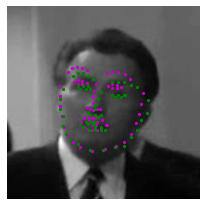

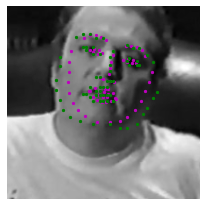

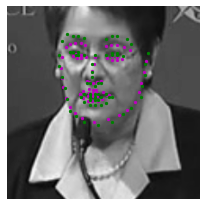

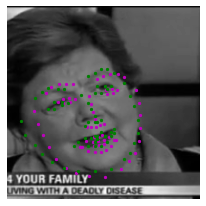

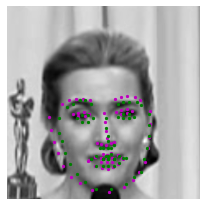

In [42]:
## TODO: visualize your test output
# you can use the same function as before, by un-commenting the line below:
test_images, test_outputs, gt_pts = net_sample_output()
visualize_output(test_images, test_outputs, gt_pts, 5)


Once you've found a good model (or two), save your model so you can load it and use it later!

Save your models but please **delete any checkpoints and saved models before you submit your project** otherwise your workspace may be too large to submit.

In [40]:
## TODO: change the name to something uniqe for each new model
model_dir = 'saved_models/'
model_name = 'keypoints_model_1.pt'

# after training, save your model parameters in the dir 'saved_models'
torch.save(net.state_dict(), model_dir + model_name)

After you've trained a well-performing model, answer the following questions so that we have some insight into your training and architecture selection process. Answering all questions is required to pass this project.

### Question 1: What optimization and loss functions did you choose and why?


**Answer**: The CNN's model, optimization method and loss funtion had choosen accordingly to a __[paper](https://arxiv.org/pdf/1710.00977.pdf)__. There were trials with different loss functions (for solving regression problems). In tests of the CNN the MSE presented better results compare to the L1/SmoothL1 loss.

### Question 2: What kind of network architecture did you start with and how did it change as you tried different architectures? Did you decide to add more convolutional layers or any layers to avoid overfitting the data?

**Answer**: The initial CNN's model has designed accordingly to the __[paper](https://arxiv.org/pdf/1710.00977.pdf)__. The outputs tensor has been modified to use 68 points instead of 15 points (as in the original model). During the training process there was observed that loss values oscilates at an relatively high level and testing results mostly were incorrect compare to the ground truth points. 

The initial model has been slightly modified, additional convolutional layers were added and convolutional layer features dimensions also had been modified. The modifications were did in preserving such asumptions:
1. feature map number increases along a convolutional level sequence;
1. kernel size decrease along a convolutional level sequence;
1. dropout probability of dropout levels increases along the network.

During the training of the CNN, there was observed (by using a convolutional level vizualization tehnique), that it not necessary to use more than 32 output channels within the first level.

The final architecture of the CNN is:
1. Net(
1.  (features): Sequential(
1.    __(0): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))__
1.    (1): ELU(alpha=1.0)
1.    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
1.    (3): Dropout2d(p=0.1, inplace=False)
1.    __(4): Conv2d(32, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))__
1.    (5): ELU(alpha=1.0)
1.    (6): MaxPool2d(kernel_size=2, stride=2, padding=1, dilation=1, ceil_mode=False)
1.    (7): Dropout2d(p=0.2, inplace=False)
1.    __(8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))__
1.    (9): ELU(alpha=1.0)
1.    (10): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
1.    (11): Dropout2d(p=0.3, inplace=False)
1.    __(12): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))__
1.    (13): ELU(alpha=1.0)
1.    (14): MaxPool2d(kernel_size=2, stride=2, padding=1, dilation=1, ceil_mode=False)
1.    (15): Dropout2d(p=0.4, inplace=False)
1.    __(16): Conv2d(64, 128, kernel_size=(2, 2), stride=(1, 1), padding=(2, 2))__
1.    (17): ELU(alpha=1.0)
1.    (18): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
1.    (19): Dropout2d(p=0.5, inplace=False)
1.    __(20): Conv2d(128, 256, kernel_size=(2, 2), stride=(1, 1), padding=(2, 2))__
1.    (21): ELU(alpha=1.0)
1.    (22): MaxPool2d(kernel_size=2, stride=2, padding=1, dilation=1, ceil_mode=False)
1.    (23): Dropout2d(p=0.5, inplace=False)
1.    __(24): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1), padding=(2, 2))__
1.    (25): ELU(alpha=1.0)
1.    (26): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
1.    (27): Dropout2d(p=0.5, inplace=False)
1.  (fully connected): Sequential(
1.    (0): Linear(in_features=6400, out_features=2500, bias=True)
1.    (1): ELU(alpha=1.0)
1.    (2): Dropout2d(p=0.6, inplace=False)
1.    (3): Linear(in_features=2500, out_features=2500, bias=True)
1.    (4): ELU(alpha=1.0)
1.    (5): Dropout2d(p=0.6, inplace=False)
1.    (6): Linear(in_features=2500, out_features=136, bias=True)

### Question 3: How did you decide on the number of epochs and batch_size to train your model?

**Answer**: the number of epochs initialy has used 5 to 10. If loss values continued to decrease then number of epochs would be increased. A batch size is mostly constrained by the GPU memory available (in case of using GPU). It always was 10 samples. However, the number of epochs would be siginificantly reduced if an appropriate weights initialization of convolutional levels  was performed. Also, the training rate impacts the number of epochs needed to train the network.

## Feature Visualization

Sometimes, neural networks are thought of as a black box, given some input, they learn to produce some output. CNN's are actually learning to recognize a variety of spatial patterns and you can visualize what each convolutional layer has been trained to recognize by looking at the weights that make up each convolutional kernel and applying those one at a time to a sample image. This technique is called feature visualization and it's useful for understanding the inner workings of a CNN.

In the cell below, you can see how to extract a single filter (by index) from your first convolutional layer. The filter should appear as a grayscale grid.

[[ 0.00454527 -0.004833   -0.01224856  0.00052953  0.01972163]
 [-0.03066093 -0.03460272 -0.03719658 -0.02491968 -0.01086619]
 [-0.04445818 -0.02694703 -0.02490208 -0.02147505 -0.02486683]
 [ 0.01844927  0.03300327  0.03671899  0.02670135  0.01244357]
 [ 0.03123949  0.04270508  0.03432877  0.02509101  0.00138867]]
(5, 5)


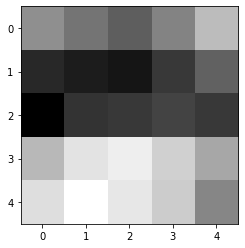

In [43]:
# Get the weights in the first conv layer, "conv1"
# if necessary, change this to reflect the name of your first conv layer
weights1 = filter = list(net.features._modules.items())[0][1].weight.data.to('cpu')

w = weights1.numpy()

filter_index = 0

print(w[filter_index][0])
print(w[filter_index][0].shape)

# display the filter weights
plt.imshow(w[filter_index][0], cmap='gray')


In [44]:
from torchvision import utils

# visualize the tensor
def visTensor(tensor, ch=0, allkernels=False, nrow=8, padding=1): 
    n,c,w,h = tensor.shape
    #print(tensor.shape)

    if allkernels: tensor = tensor.view(n*c, -1, w, h)
    elif c != 3: tensor = tensor[:,ch,:,:].unsqueeze(dim=1)

    rows = np.min((tensor.shape[0] // nrow + 1, 64))    
    grid = utils.make_grid(tensor, nrow=nrow, normalize=True, padding=padding)
    #print(grid.shape)
    plt.figure( figsize=(nrow*3,rows*3) )
    plt.imshow(grid.numpy().transpose((1, 2, 0)))

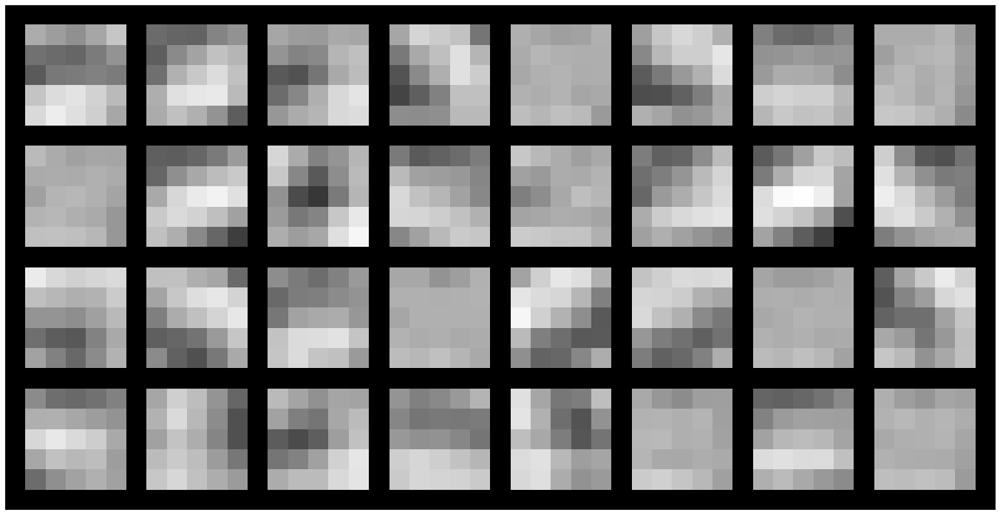

In [45]:
# select a tensor sequence ID
tensor_id = 0
filter = list(net.features._modules.items())[tensor_id][1].weight.data.to('cpu')
visTensor(filter, ch=0, allkernels=False)

plt.axis('off')
plt.ioff()
plt.show()

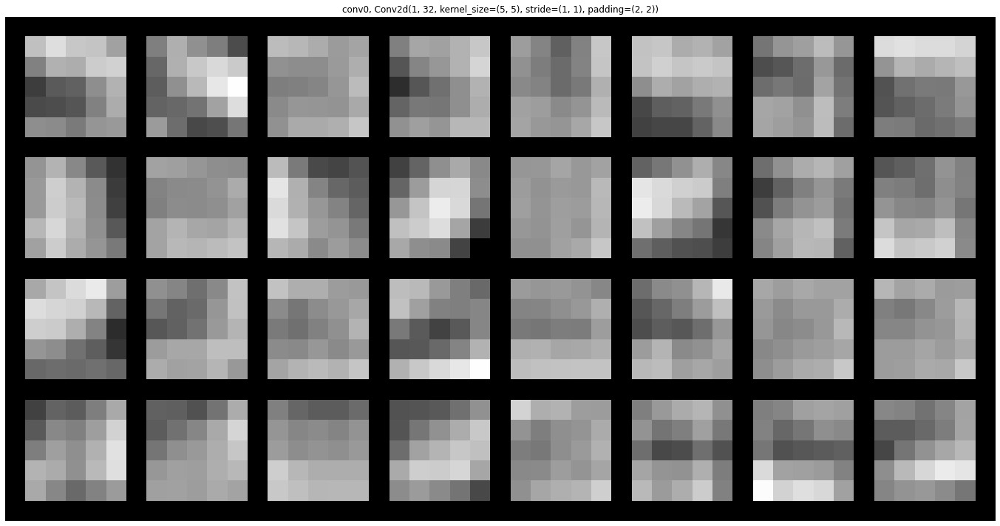

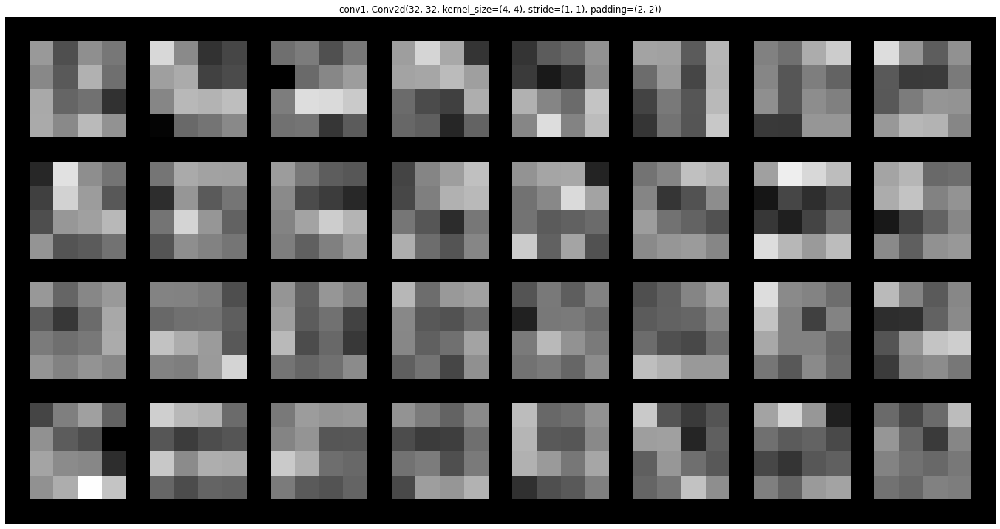

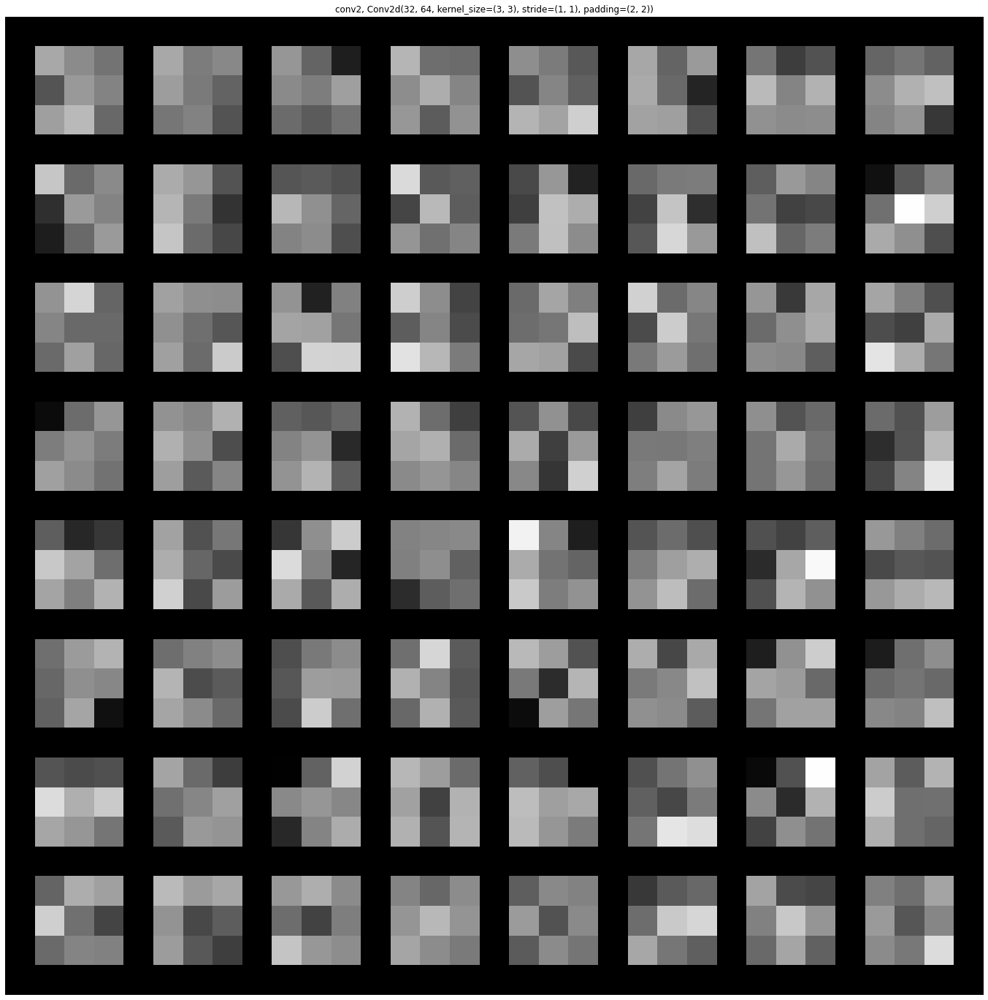

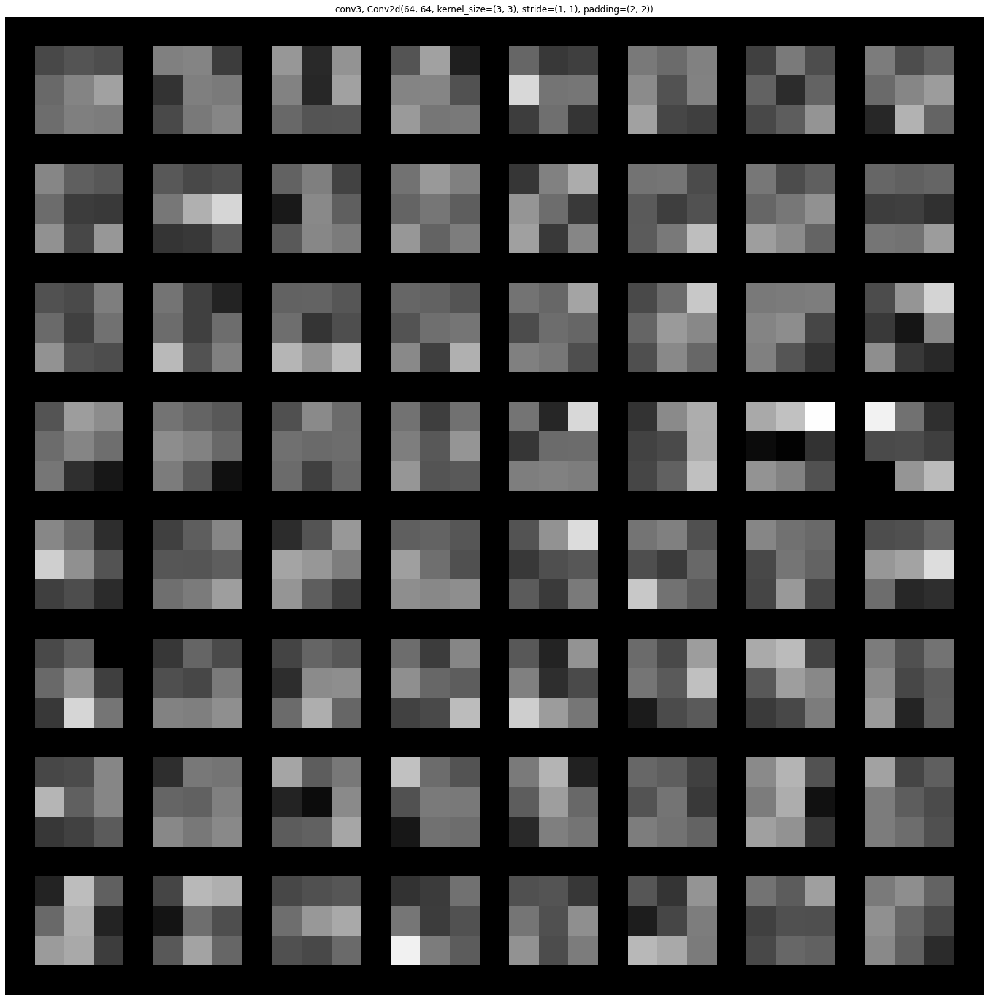

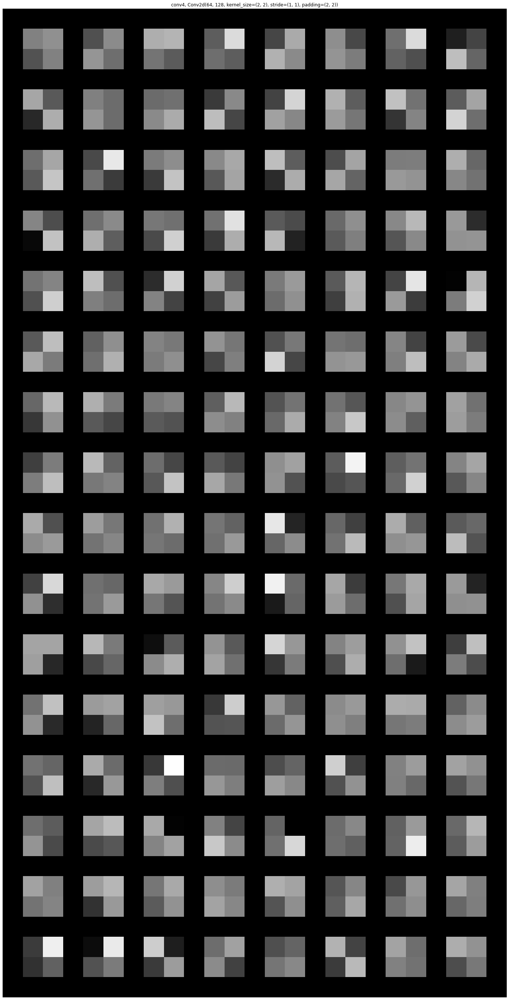

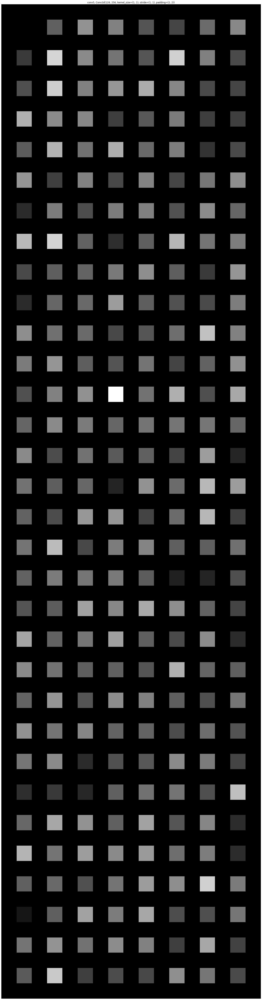

In [53]:
# visualize all conv layers

conv_ids = [0, 4, 8, 12, 16, 20]
for i, tensor_id in enumerate(conv_ids):
    filter = list(net.features._modules.items())[tensor_id][1].weight.data.to('cpu')
    visTensor(filter, ch=0, allkernels=False)

    plt.axis('off')
    plt.title('conv{}, {}'.format(i, list(net.features._modules.items())[tensor_id][1]))
    plt.ioff()
    plt.show()

## Feature maps

Each CNN has at least one convolutional layer that is composed of stacked filters (also known as convolutional kernels). As a CNN trains, it learns what weights to include in it's convolutional kernels and when these kernels are applied to some input image, they produce a set of **feature maps**. So, feature maps are just sets of filtered images; they are the images produced by applying a convolutional kernel to an input image. These maps show us the features that the different layers of the neural network learn to extract. For example, you might imagine a convolutional kernel that detects the vertical edges of a face or another one that detects the corners of eyes. You can see what kind of features each of these kernels detects by applying them to an image. One such example is shown below; from the way it brings out the lines in an the image, you might characterize this as an edge detection filter.

<img src='images/feature_map_ex.png' width=50% height=50%/>


Next, choose a test image and filter it with one of the convolutional kernels in your trained CNN; look at the filtered output to get an idea what that particular kernel detects.

### TODO: Filter an image to see the effect of a convolutional kernel
---

-> selected Layer features.0.weight is: torch.Size([32, 1, 5, 5])
features.0.bias
features.4.weight
features.4.bias
features.8.weight
features.8.bias
features.12.weight
features.12.bias
features.16.weight
features.16.bias
features.20.weight
features.20.bias
features.24.weight
features.24.bias
classifier.0.weight
classifier.0.bias
classifier.3.weight
classifier.3.bias
classifier.6.weight
classifier.6.bias


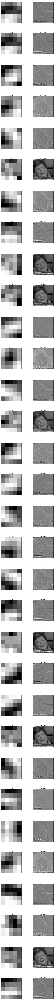

In [72]:
import cv2

# set layer index
index = 0 # <<<<< HERE
input_ch_id = 0

# set max filters to use
n_filters = 32

fig = plt.figure(figsize=(15,15))
plt.subplots_adjust(hspace=0.5, wspace=0, top=12.0)
cols = 2
rows = n_filters
im_idx = np.random.randint(test_images.size()[0])


for name, param in net.named_parameters():
    elems = name.split('.')
    if elems[0] == 'features' and int(elems[1]) == index and elems[2] == 'weight':
        print("-> selected Layer {} is:".format(name), param.size())
        n_filters = param.size()[0]
        
        filter_id = 0
        kernel = param[filter_id,input_ch_id].data.cpu().numpy()
        
        for i in range(cols * rows):
            ax = fig.add_subplot(rows, cols, i + 1, xticks=[], yticks=[], adjustable='box')
            # grab layer outputs
            if i % 2 == 0:
                ax.imshow(kernel, cmap='gray')
                ax.set_title('Filter %s' % str(filter_id + 1))
            else:
                img = cv2.filter2D(np.squeeze(test_images[im_idx].cpu().numpy()), -1, kernel)
                ax.imshow(img, cmap='gray')
                ax.set_title('Filter %s result' % str(filter_id + 1))
                kernel = param[filter_id,input_ch_id].data.cpu().numpy()
                filter_id += 1
                
    else:
        pass
        print(name)

Net(
  (features): Sequential(
    (0): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): ELU(alpha=1.0)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Dropout2d(p=0.1, inplace=False)
    (4): Conv2d(32, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (5): ELU(alpha=1.0)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=1, dilation=1, ceil_mode=False)
    (7): Dropout2d(p=0.2, inplace=False)
    (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
    (9): ELU(alpha=1.0)
    (10): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (11): Dropout2d(p=0.3, inplace=False)
    (12): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
    (13): ELU(alpha=1.0)
    (14): MaxPool2d(kernel_size=2, stride=2, padding=1, dilation=1, ceil_mode=False)
    (15): Dropout2d(p=0.4, inplace=False)
    (16): Conv2d(64, 128, kernel_size=(2, 2), stride=(1, 1), padding

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


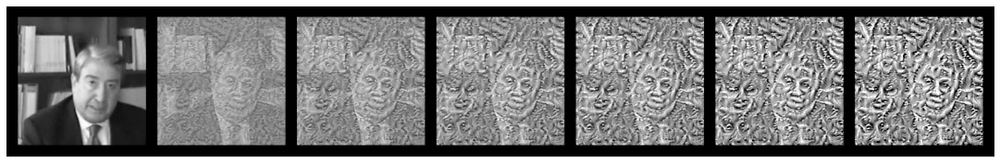

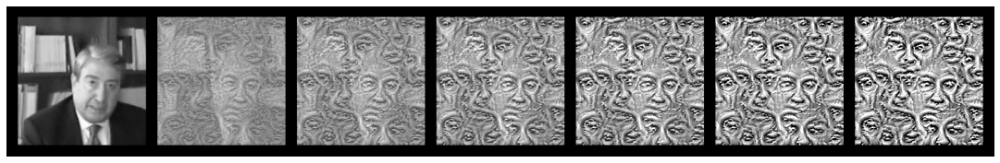

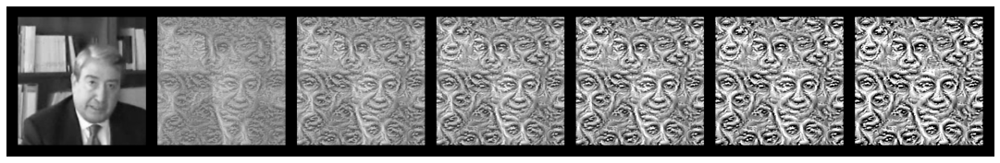

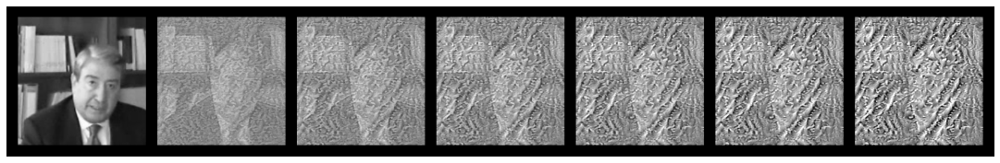

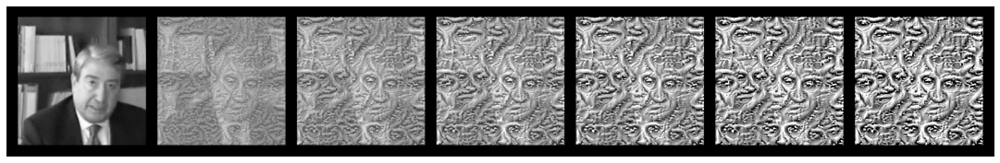

...

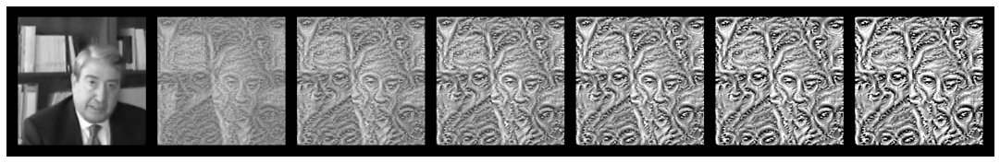

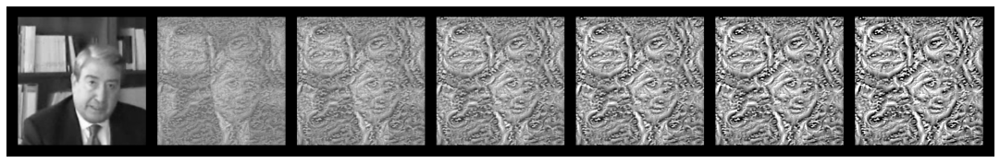

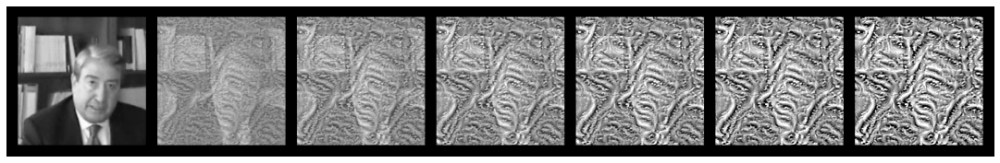

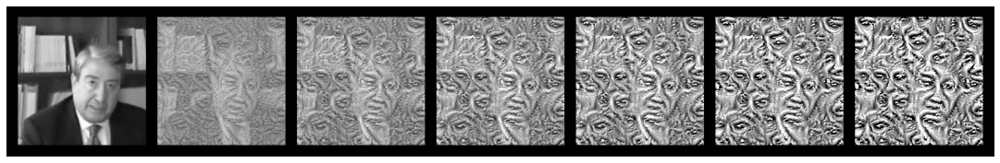

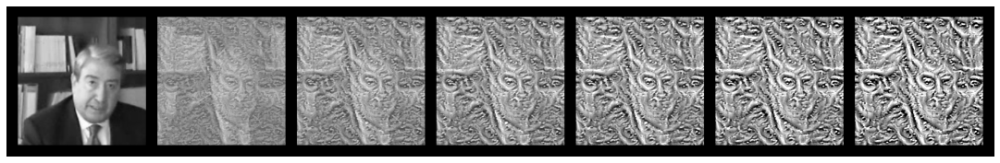

Grid tensor shape torch.Size([7, 1, 224, 224])


In [47]:
from models import Net
import torch
import torch.nn as nn
import torch.nn.functional as F
import sys
from PIL import Image

if "pytorch-cnn-visualizations/src" not in sys.path:
    sys.path.append("pytorch-cnn-visualizations/src")

net_eval = Net().to(device='cpu')
print(net_eval)

## load the model
model_dir = 'saved_models/'
model_name = 'keypoints_model_1.pt'

# after training, save your model parameters in the dir 'saved_models'
net_eval.load_state_dict(torch.load(model_dir+model_name))
net_eval.eval()

from cnn_layer_visualization import CNNLayerVisualization
cnn_layer = 23


image = test_images[np.random.randint(test_images.data.size()[0])].data   # get the image from it's Variable wrapper
#print(test_images[0][0] * 255)
image = image.numpy()  # convert to numpy array from a Tensor
print(image.shape)
#image = np.squeeze(image)
image = np.transpose(image, (1, 2, 0))   # transpose to go from torch to numpy image
#image = np.uint8(image)

for filter_pos in range(0,32):
    layer_vis = CNNLayerVisualization(net_eval, cnn_layer, filter_pos, image)

    # Layer visualization with pytorch hooks
    layer_vis.visualise_layer_with_hooks()
    
    visTensor(layer_vis.grid_tensor, ch=0, allkernels=True, padding=20)

    plt.axis('off')
    plt.ioff()
plt.show()
    
print("Grid tensor shape", layer_vis.grid_tensor.size())

In [48]:
from guided_backprop import GuidedBackprop
from misc_functions import (get_example_params,
                            convert_to_grayscale,
                            save_gradient_images,
                            get_positive_negative_saliency)

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [49]:
net_eval = Net().to(device='cpu')
print(net_eval)

net_eval.load_state_dict(torch.load(model_dir+model_name))
net_eval.eval()

# get image and keypoints
sample_id = np.random.randint(test_images.data.size()[0])
image = test_images[sample_id].data

image = image.type(torch.FloatTensor)
image= torch.unsqueeze(image, 0)
image.requires_grad = True

target = test_outputs[sample_id].data

target = target.type(torch.FloatTensor)
target = target.reshape(1,-1)

#target = target.to('cuda')

print("Image size:", image.size())
print("Target size:", target.size())
file_name_to_export = '{:03}'.format(sample_id)

# Guided backprop
GBP = GuidedBackprop(net_eval)
# Get gradients
guided_grads = GBP.generate_gradients(image, target)
# Save colored gradients
print("guided_grads: shape", guided_grads.shape)
save_gradient_images(guided_grads, file_name_to_export + '_Guided_BP_color')
# Convert to grayscale
grayscale_guided_grads = convert_to_grayscale(guided_grads)
# Save grayscale gradients
save_gradient_images(grayscale_guided_grads, file_name_to_export + '_Guided_BP_gray')
# Positive and negative saliency maps
pos_sal, neg_sal = get_positive_negative_saliency(guided_grads)
save_gradient_images(pos_sal, file_name_to_export + '_pos_sal')
save_gradient_images(neg_sal, file_name_to_export + '_neg_sal')
print('Guided backprop completed')

Net(
  (features): Sequential(
    (0): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): ELU(alpha=1.0)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Dropout2d(p=0.1, inplace=False)
    (4): Conv2d(32, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (5): ELU(alpha=1.0)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=1, dilation=1, ceil_mode=False)
    (7): Dropout2d(p=0.2, inplace=False)
    (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
    (9): ELU(alpha=1.0)
    (10): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (11): Dropout2d(p=0.3, inplace=False)
    (12): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
    (13): ELU(alpha=1.0)
    (14): MaxPool2d(kernel_size=2, stride=2, padding=1, dilation=1, ceil_mode=False)
    (15): Dropout2d(p=0.4, inplace=False)
    (16): Conv2d(64, 128, kernel_size=(2, 2), stride=(1, 1), padding

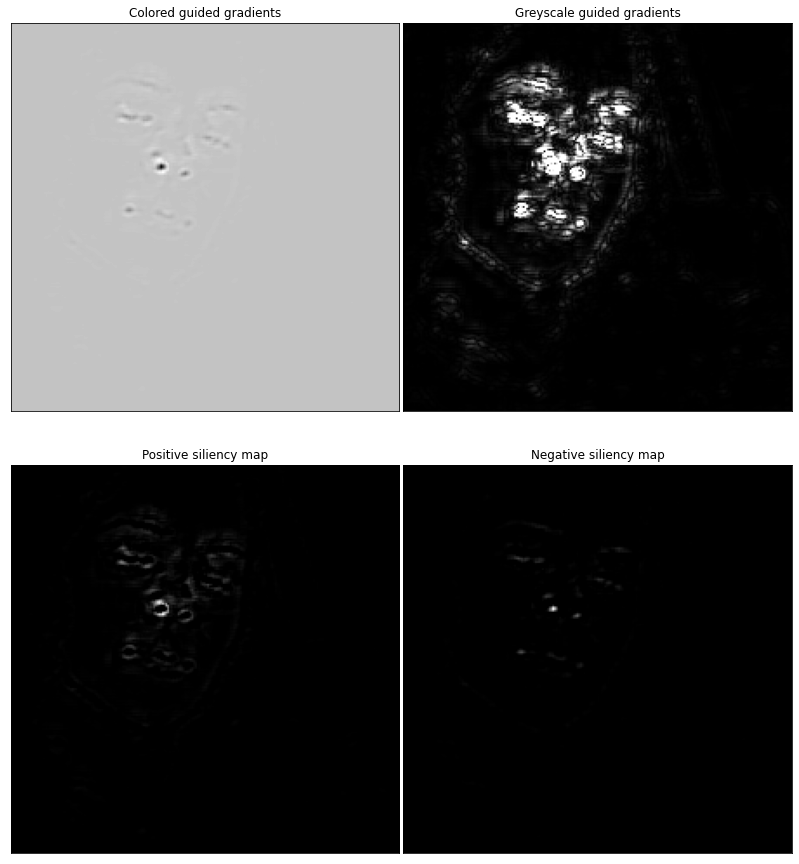

In [71]:
# Vizualize results
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(14,14))
plt.subplots_adjust(hspace=0.005, wspace=0.01, top=1)
cols = 2
rows = 2

images_list = [guided_grads, grayscale_guided_grads, pos_sal, neg_sal]
titles = ['Colored guided gradients', 'Greyscale guided gradients', 'Positive siliency map', 'Negative siliency map']

for i in range(cols * rows):
    ax = fig.add_subplot(rows, cols, i + 1, xticks=[], yticks=[], adjustable='box')
    # grab layer outputs
    ax.imshow(np.squeeze(images_list[i]), cmap='gray')
    ax.set_title(titles[i])

### Question 4: Choose one filter from your trained CNN and apply it to a test image; what purpose do you think it plays? What kind of feature do you think it detects?


**Answer**: (does it detect vertical lines or does it blur out noise, etc.) write your answer here

-> selected Layer features.0.weight is: torch.Size([32, 1, 5, 5])
features.0.bias
features.4.weight
features.4.bias
features.8.weight
features.8.bias
features.12.weight
features.12.bias
features.16.weight
features.16.bias
features.20.weight
features.20.bias
features.24.weight
features.24.bias
classifier.0.weight
classifier.0.bias
classifier.3.weight
classifier.3.bias
classifier.6.weight
classifier.6.bias


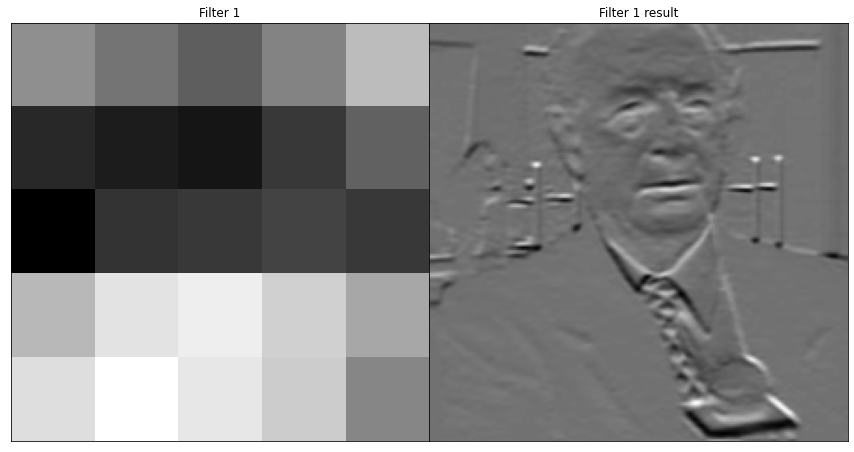

In [74]:
import cv2

# set layer index
index = 0 # <<<<< HERE
input_ch_id = 0

# set max filters to use
n_filters = 1

fig = plt.figure(figsize=(15,15))
plt.subplots_adjust(hspace=0.5, wspace=0, top=12.0)
cols = 2
rows = n_filters
im_idx = np.random.randint(test_images.size()[0])


for name, param in net.named_parameters():
    elems = name.split('.')
    if elems[0] == 'features' and int(elems[1]) == index and elems[2] == 'weight':
        print("-> selected Layer {} is:".format(name), param.size())
        n_filters = param.size()[0]
        
        filter_id = 0
        kernel = param[filter_id,input_ch_id].data.cpu().numpy()
        
        for i in range(cols * rows):
            ax = fig.add_subplot(rows, cols, i + 1, xticks=[], yticks=[], adjustable='box')
            # grab layer outputs
            if i % 2 == 0:
                ax.imshow(kernel, cmap='gray')
                ax.set_title('Filter %s' % str(filter_id + 1))
            else:
                img = cv2.filter2D(np.squeeze(test_images[im_idx].cpu().numpy()), -1, kernel)
                ax.imshow(img, cmap='gray')
                ax.set_title('Filter %s result' % str(filter_id + 1))
                kernel = param[filter_id,input_ch_id].data.cpu().numpy()
                filter_id += 1
                
    else:
        pass
        print(name)

The above filter (conv0, filter_id = 0) detects horizontal lines.

---
## Moving on!

Now that you've defined and trained your model (and saved the best model), you are ready to move on to the last notebook, which combines a face detector with your saved model to create a facial keypoint detection system that can predict the keypoints on *any* face in an image!